# Assignment 2 - Deep Learning



Notes: 

- Result may vary slightly at each run.
- if you wish to run the models trainings, please set the corresponding values to True at the desired model cell.
- Please **DO NOT restart and run all cells** unless the notebook file is taken from the full submission zip sent through Google Drive to Mr. Singh. or otherwise please set all training values to True and all models will be re-reained.
- Full submission link can be accessed from https://drive.google.com/file/d/11o_hu-YA8aUASMLTEQ0eJ7IyU2ABBlrp/view?usp=sharing
  

#### This Notebook contains codes for Task 3, Task 4 and Task 5

In [1]:
!pip install keras_tuner
!pip install visualkeras
!pip install PIL


[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: Could not find a version that satisfies the requirement PIL (from versions: none)
ERROR: No matching distribution found for PIL

[notice] A new release of pip is available: 23.0 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# setting random seeds to get reproducable results 

import numpy as np
np.random.seed(111)
import tensorflow as tf
tf.random.set_seed(111)
import random
random.seed(111)
tf.keras.utils.set_random_seed(111)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from keras.utils import plot_model, to_categorical
from keras.optimizers import Adam
from tensorflow import keras
from keras import backend
import datetime

from copy import deepcopy
import time
import os
import plotly.graph_objects as go
from timeit import default_timer as timer
import timeit
import seaborn as sns
import sklearn.metrics
import keras_tuner
import visualkeras
import sklearn.metrics
from keras import callbacks
import pickle
from sklearn.metrics import accuracy_score, classification_report
from PIL import ImageFont

from keras_tuner import RandomSearch
from kerastuner.engine import hyperparameters
import warnings

# Load the TensorBoard notebook extension
%load_ext tensorboard

blue = '\033[34m'
red = '\033[31m'
green = '\033[92m'
end_color = '\033[m'
bblack='\033[1;30m'
bblue='\033[1;34m'
BCyan='\033[1;36m'

C:\Users\Mohd\AppData\Local\Temp\ipykernel_40208\1275812878.py:37: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.engine import hyperparameters


# Task 3 - Multi-Layer Perceptron

## 3.1

We created an MLP based on the configurations given in the assignment

`No of Layers = 2 + 1 output layer`

`No of Neurons in each layer = [1000, 1000, 10]`

`Activation Function in hidden layers = relu`

`Activation Function in output layer = softmax`

`Loss Function = Cross Entropy`

In [3]:
# we define 2 data loading and preparation functions one for for MLP and one for CNN to ensure 
# we have the correct data shape during trials without having to search for the data load cell 
# everytime we decide to change something
# this one is for MLP

def load_data_MLP():
   
    mnist = tf.keras.datasets.mnist
    (x_train, y_train), (x_test, y_test) = mnist.load_data()

    n_train = x_train.shape[0]
    n_test =x_test.shape[0]

    # Normalization
    x_train, x_test = x_train/127.5 - 1, x_test/127.5 - 1


    # resizing dataset 
    nb_features = np.prod(x_train.shape[1:])
    x_train.resize((n_train, nb_features))
    x_test.resize((n_test, nb_features))

    # One Hot Encoding

    y_train = np.eye(10)[y_train]
    y_test = np.eye(10)[y_test]
    
    return x_train, y_train, x_test, y_test

x_train, y_train, x_test, y_test = load_data_MLP()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1000)              785000    
                                                                 
 dense_1 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_2 (Dense)             (None, 10)                10010     
                                                                 
Total params: 1,796,010
Trainable params: 1,796,010
Non-trainable params: 0
_________________________________________________________________


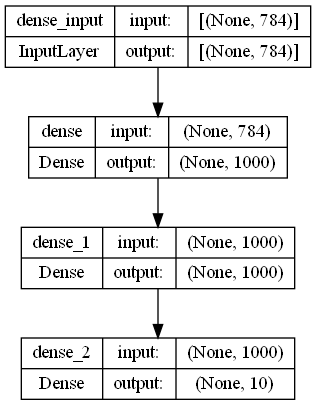

In [4]:
#build MLP baseline model based on the configuration given in the assignment

MLP_model = Sequential()
MLP_model.add(Dense(1000, input_dim=784, activation = 'relu'))
MLP_model.add(Dense(1000,activation='relu'))
MLP_model.add(Dense(10,activation='softmax'))
MLP_model.summary()
plot_model(MLP_model, show_shapes=True) # visualize the MLP artitecture

In [5]:
#build a timing callback to time the total time it takes to train each epoch 
log_dir = os.getcwd() + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
 
class TimingCallback(keras.callbacks.Callback):
    def __init__(self, logs={}):
        self.logs=[]
    def on_epoch_begin(self, epoch, logs={}):
        self.starttime = timer()
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(timer()-self.starttime)

In [6]:
# Compile the model     

opt = Adam(learning_rate=0.001)
cb = TimingCallback()

MLP_model.compile(loss='categorical_crossentropy', optimizer= opt,metrics=['accuracy'])


In [7]:
# train the modle, 
# please set train_3_1 = False to train_3_1 = True to run the training

train_3_1 = False

if train_3_1:
    history_3_1 = MLP_model.fit(x_train,y_train, epochs=10, batch_size=50, validation_split=0.1,
              callbacks=[tensorboard_callback, cb])
    print('Total training time for baseline model is: %.1f sec' % (sum(cb.logs)))
    
    # Saving the model history
    with open('models_saved/MLP_3_1_history.pkl', 'wb') as f:
        pickle.dump(history_3_1, f)
    
  
    

It took 116.2 seconds running it on CPU (Numbers may slightly vary at each run) , on Google premium GPU it took 35.3 seconds

In [8]:
# Loading the saved model history without having to retrain it

with open('models_saved/MLP_3_1_history.pkl', 'rb') as f:
    history_3_1 = pickle.load(f)
    
MLP_model = history_3_1.model

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-23 15:51:42         2099
metadata.json                                  2023-02-23 15:51:42           64
variables.h5                                   2023-02-23 15:51:42      7201064
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars


313/313 [==============================] - 1s 3ms/step

Accuracy on the test set: 97.69

1875/1875 [==============================] - 6s 3ms/step

Accuracy on the training set: 98.87%



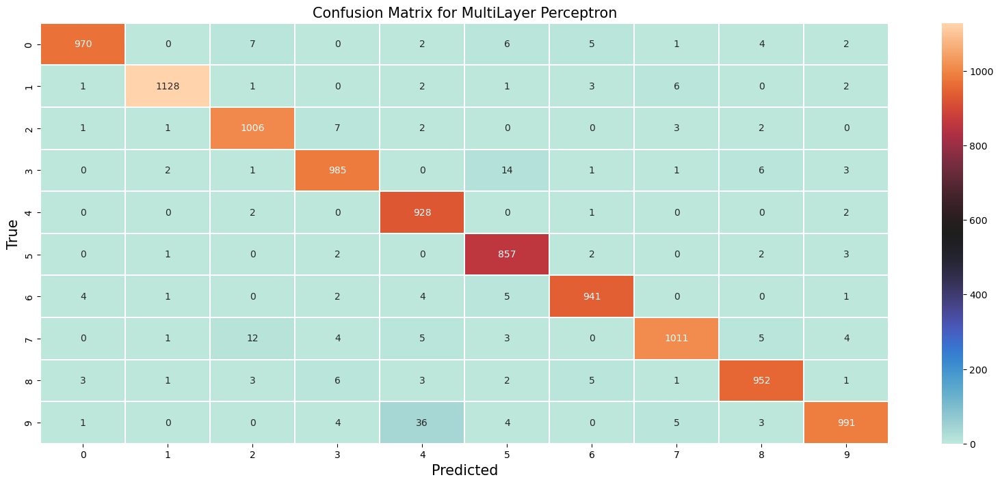

In [9]:
#test model on unseen test data and get the accuracy

pred_test = MLP_model.predict(x_test)
accuracy_MLP_test = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
print(bblue+'\nAccuracy on the test set: %.2f\n' % (accuracy_MLP_test*100)+end_color)

pred_train = MLP_model.predict(x_train)
accuracy_MLP_train = accuracy_score(y_train.argmax(axis=1), pred_train.argmax(axis=1))
print(bblue+'\nAccuracy on the training set: %.2f' % (accuracy_MLP_train*100)+'%\n'+end_color)


results_final = [] # will be used to compare models later in next tasks from the tuner code
results_final.append((2, MLP_model.count_params(), accuracy_MLP_test, {f'units_{i}': layer.output for i, layer in enumerate(MLP_model.layers)}))

#preds = MLP_model.predict(x_test, verbose = 0)
plt.figure(figsize=(20, 8))
ax = sns.heatmap(sklearn.metrics.confusion_matrix(np.argmax(pred_test, axis=1), np.argmax(y_test, axis=1) ), cmap='icefire', fmt="", annot=True, linewidths=0.1)
ax.set_xlabel("Predicted", fontsize=15)
ax.set_ylabel("True", fontsize=15)
plt.title('Confusion Matrix for MultiLayer Perceptron', fontsize=15);

In [10]:
# Classification Report

print(classification_report(np.argmax(pred_test, axis=1), np.argmax(y_test, axis=1)))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       997
           1       0.99      0.99      0.99      1144
           2       0.97      0.98      0.98      1022
           3       0.98      0.97      0.97      1013
           4       0.95      0.99      0.97       933
           5       0.96      0.99      0.97       867
           6       0.98      0.98      0.98       958
           7       0.98      0.97      0.98      1045
           8       0.98      0.97      0.98       977
           9       0.98      0.95      0.97      1044

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



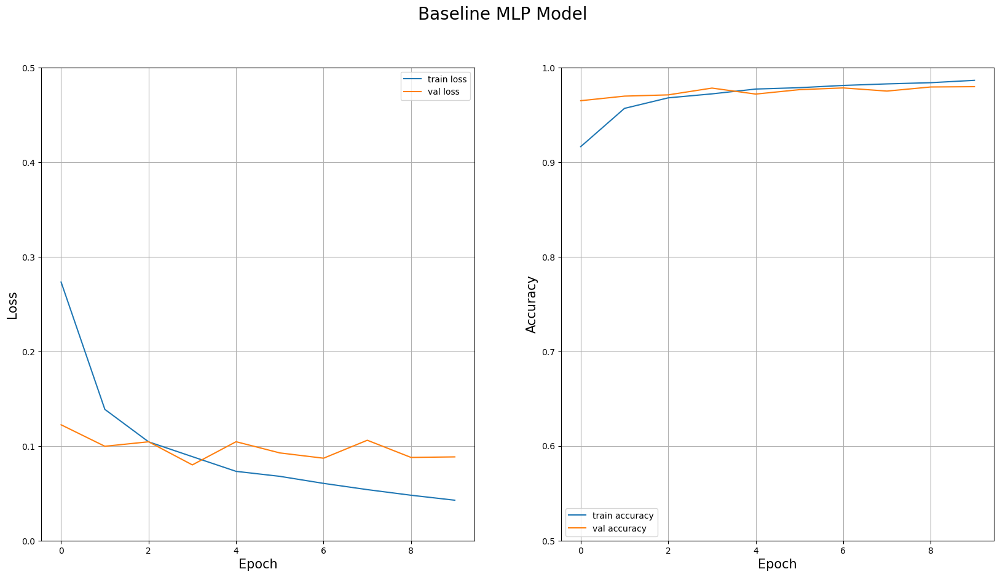

In [11]:
def plot_learing_curve(history, title):
    # plot the learning curves
    fig = plt.figure(figsize=(20,10))
    fig.add_subplot(1,2,1)
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='val loss')
    plt.legend()
    plt.grid(True)
    plt.ylim([0,0.5])
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    
    
    fig.add_subplot(1,2,2)
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='val accuracy')
    plt.legend()
    plt.grid(True)
    plt.ylim([.5,1.0])
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.suptitle(title, fontsize=20)
plot_learing_curve(history_3_1, 'Baseline MLP Model')

## 3.2

We start by creating 8 additional MLP models with different depths and widths. We have used **`keras tuner`** to do a grid search on large space of configurations for extra 8 models with number of conv layers `[2, 3, 4, 5]` and picked the top and bottom performing model out of 5 different configurations for each number of hidden layers, then retrained them using the same number of `epochs = 10` similar to the baseline model

In [12]:
# Running the tuner will take long time, we have saved the resulted tuners and models and submitted with the assignmnet

# to run the tuner, please set run_MLP_tuner = True
run_MLP_tuner = False

if run_MLP_tuner:

    def warn(*args, **kwargs):
        pass
    warnings.warn = warn

    worst_models = []
    tuners_results = {}


    for n_hidden_layer in [2,3,4,5]: # various number of hidden layers
        def build_model(hp):
            model = Sequential()
            global n_hidden_layer
            for i in range(1,n_hidden_layer+1):
                model.add(Dense(
                # search for ideal width of the hidden layer.
                units=hp.Int(f"units_{i}", min_value=32, max_value=2048, step=32), input_dim=784,
                activation="relu"))
            model.add(Dense(10, activation="softmax"))
            opt = Adam(learning_rate=0.001)
            model.compile(
              optimizer= opt, loss="categorical_crossentropy", metrics=["accuracy"], )
            return model

        tuner = keras_tuner.BayesianOptimization(
            hypermodel=build_model,
            objective="val_accuracy",
            max_trials=5,
            executions_per_trial=1,
            overwrite=True,
            seed = 4,
            directory= os.getcwd(),
            project_name=f"3_2_tuner_{n_hidden_layer}_hidden_layer")

        cb = TimingCallback()

        tuner.search(x_train, y_train, epochs=5, validation_split=0.1,
                   callbacks=[callbacks.TensorBoard(os.getcwd()), cb],)
        tuners_results[n_hidden_layer] = tuner

        _, accuracy = tuner.get_best_models(num_models=1)[0].evaluate(x_test, y_test) # best model

        _, accuracy_worst = tuner.get_best_models(num_models=100)[-1].evaluate(x_test, y_test) # worst model

        print(f"worst Accuracy is {accuracy_worst}")
        worst_models.append((n_hidden_layer, tuner.get_best_models(100)[-1].count_params(), 
                              accuracy_worst, tuner.get_best_hyperparameters(100)[-1].values, cb))

        results_final.append((n_hidden_layer, tuner.get_best_models()[0].count_params(), 
                              accuracy, tuner.get_best_hyperparameters()[0].values, cb)) 


    

In [13]:
# we load and re-build the best models from each conv layer configuration and compile them.

with open('MLP_Tuner_Results/MLP_best_models.pkl', 'rb') as f:
    MLP_best_models = pickle.load(f)
    
best_models = {}
for i, m in enumerate(MLP_best_models):
    
    best_models[m[0]] = Sequential()
    
    for n_layers in range(1,m[0]+1):
        units = m[3][f'units_{n_layers}']
       
        best_models[m[0]].add(Dense(units, activation='relu', input_dim=784))

    best_models[m[0]].add(Dense(10, activation='softmax'))

    print(bblack+f'Model with {m[0]} hidden layers\n'+end_color)
    best_models[m[0]].summary()
    # compile the model

    best_models[m[0]].compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])
    print()
    
   

Model with 2 hidden layers

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 992)               778720    
                                                                 
 dense_4 (Dense)             (None, 544)               540192    
                                                                 
 dense_5 (Dense)             (None, 10)                5450      
                                                                 
Total params: 1,324,362
Trainable params: 1,324,362
Non-trainable params: 0
_________________________________________________________________

Model with 3 hidden layers

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 768)               602880    
                               

In [14]:
# we now train these models on 10 epochs, tuner used just 5 epochs to save time
# please set MLP_train_models to True to run the training (Takes time)

MLP_b_times=[]
MLP_b_histories = []

MLP_train_models = False

if MLP_train_models:
    epochs = 10
    batch_size = 50

    for k, v in best_models.items():
        print(bblack+f"Training Model with {k} Hidden Layers"+end_color)
        t1 = time.time()
        history = v.fit(x_train, y_train, 
                  batch_size=batch_size, 
                  epochs=epochs, 
                  validation_split=0.1)

        MLP_b_histories.append(history)
        t2 = time.time()
        MLP_b_times.append(t2-t1)
        print()
        
    # Saving the models history
    with open('models_saved/MLP_b_histories_3_2.pkl', 'wb') as f:
        pickle.dump([MLP_b_histories, MLP_b_times], f)


In [15]:

# Loading the saved model history without having to retrain it

with open('models_saved/MLP_b_histories_3_2.pkl', 'rb') as f:
    MLP_b_histories, MLP_b_times = pickle.load(f)
    

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-22 21:36:42         2131
metadata.json                                  2023-02-22 21:36:42           64
variables.h5                                   2023-02-22 21:36:42      5314472
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars
Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-22 21:36:42         2591
metadata.json                                  2023-02-22 21:36:42           64
variables.h5                                

In [16]:
# testing on test data
acc = []
for h in  MLP_b_histories:

    pred_test = h.model.predict(x_test)
    a = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
    acc.append(a)
    

313/313 [==============================] - 2s 5ms/step


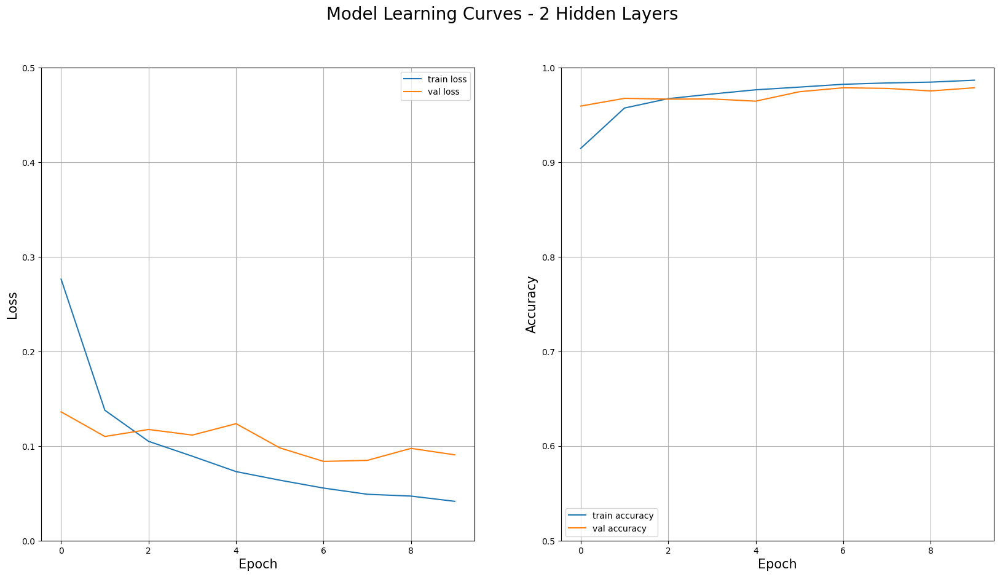

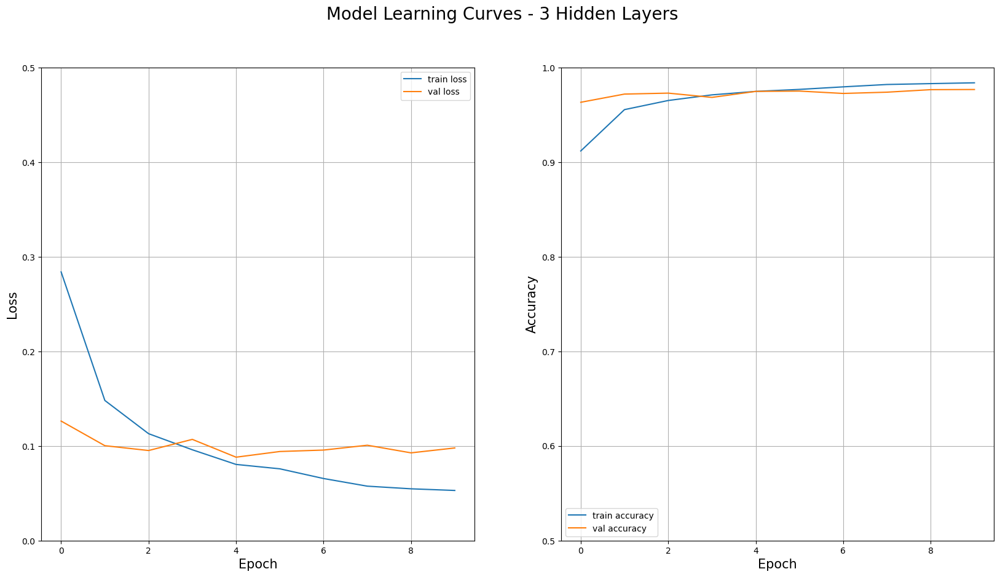

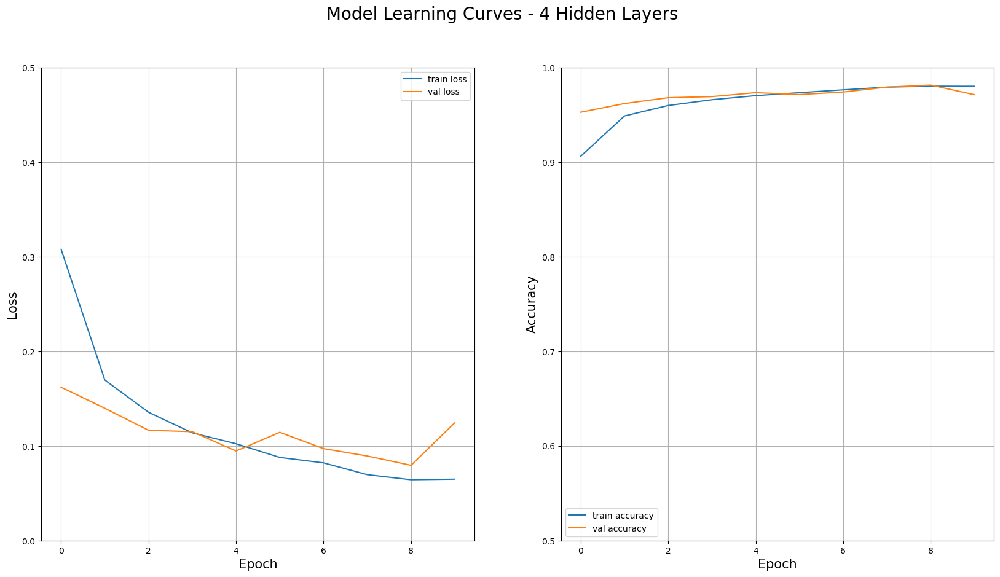

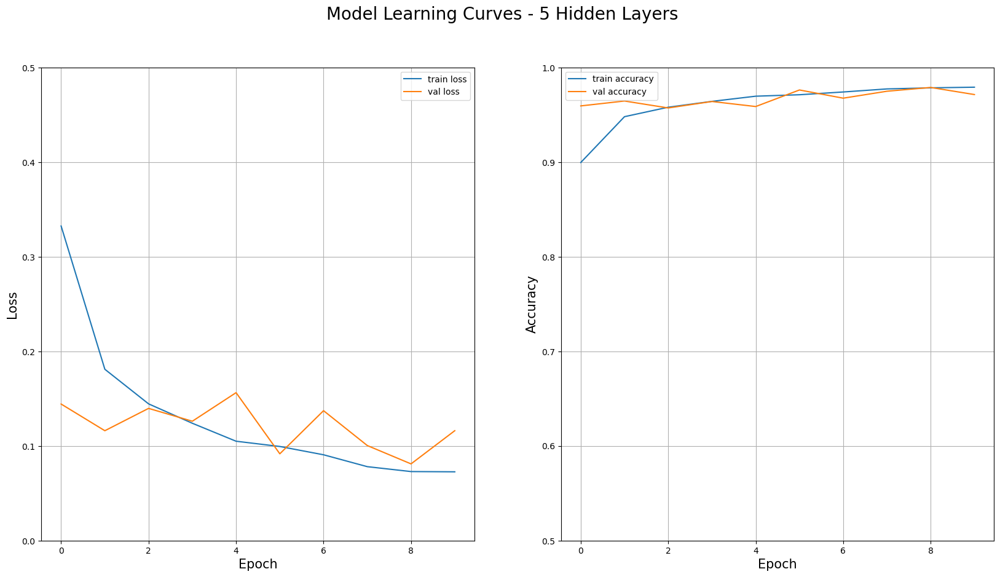

In [17]:
# plotting learning curves

for i, h in enumerate(MLP_b_histories):
    plot_learing_curve(h, f"Model Learning Curves - {i+2} Hidden Layers")
    

In [18]:
#loading the times for Google GPU training
with open('MLP_Tuner_Results/MLP_best_times.pkl', 'rb') as f:
    MLP_best_times = pickle.load(f)
    
# below are the best models configurations for the 8 models along with their performances
    
print(bblack+"Below are the best MLP models archetecture found from the tuner search:\n\n"+end_color)

for i,m in enumerate(MLP_best_models):
    
    print(bblue+f'Model with {m[0]} Hidden Layers:\n'+end_color)
    print(bblack+f'Number of Parameters: {best_models[m[0]].count_params()}') 
    print(f'Model Accuracy on test data: {round(acc[i],4)*100} %')
    print(f'Number of Neuron per each layer:\n{m[3]}')
    print(f'Time it took to train for 10 epochs on Google Premium GPU: {round(MLP_best_times[i],2)} seconds')
    print(f'Time it took to train for 10 epochs on Local CPU: {round(MLP_b_times[i],2)} seconds\n\n')

Below are the best MLP models archetecture found from the tuner search:


Model with 2 Hidden Layers:

Number of Parameters: 1324362
Model Accuracy on test data: 97.26 %
Number of Neuron per each layer:
{'units_1': 992, 'units_2': 544}
Time it took to train for 10 epochs on Google Premium GPU: 35.55 seconds
Time it took to train for 10 epochs on Local CPU: 87.09 seconds


Model with 3 Hidden Layers:

Number of Parameters: 1861578
Model Accuracy on test data: 97.15 %
Number of Neuron per each layer:
{'units_1': 768, 'units_2': 1088, 'units_3': 384}
Time it took to train for 10 epochs on Google Premium GPU: 33.51 seconds
Time it took to train for 10 epochs on Local CPU: 125.84 seconds


Model with 4 Hidden Layers:

Number of Parameters: 4253258
Model Accuracy on test data: 97.07000000000001 %
Number of Neuron per each layer:
{'units_1': 512, 'units_2': 1280, 'units_3': 1632, 'units_4': 672}
Time it took to train for 10 epochs on Google Premium GPU: 35.29 seconds
Time it took to train for

In [19]:
# now we do the same for the lowest performing models found
# we load and re-build the worst models from each conv layer configuration and compile them.

with open('MLP_Tuner_Results/MLP_worst_models.pkl', 'rb') as f:
    MLP_worst_models = pickle.load(f)
    
    
worst_models = {}
for i, m in enumerate(MLP_worst_models):
    
    worst_models[m[0]] = Sequential()
    
    for n_layers in range(1,m[0]+1):
        units = m[3][f'units_{n_layers}']
       
        worst_models[m[0]].add(Dense(units, activation='relu', input_dim=784))

    worst_models[m[0]].add(Dense(10, activation='softmax'))

    print(bblack+f'Model with {m[0]} hidden layers\n'+end_color)
    worst_models[m[0]].summary()
    # compile the model

    worst_models[m[0]].compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])
    print()
    
   

Model with 2 hidden layers

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 480)               376800    
                                                                 
 dense_22 (Dense)            (None, 960)               461760    
                                                                 
 dense_23 (Dense)            (None, 10)                9610      
                                                                 
Total params: 848,170
Trainable params: 848,170
Non-trainable params: 0
_________________________________________________________________

Model with 3 hidden layers

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 512)               401920    
                                   

In [20]:
# we now train these models on 10 epochs, tuner used just 5 epochs to save time
# please set MLP_train_models to True to run the training (Takes time)

MLP_w_times=[]
MLP_w_histories = []

MLP_train_models = False

if MLP_train_models:
    epochs = 10
    batch_size = 50

    for k, v in worst_models.items():
        print(bblack+f"Training Model with {k} Hidden Layers\n"+end_color)
        t1 = time.time()
        history = v.fit(x_train, y_train, 
                  batch_size=batch_size, 
                  epochs=epochs, 
                  validation_split=0.1)

        MLP_w_histories.append(history)
        t2 = time.time()
        MLP_w_times.append(t2-t1)
        
        print()
        
    # Saving the models history
    with open('models_saved/MLP_w_histories_3_2.pkl', 'wb') as f:
        pickle.dump([MLP_w_histories, MLP_w_times], f)
        

In [21]:
# load the models history
with open('models_saved/MLP_w_histories_3_2.pkl', 'rb') as f:
    MLP_w_histories, MLP_w_times = pickle.load(f) 

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-22 21:50:06         2135
metadata.json                                  2023-02-22 21:50:06           64
variables.h5                                   2023-02-22 21:50:06      3407784
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars
Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-22 21:50:06         2597
metadata.json                                  2023-02-22 21:50:06           64
variables.h5                                

In [22]:
# testing on test data
acc = []
for h in  MLP_w_histories:

    pred_test = h.model.predict(x_test)
    a = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
    acc.append(round(a,4))
 

313/313 [==============================] - 2s 6ms/step


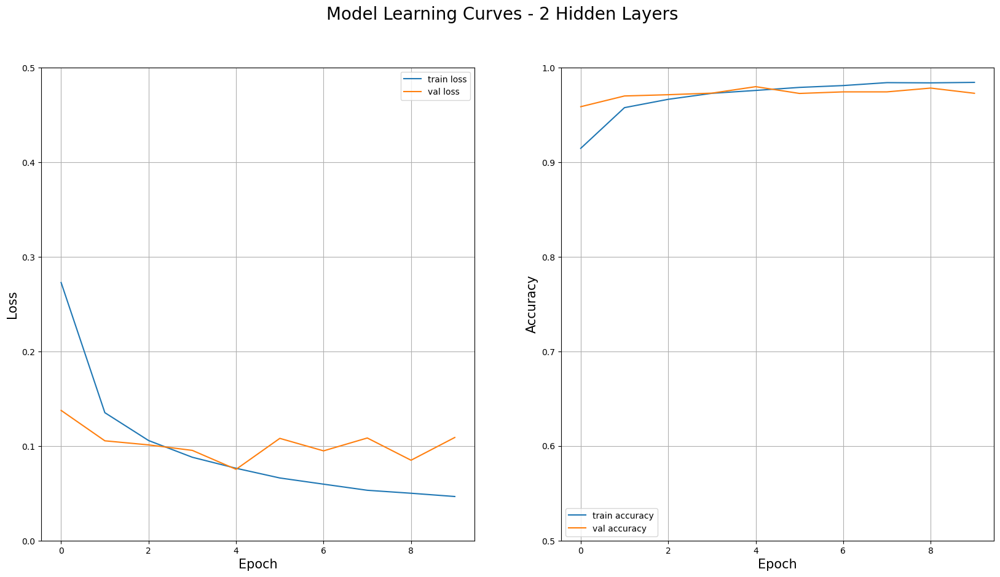

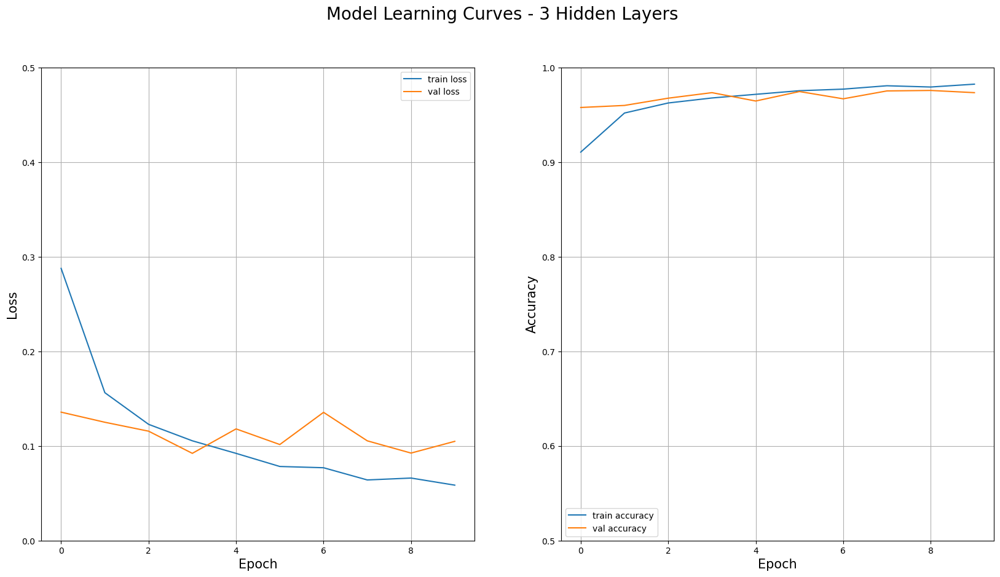

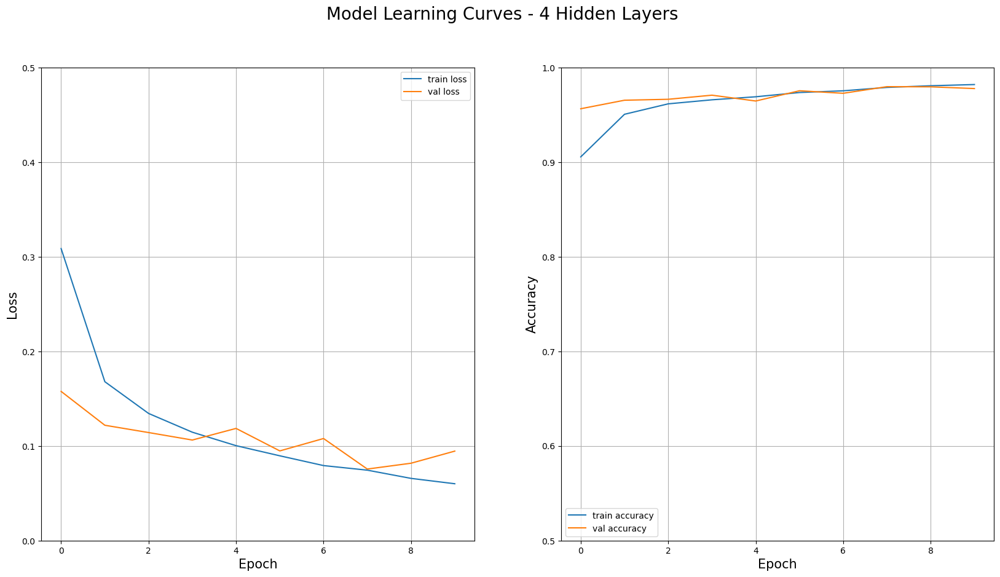

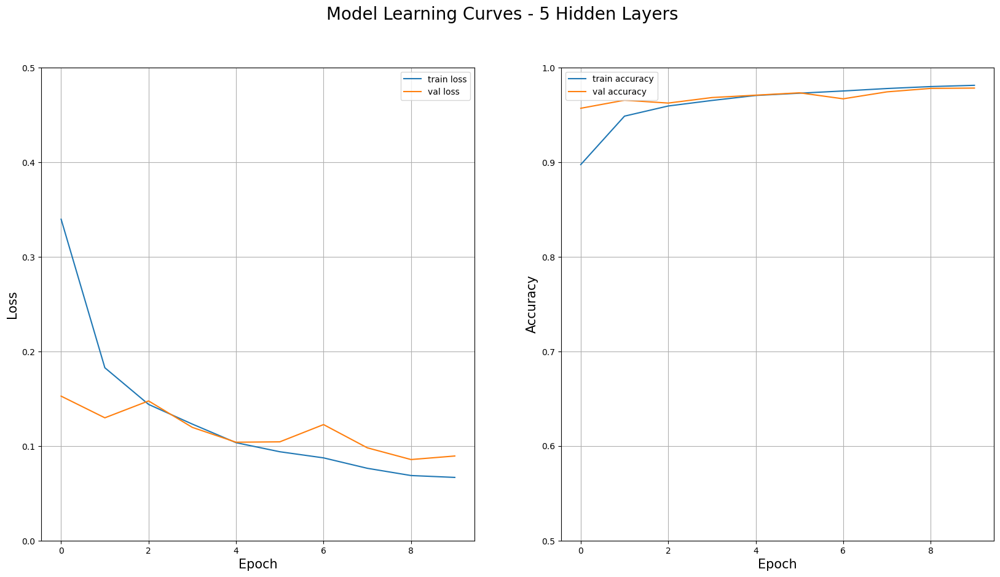

In [23]:
# plotting learning curves

for i, h in enumerate(MLP_w_histories):
    plot_learing_curve(h, f"Model Learning Curves - {i+2} Hidden Layers")

In [24]:
#loading the results for GPU training
with open('MLP_Tuner_Results/MLP_worst_times.pkl', 'rb') as f:
    MLP_worst_times = pickle.load(f)
    
# below are the best models configurations for the 8 models along with their performances
print(bblack+"Below are the worst MLP models archetecture found from the tuner search:\n\n"+end_color)

for i,m in enumerate(MLP_worst_models):
    
    print(bblue+f'Model with {m[0]} Hidden Layers:\n'+end_color)
    print(bblack+f'Number of Parameters: {worst_models[m[0]].count_params()}') 
    print(f'Model Accuracy on test data: {acc[i]*100} %')
    print(f'Number of Neurons per each layer:\n{m[3]}')
    print(f'Time it took to train for 10 epochs on Google Premium GPU: {round(MLP_worst_times[i],2)} seconds')
    print(f'Time it took to train for 10 epochs on local CPU: {round(MLP_w_times[i],2)} seconds\n\n')

Below are the worst MLP models archetecture found from the tuner search:


Model with 2 Hidden Layers:

Number of Parameters: 848170
Model Accuracy on test data: 97.27 %
Number of Neurons per each layer:
{'units_1': 480, 'units_2': 960}
Time it took to train for 10 epochs on Google Premium GPU: 31.39 seconds
Time it took to train for 10 epochs on local CPU: 64.24 seconds


Model with 3 Hidden Layers:

Number of Parameters: 3165482
Model Accuracy on test data: 96.94 %
Number of Neurons per each layer:
{'units_1': 512, 'units_2': 1280, 'units_3': 1632}
Time it took to train for 10 epochs on Google Premium GPU: 33.64 seconds
Time it took to train for 10 epochs on local CPU: 225.66 seconds


Model with 4 Hidden Layers:

Number of Parameters: 3085354
Model Accuracy on test data: 96.93 %
Number of Neurons per each layer:
{'units_1': 480, 'units_2': 960, 'units_3': 1184, 'units_4': 928}
Time it took to train for 10 epochs on Google Premium GPU: 34.76 seconds
Time it took to train for 10 epoch

# Task 4 - CNN

## 4.1

We created an MLP based on the configurations given in the assignment

- `Number of Conv Layers = 3`

Conv Layer 1:
- `Filter/Kernel Size = 4 X 4`
- `No of Filters = 32`
- `Strides = 1`
- `Activation = ReLU`

Conv Layer 2:
- `Filter/Kernel Size = 4 X 4`
- `No of Filters = 64`
- `Strides = 2`
- `Activation = ReLU`

Conv Layer 3:
- `Filter/Kernel Size = 4 X 4`
- `No of Filters = 128`
- `Strides = 2`
- `Activation = ReLU`

Dense Layer
- `Size = 10 Neurons`
-`Activation = Softmax`

Loss function = `Cross Entropy`

Optimizer = `Adam`

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 25, 25, 32)        544       
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        32832     
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         131200    
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_39 (Dense)            (None, 10)                20490     
                                                                 
Total params: 185,066
Trainable params: 185,066
Non-trainable params: 0
_________________________________________________________________


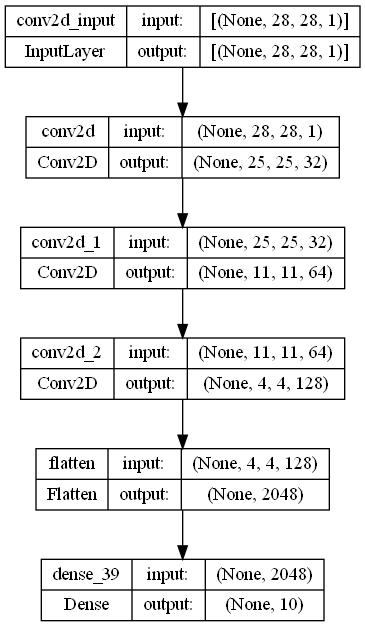

In [25]:
# Baseline Model based on the given parameters from the assignment. 

CNN_model = Sequential()

CNN_model.add(Conv2D(32, (4, 4), activation='relu', input_shape=(28, 28, 1)))
CNN_model.add(Conv2D(64, (4, 4), activation='relu', strides=2))
CNN_model.add(Conv2D(128, (4, 4), activation='relu', strides=2))
CNN_model.add(Flatten())
CNN_model.add(Dense(10, activation='softmax'))
CNN_model.summary()
plot_model(CNN_model, show_shapes=True) # visualize the CNN artitecture

In [26]:
# compile the model

CNN_model.compile(loss='categorical_crossentropy',
            optimizer=Adam(learning_rate=.001),
            metrics=['accuracy'])

## Prepare Data


### Reshaping Images

We have a 1D vector with 784 pixels and we have to reshape it to (28x28x1) before passing it to the CNN.
This is because Keras wants an Extra Dimension at the end for channels. If these images were RGB images, there would have been 3 channels, but as MNIST is grey scale it only uses 1.

First param in reshape is number of examples. We can pass -1 here as we want numpy to figure that out by itself.

`reshape(samples, height, width, channels)`


### Normalization

Pixel values are often stored as integers in the range of 0 to 255, but for CNN it is much easier for the model if these values are between 0 and 1.

- Helps Gradient Descent Converge much faster
- Brings features to equal level and weightage
- Helps remove distortions in an image caused by light and shadows



### One Hot Encoding Labels

The labels are given as integers between 0–9. We need to one-hot encode them.

For example, an image labelled “5" will look like the following:

`[0, 0, 0, 0, 0, 1, 0, 0, 0, 0]`

This is done so that we have labels for all the classes, and we can easily carry out the Error/Cost calculations during back propagation (model training).

In [27]:
# load data for CNN 
def load_data_CNN():
   

    mnist = tf.keras.datasets.mnist
    (x_train, y_train), (x_test, y_test) = mnist.load_data()

    n_train = x_train.shape[0]
    n_test =x_test.shape[0]

    # scaling
    x_train, x_test = x_train/127.5 - 1, x_test/127.5 - 1
    
    # shape data for CNN 

    x_train = x_train.reshape(-1, 28, 28, 1)
    x_test = x_test.reshape(-1, 28, 28, 1)


    
    #notice num_classes is set to 10 as we have 10 different labels

    y_train = to_categorical(y_train, num_classes=10)
    y_test = to_categorical(y_test, num_classes=10)
    
    return x_train, y_train, x_test, y_test

x_train, y_train, x_test, y_test = load_data_CNN()

In [28]:
# Train the baseline Model
# please set train_model to True to run the training 

train_model = False

if train_model:
    epochs = 10
    batch_size = 50

    t1=time.time()
    history_1 = CNN_model.fit(x_train, y_train, 
              batch_size=batch_size, 
              epochs=epochs, 
              validation_split=0.1) # we will use 10% of the training data as validation set.

    t2=time.time()

    print(f'Time taken to train for 10 epochs: {round(t2-t1, 3)}')
    
    # Saving the model history
    with open('models_saved/CNN_history_4_1.pkl', 'wb') as f:
        pickle.dump(history_1, f)

It took 240 seconds running it on CPU , on Google premium GPU it took 44.45 seconds

In [29]:
# load model 

with open('models_saved/CNN_history_4_1.pkl', 'rb') as f:
    history_1 = pickle.load(f)
    
CNN_model = history_1.model

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-23 21:19:42         3073
metadata.json                                  2023-02-23 21:19:42           64
variables.h5                                   2023-02-23 21:19:42       760736
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\conv2d_2
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\flatten
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars


In [30]:
# Evaluate model on test data

pred_test = CNN_model.predict(x_test)
accuracy_CNN_test = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
print(bblue+'\nAccuracy on the testing set: %.2f\n' % (accuracy_CNN_test*100)+end_color)

# Evaluate model on train data
pred_train = CNN_model.predict(x_train)
accuracy_CNN_train = accuracy_score(y_train.argmax(axis=1), pred_train.argmax(axis=1))
print(bblue+'\nAccuracy on the training set: %.2f\n' % (accuracy_CNN_train*100)+end_color)


313/313 [==============================] - 1s 3ms/step

Accuracy on the testing set: 98.98

1875/1875 [==============================] - 6s 3ms/step

Accuracy on the training set: 99.69



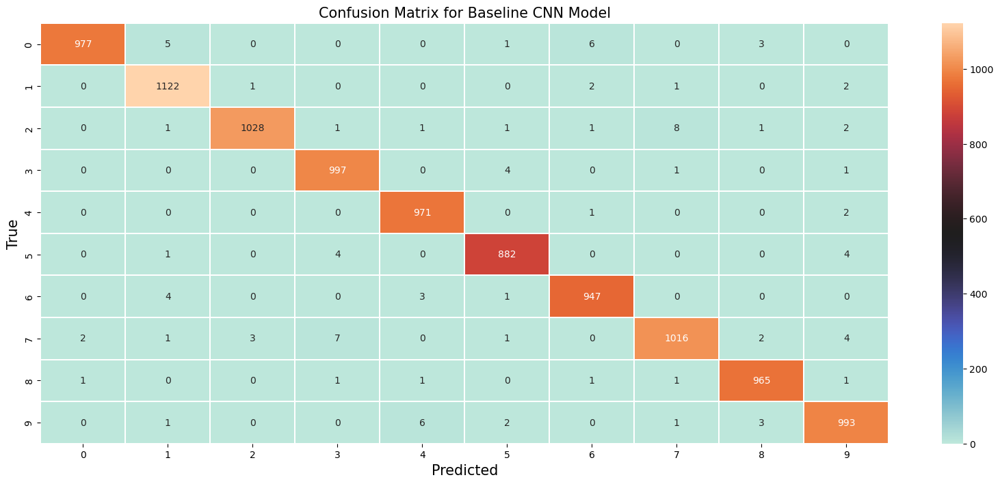

In [31]:
# Confusion Matrix

preds = CNN_model.predict(x_test, verbose = 0)
plt.figure(figsize=(20, 8))
ax = sns.heatmap(sklearn.metrics.confusion_matrix(np.argmax(preds, axis=1), np.argmax(y_test, axis=1) ), cmap='icefire', fmt="", annot=True, linewidths=0.1)
ax.set_xlabel("Predicted", fontsize=15)
ax.set_ylabel("True", fontsize=15)
plt.title('Confusion Matrix for Baseline CNN Model', fontsize=15);

In [32]:
# Classification Report

print(classification_report(np.argmax(pred_test, axis=1), np.argmax(y_test, axis=1)))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       992
           1       0.99      0.99      0.99      1128
           2       1.00      0.98      0.99      1044
           3       0.99      0.99      0.99      1003
           4       0.99      1.00      0.99       974
           5       0.99      0.99      0.99       891
           6       0.99      0.99      0.99       955
           7       0.99      0.98      0.98      1036
           8       0.99      0.99      0.99       971
           9       0.98      0.99      0.99      1006

    accuracy                           0.99     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       0.99      0.99      0.99     10000



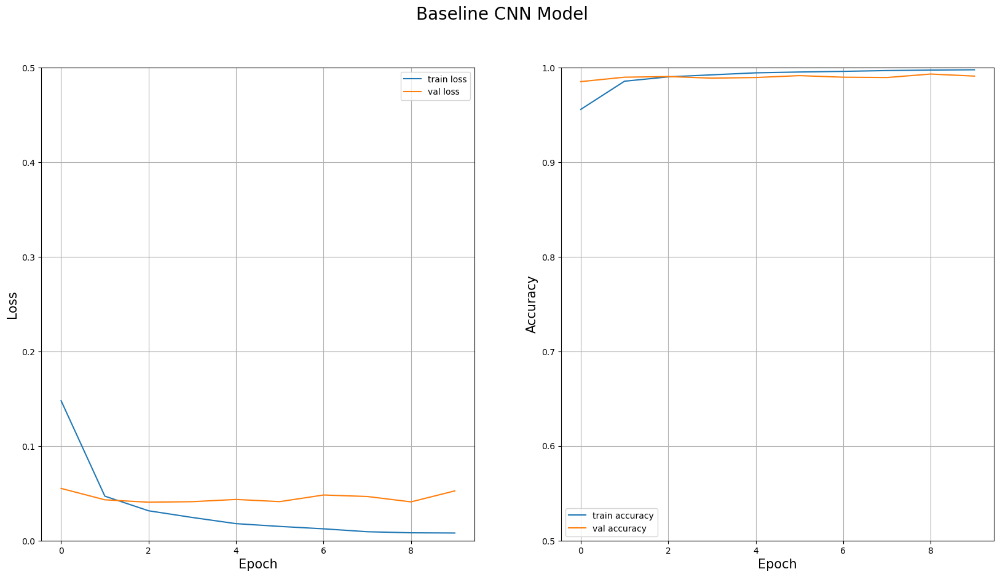

In [33]:
# Training VS Testing Data

plot_learing_curve(history_1, "Baseline CNN Model")


We notice minor overfit in the learning curve abov, so we reduced the number of epochs to 4 and observe the result.

In [34]:
# Baseline Model based on the given parameters from the assignment. 

CNN_model1 = Sequential()

CNN_model1.add(Conv2D(32, (4, 4), activation='relu', input_shape=(28, 28, 1)))
CNN_model1.add(Conv2D(64, (4, 4), activation='relu', strides=2))
CNN_model1.add(Conv2D(128, (4, 4), activation='relu', strides=2))
CNN_model1.add(Flatten())
CNN_model1.add(Dense(10, activation='softmax'))
CNN_model1.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 25, 25, 32)        544       
                                                                 
 conv2d_4 (Conv2D)           (None, 11, 11, 64)        32832     
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 128)         131200    
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_40 (Dense)            (None, 10)                20490     
                                                                 
Total params: 185,066
Trainable params: 185,066
Non-trainable params: 0
_________________________________________________________________


In [35]:


# compile the model

CNN_model1.compile(loss='categorical_crossentropy',
            optimizer=Adam(learning_rate=.001),
            metrics=['accuracy'])


train_model = True

if train_model:
    epochs = 4
    batch_size = 50

    t1=time.time()
    history_11 = CNN_model1.fit(x_train, y_train, 
              batch_size=batch_size, 
              epochs=epochs, 
              validation_split=0.1) # we will use 10% of the training data as validation set.

    t2=time.time()

    print(f'Time taken to train for 10 epochs: {round(t2-t1, 3)}')
    



Epoch 1/4
1080/1080 [==============================] - 23s 21ms/step - loss: 0.1419 - accuracy: 0.9580 - val_loss: 0.0497 - val_accuracy: 0.9873
Epoch 2/4
1080/1080 [==============================] - 23s 22ms/step - loss: 0.0457 - accuracy: 0.9856 - val_loss: 0.0400 - val_accuracy: 0.9900
Epoch 3/4
1080/1080 [==============================] - 24s 22ms/step - loss: 0.0311 - accuracy: 0.9899 - val_loss: 0.0397 - val_accuracy: 0.9900
Epoch 4/4
1080/1080 [==============================] - 24s 22ms/step - loss: 0.0240 - accuracy: 0.9924 - val_loss: 0.0428 - val_accuracy: 0.9905
Time taken to train for 10 epochs: 94.708


313/313 [==============================] - 1s 4ms/step

Accuracy on the testing set: 99.12

1875/1875 [==============================] - 7s 4ms/step

Accuracy on the training set: 99.50



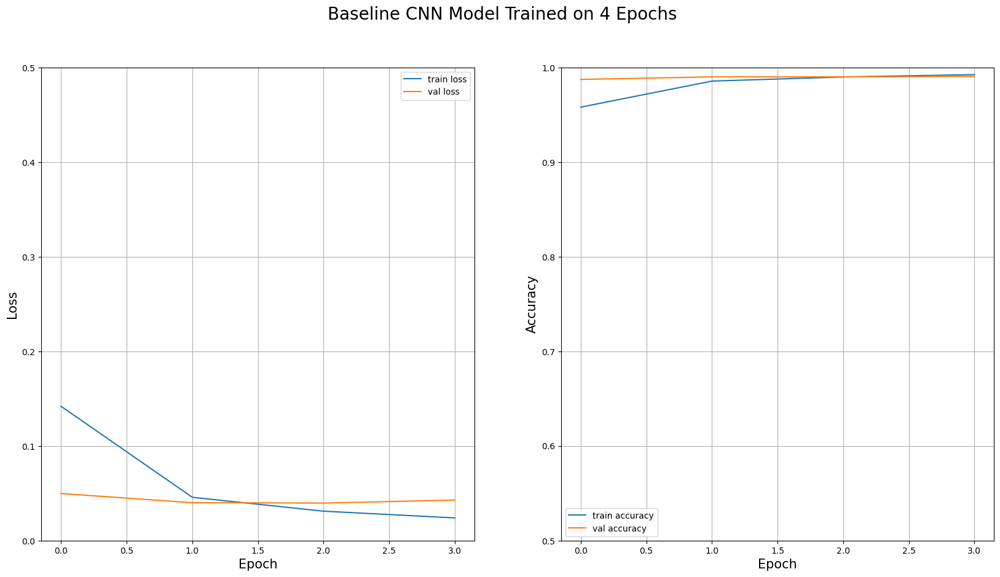

In [36]:
# Evaluate model on test data

pred_test = CNN_model1.predict(x_test)
accuracy_CNN_test = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
print(bblue+'\nAccuracy on the testing set: %.2f\n' % (accuracy_CNN_test*100)+end_color)

# evaluate on train data
pred_train = CNN_model1.predict(x_train)
accuracy_CNN_train = accuracy_score(y_train.argmax(axis=1), pred_train.argmax(axis=1))
print(bblue+'\nAccuracy on the training set: %.2f\n' % (accuracy_CNN_train*100)+end_color)

# Training VS Testing Data

plot_learing_curve(history_11, "Baseline CNN Model Trained on 4 Epochs")


## 4.2

We start by creating 8 additional CNN models with different depths and widths. We have used **`keras tuner`** to do a grid search on large space of configurations for extra 8 models with number of conv layers `[2, 3, 4, 5]` and picked the top and bottom performing model out of 5 different configurations for each number of conv layers, then retrained them using the same number of `epochs = 10` similar to the baseline model


In [37]:
# Tuner Code
# set run_tuner to True to run the search, beware this may take hours, results are already saved, loaded below and submitted

run_tuner = False

if run_tuner:
    
    #build a timing callback to time the total time it takes to train each epoch  
    class TimingCallback(keras.callbacks.Callback):
        def __init__(self, logs={}):
            self.logs=[]
        def on_epoch_begin(self, epoch, logs={}):
            self.starttime = timer()
        def on_epoch_end(self, epoch, logs={}):
            self.logs.append(timer()-self.starttime)


    
    CNN_tuners_results = {}
    CNN_worst_models = []
    CNN_best_models = []

    for n_hidden_layer in [2,3,4,5]: # various number of hidden layers
        def build_model(hp):
            model = Sequential()

    #        global n_hidden_layer
            for i in range(1,n_hidden_layer+1):

              model.add(Conv2D(
                #adding filter 
                filters=hp.Int(f'conv_{i}_filter', min_value=32, max_value=512, step=32),
                # adding filter size or kernel size
                kernel_size=hp.Choice(f'conv_{i}_kernel', values = [2,3,4]),
                #activation function
                activation='relu', padding='same',
                input_shape=(28,28,1)))
            model.add(Flatten())
            model.add(Dense(10, activation="softmax"))
            opt = Adam(learning_rate=0.001)
            model.compile(
                optimizer= opt, loss="categorical_crossentropy", metrics=["accuracy"], )
            return model

        tuner = keras_tuner.BayesianOptimization(
            hypermodel=build_model,
            objective="val_accuracy",
            max_trials=5,
            executions_per_trial=1,
            overwrite=True,
            seed = 4,
            directory= os.getcwd(),
            project_name=f"4_2_tuner_{n_hidden_layer}_hidden_layer")

        cb = TimingCallback()

        tuner.search(x_train, y_train, epochs=5, batch_size=50, validation_split=0.1,
                    callbacks=[callbacks.TensorBoard(os.getcwd()), cb],)
        CNN_tuners_results[n_hidden_layer] = tuner

        _, accuracy = tuner.get_best_models(num_models=1)[0].evaluate(x_test, y_test) # best model

        _, accuracy_worst = tuner.get_best_models(num_models=100)[-1].evaluate(x_test, y_test) # worst model

        print(f"worst Accuracy is {accuracy_worst}")
        CNN_worst_models.append((n_hidden_layer, tuner.get_best_models(100)[-1].count_params(), # lowest performing model [-1]
                              accuracy_worst, tuner.get_best_hyperparameters(100)[-1].values, sum(cb.logs)))

        CNN_best_models.append((n_hidden_layer, tuner.get_best_models()[0].count_params(), 
                              accuracy, tuner.get_best_hyperparameters()[0].values, sum(cb.logs)))

In [38]:
# we load and re-build the best models from each conv layer configuration and compile them.

with open('CNN_Tuner_Results/CNN_best_models.pkl', 'rb') as f:
    CNN_best_models = pickle.load(f)
    
best_models = {}
for i, m in enumerate(CNN_best_models[:-2]):
    
    best_models[m[0]] = Sequential()
    
    for n_layers in range(1,m[0]+1):
        n_filter = m[3][f'conv_{n_layers}_filter']
        kernel = m[3][f'conv_{n_layers}_kernel']
        best_models[m[0]].add(Conv2D(n_filter, (kernel, kernel), activation='relu', input_shape=(28, 28, 1)))

    best_models[m[0]].add(Flatten())

    best_models[m[0]].add(Dense(10, activation='softmax'))

    print(bblack+f'Model with {m[0]} conv layers\n'+end_color)
    best_models[m[0]].summary()
    
    # compile the model
    best_models[m[0]].compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])
    print()
    
   

Model with 2 conv layers

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 26, 26, 192)       1920      
                                                                 
 conv2d_7 (Conv2D)           (None, 23, 23, 96)        295008    
                                                                 
 flatten_2 (Flatten)         (None, 50784)             0         
                                                                 
 dense_41 (Dense)            (None, 10)                507850    
                                                                 
Total params: 804,778
Trainable params: 804,778
Non-trainable params: 0
_________________________________________________________________

Model with 3 conv layers

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output S

In [39]:
# we now train these models on 10 epochs, tuner used just 5 epochs to save time
# please set train_models to True to run the training (Takes time)

CNN_b_times=[]
CNN_b_histories = []

train_models = False

if train_models:
    epochs = 10
    batch_size = 50

    for k, v in best_models.items():
        print(bblack+f"Training Model with {k} Conv Layers\n"+end_color)
        t1 = time.time()
        history = v.fit(x_train, y_train, 
                  batch_size=batch_size, 
                  epochs=epochs, 
                  validation_split=0.1)

        CNN_b_histories.append(history)
        t2 = time.time()
        CNN_b_times.append(t2-t1)
        print()
        
    # Saving the models history
    with open('models_saved/CNN_b_histories_4_2.pkl', 'wb') as f:
        pickle.dump([CNN_b_histories, CNN_b_times], f)
        

In [40]:
# load models
with open('models_saved/CNN_b_histories_4_2.pkl', 'rb') as f:
    CNN_b_histories, CNN_b_times = pickle.load(f)

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-24 04:34:52         2560
metadata.json                                  2023-02-24 04:34:52           64
variables.h5                                   2023-02-24 04:34:52      3236696
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\flatten
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars
Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-24 04:34:52         3160
metadata.json                                  2023-02-24 04:34:52           64
variables.h5   

In [41]:
# testing on test data
acc = []
for h in  CNN_b_histories:

    pred_test = h.model.predict(x_test)
    a = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
    acc.append(a)
    


313/313 [==============================] - 30s 94ms/step


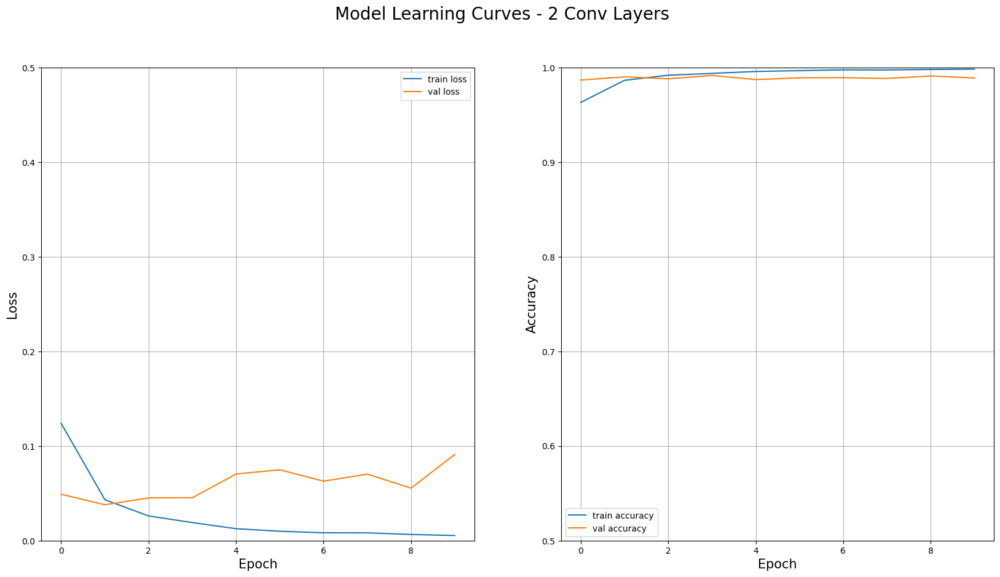

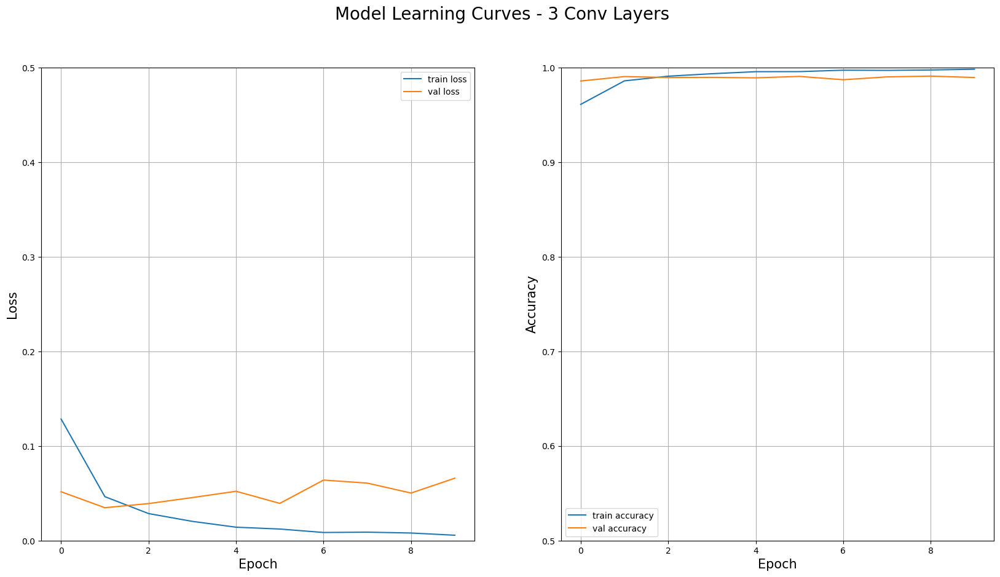

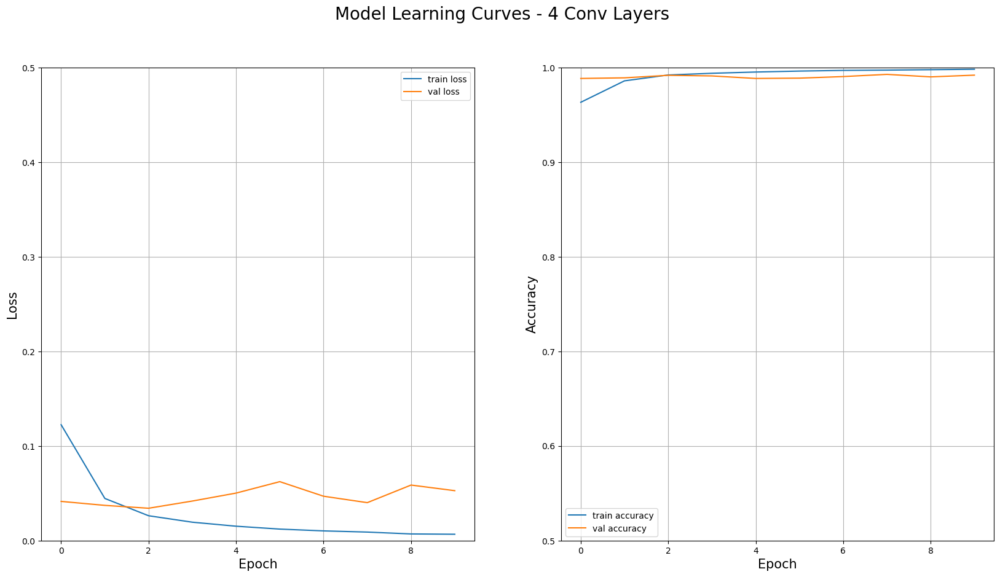

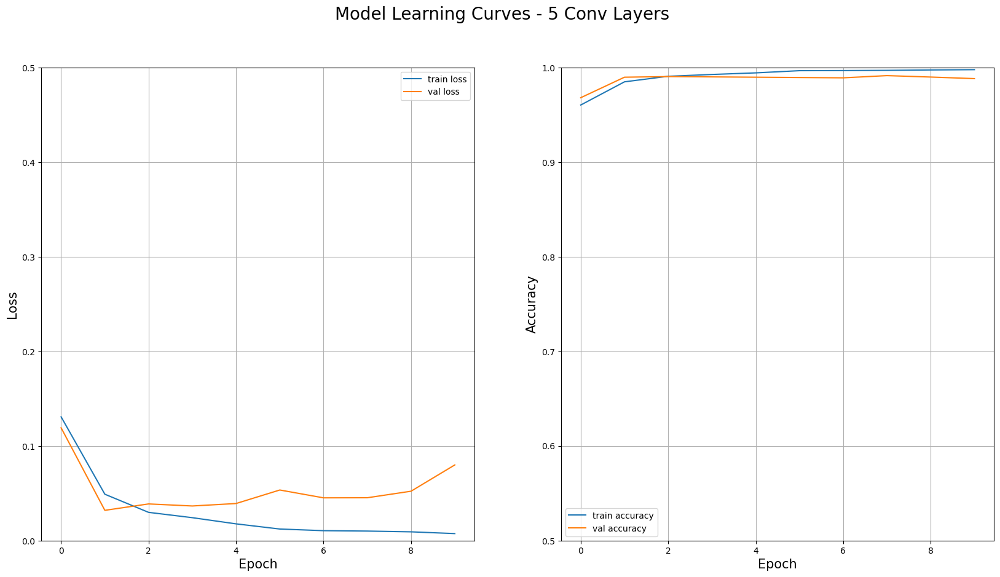

In [42]:
# plotting learning curves

for i, h in enumerate(CNN_b_histories):
    plot_learing_curve(h, f"Model Learning Curves - {i+2} Conv Layers")

In [43]:
acc

[0.9855, 0.9867, 0.99, 0.9876]

In [44]:
#loading the results for training on Google GPU

with open('CNN_Tuner_Results/CNN_times_best.pkl', 'rb') as f:
    CNN_best_times = pickle.load(f)
    
# below are the best models configurations for the 8 models
    
print(bblack+"Below are the best CNN models archetectures found from the tuner search:\n\n"+end_color)

for i,m in enumerate(CNN_best_models[:-2]):
    
    print(bblue+f'Model with {m[0]} Conv Layers:\n'+end_color)
    print(bblack+f'Number of Parameters: {best_models[m[0]].count_params()}') 
    print(f'Model Accuracy on test data: {round(acc[i],4)*100} %')  
    print(f'Number of filters and size per each pfilter for each layer:\n{m[3]}')
    print(f'Time it took to train for 10 epochs on Google Premium GPU: {round(CNN_best_times[i],2)} seconds')
    print(f'Time it took to train for 10 epochs on local CPU: {round(CNN_b_times[i],2)} seconds\n\n')

Below are the best CNN models archetectures found from the tuner search:


Model with 2 Conv Layers:

Number of Parameters: 804778
Model Accuracy on test data: 98.55000000000001 %
Number of filters and size per each pfilter for each layer:
{'conv_1_filter': 192, 'conv_1_kernel': 3, 'conv_2_filter': 96, 'conv_2_kernel': 4}
Time it took to train for 10 epochs on Google Premium GPU: 55.36 seconds
Time it took to train for 10 epochs on local CPU: 2516.5 seconds


Model with 3 Conv Layers:

Number of Parameters: 579178
Model Accuracy on test data: 98.67 %
Number of filters and size per each pfilter for each layer:
{'conv_1_filter': 64, 'conv_1_kernel': 3, 'conv_2_filter': 288, 'conv_2_kernel': 2, 'conv_3_filter': 64, 'conv_3_kernel': 3}
Time it took to train for 10 epochs on Google Premium GPU: 48.46 seconds
Time it took to train for 10 epochs on local CPU: 2098.38 seconds


Model with 4 Conv Layers:

Number of Parameters: 2474218
Model Accuracy on test data: 99.0 %
Number of filters and si

In [45]:
# now we do the same for the lowest performing models found

In [46]:
# now we do the same for the lowest performing models found
# we load and re-build the worst models from each conv layer configuration and compile them.

with open('CNN_Tuner_Results/CNN_worst_models.pkl', 'rb') as f:
    CNN_worst_models = pickle.load(f)
    
worst_models = {}
for i, m in enumerate(CNN_worst_models[:-2]):
    
    worst_models[m[0]] = Sequential()
    
    for n_layers in range(1,m[0]+1):
        n_filter = m[3][f'conv_{n_layers}_filter']
        kernel = m[3][f'conv_{n_layers}_kernel']
        worst_models[m[0]].add(Conv2D(n_filter, (kernel, kernel), activation='relu', input_shape=(28, 28, 1)))

    worst_models[m[0]].add(Flatten())

    worst_models[m[0]].add(Dense(10, activation='softmax'))

    print(bblack+f'Model with {m[0]} conv layers\n'+end_color)
    worst_models[m[0]].summary()
    # compile the model

    worst_models[m[0]].compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])
    print()
    

Model with 2 conv layers

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 26, 26, 128)       1280      
                                                                 
 conv2d_21 (Conv2D)          (None, 25, 25, 416)       213408    
                                                                 
 flatten_6 (Flatten)         (None, 260000)            0         
                                                                 
 dense_45 (Dense)            (None, 10)                2600010   
                                                                 
Total params: 2,814,698
Trainable params: 2,814,698
Non-trainable params: 0
_________________________________________________________________

Model with 3 conv layers

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Outp

In [47]:
# we now train these models on 10 epochs, tuner used just 5 epochs to save time
# please set train_models to True to run the training (Takes time)

CNN_w_times=[]
CNN_w_histories = []

train_models = False

if train_models:
    epochs = 10
    batch_size = 50

    for k, v in worst_models.items():
        print(bblack+f"Training Model with {k} Conv Layers\n"+end_color)
        t1 = time.time()
        history = v.fit(x_train, y_train, 
                  batch_size=batch_size, 
                  epochs=epochs, 
                  validation_split=0.1)

        CNN_w_histories.append(history)
        t2 = time.time()
        CNN_w_times.append(t2-t1)
        print()
        
    # Saving the models history
    with open('models_saved/CNN_w_histories_4_2.pkl', 'wb') as f:
        pickle.dump([CNN_w_histories, CNN_w_times], f)

In [48]:
# load models history
with open('models_saved/CNN_w_histories_4_2.pkl', 'rb') as f:
    CNN_w_histories, CNN_w_times = pickle.load(f)

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-23 10:02:16         2564
metadata.json                                  2023-02-23 10:02:16           64
variables.h5                                   2023-02-23 10:02:16     11277400
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\flatten
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars
Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-23 10:02:16         3165
metadata.json                                  2023-02-23 10:02:16           64
variables.h5   

In [49]:
# testing on test data
acc = []
for h in  CNN_w_histories:

    pred_test = h.model.predict(x_test)
    a = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
    acc.append(a)
    


313/313 [==============================] - 64s 203ms/step


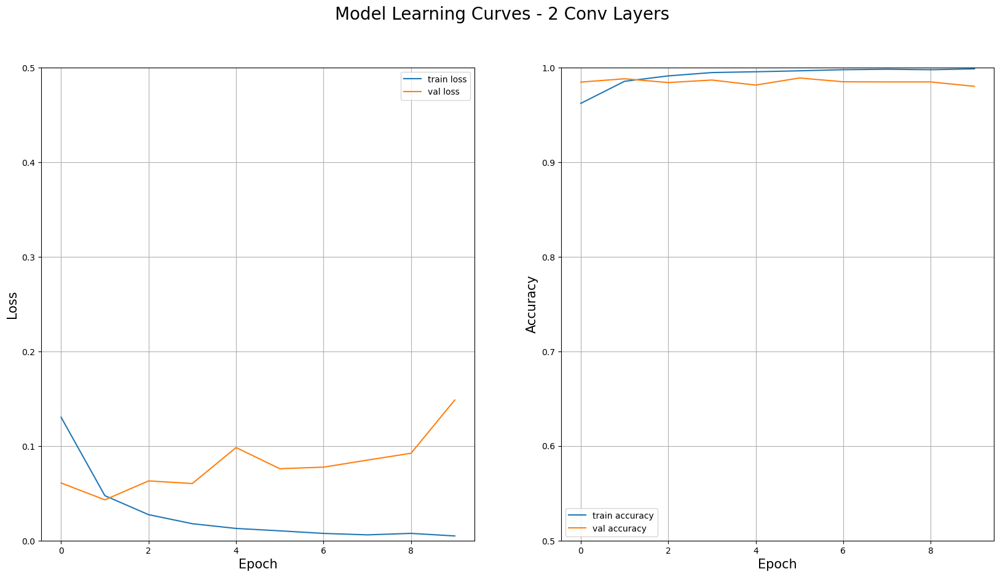

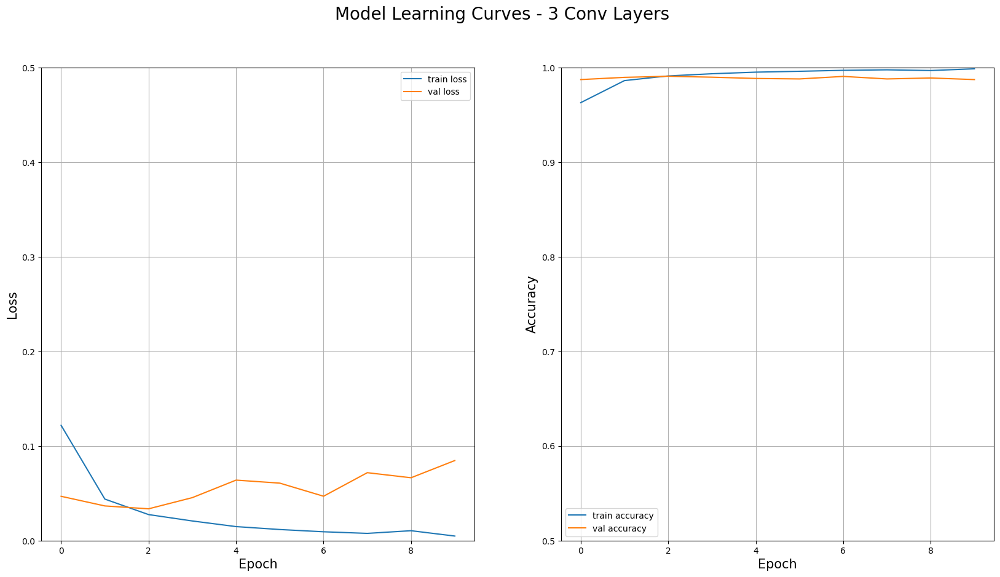

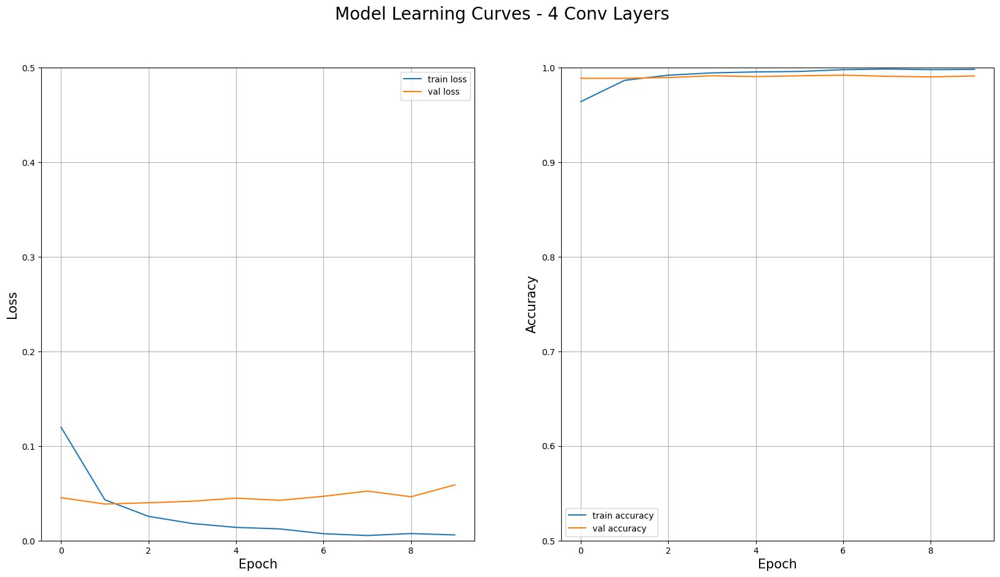

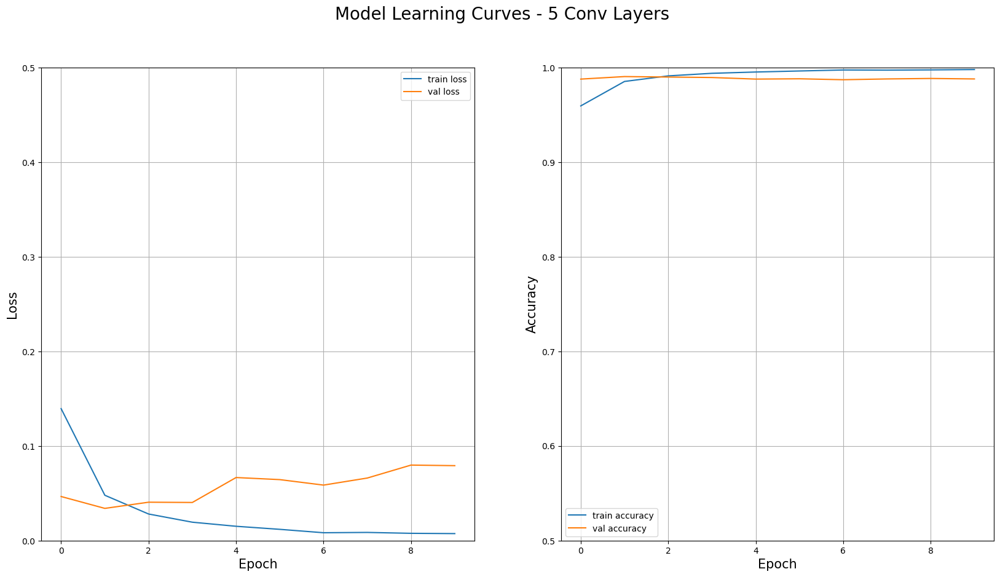

In [50]:
# plotting learning curves

for i, h in enumerate(CNN_w_histories):
    plot_learing_curve(h, f"Model Learning Curves - {i+2} Conv Layers")

In [51]:

    
with open('CNN_Tuner_Results/CNN_worst_times.pkl', 'rb') as f:
    CNN_worst_times = pickle.load(f)
    
    
print(bblack+"Below are the bottom CNN models archetecture found from the tuner search:\n\n"+end_color)

for i,m in enumerate(CNN_worst_models[:-2]):
    
    print(bblue+f'Model {i+1} with {m[0]} Conv Layers:\n'+end_color)
    print(bblack+f'Number of Parameters: {worst_models[m[0]].count_params()}')
    print(f'Model Accuracy on test data: {round(acc[i],4)*100} %')
    print(f'Number of filters and size per each pfilter for each layer:\n{m[3]}')
    print(f'Time it took to train for 10 epochs on Google Premium GPU: {round(CNN_worst_times[i],2)} seconds')
    print(f'Time it took to train for 10 epochs on local CPU: {round(CNN_w_times[i],2)} seconds\n\n')
   

Below are the bottom CNN models archetecture found from the tuner search:


Model 1 with 2 Conv Layers:

Number of Parameters: 2814698
Model Accuracy on test data: 97.87 %
Number of filters and size per each pfilter for each layer:
{'conv_1_filter': 128, 'conv_1_kernel': 3, 'conv_2_filter': 416, 'conv_2_kernel': 2}
Time it took to train for 10 epochs on Google Premium GPU: 51.22 seconds
Time it took to train for 10 epochs on local CPU: 1908.54 seconds


Model 2 with 3 Conv Layers:

Number of Parameters: 903114
Model Accuracy on test data: 98.47 %
Number of filters and size per each pfilter for each layer:
{'conv_1_filter': 320, 'conv_1_kernel': 3, 'conv_2_filter': 256, 'conv_2_kernel': 2, 'conv_3_filter': 64, 'conv_3_kernel': 4}
Time it took to train for 10 epochs on Google Premium GPU: 62.24 seconds
Time it took to train for 10 epochs on local CPU: 5074.43 seconds


Model 3 with 4 Conv Layers:

Number of Parameters: 1676874
Model Accuracy on test data: 99.0 %
Number of filters and siz

## 4.3 

Here, we train 2 more simple models to reveal the superiority of CNN using single hidden/Conv layer.


In [52]:
# load data for MLP
x_train, y_train, x_test, y_test = load_data_MLP()

In [53]:
# Bonus MLP model

bonus_MLP_model = Sequential()

bonus_MLP_model.add(Dense(1000, input_dim=784, activation='relu'))
bonus_MLP_model.add(Dense(10, activation='softmax'))
bonus_MLP_model.summary()

# Compile
bonus_MLP_model.compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])
t1 = time.time()
history_bonus_MLP = bonus_MLP_model.fit(x_train, y_train, 
                  batch_size=50, 
                  epochs=2, 
                  validation_split=0.1)
t2 = time.time()

print(f"Time taken to train the bonus MLP model for 2 epochs: {t2-t1}")

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_49 (Dense)            (None, 1000)              785000    
                                                                 
 dense_50 (Dense)            (None, 10)                10010     
                                                                 
Total params: 795,010
Trainable params: 795,010
Non-trainable params: 0
_________________________________________________________________
Epoch 1/2
1080/1080 [==============================] - 5s 5ms/step - loss: 0.2887 - accuracy: 0.9140 - val_loss: 0.1320 - val_accuracy: 0.9612
Epoch 2/2
1080/1080 [==============================] - 5s 5ms/step - loss: 0.1355 - accuracy: 0.9589 - val_loss: 0.1006 - val_accuracy: 0.9705
Time taken to train the bonus MLP model for 2 epochs: 10.471561670303345


In [54]:
# Accuracy Scores for bonus MLP model

pred_test = bonus_MLP_model.predict(x_test)
accuracy_CNN_test = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
print(bblue+'\nAccuracy on the testing set: %.2f\n' % (accuracy_CNN_test*100)+end_color)

pred_train = bonus_MLP_model.predict(x_train)
accuracy_CNN_train = accuracy_score(y_train.argmax(axis=1), pred_train.argmax(axis=1))
print(bblue+'\nAccuracy on the training set: %.2f\n' % (accuracy_CNN_train*100)+end_color)

313/313 [==============================] - 1s 2ms/step

Accuracy on the testing set: 96.09

1875/1875 [==============================] - 3s 2ms/step

Accuracy on the training set: 96.73



In [55]:
# Load data for CNN

x_train, y_train, x_test, y_test = load_data_CNN()

In [56]:
# Build bonus CNN simple model

bonus_CNN_model = Sequential()

bonus_CNN_model.add(Conv2D(16, (4, 4), activation='relu', input_shape=(28, 28, 1), strides=(2, 2) ))
bonus_CNN_model.add(MaxPooling2D())
bonus_CNN_model.add(Flatten())
bonus_CNN_model.add(Dense(10, activation='softmax'))
bonus_CNN_model.summary()


# Complie

bonus_CNN_model.compile(loss='categorical_crossentropy',
                optimizer=Adam(learning_rate=.001),
                metrics=['accuracy'])

#Train
t1 = time.time()
history_bonus_CNN = bonus_CNN_model.fit(x_train, y_train, 
                  batch_size=50, 
                  epochs=2, 
                  validation_split=0.1)

t2 = time.time()

print(f"Time taken to train the bonus CNN model for 2 epochs: {t2-t1}")

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_34 (Conv2D)          (None, 13, 13, 16)        272       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 6, 6, 16)         0         
 )                                                               
                                                                 
 flatten_10 (Flatten)        (None, 576)               0         
                                                                 
 dense_51 (Dense)            (None, 10)                5770      
                                                                 
Total params: 6,042
Trainable params: 6,042
Non-trainable params: 0
_________________________________________________________________
Epoch 1/2
1080/1080 [==============================] - 2s 2ms/step - loss: 0.3530 - accuracy: 0.9039 - val_loss: 0.11

In [57]:
# Accuracy Scores for bonus CNN model

pred_test = bonus_CNN_model.predict(x_test)
accuracy_CNN_test = accuracy_score(y_test.argmax(axis=1), pred_test.argmax(axis=1))
print(bblue+'\nAccuracy on the testing set: %.2f\n' % (accuracy_CNN_test*100)+end_color)

pred_train = bonus_CNN_model.predict(x_train)
accuracy_CNN_train = accuracy_score(y_train.argmax(axis=1), pred_train.argmax(axis=1))
print(bblue+'\nAccuracy on the training set: %.2f\n' % (accuracy_CNN_train*100)+end_color)

313/313 [==============================] - 0s 774us/step

Accuracy on the testing set: 97.35

1875/1875 [==============================] - 2s 829us/step

Accuracy on the training set: 97.30



# Task 5 - CNN Visualization 

We start by visualizing the schematic representation of the whole model, we have 3 convolution layers, 1 flattening layer and 1 dense (FC) layer.

**Notes**: 

- **All visualizations are done for the baseline model in task 4**

- **First we will visualize the filters separatly then after we reach to visualizing the feature maps, we will put them together**

In [58]:
# we either use the model we have or load it from saved location 

with open('models_saved/CNN_history_4_1.pkl', 'rb') as f:
    history_1 = pickle.load(f)
    
model_being_visualized = history_1.model

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-02-23 21:19:42         3073
metadata.json                                  2023-02-23 21:19:42           64
variables.h5                                   2023-02-23 21:19:42       760736
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers\conv2d
......vars
.........0
.........1
...layers\conv2d_1
......vars
.........0
.........1
...layers\conv2d_2
......vars
.........0
.........1
...layers\dense
......vars
.........0
.........1
...layers\flatten
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...vars


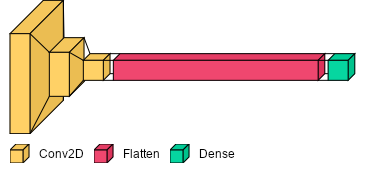

In [59]:
font = ImageFont.truetype("arial.ttf", 12)  
visualkeras.layered_view(model_being_visualized, legend=True, font=font) 

## Filters Visualization

#### 1. Visualize Filters Weights

First Conv layer has 32 filter with 1 channel per each filter, second Conv layer has 64 filters with 32 channels per each, third Conv layer has 128 filters with 64 channel per each.
we will report visualization of all layers in first Conv layer, but only first channel of each filter for the other two layer in the document report, since it won't be useful to list down all of them as little non-observable squares. But we will print all of them here in the notebook.

In [60]:
# Our model has 3 convolutional layers with different numbers of filters per each
conv_layers_names = [layer.name for layer in model_being_visualized.layers if "conv" in layer.name]
weights_array = []
for name in conv_layers_names:
        weights, bias= model_being_visualized.get_layer(name).get_weights()
        weights_array.append(weights)
        print(f" Conv Layer Name: {name}, No of Filters: {weights.shape[-1]}")


 Conv Layer Name: conv2d, No of Filters: 32
 Conv Layer Name: conv2d_1, No of Filters: 64
 Conv Layer Name: conv2d_2, No of Filters: 128


This cell shows the weights visualization for all filters in Conv layer 1 and first channel for weights in the other 2 layers

Conv Layer Name: conv2d, No of Filters: 32, Filter Size: (4, 4)


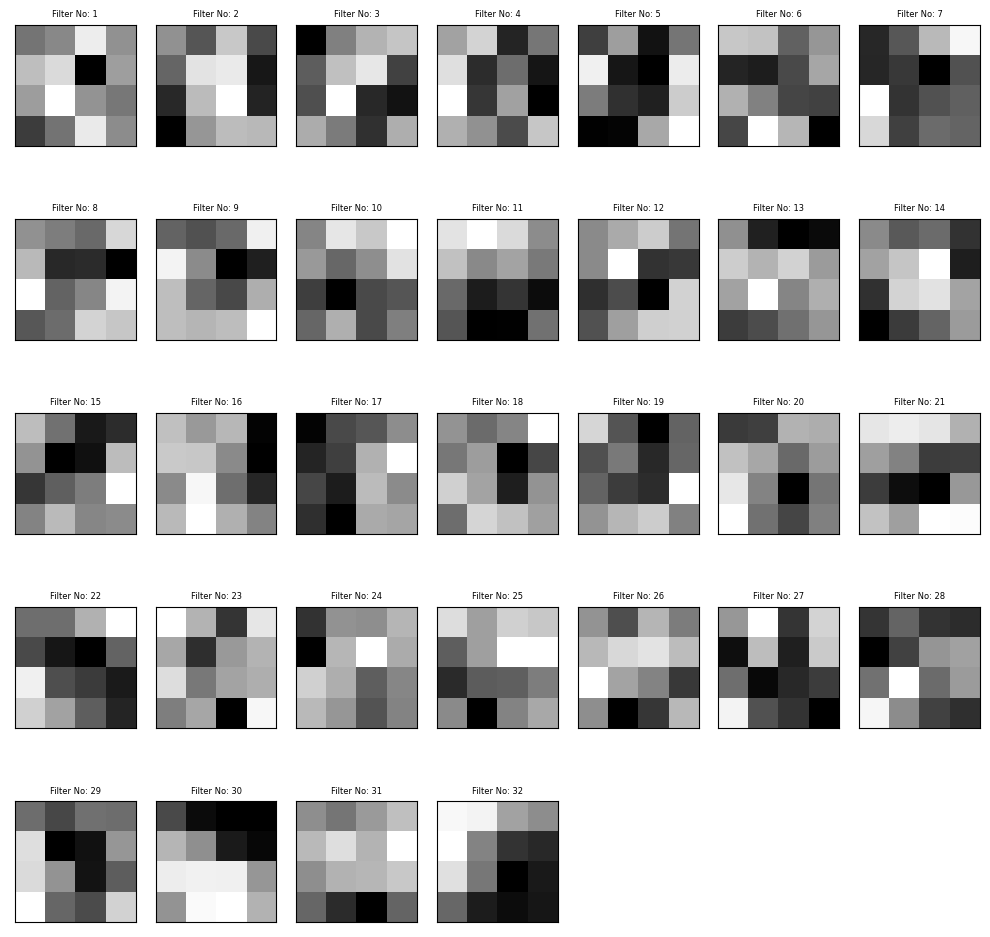

Conv Layer Name: conv2d_1, No of Filters: 64, Filter Size: (4, 4)


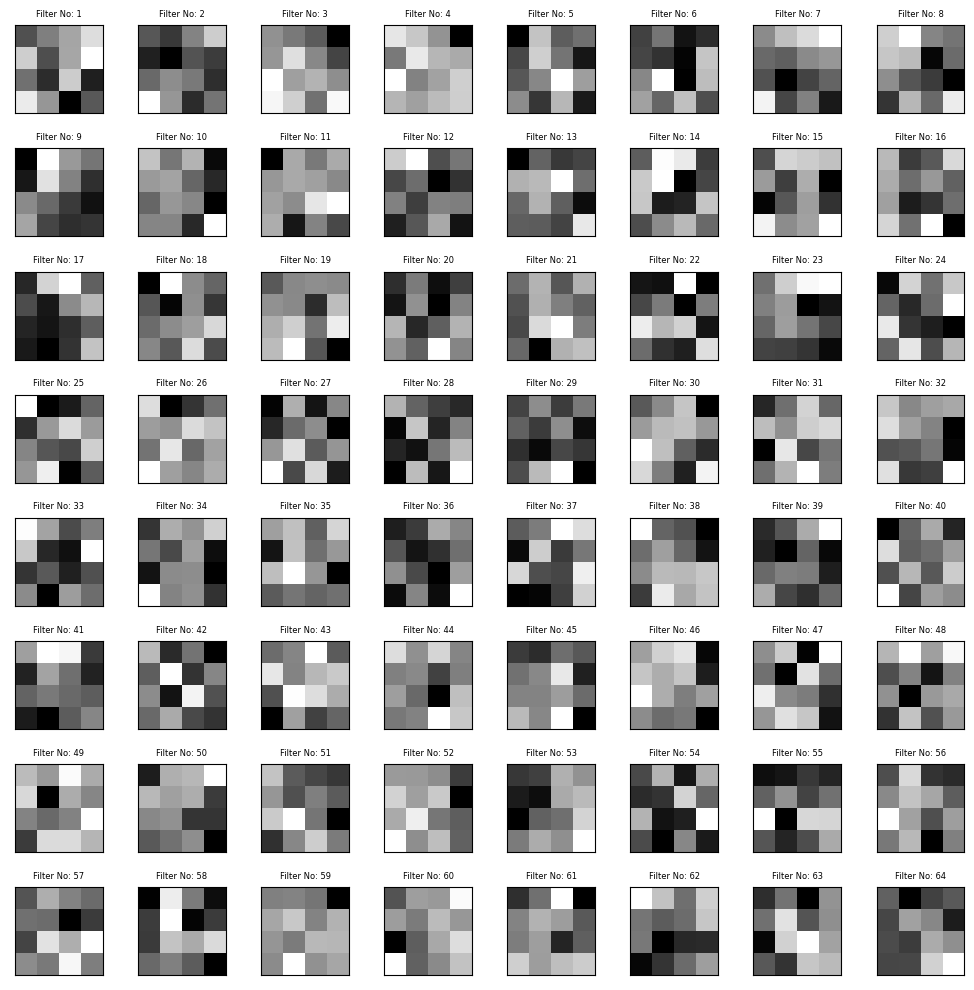

Conv Layer Name: conv2d_2, No of Filters: 128, Filter Size: (4, 4)


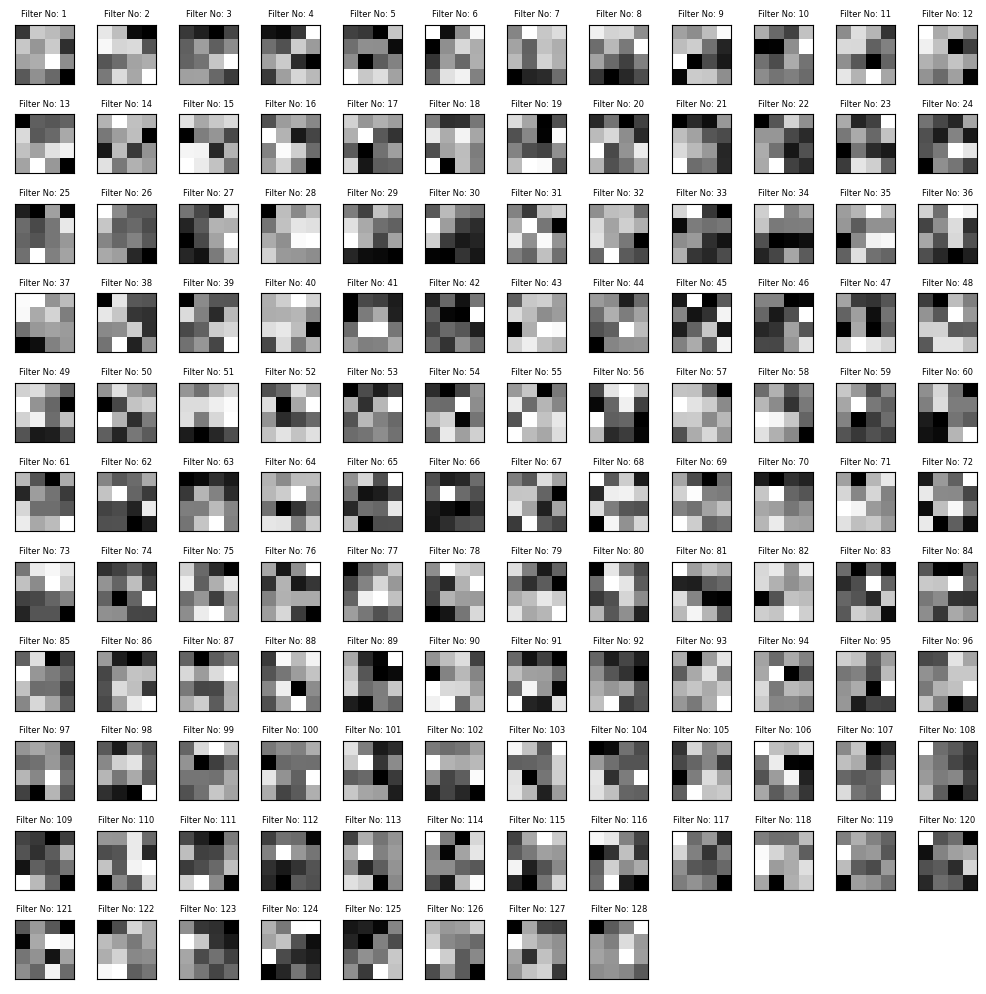

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [61]:
print(bblack+"This cell shows the weights visualization for all filters in Conv layer 1 and first channel for weights in the other 2 layers\n"+end_color)

for layer in model_being_visualized.layers:
    plt.figure(figsize=(10,10))
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        print(bblue+f"Conv Layer Name: {layer.name}, No of Filters: {weights.shape[-1]}, Filter Size: {weights.shape[:2]}"+end_color)
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
      
        filter_cnt=1
        
        
        #plotting all the filters for all conv layers using single channel for the 2nd and 3rd layers
        for i in range(filters.shape[3]):
            
            #get the filters
            filt=filters[:,:,:, i]
            n_images_per_row = 8
            n_filters = filters.shape[-1]
            r = int(np.sqrt(n_filters))
            c = int(np.ceil(n_filters/r))
       
            ax= plt.subplot(r, c, filter_cnt)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(f"Filter No: {filter_cnt}", fontsize=6)
            plt.imshow(filt[:,:,0], cmap="gray") # we print first channel of each filter 
            filter_cnt+=1
        plt.tight_layout()
        plt.show()

Now we plot all filters in all the channels in all layers 

This cell shows the weights visualization for all filters in Conv layer 1 and first channel for weights in the other 2 layers

Conv Layer Name: conv2d, No of Channels: 1, No of Filters per channel: 32, Filter Size: (4, 4)

Conv Layer Name: conv2d, Channel No: 1


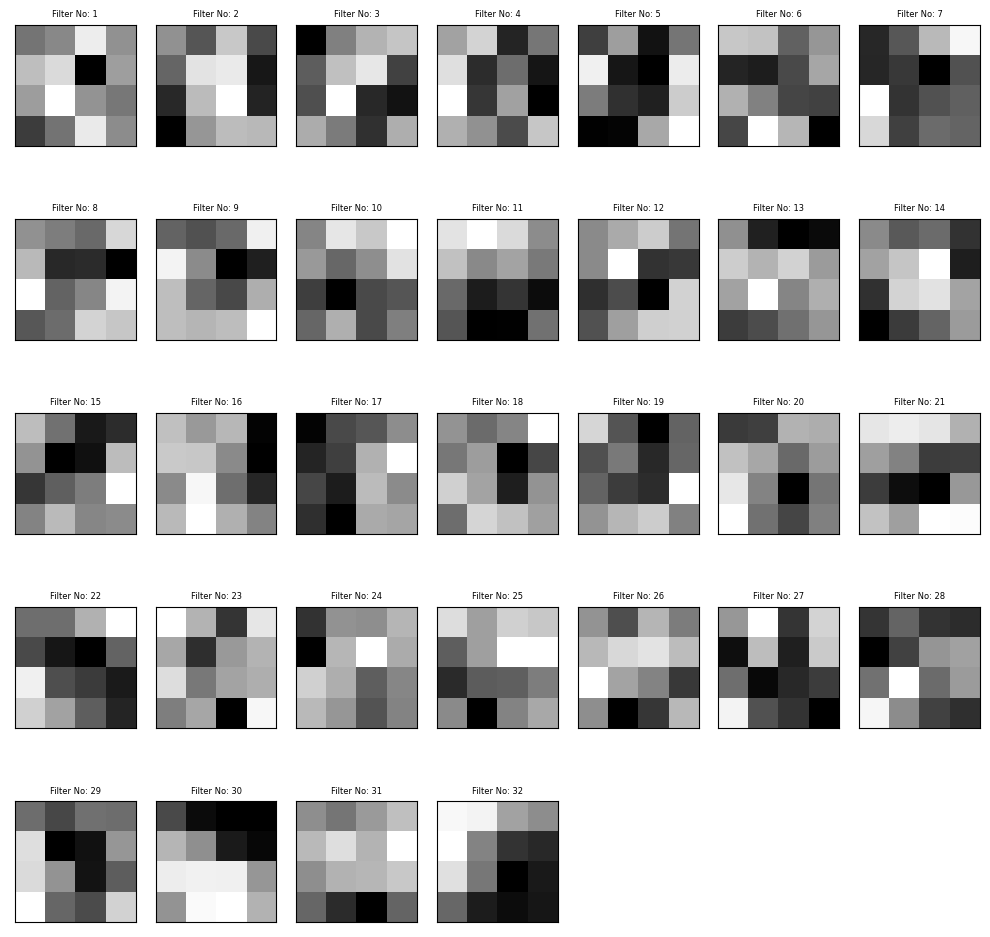

Conv Layer Name: conv2d_1, No of Channels: 32, No of Filters per channel: 64, Filter Size: (4, 4)

Conv Layer Name: conv2d_1, Channel No: 1


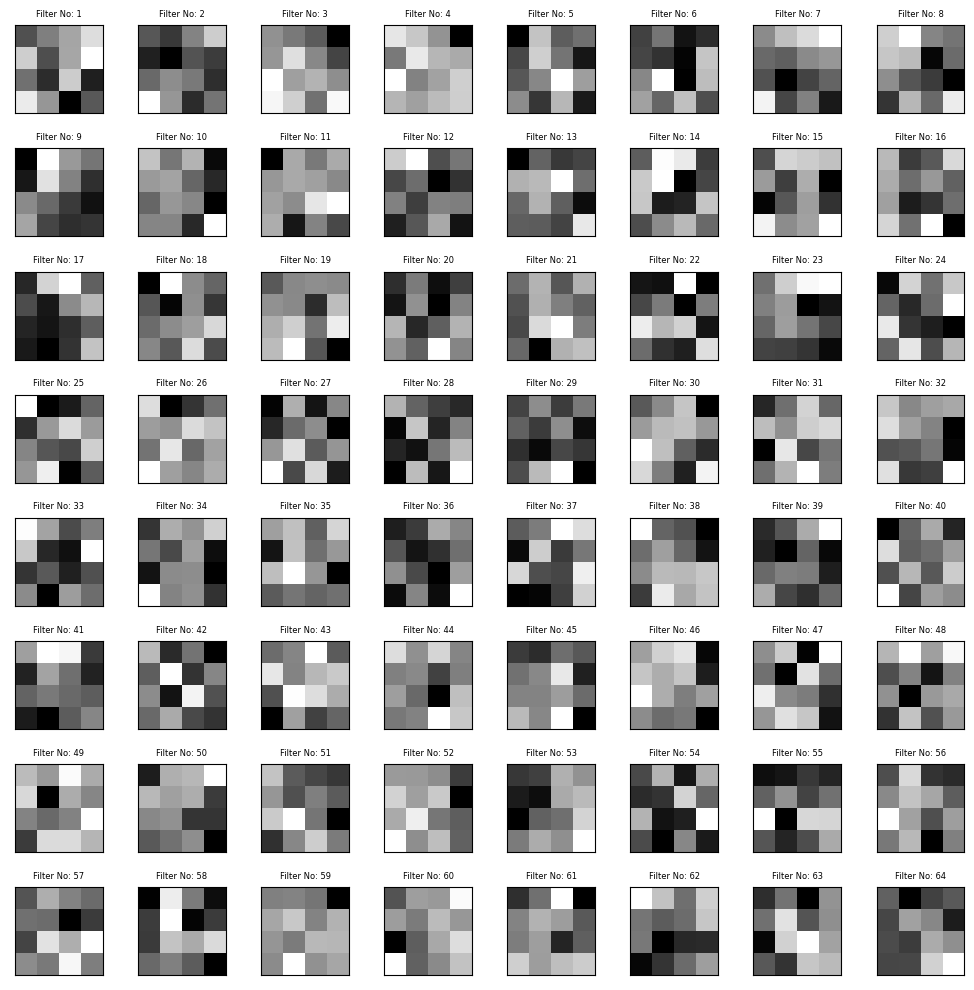


Conv Layer Name: conv2d_1, Channel No: 2


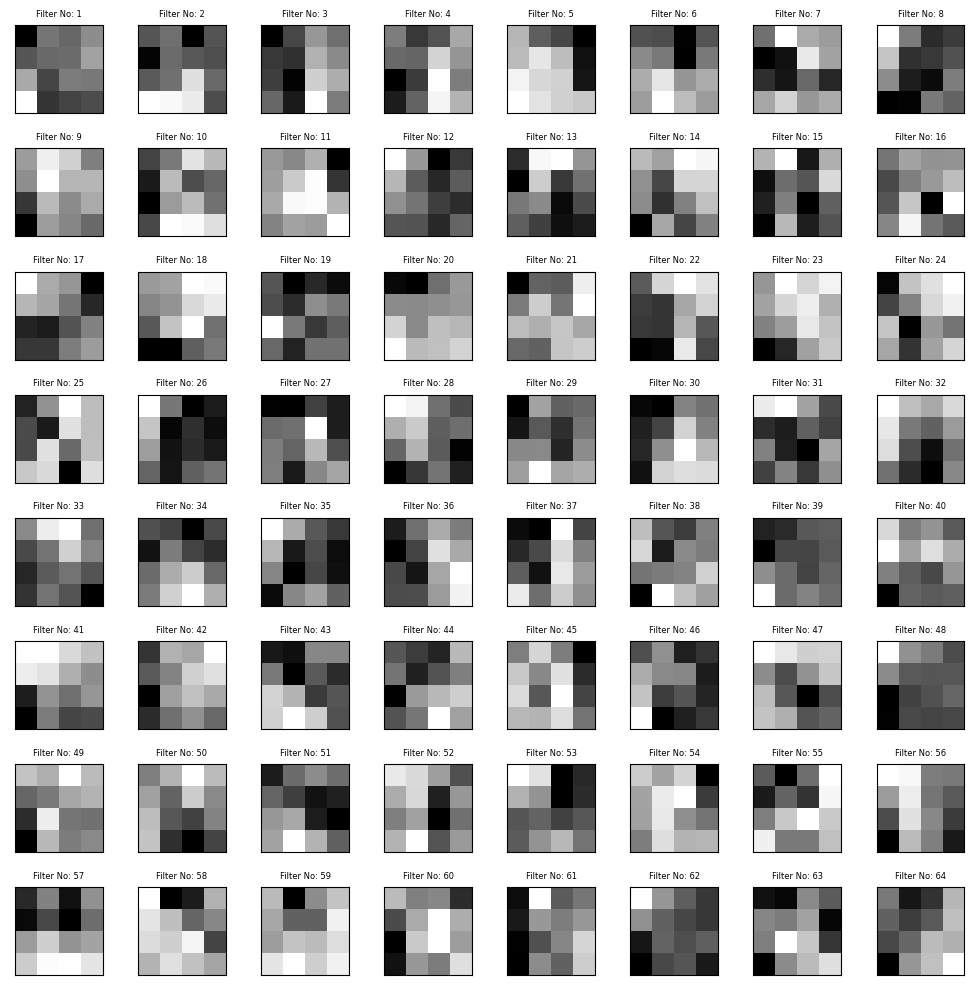


Conv Layer Name: conv2d_1, Channel No: 3


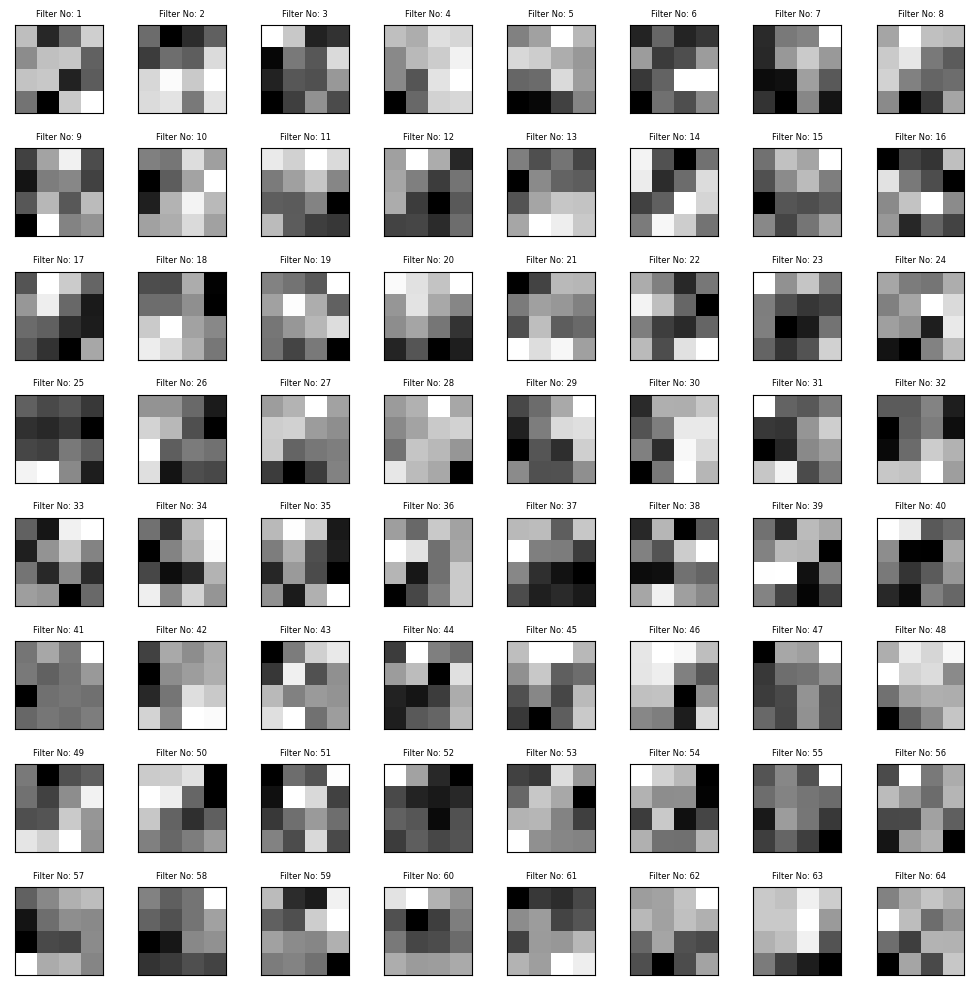


Conv Layer Name: conv2d_1, Channel No: 4


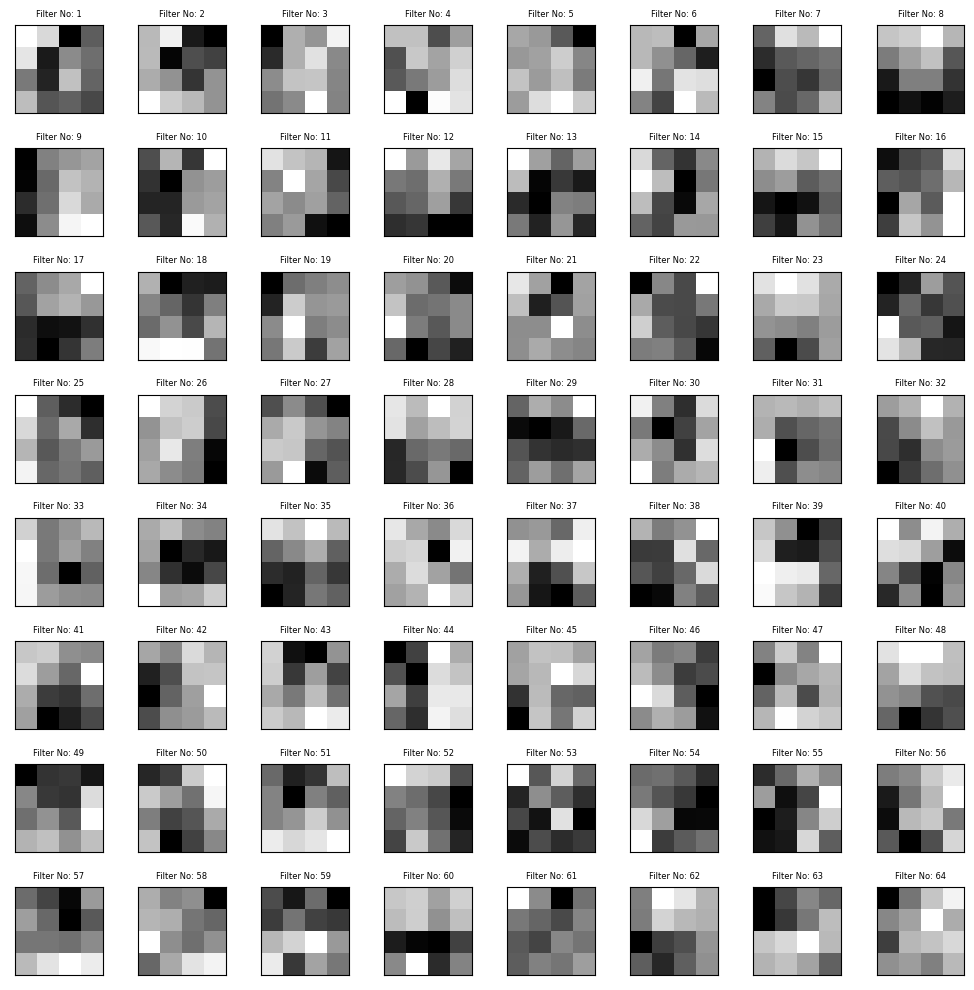


Conv Layer Name: conv2d_1, Channel No: 5


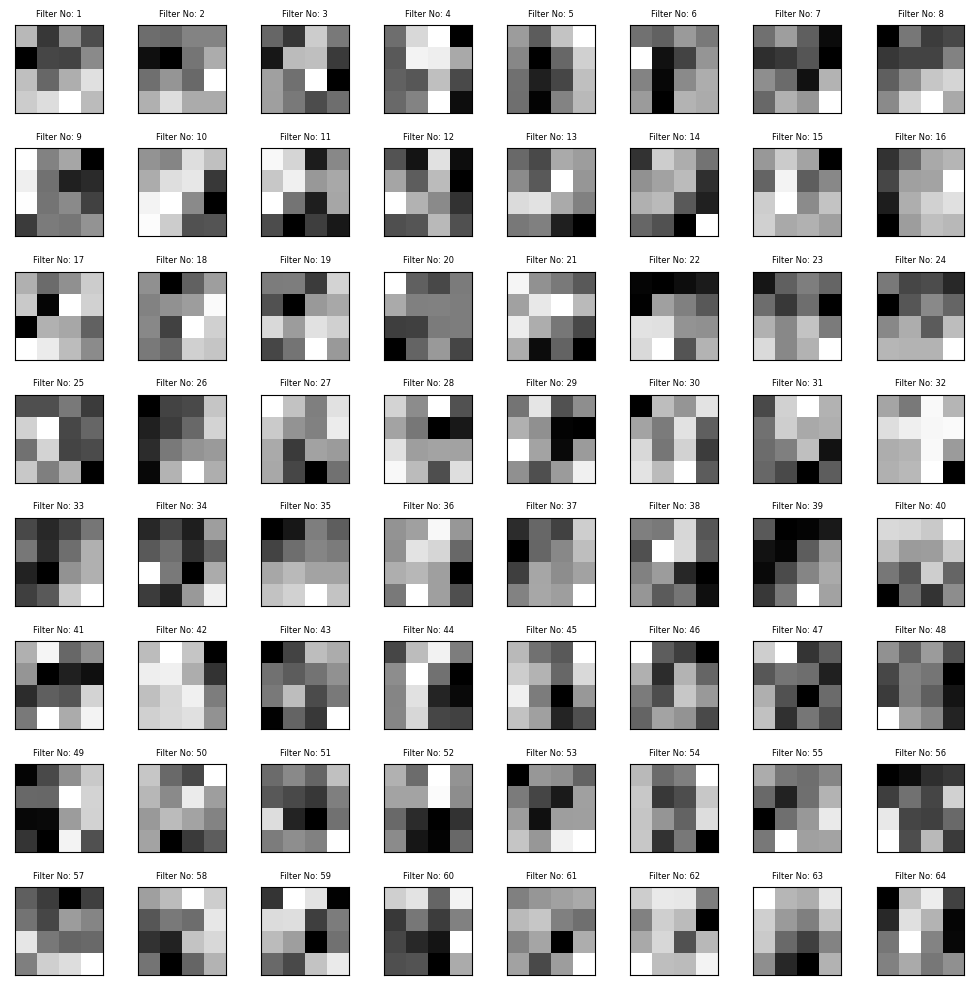


Conv Layer Name: conv2d_1, Channel No: 6


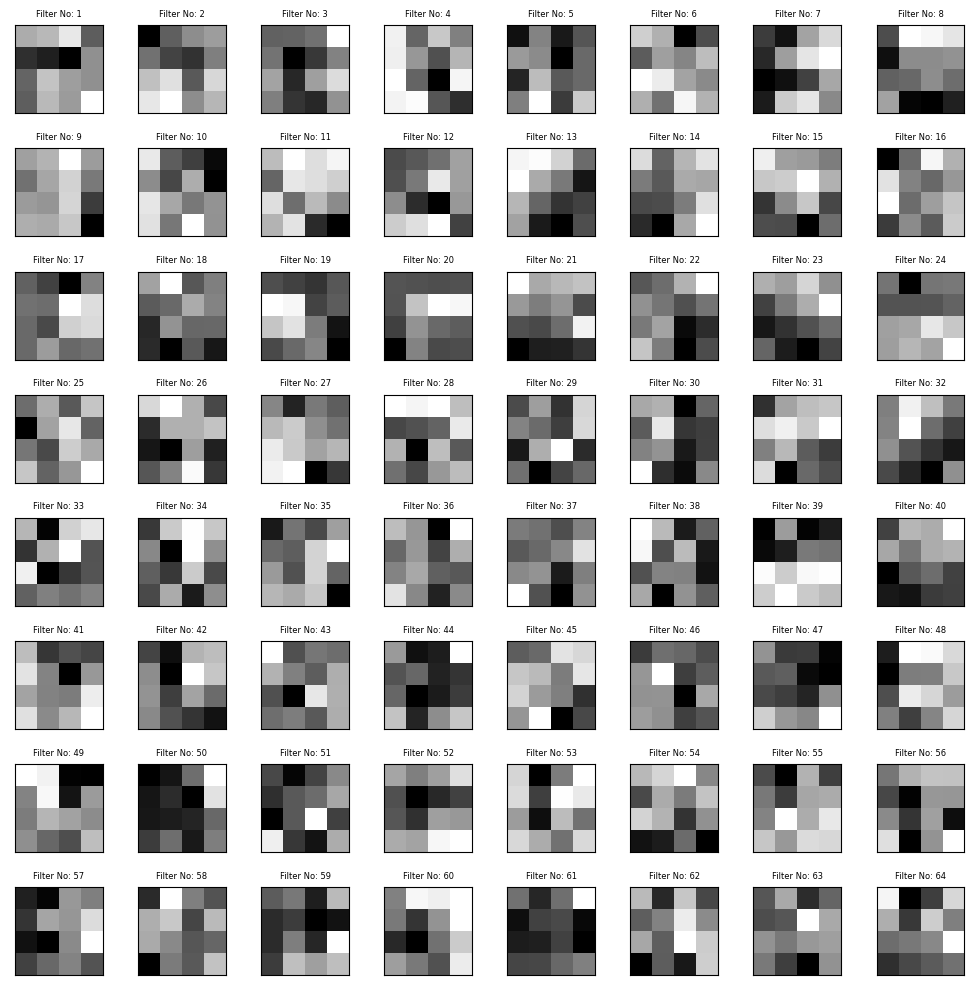


Conv Layer Name: conv2d_1, Channel No: 7


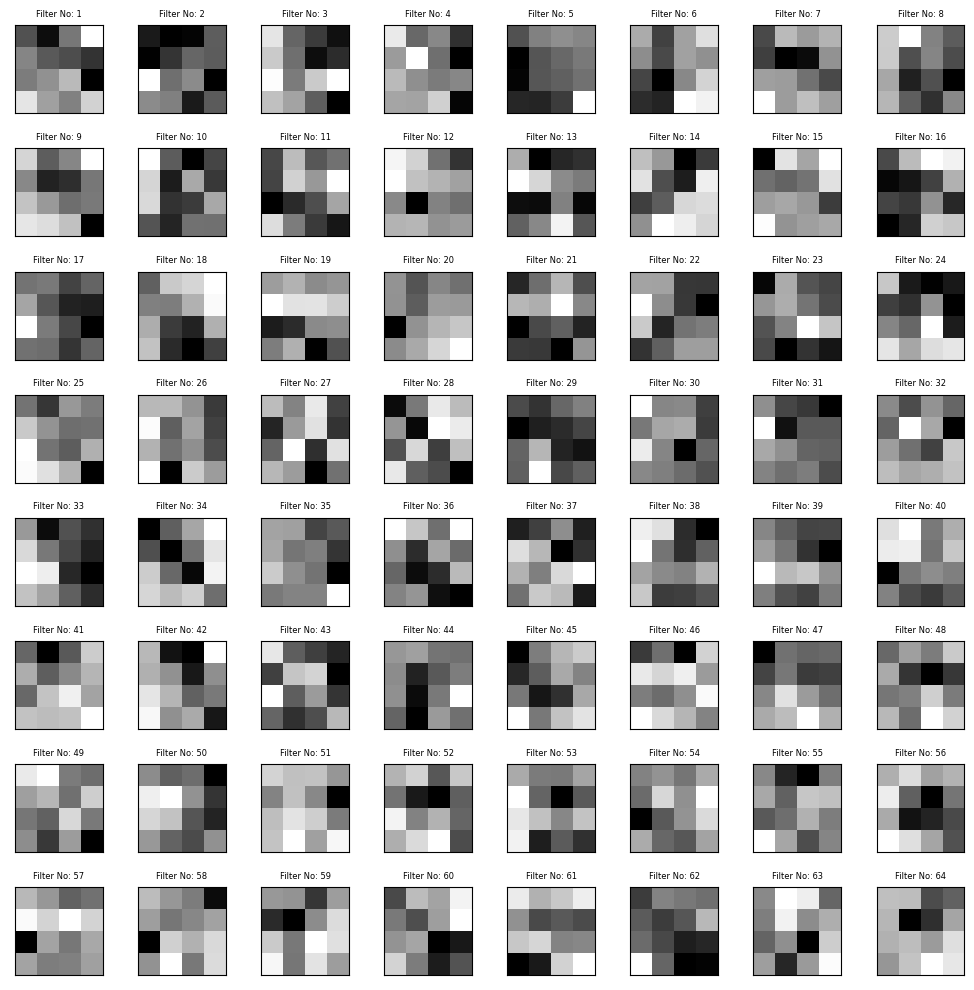


Conv Layer Name: conv2d_1, Channel No: 8


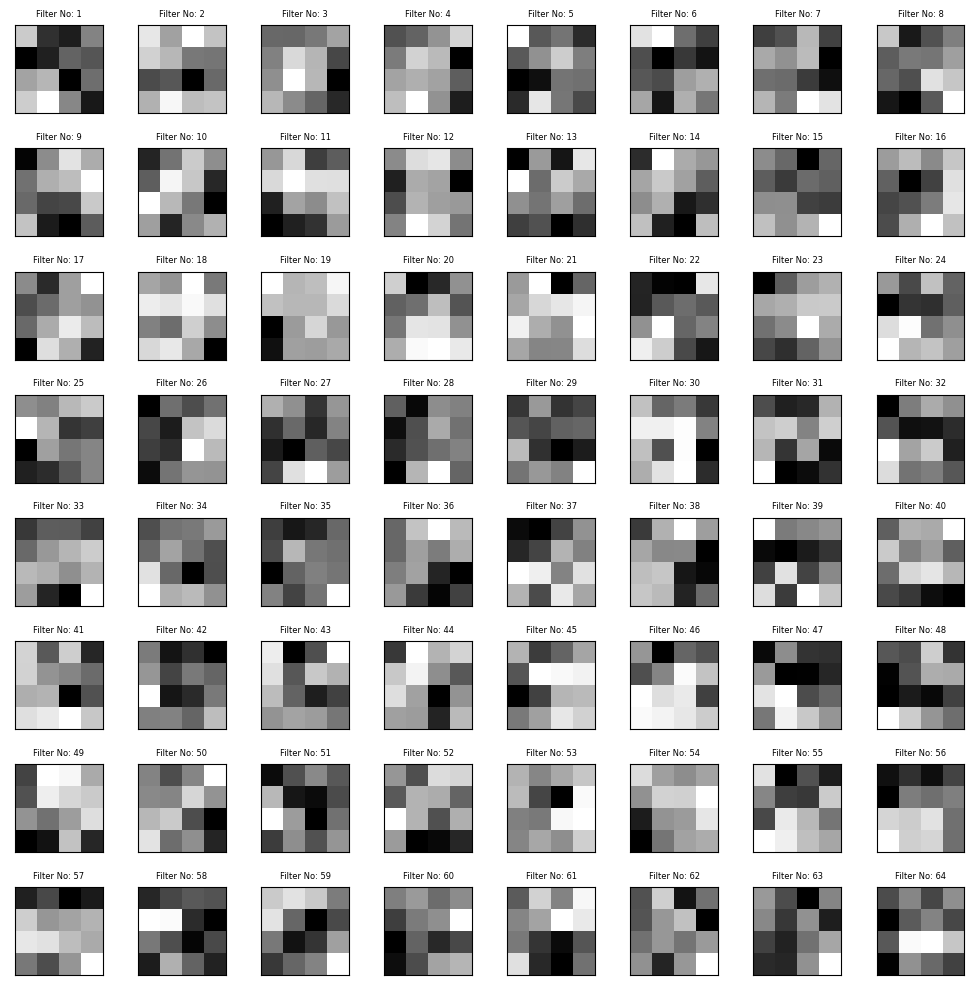


Conv Layer Name: conv2d_1, Channel No: 9


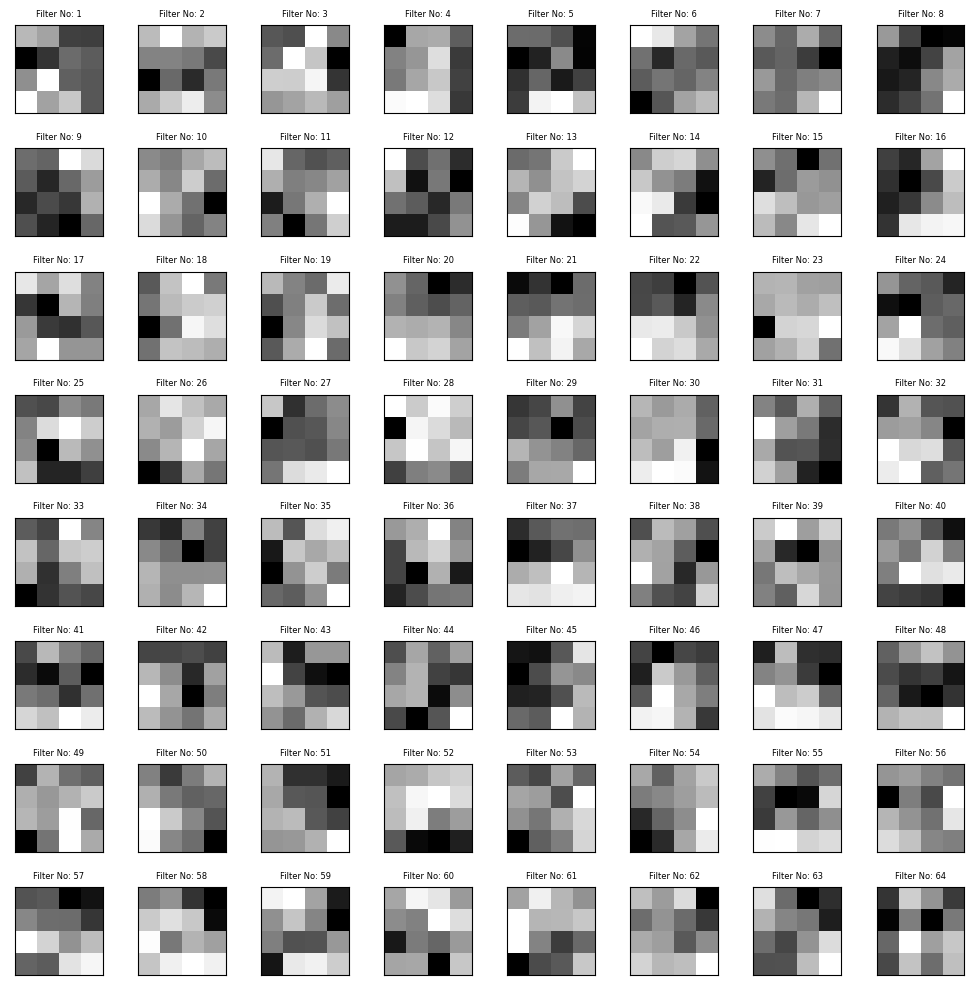


Conv Layer Name: conv2d_1, Channel No: 10


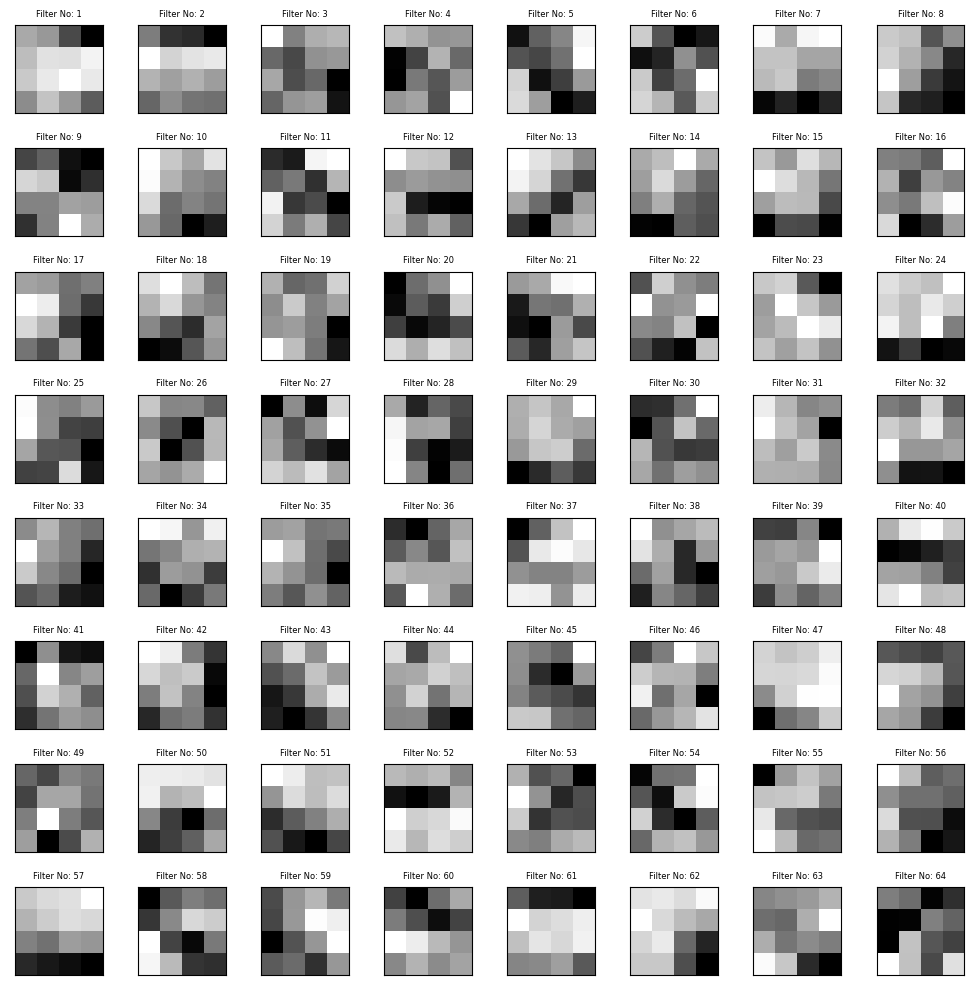


Conv Layer Name: conv2d_1, Channel No: 11


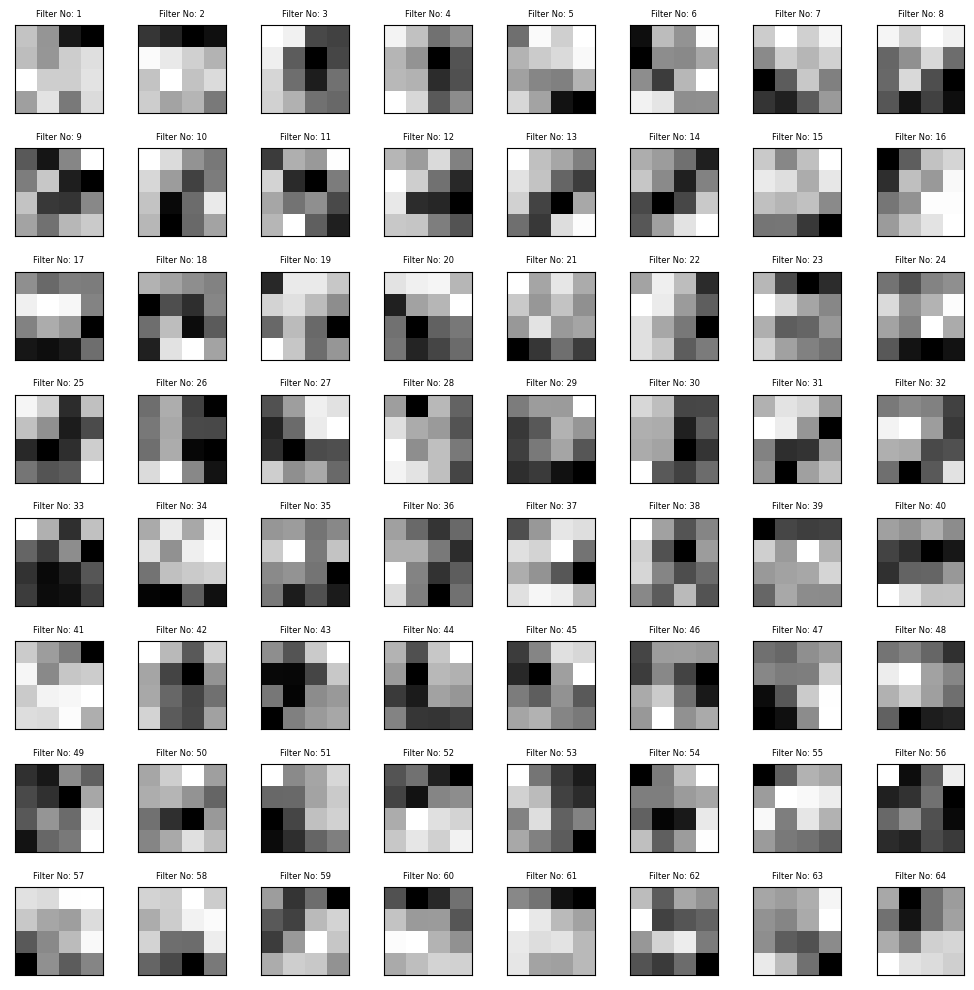


Conv Layer Name: conv2d_1, Channel No: 12


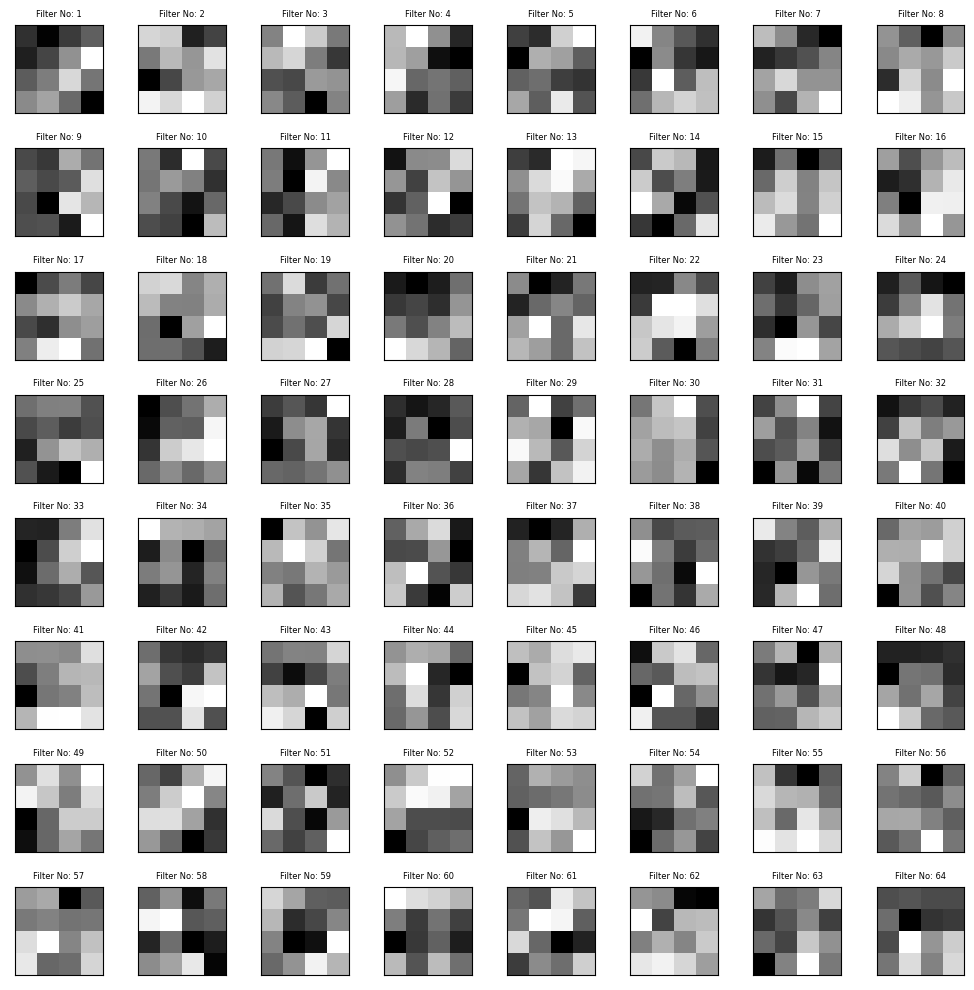


Conv Layer Name: conv2d_1, Channel No: 13


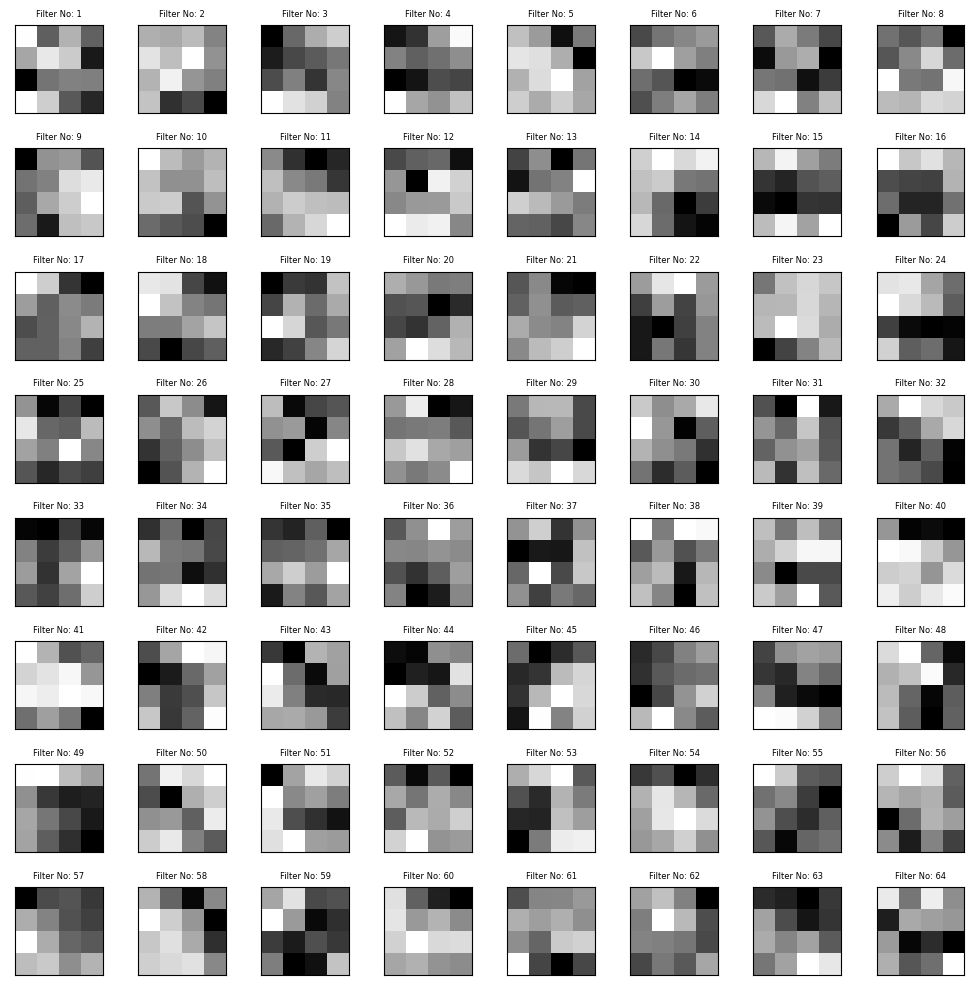


Conv Layer Name: conv2d_1, Channel No: 14


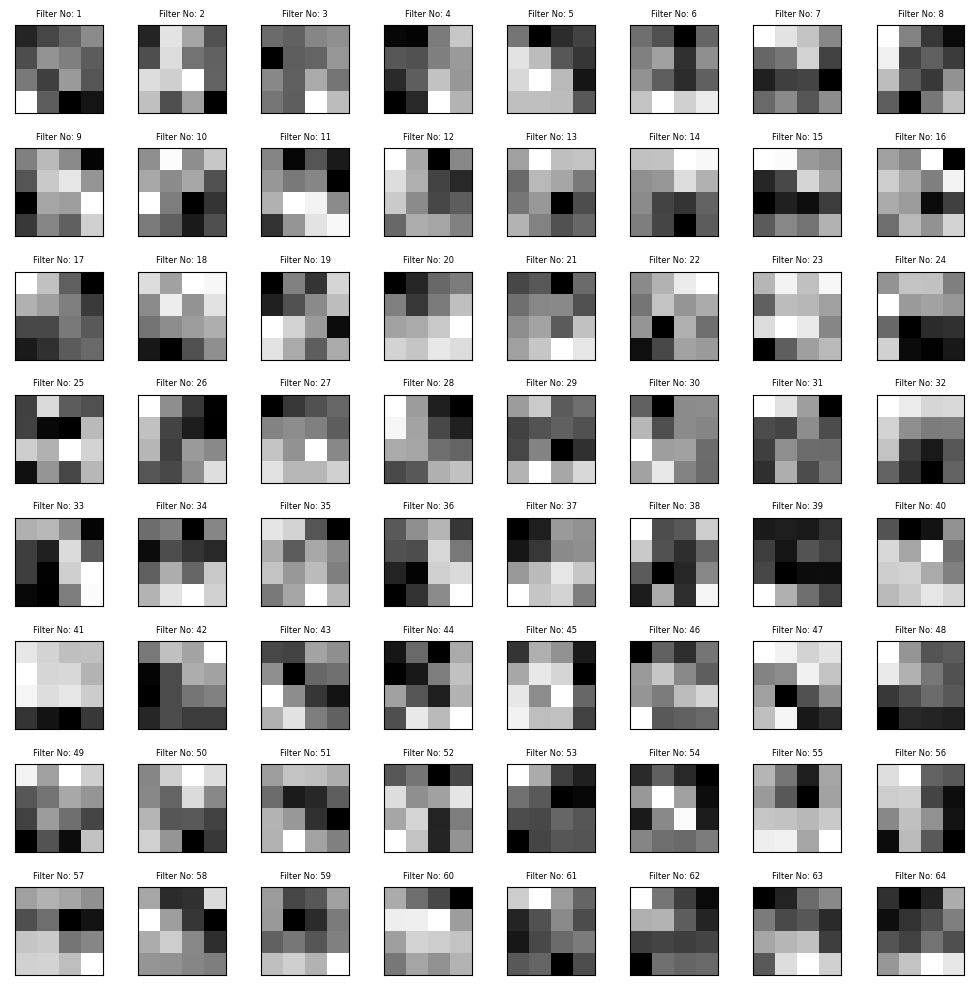


Conv Layer Name: conv2d_1, Channel No: 15


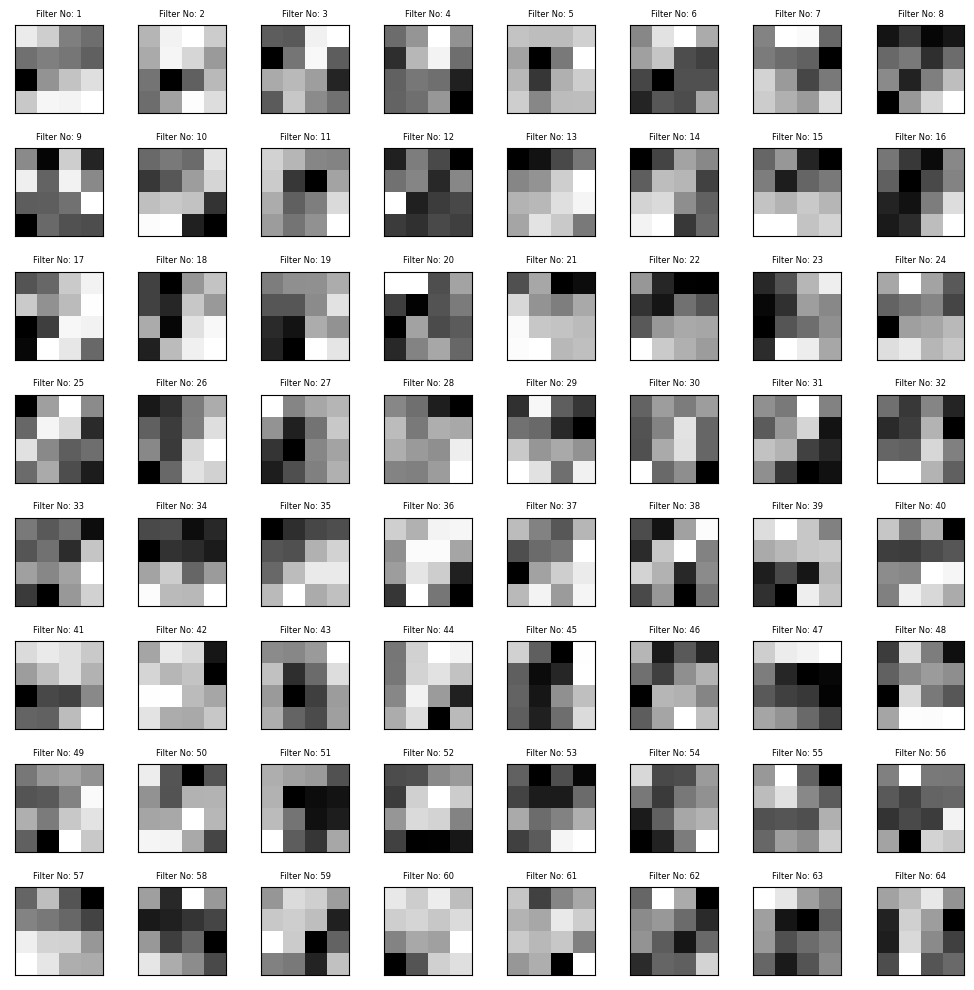


Conv Layer Name: conv2d_1, Channel No: 16


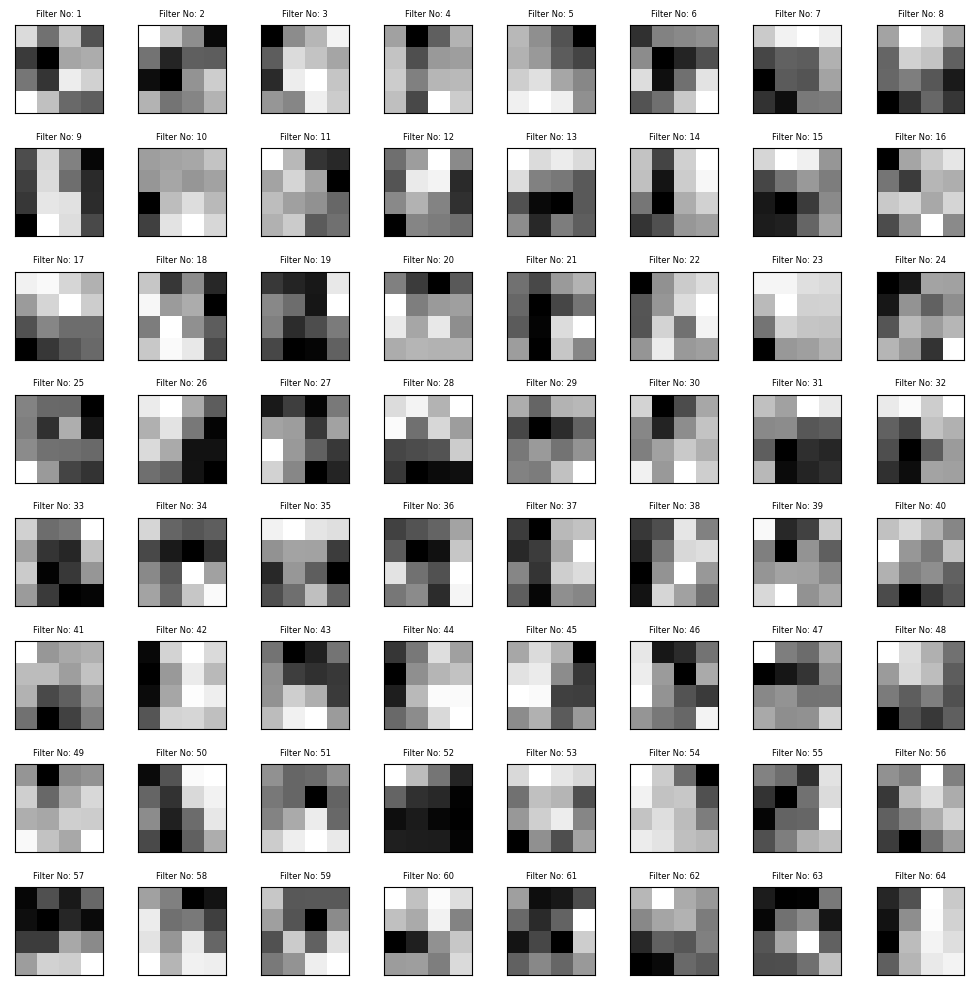


Conv Layer Name: conv2d_1, Channel No: 17


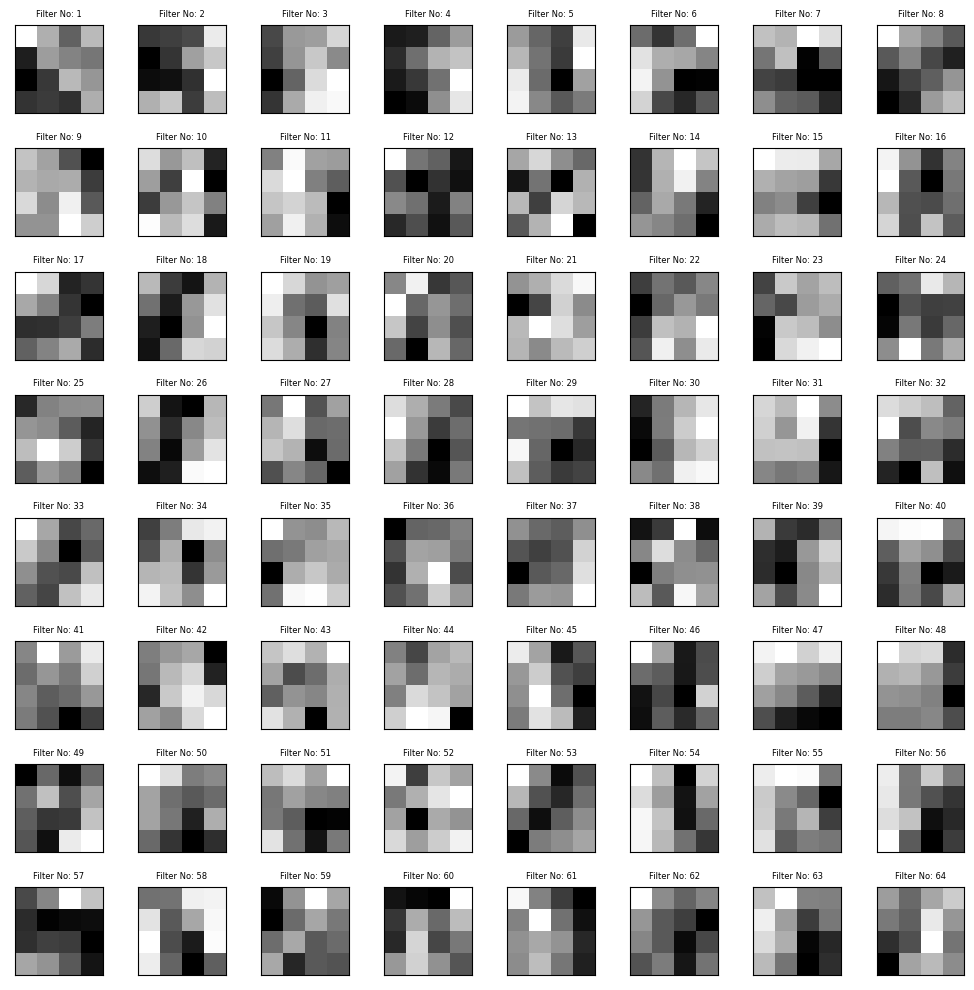


Conv Layer Name: conv2d_1, Channel No: 18


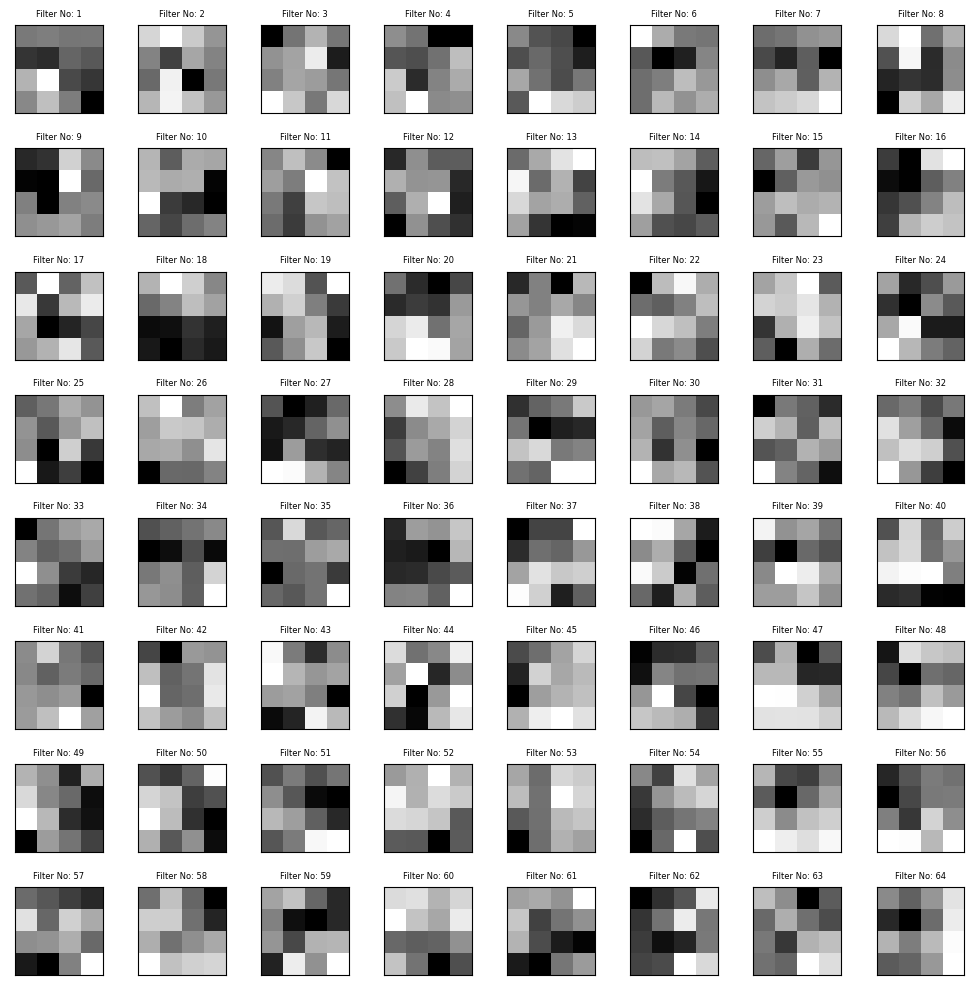


Conv Layer Name: conv2d_1, Channel No: 19


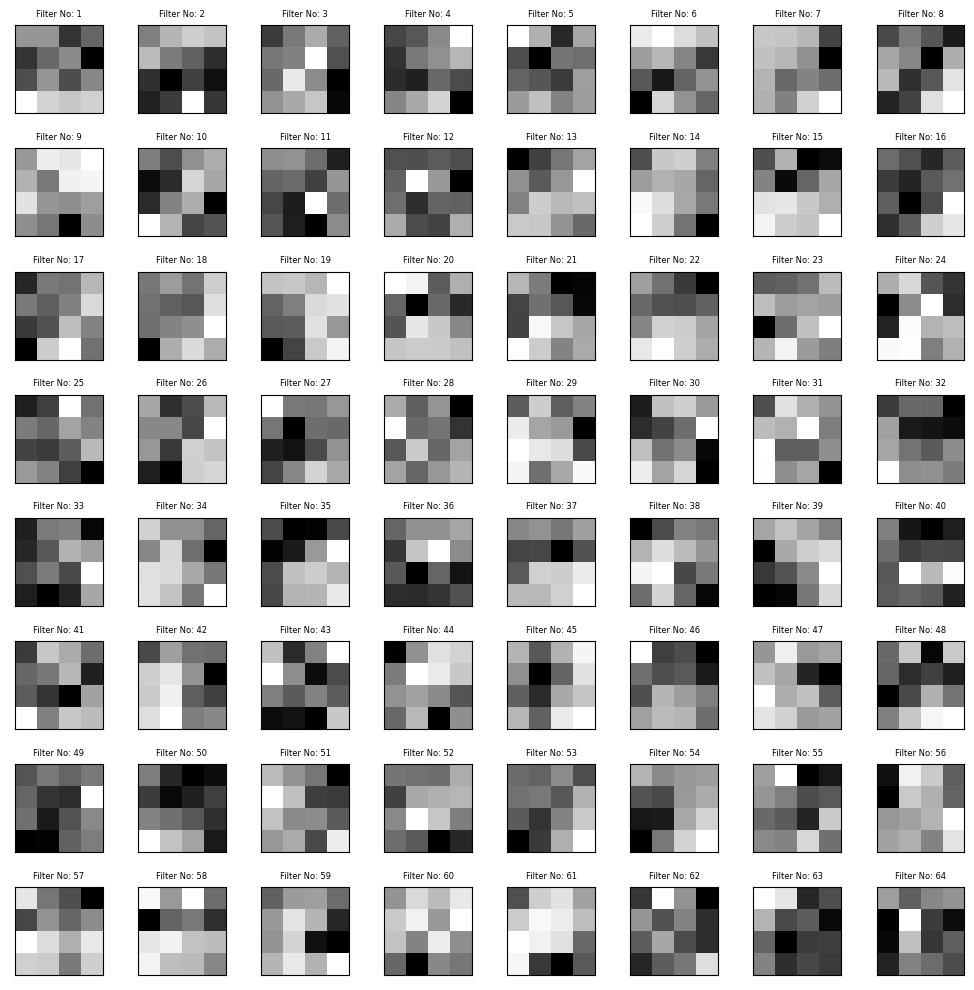


Conv Layer Name: conv2d_1, Channel No: 20


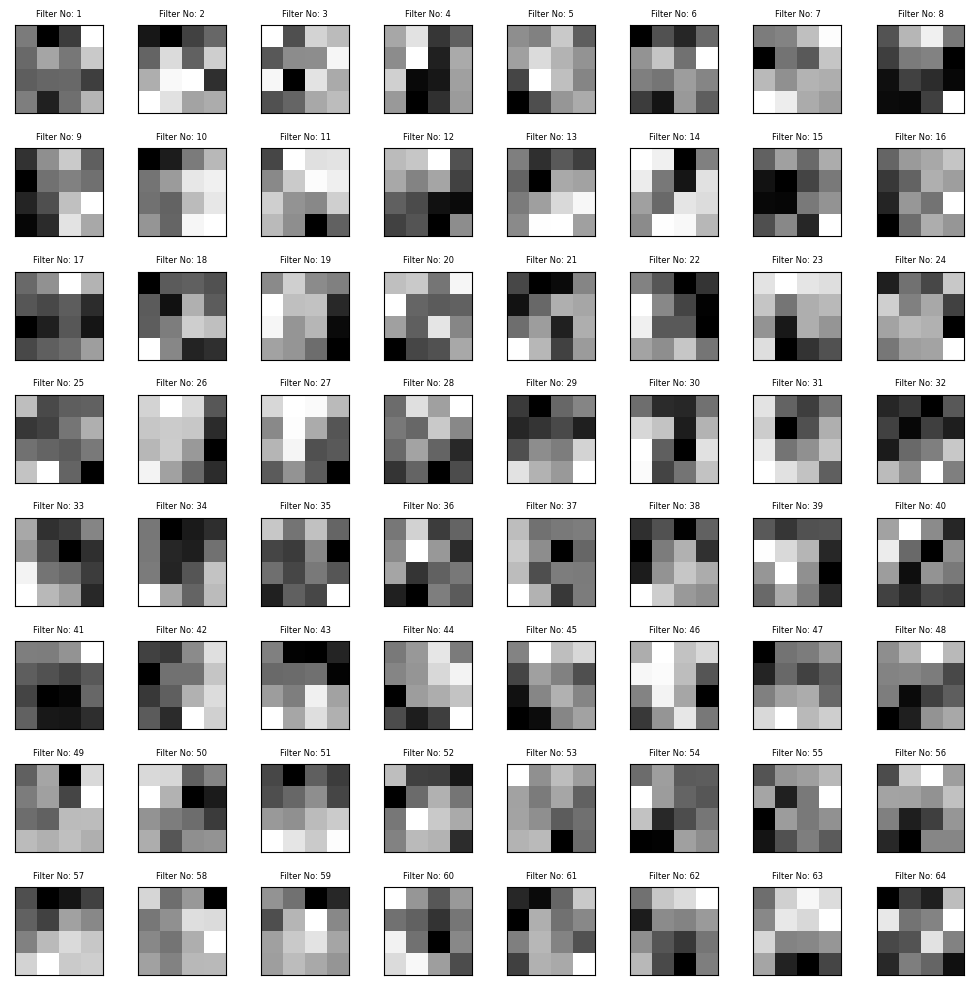


Conv Layer Name: conv2d_1, Channel No: 21


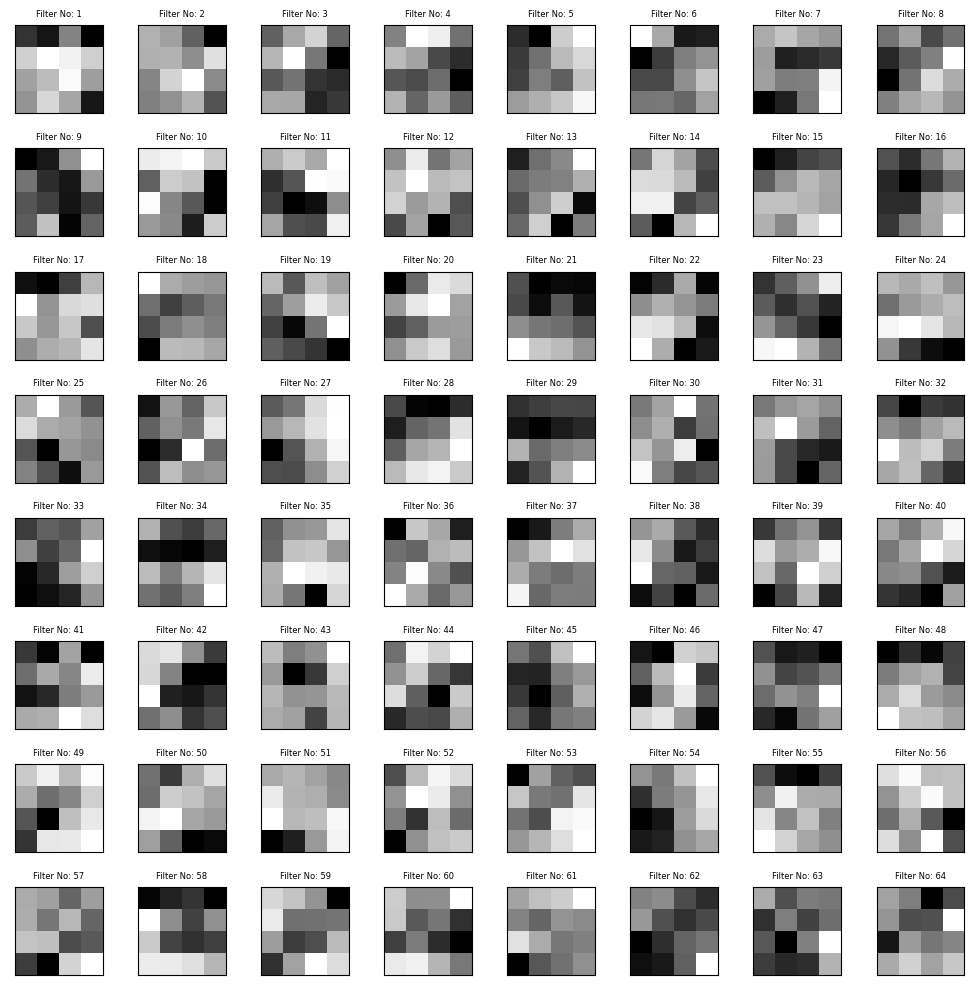


Conv Layer Name: conv2d_1, Channel No: 22


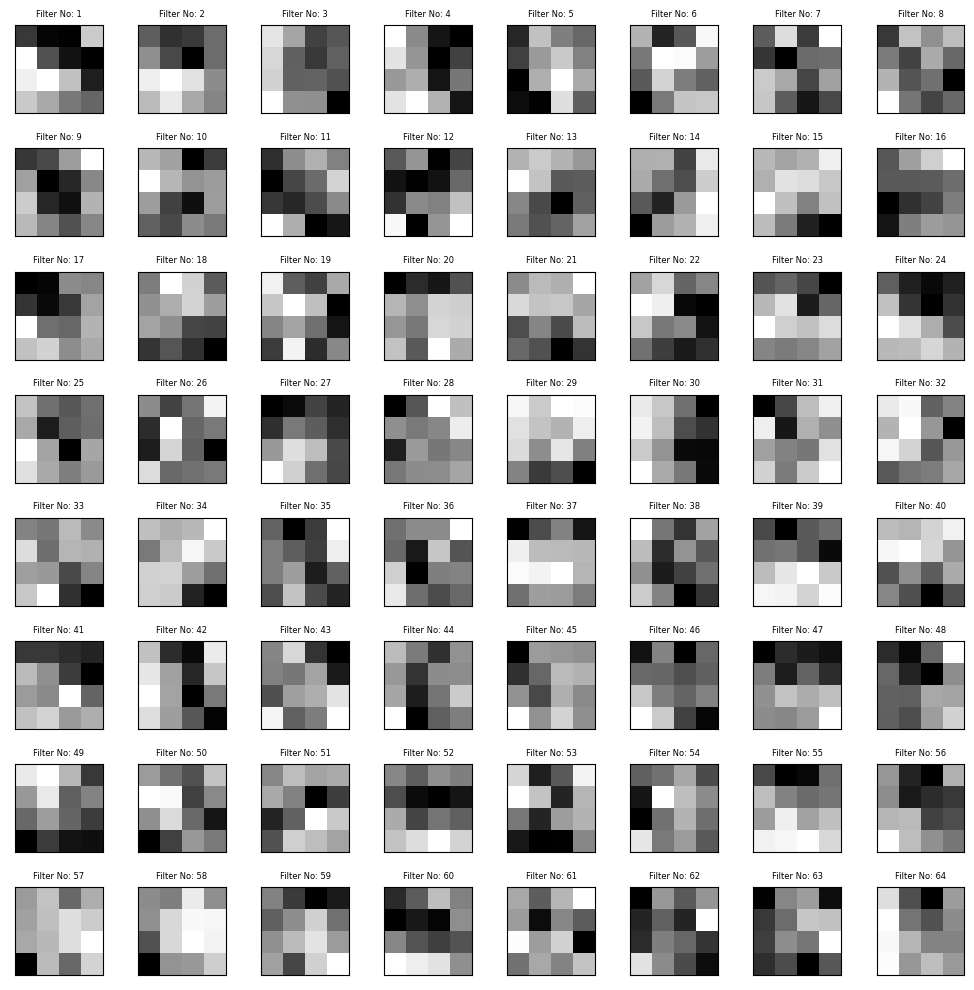


Conv Layer Name: conv2d_1, Channel No: 23


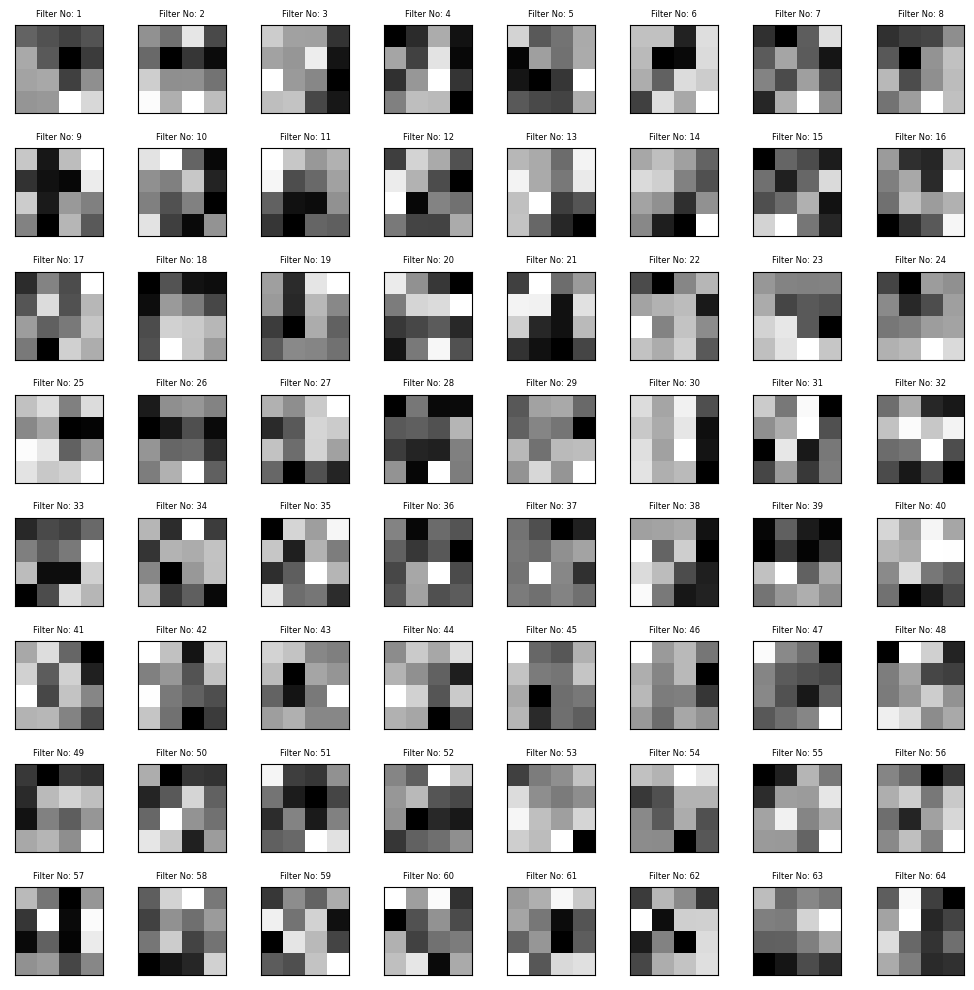


Conv Layer Name: conv2d_1, Channel No: 24


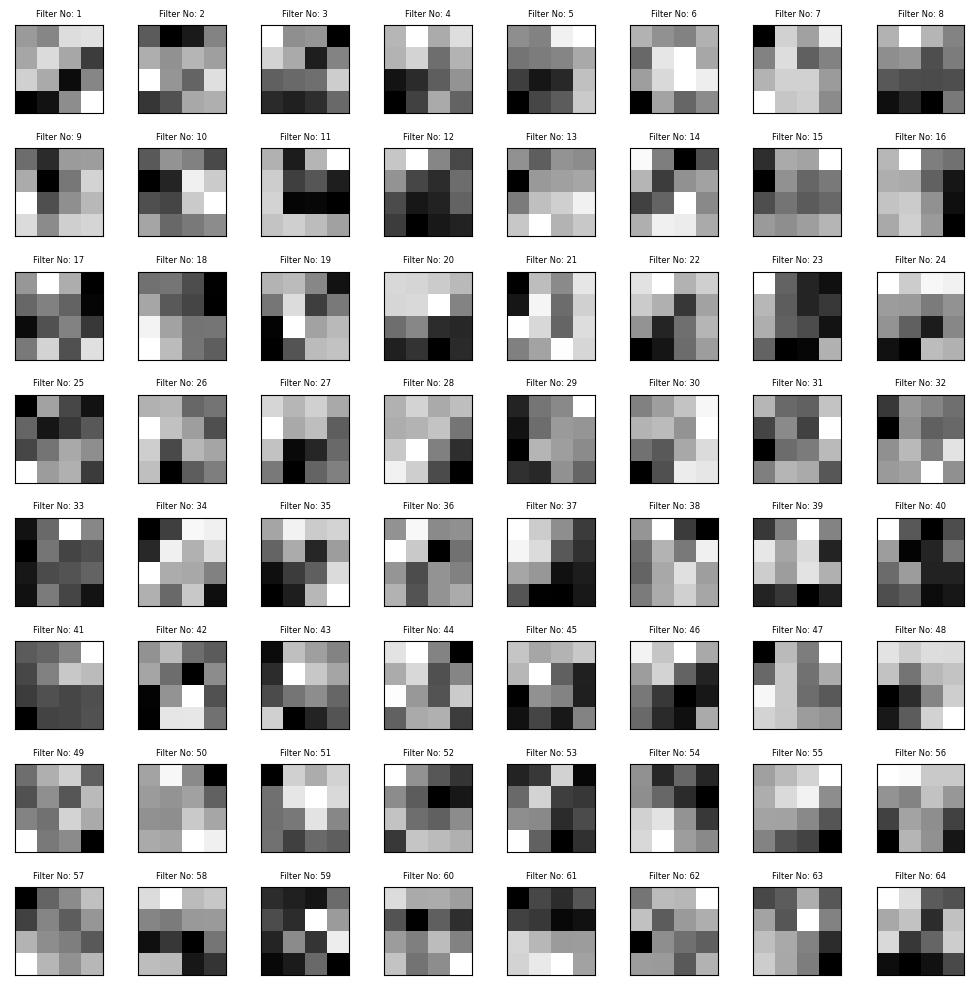


Conv Layer Name: conv2d_1, Channel No: 25


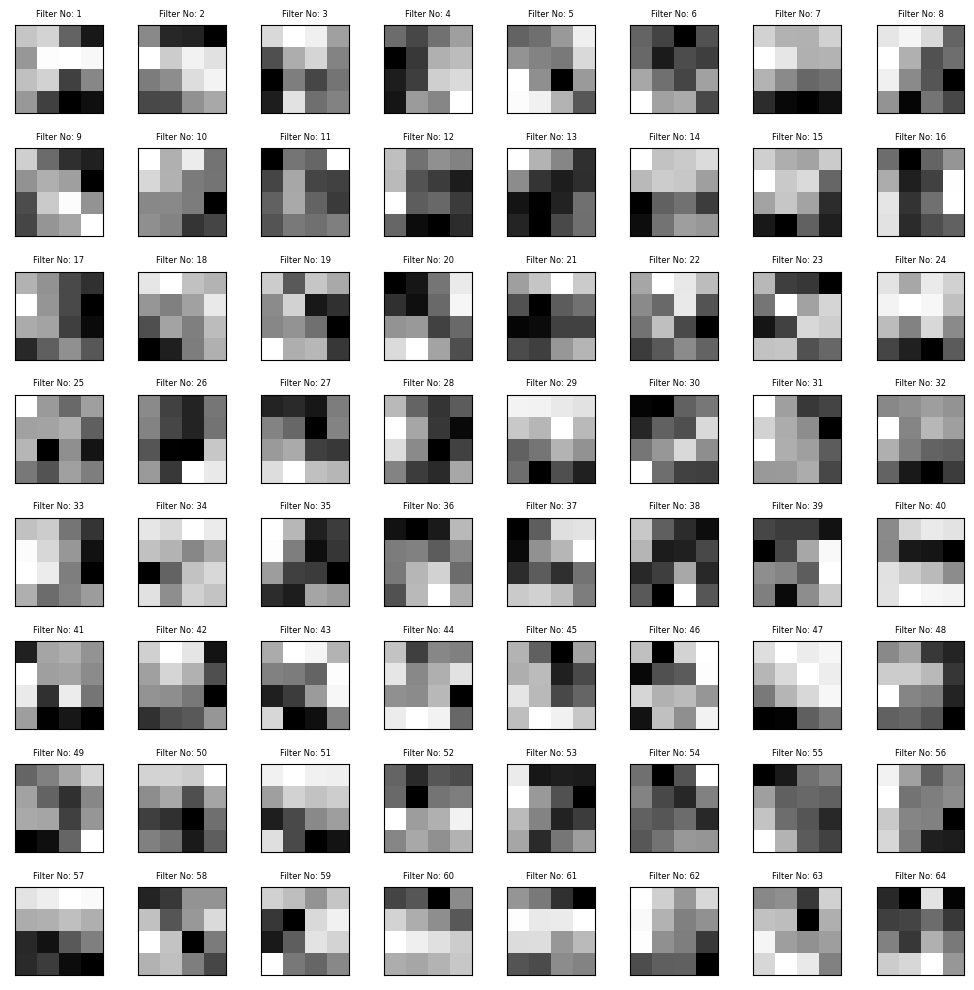


Conv Layer Name: conv2d_1, Channel No: 26


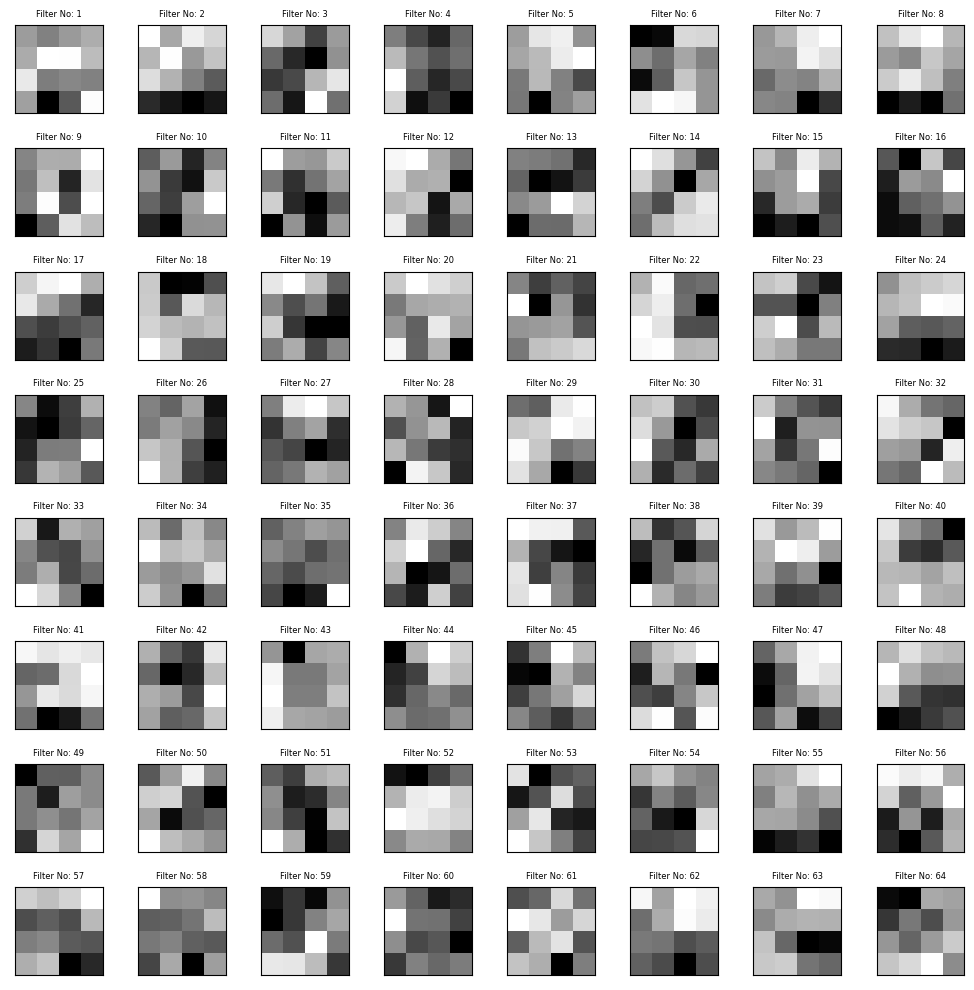


Conv Layer Name: conv2d_1, Channel No: 27


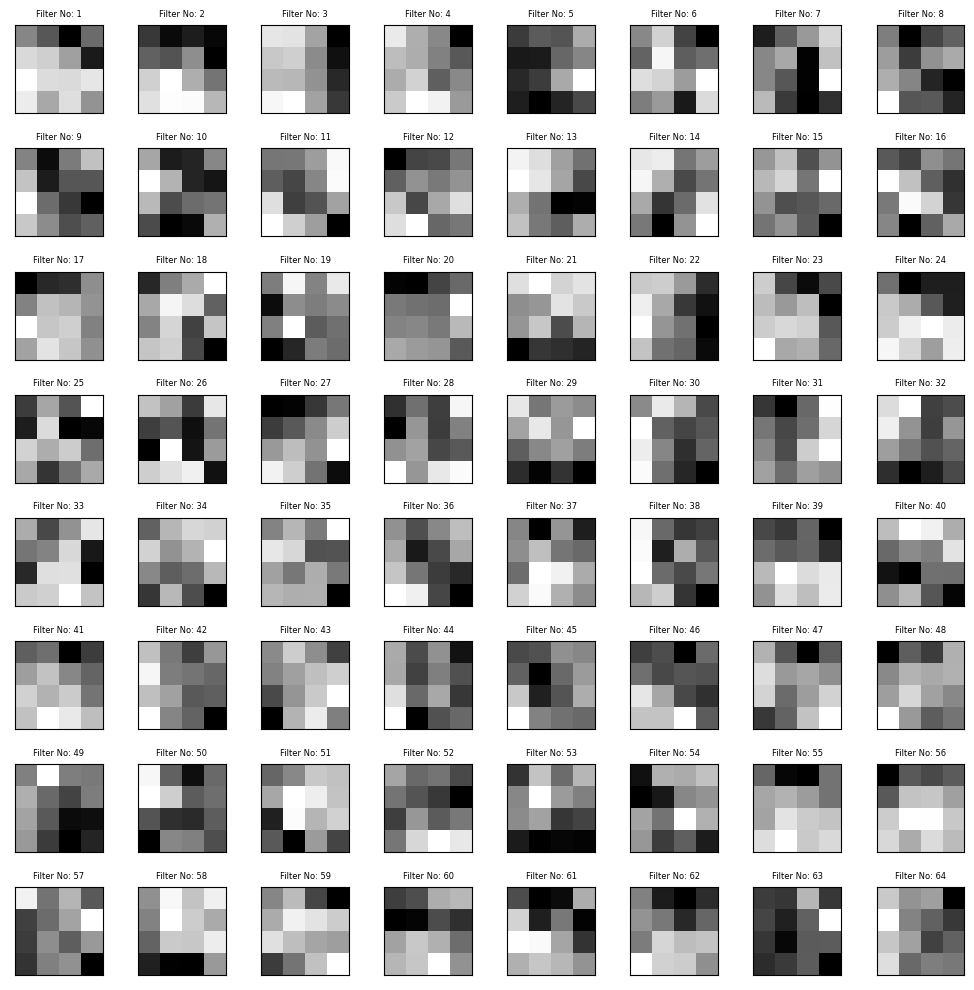


Conv Layer Name: conv2d_1, Channel No: 28


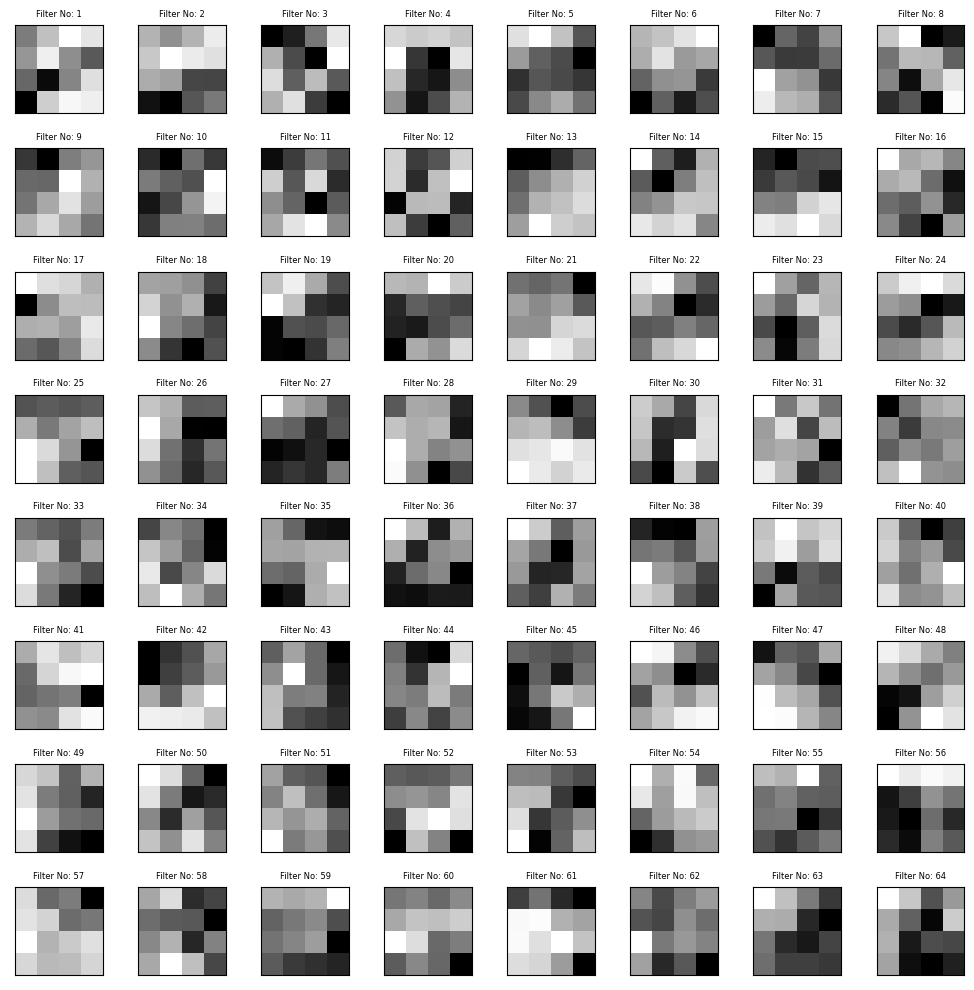


Conv Layer Name: conv2d_1, Channel No: 29


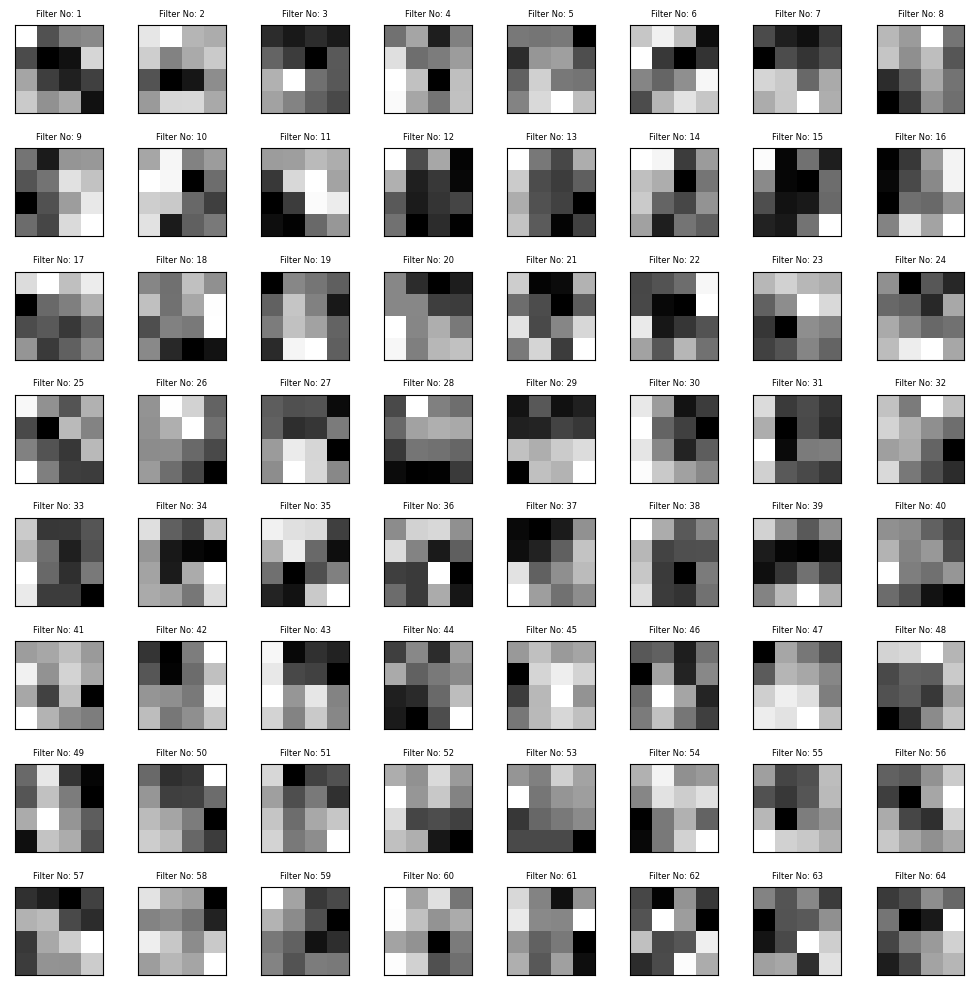


Conv Layer Name: conv2d_1, Channel No: 30


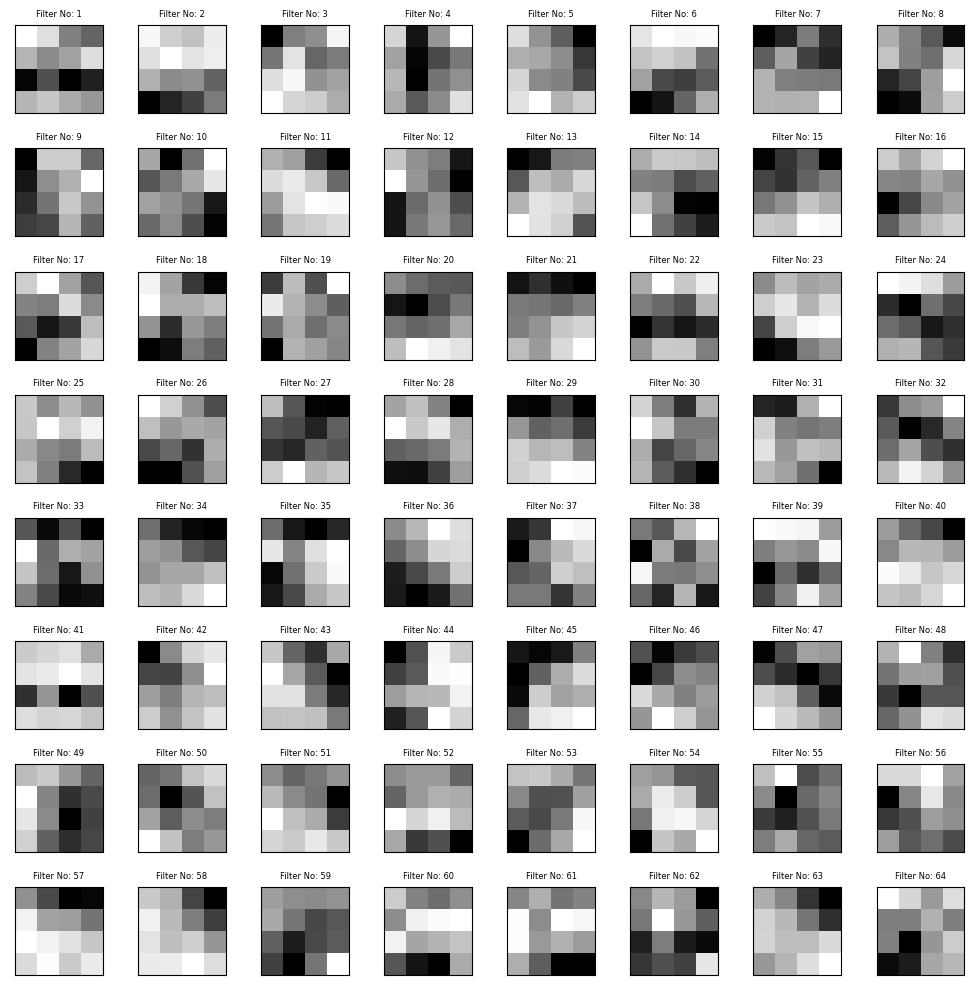


Conv Layer Name: conv2d_1, Channel No: 31


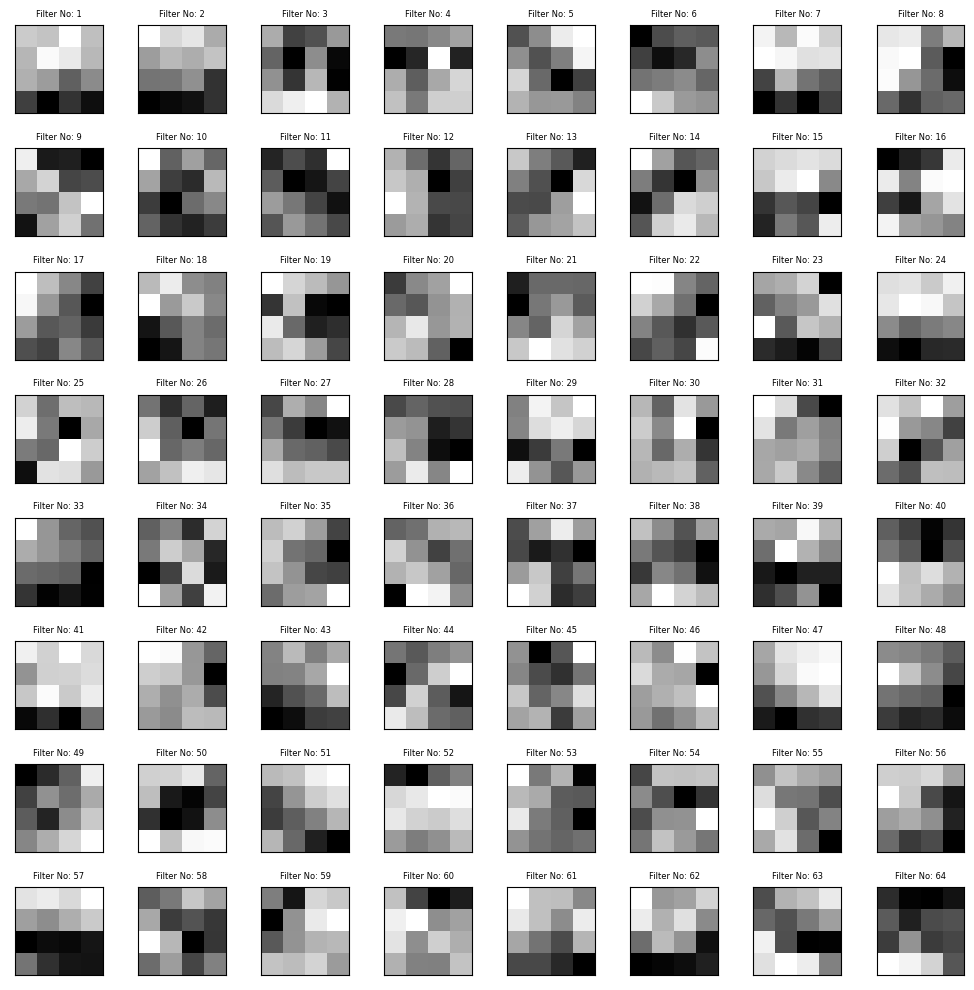


Conv Layer Name: conv2d_1, Channel No: 32


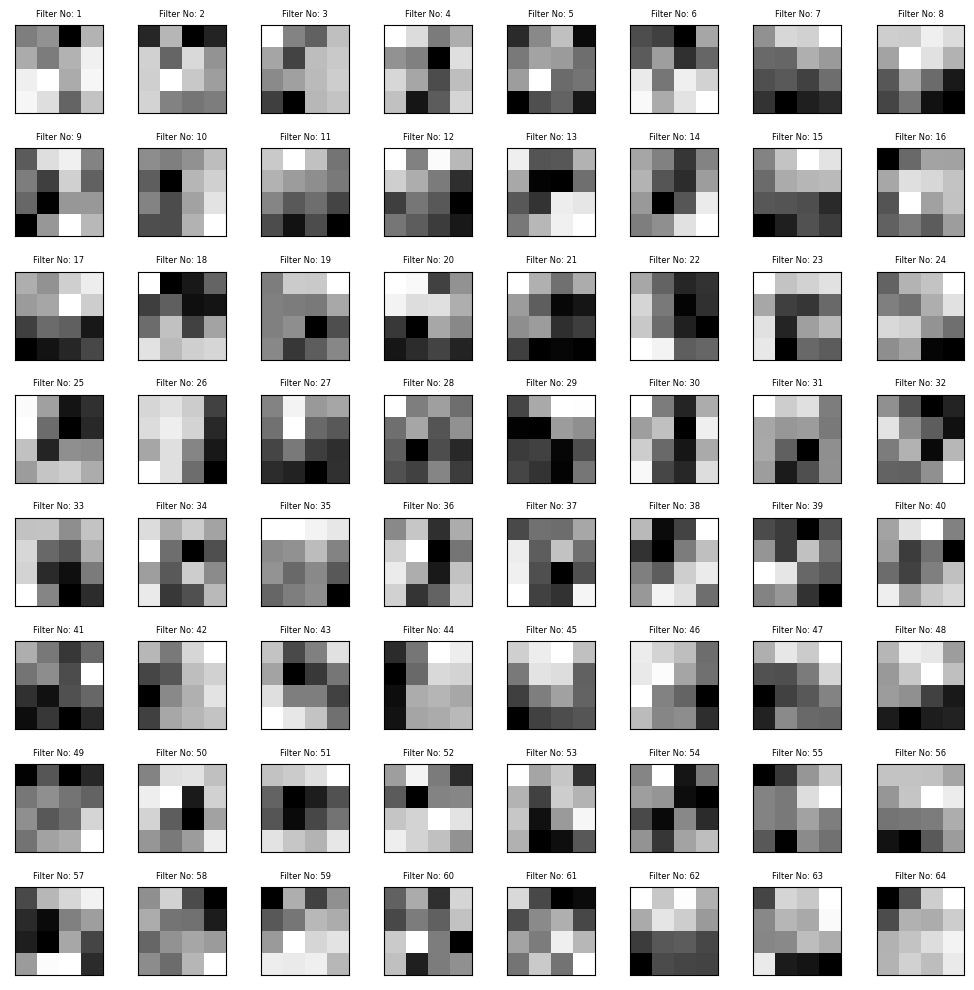

Conv Layer Name: conv2d_2, No of Channels: 64, No of Filters per channel: 128, Filter Size: (4, 4)

Conv Layer Name: conv2d_2, Channel No: 1


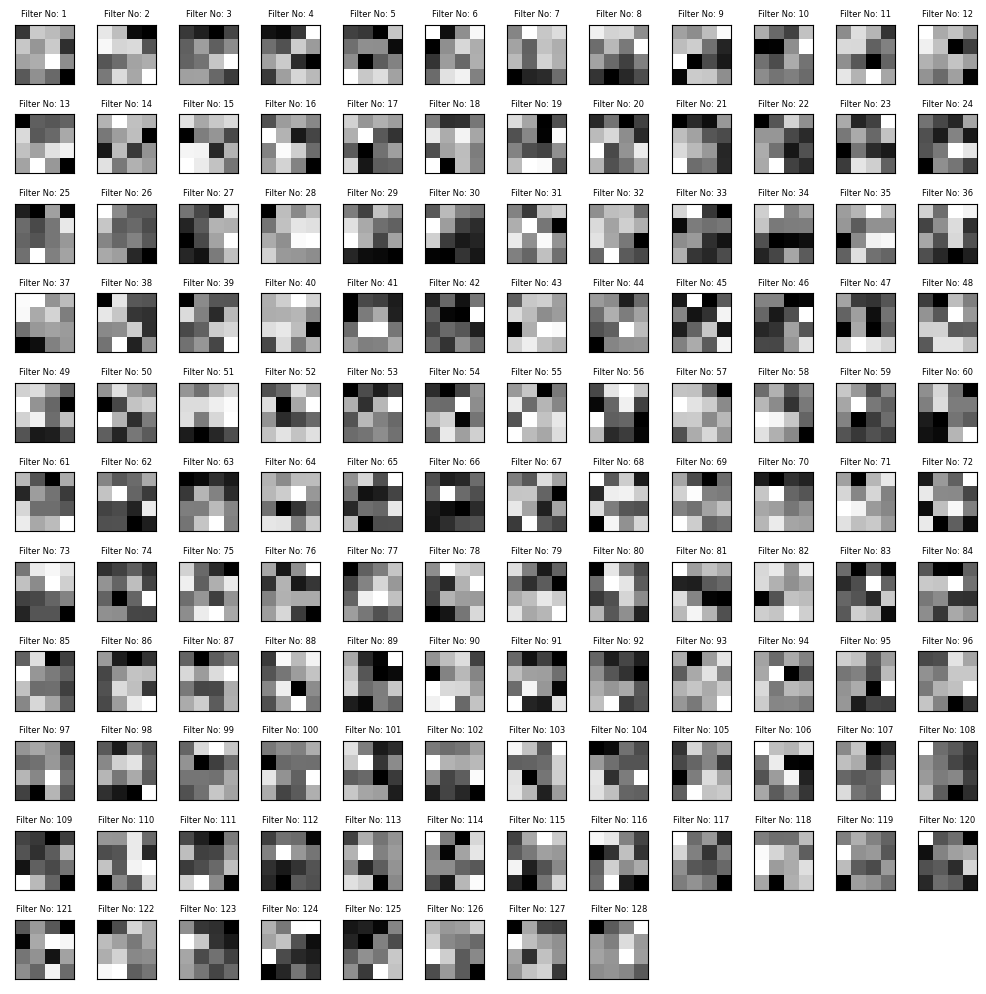


Conv Layer Name: conv2d_2, Channel No: 2


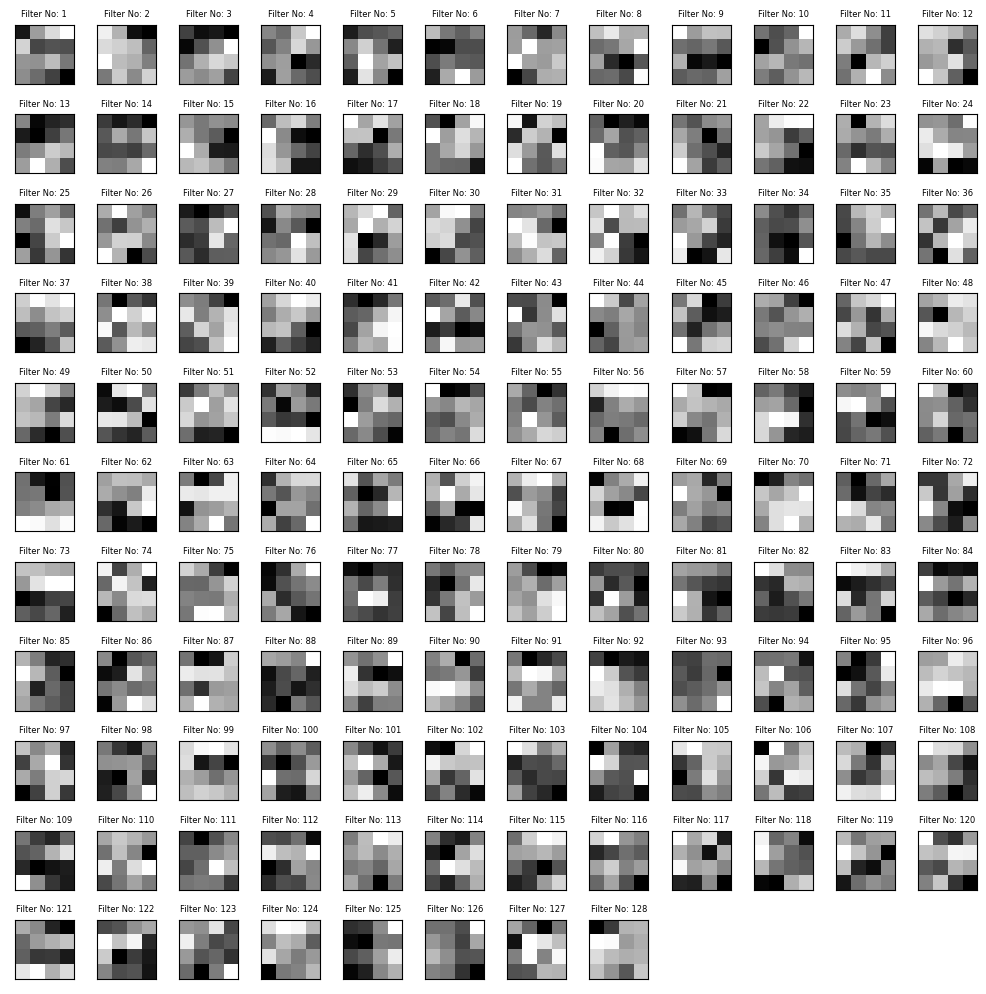


Conv Layer Name: conv2d_2, Channel No: 3


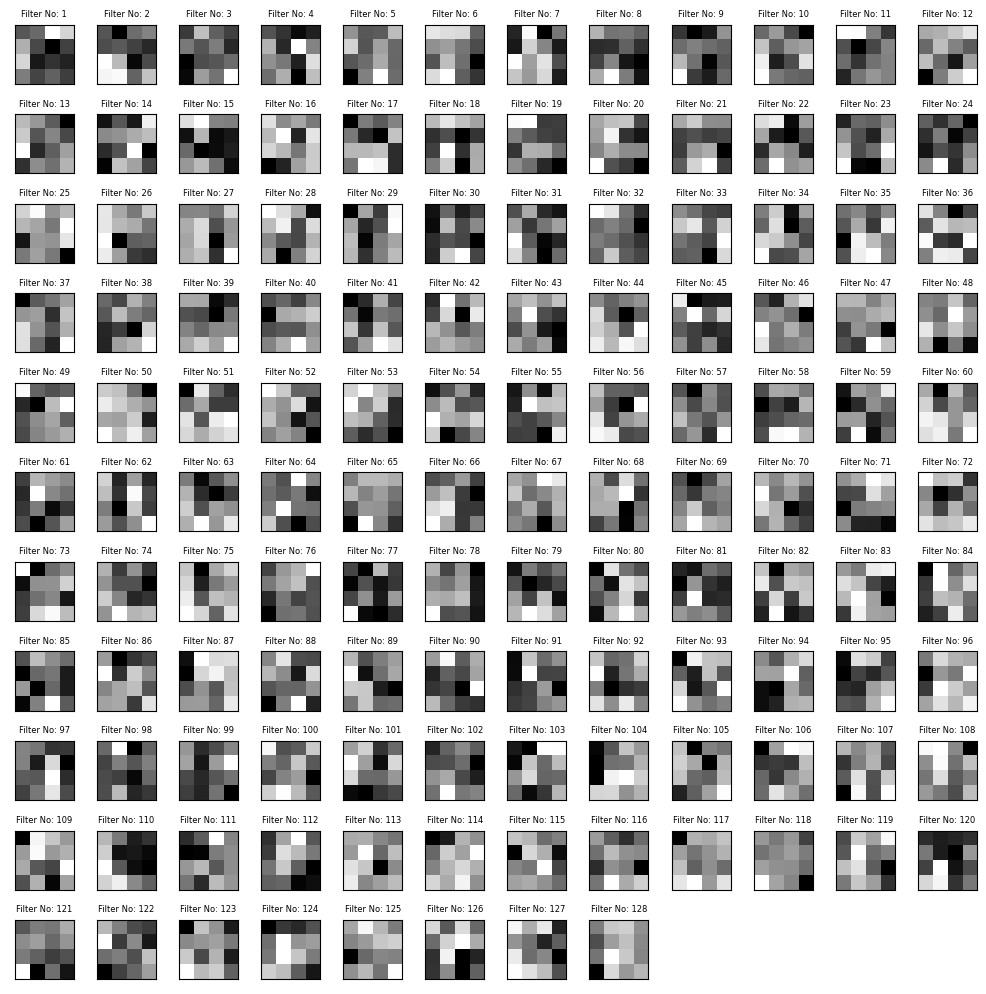


Conv Layer Name: conv2d_2, Channel No: 4


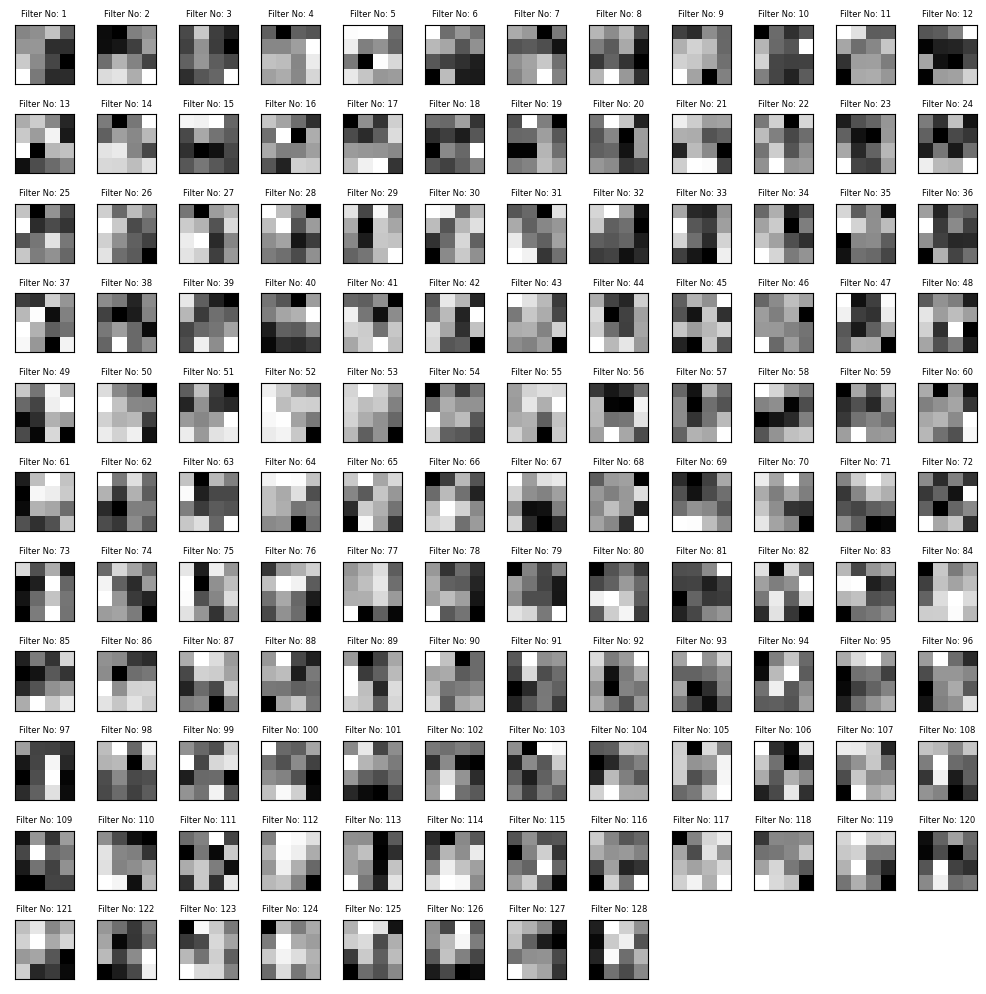


Conv Layer Name: conv2d_2, Channel No: 5


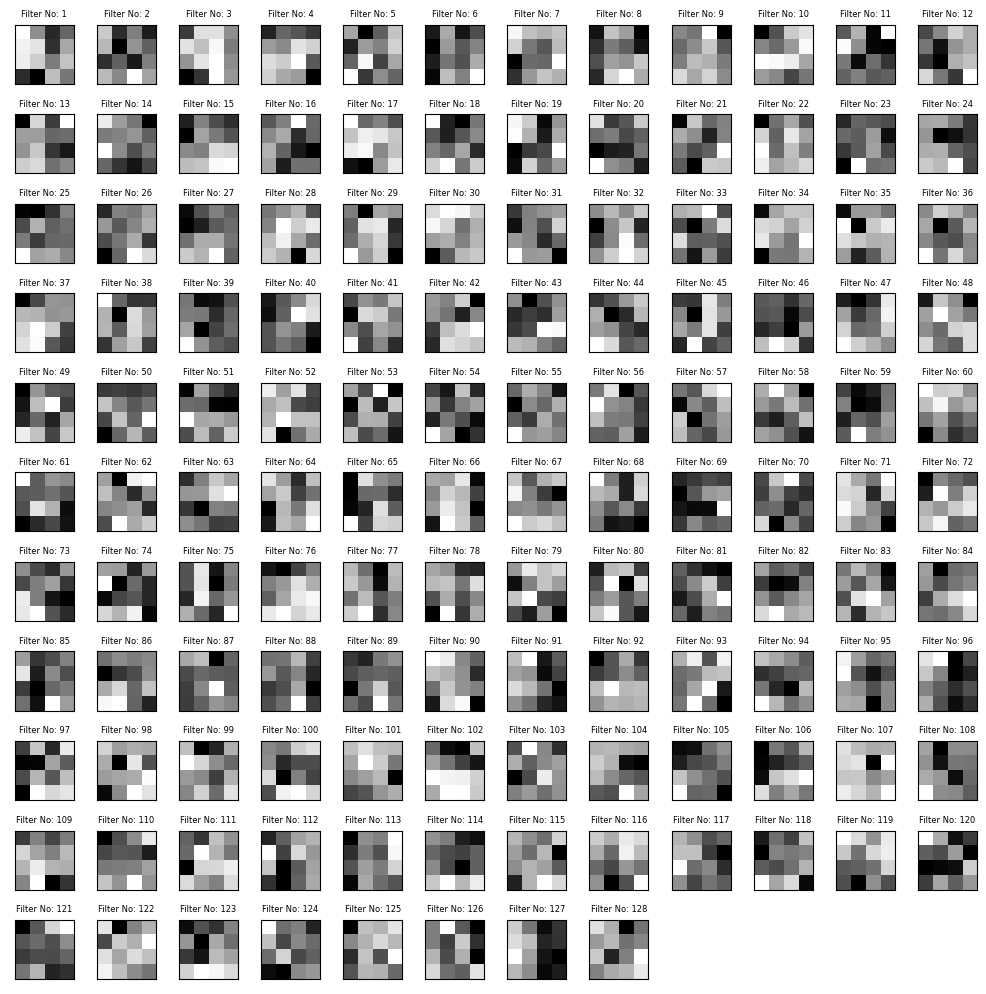


Conv Layer Name: conv2d_2, Channel No: 6


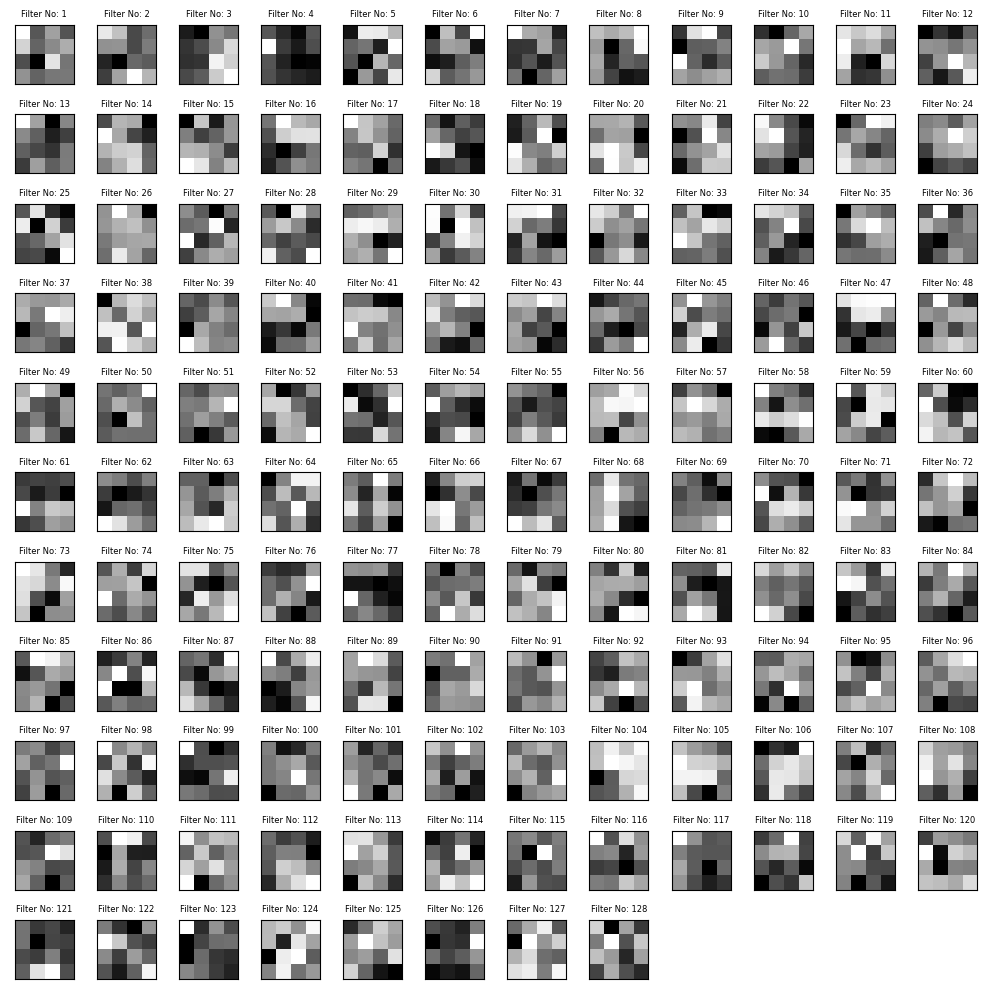


Conv Layer Name: conv2d_2, Channel No: 7


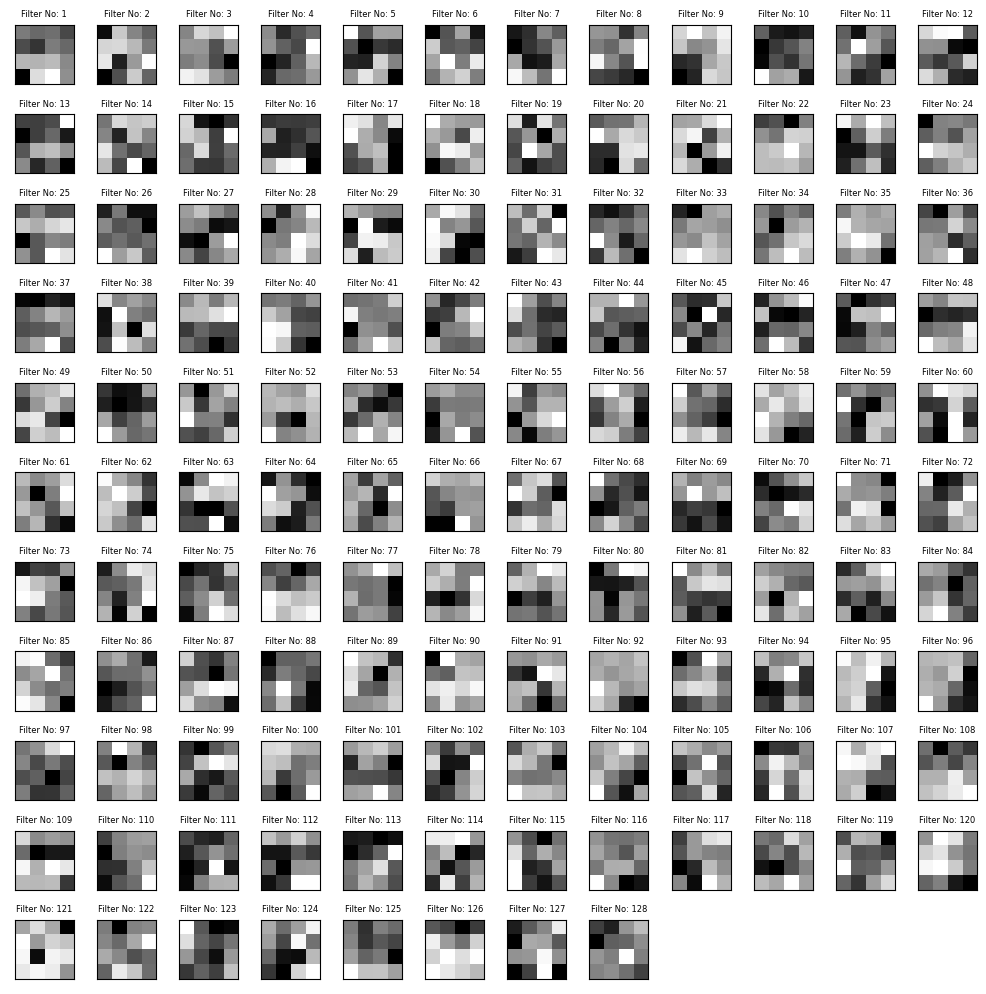


Conv Layer Name: conv2d_2, Channel No: 8


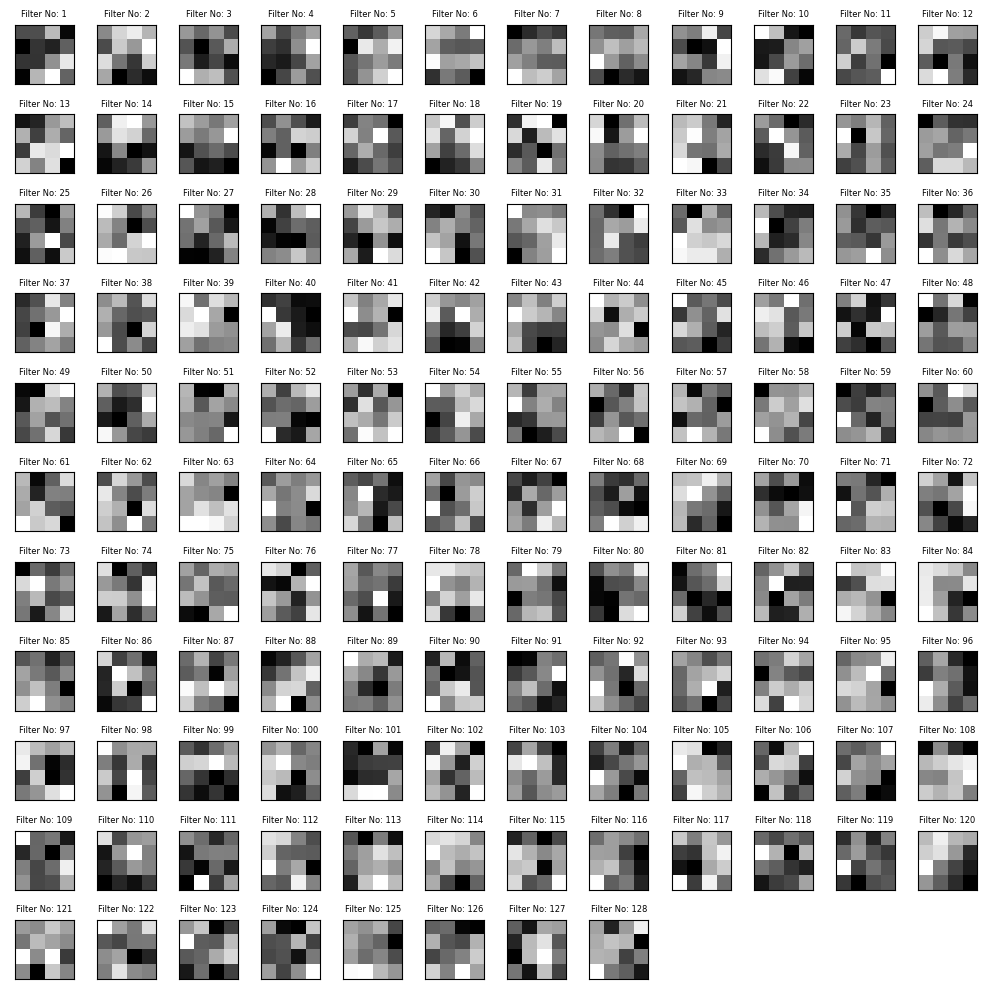


Conv Layer Name: conv2d_2, Channel No: 9


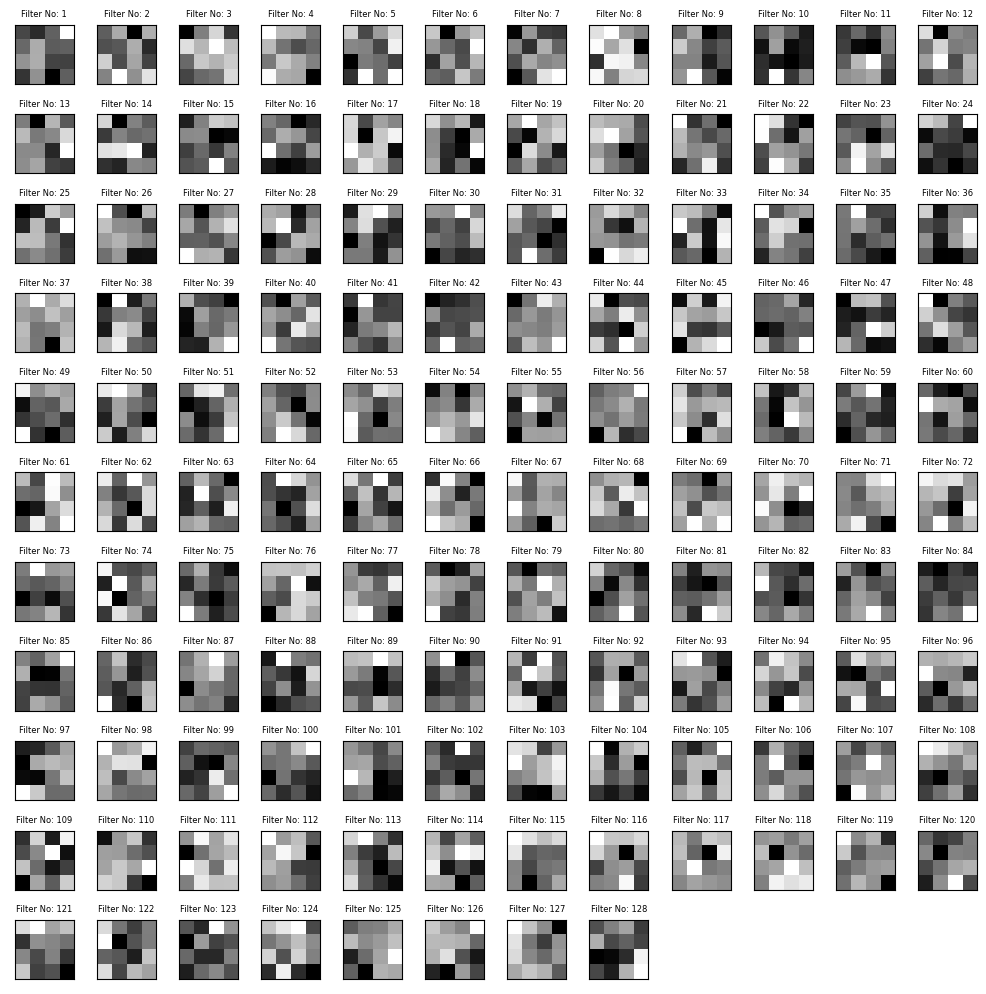


Conv Layer Name: conv2d_2, Channel No: 10


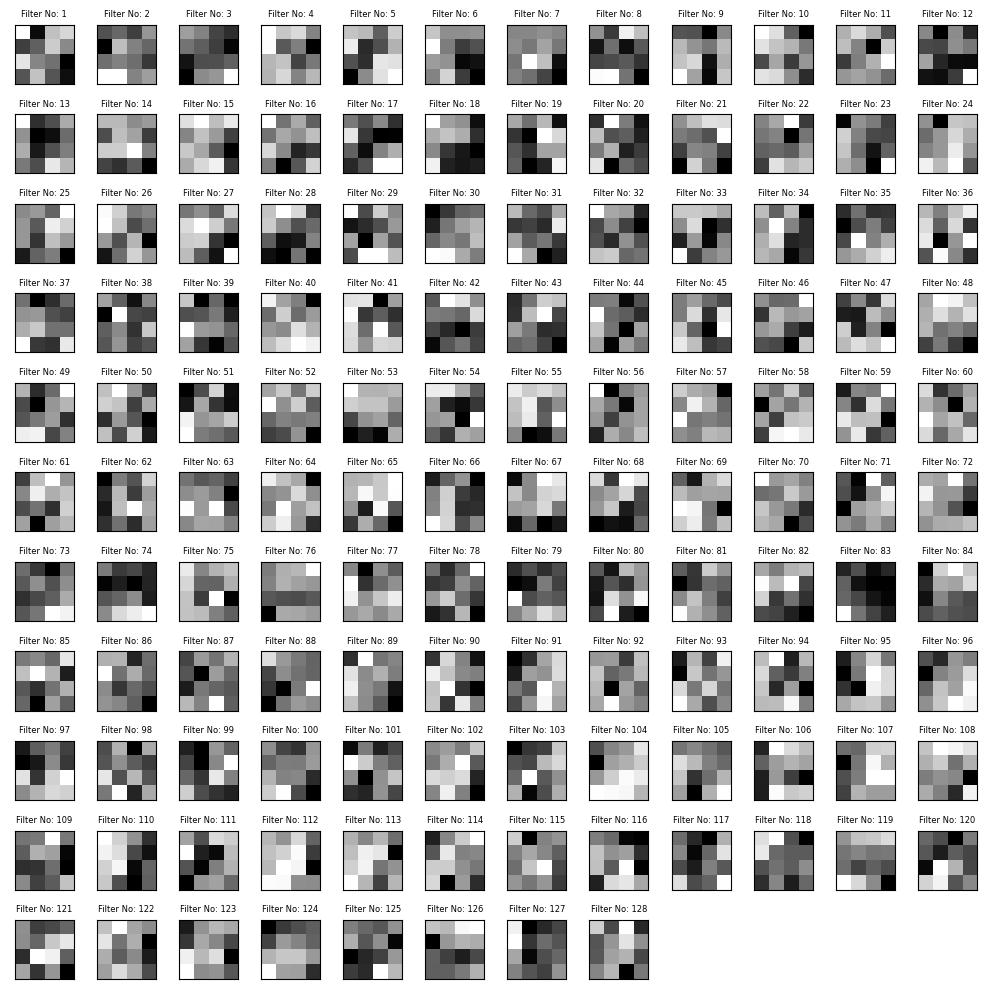


Conv Layer Name: conv2d_2, Channel No: 11


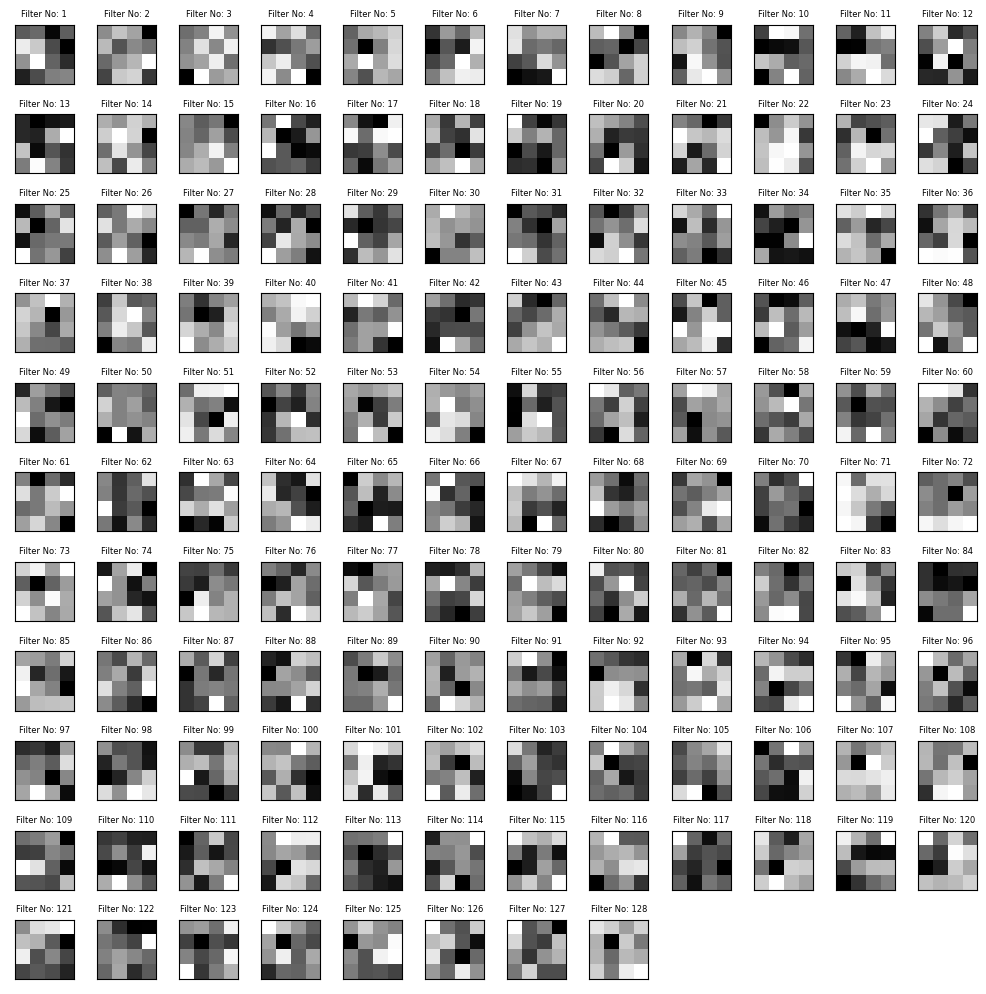


Conv Layer Name: conv2d_2, Channel No: 12


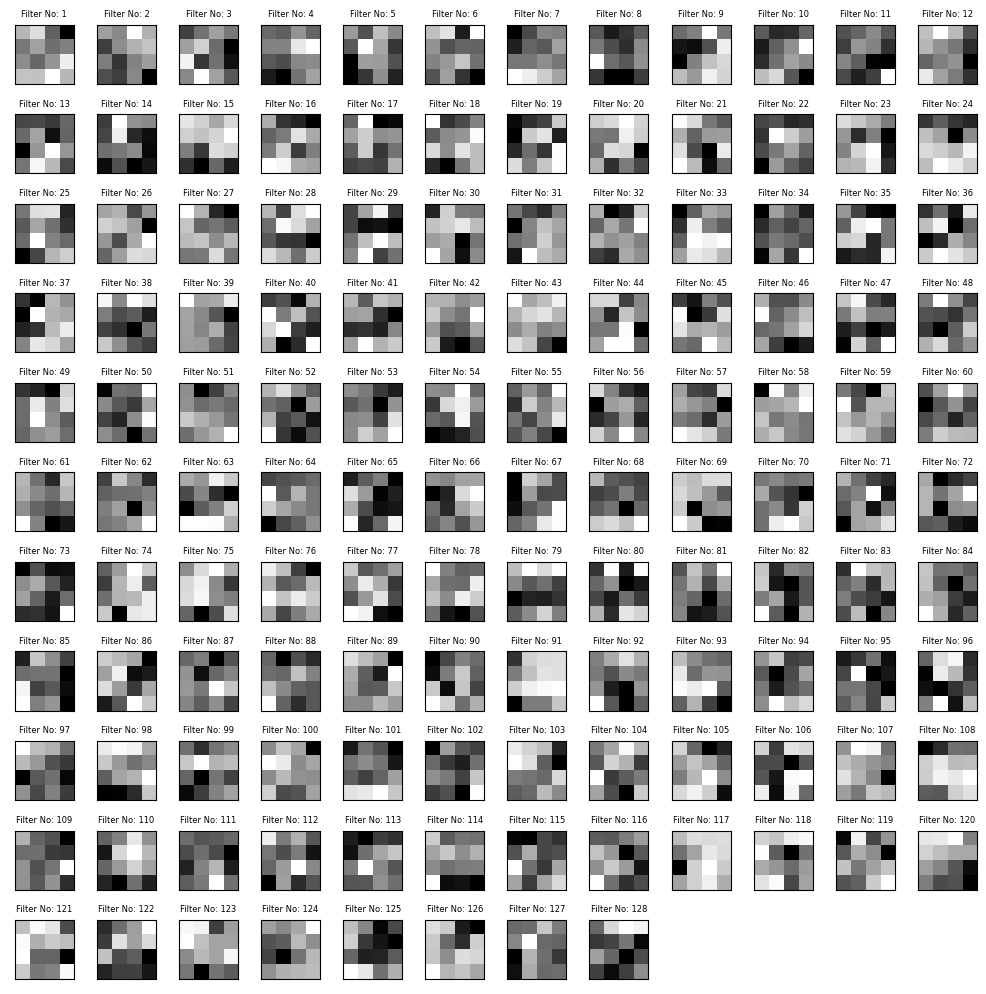


Conv Layer Name: conv2d_2, Channel No: 13


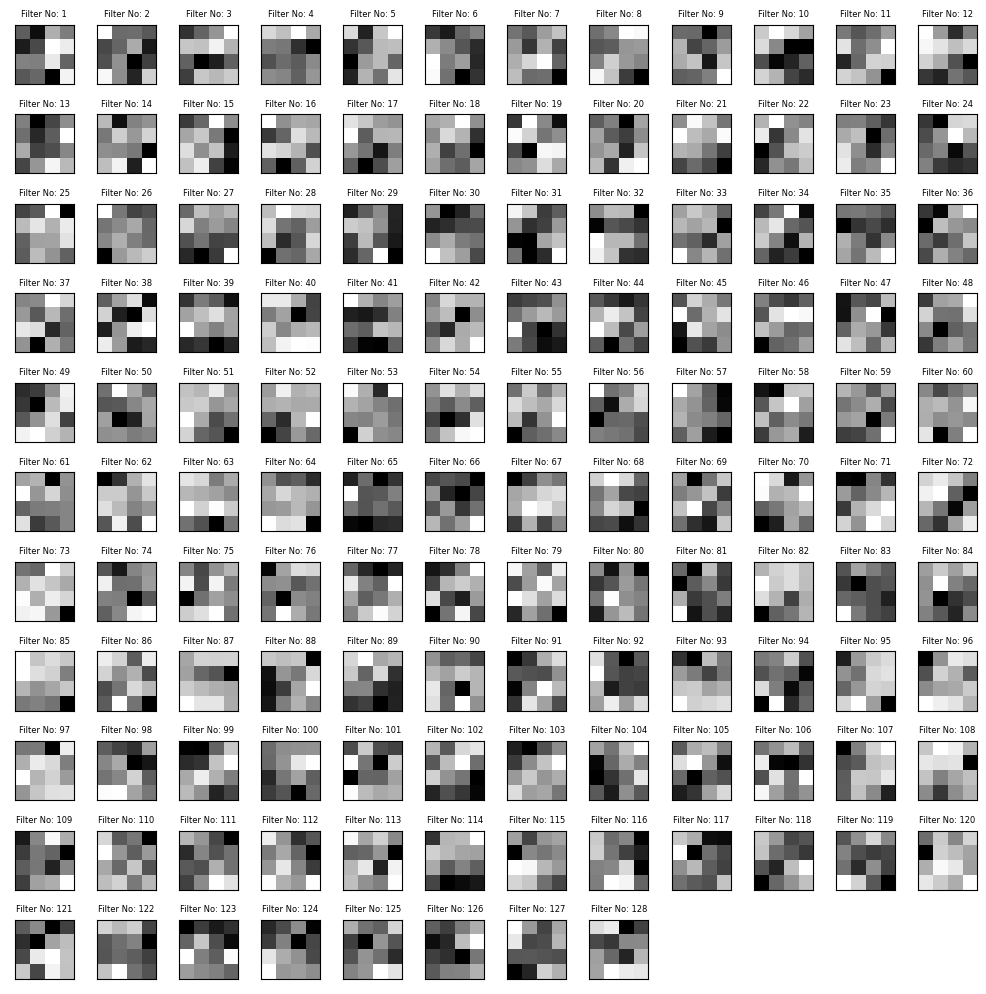


Conv Layer Name: conv2d_2, Channel No: 14


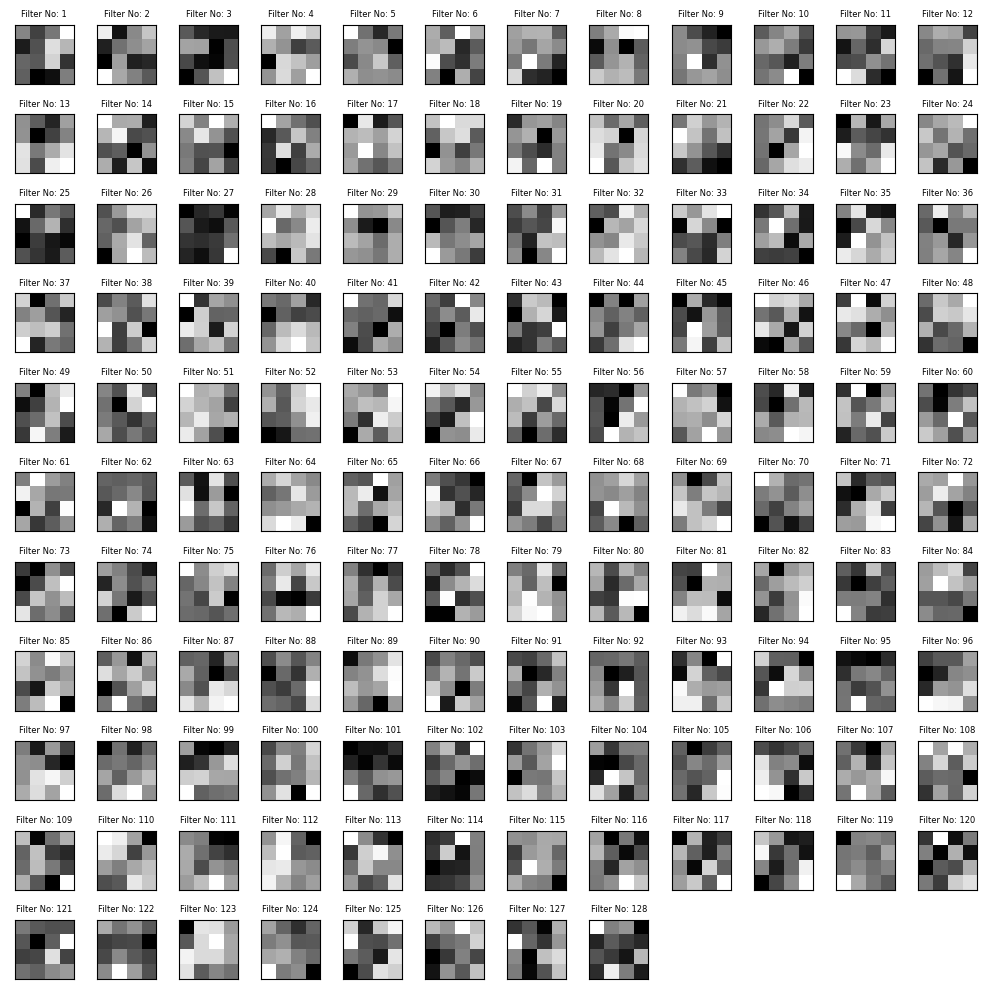


Conv Layer Name: conv2d_2, Channel No: 15


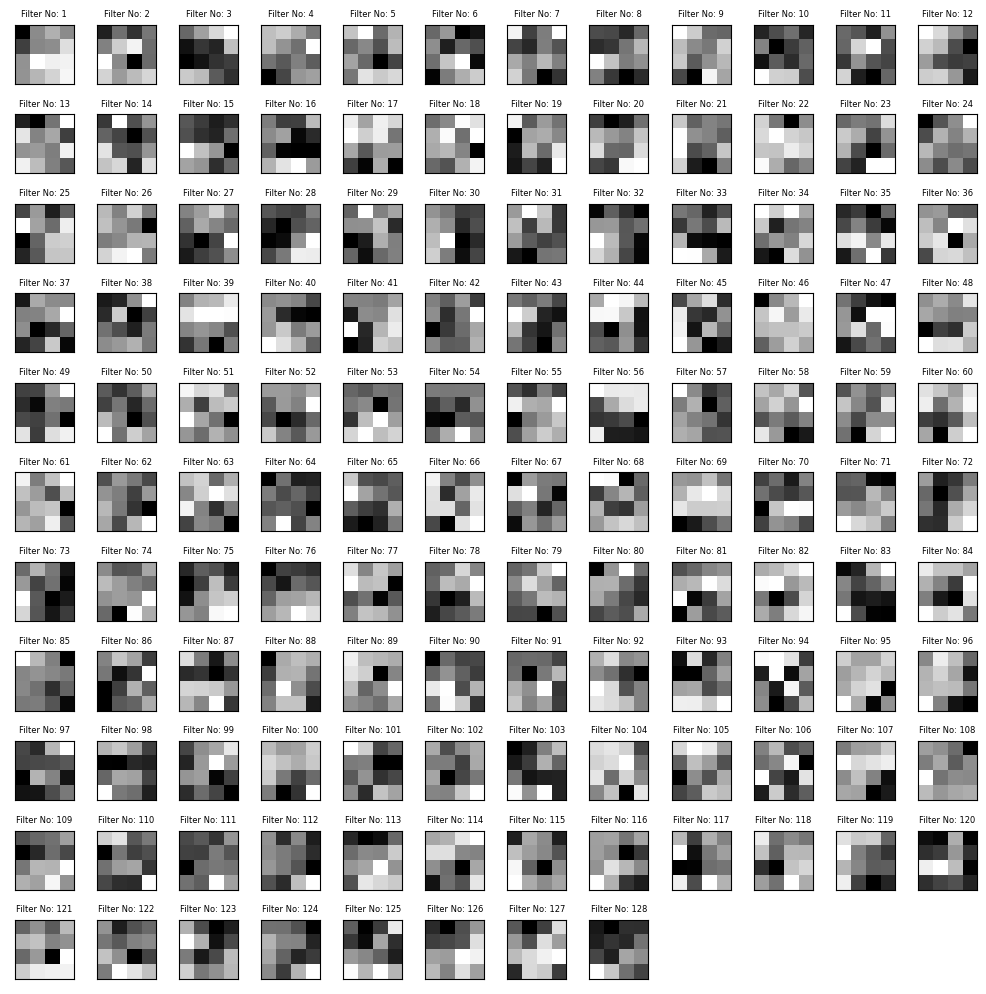


Conv Layer Name: conv2d_2, Channel No: 16


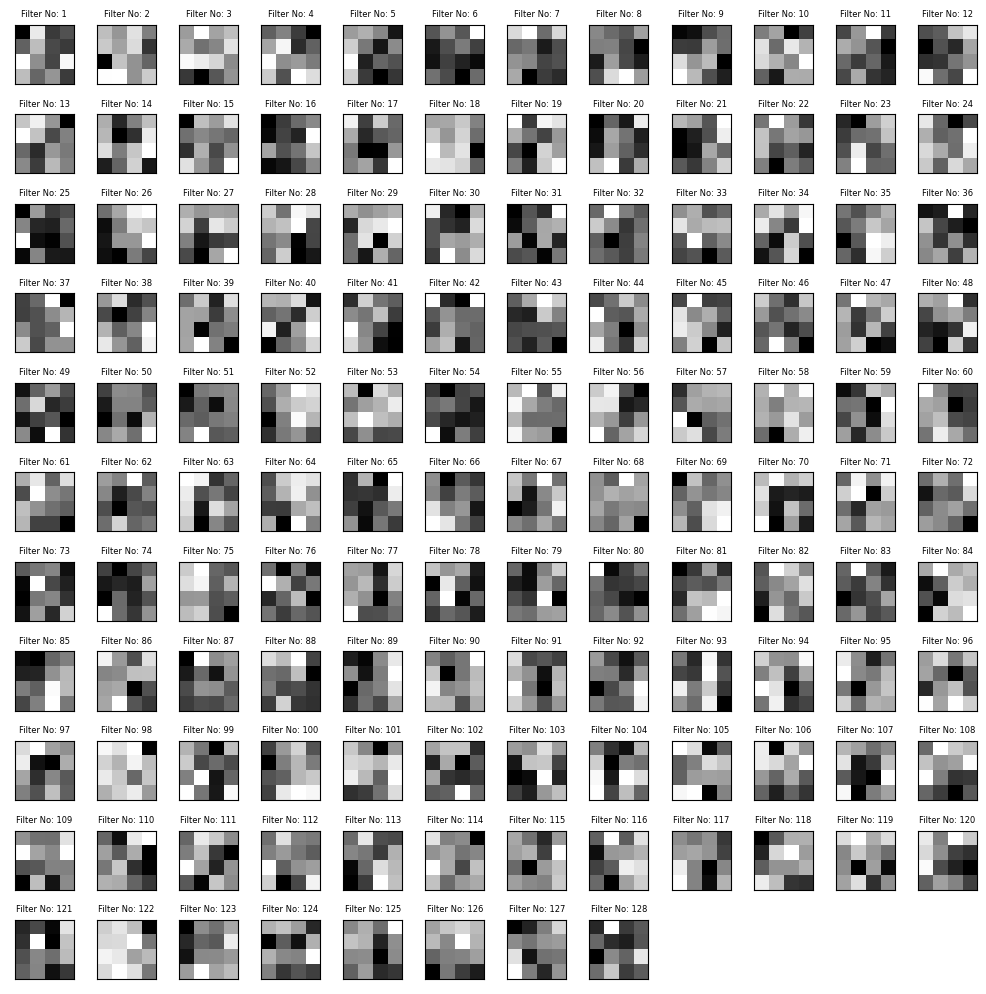


Conv Layer Name: conv2d_2, Channel No: 17


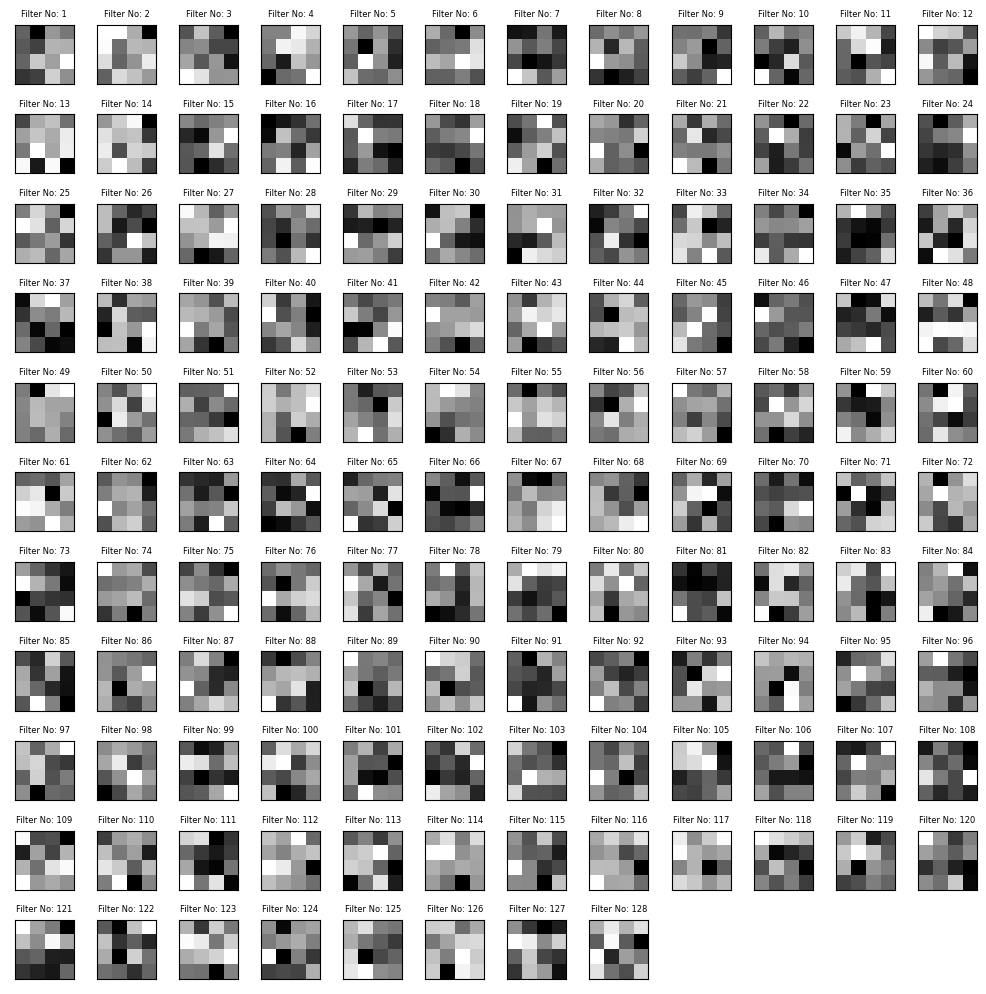


Conv Layer Name: conv2d_2, Channel No: 18


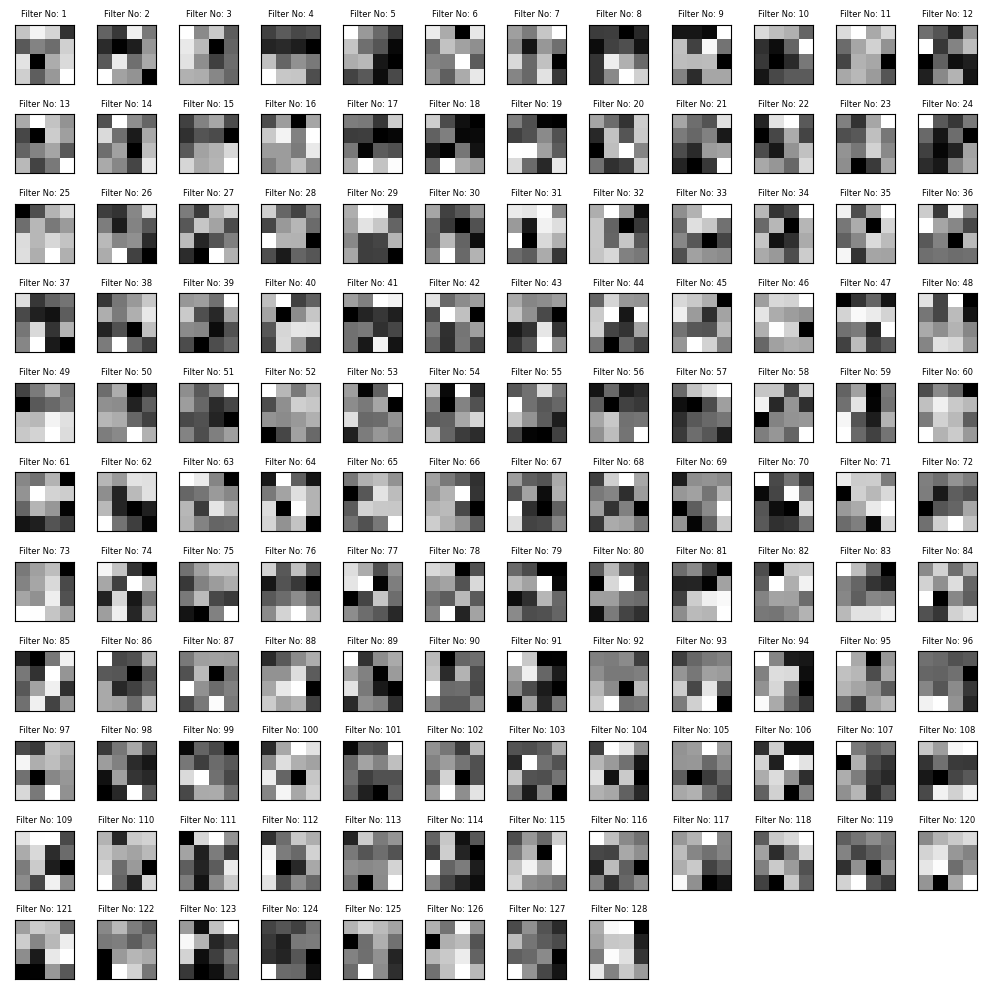


Conv Layer Name: conv2d_2, Channel No: 19


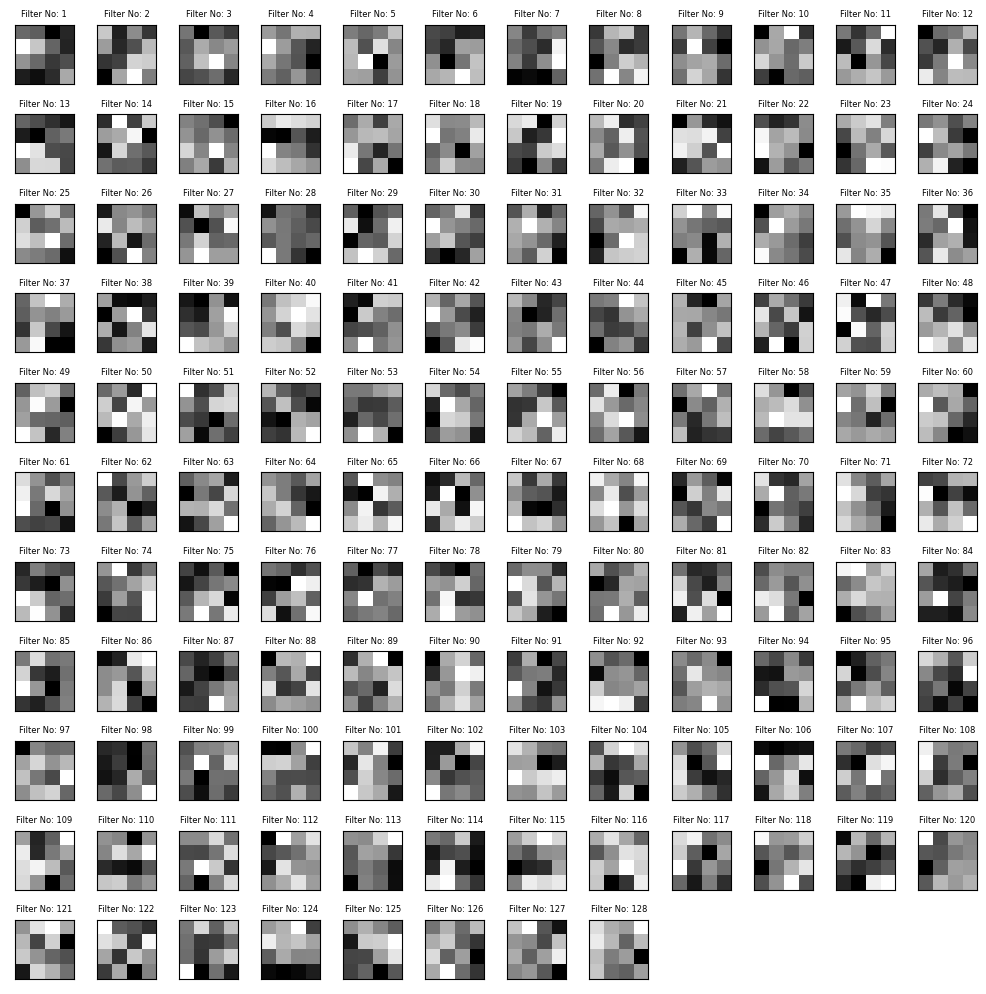


Conv Layer Name: conv2d_2, Channel No: 20


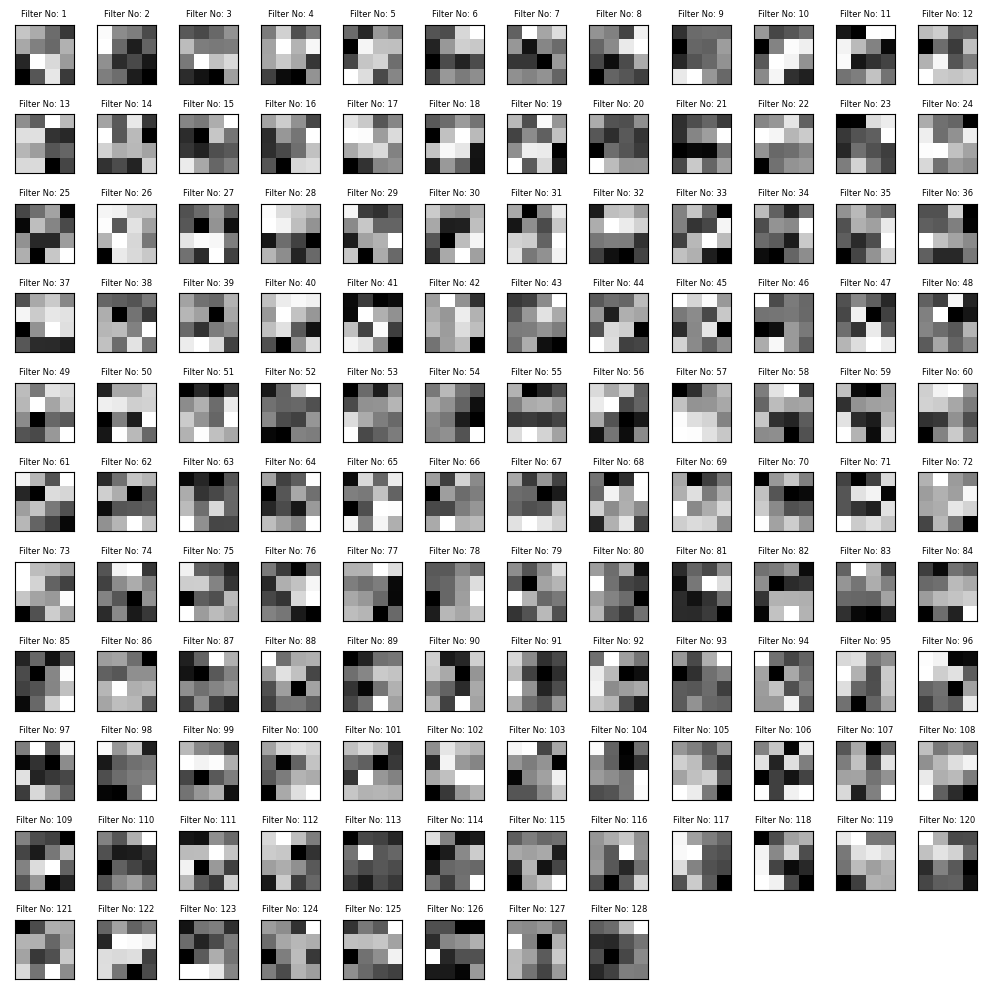


Conv Layer Name: conv2d_2, Channel No: 21


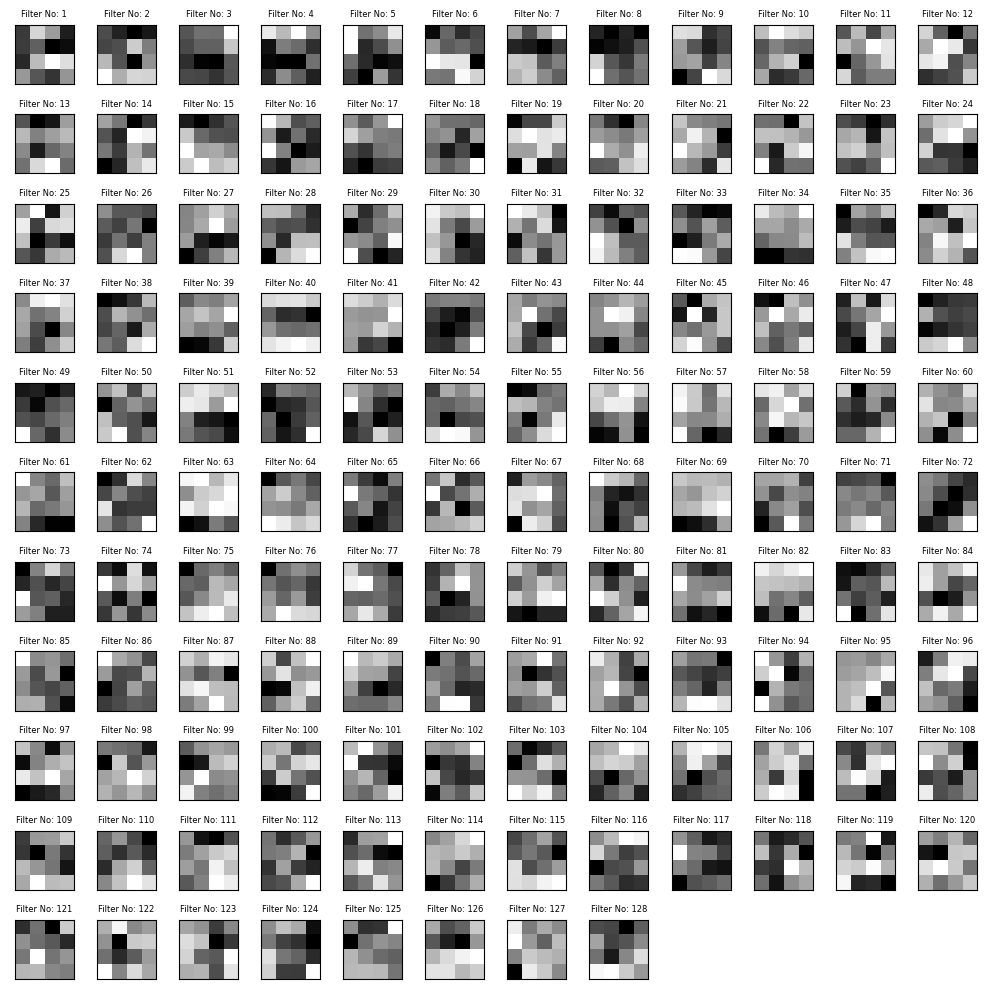


Conv Layer Name: conv2d_2, Channel No: 22


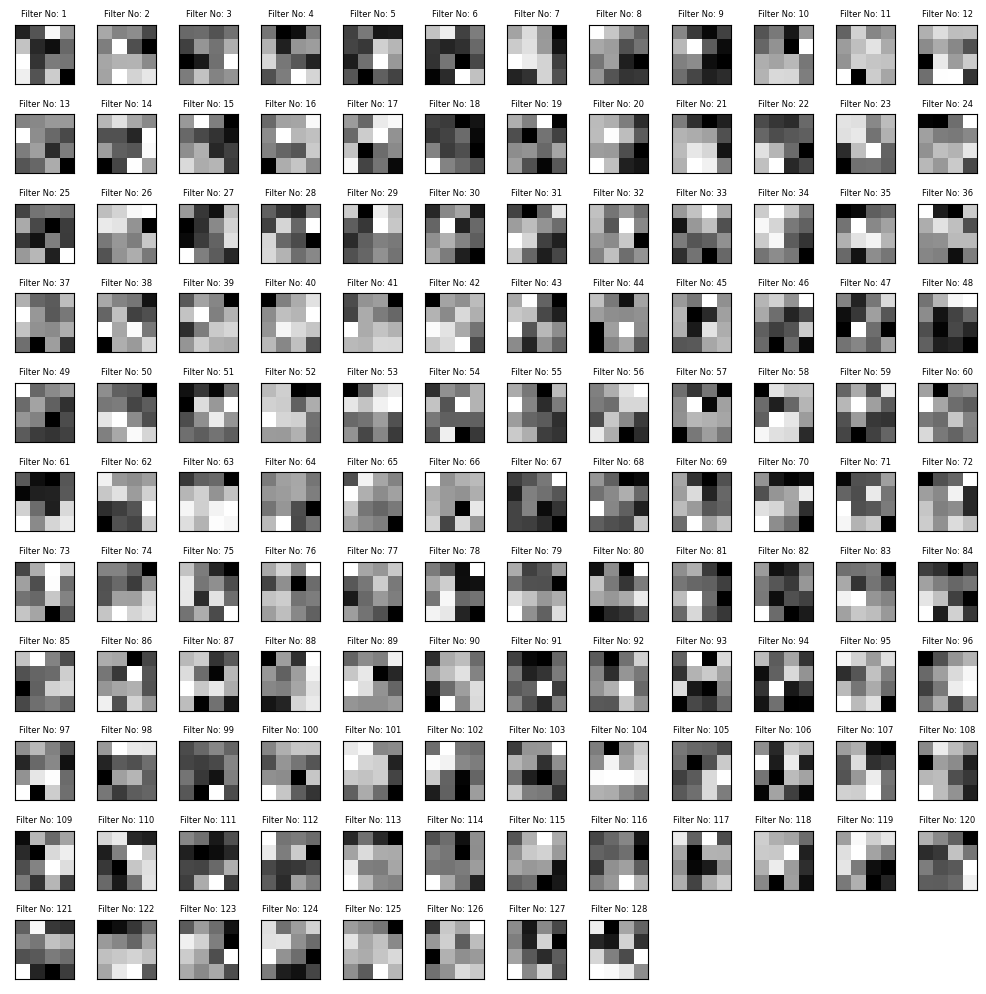


Conv Layer Name: conv2d_2, Channel No: 23


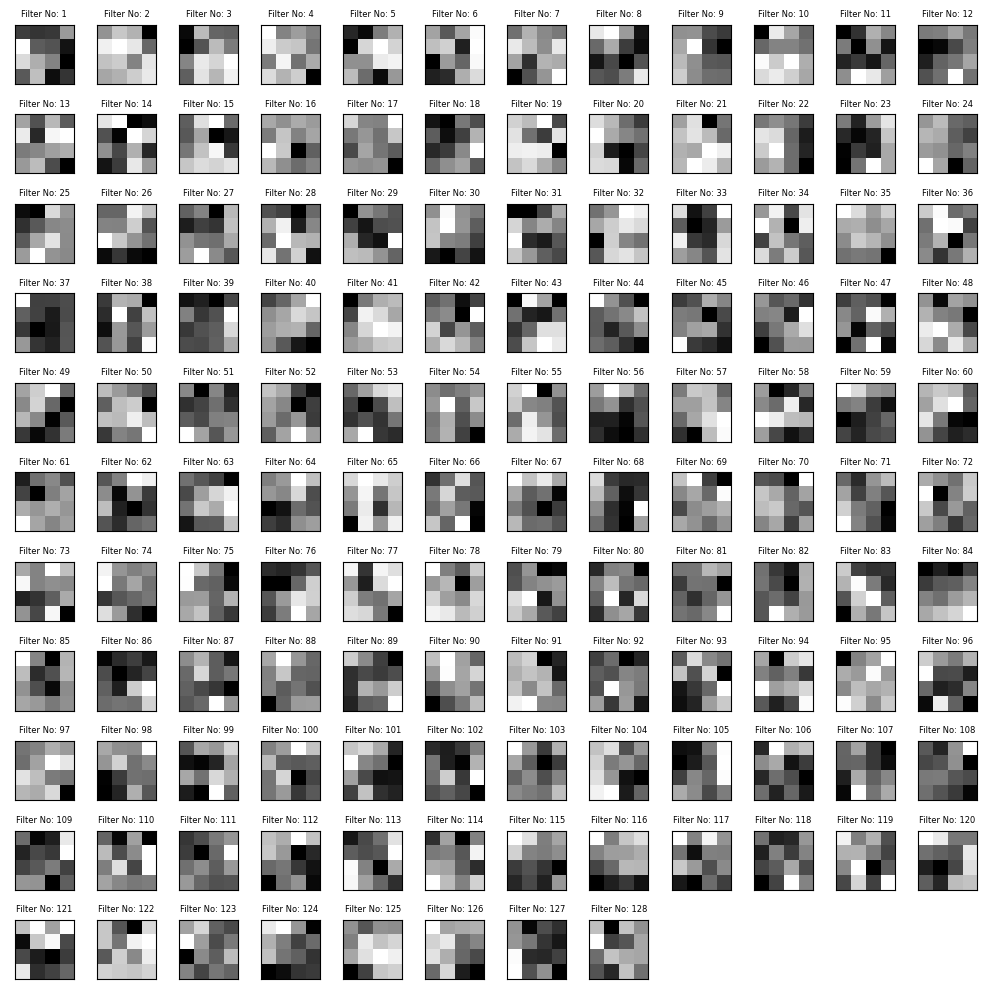


Conv Layer Name: conv2d_2, Channel No: 24


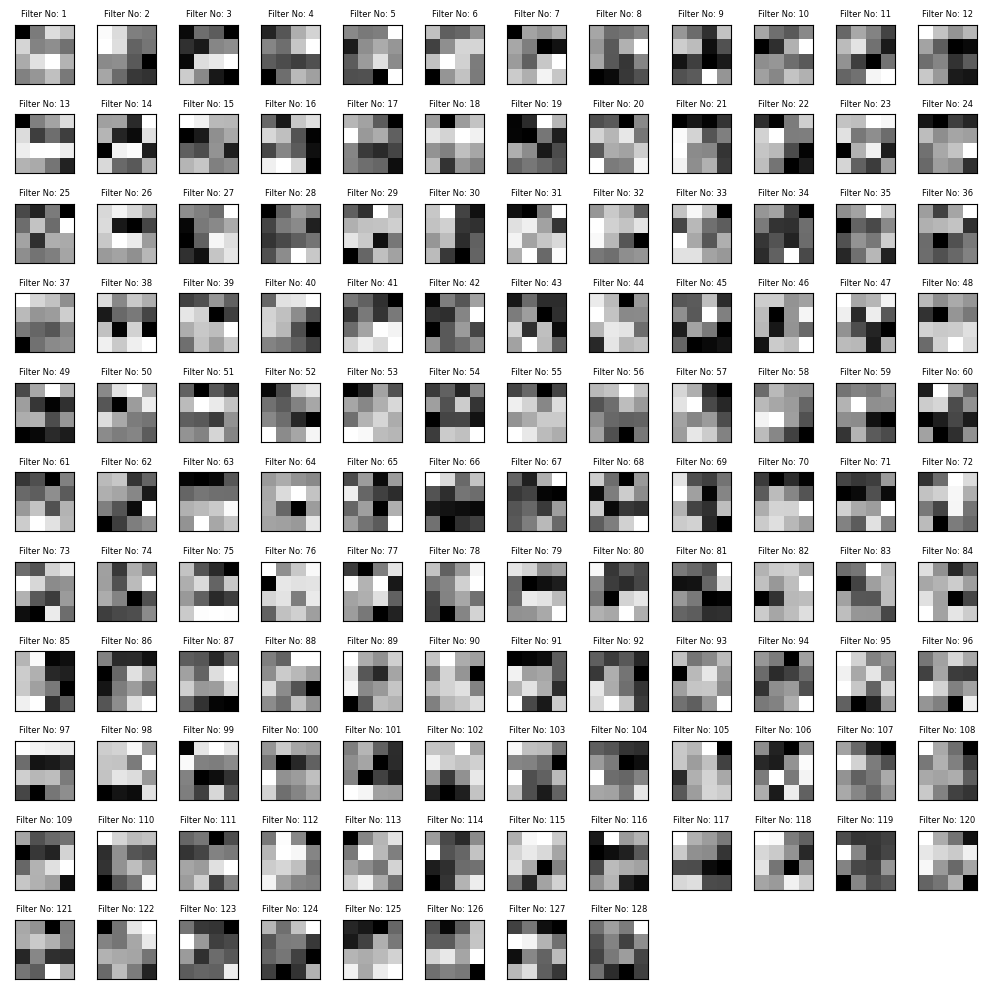


Conv Layer Name: conv2d_2, Channel No: 25


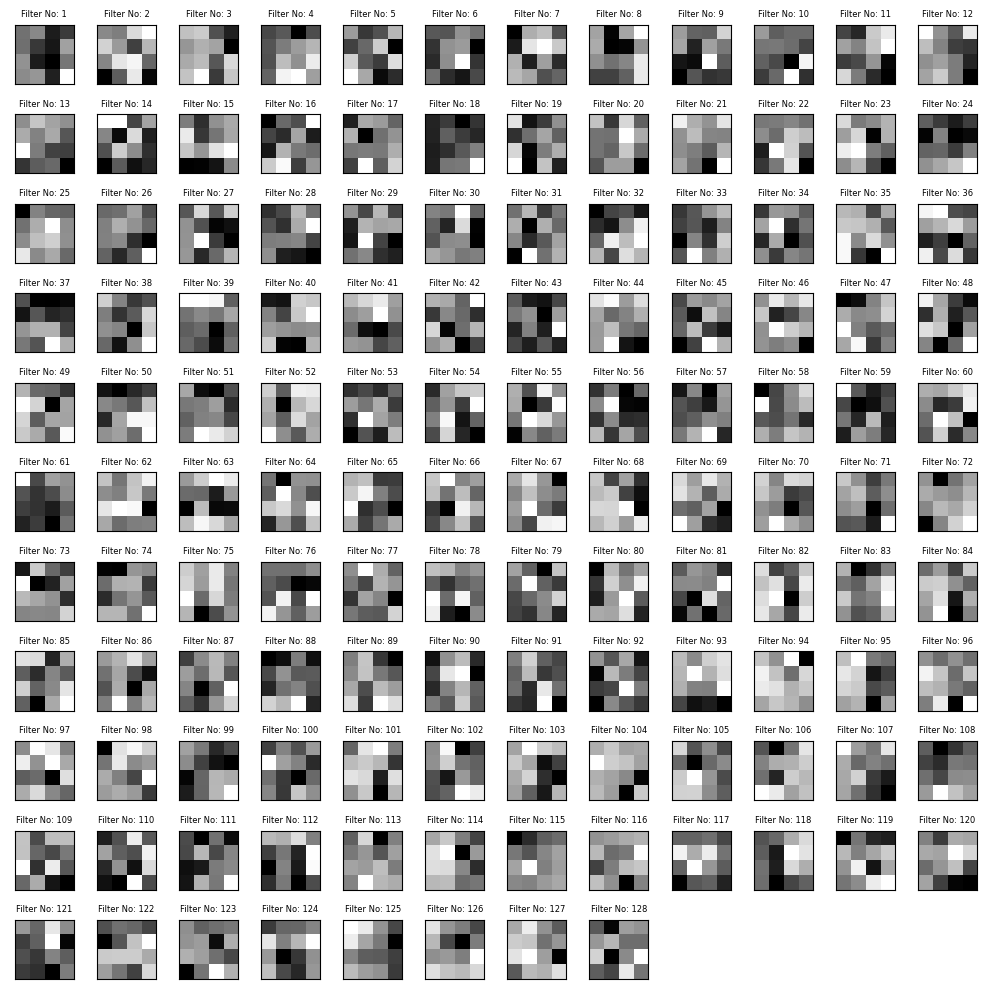


Conv Layer Name: conv2d_2, Channel No: 26


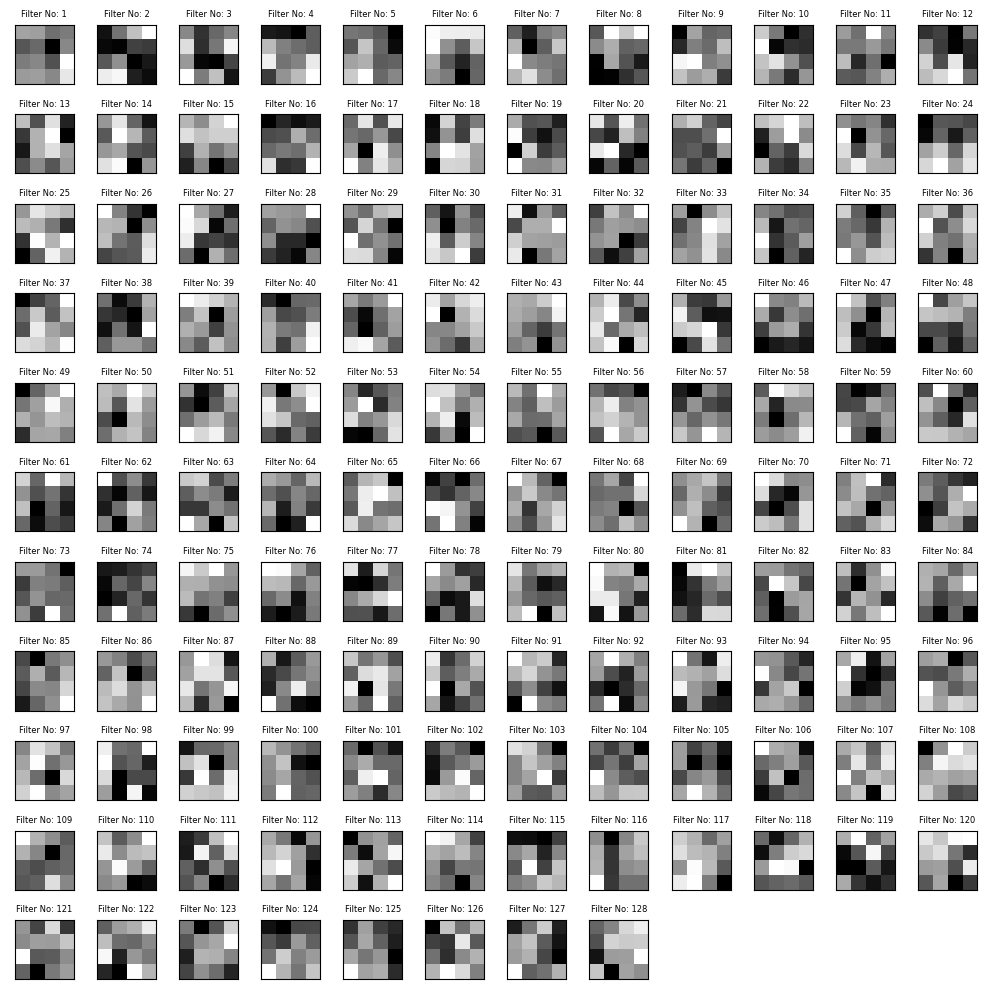


Conv Layer Name: conv2d_2, Channel No: 27


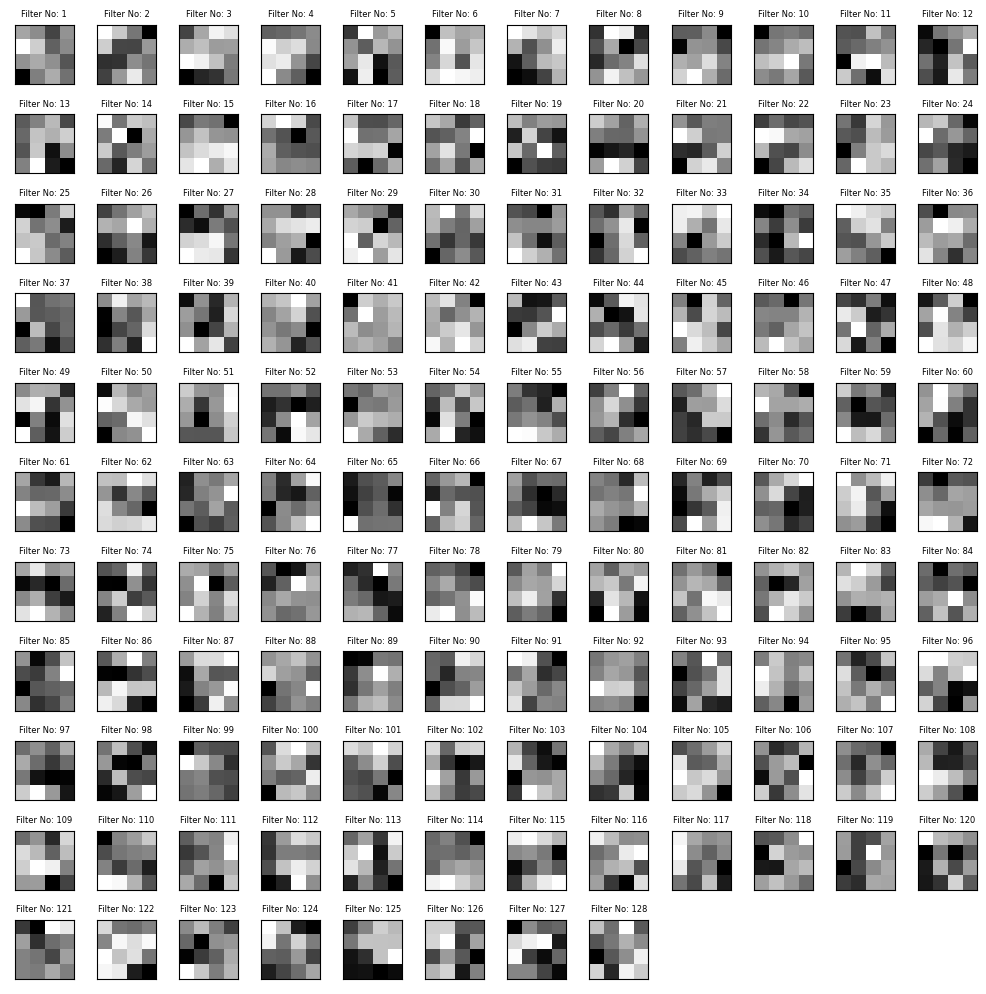


Conv Layer Name: conv2d_2, Channel No: 28


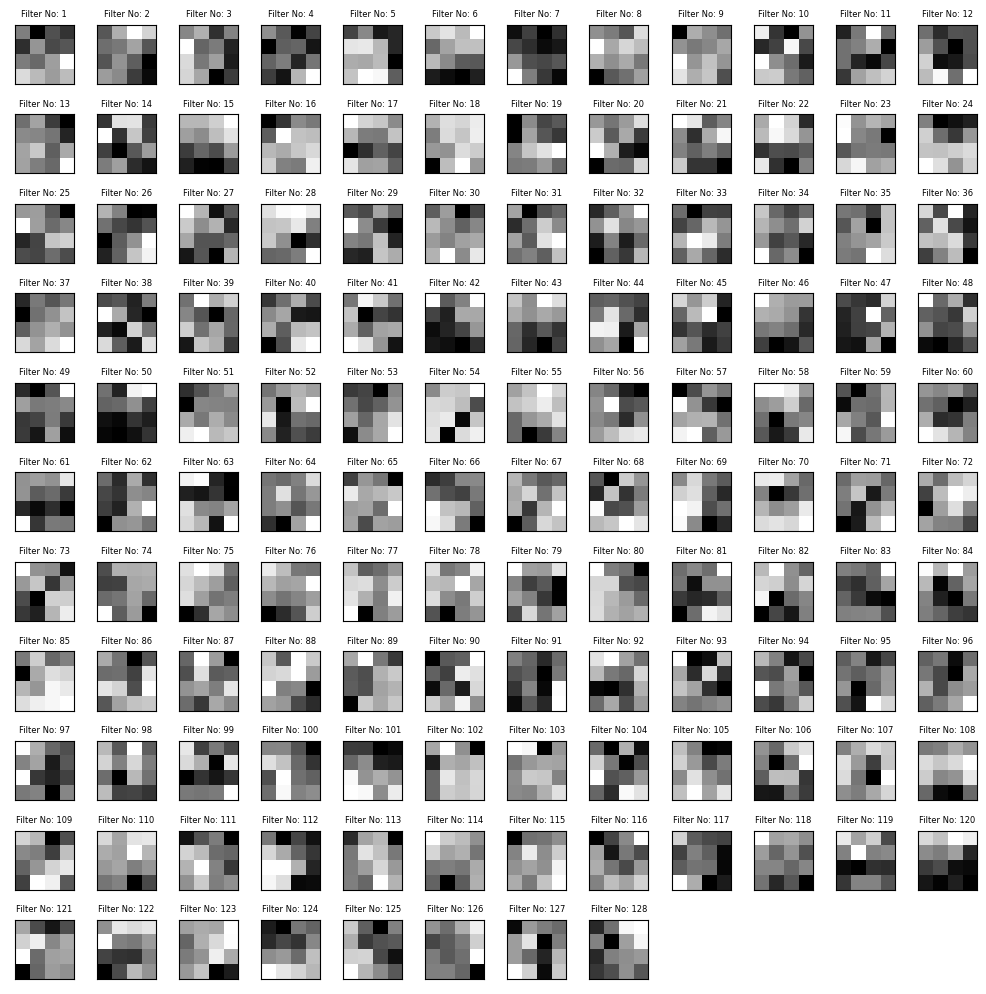


Conv Layer Name: conv2d_2, Channel No: 29


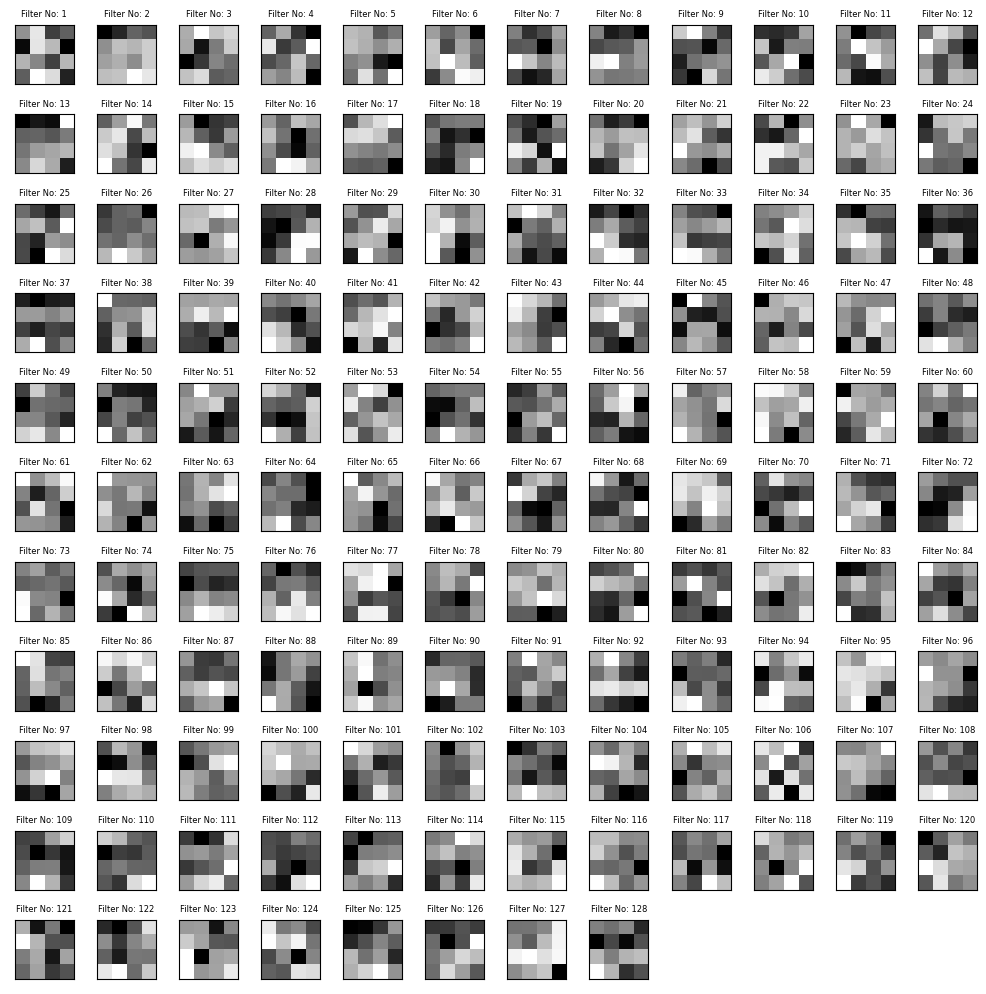


Conv Layer Name: conv2d_2, Channel No: 30


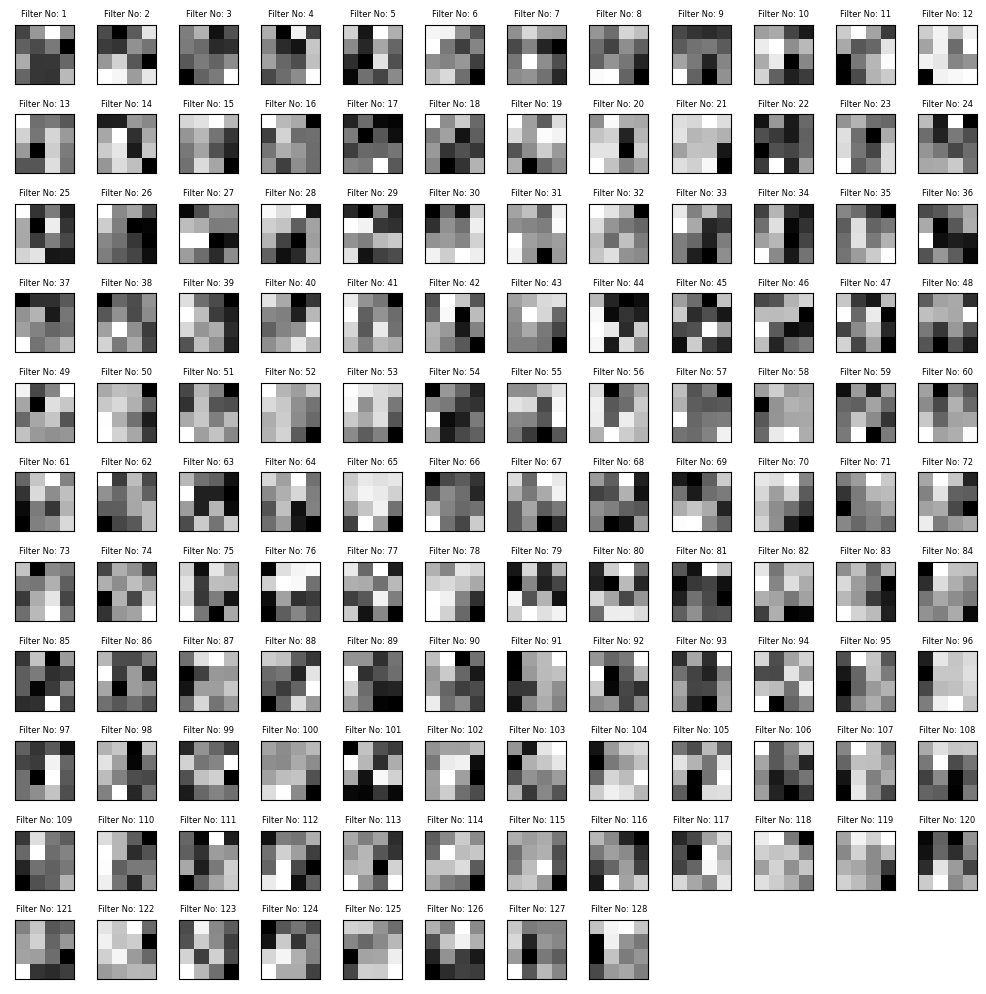


Conv Layer Name: conv2d_2, Channel No: 31


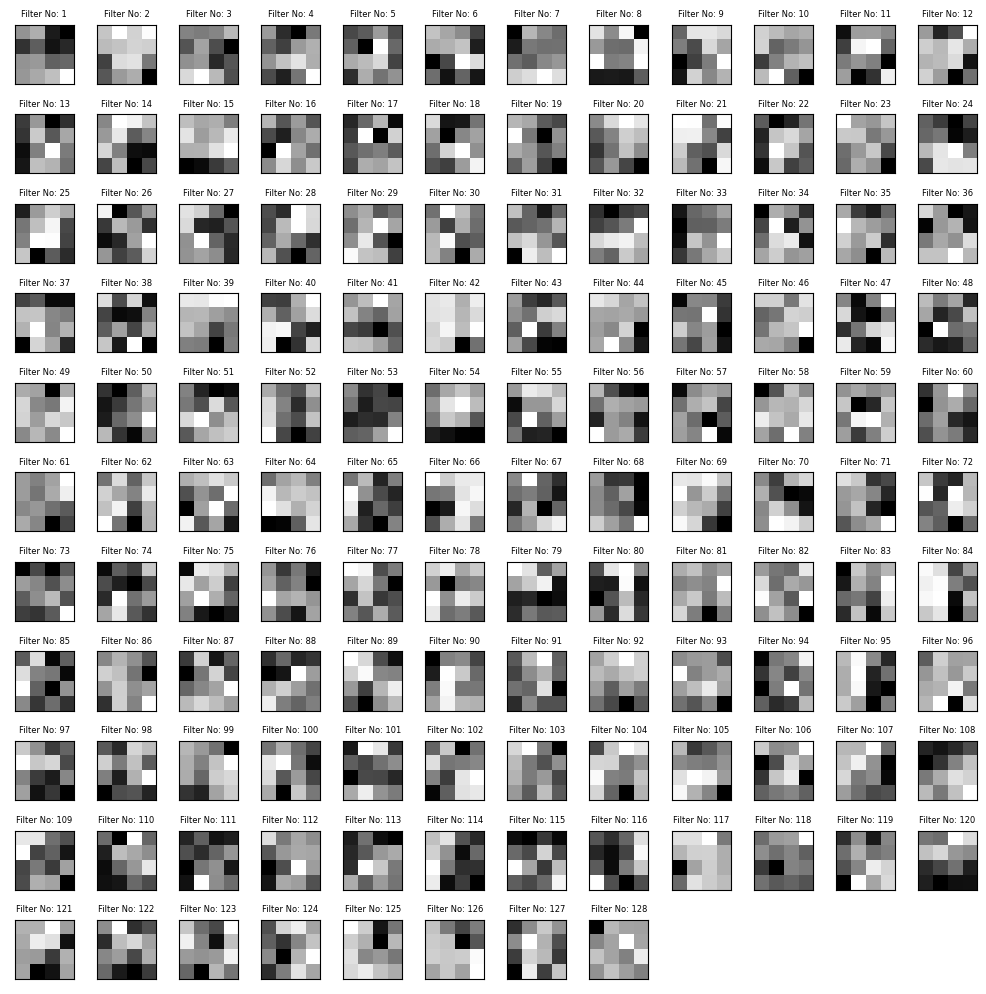


Conv Layer Name: conv2d_2, Channel No: 32


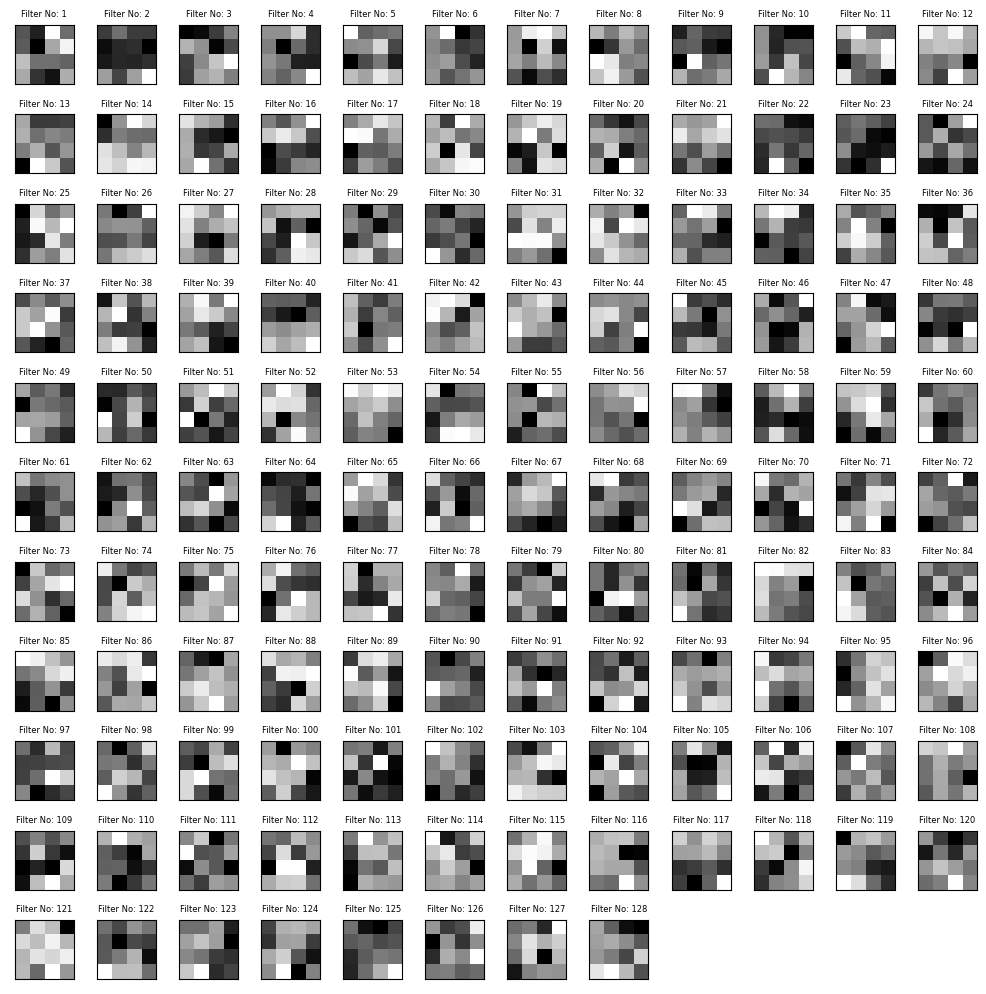


Conv Layer Name: conv2d_2, Channel No: 33


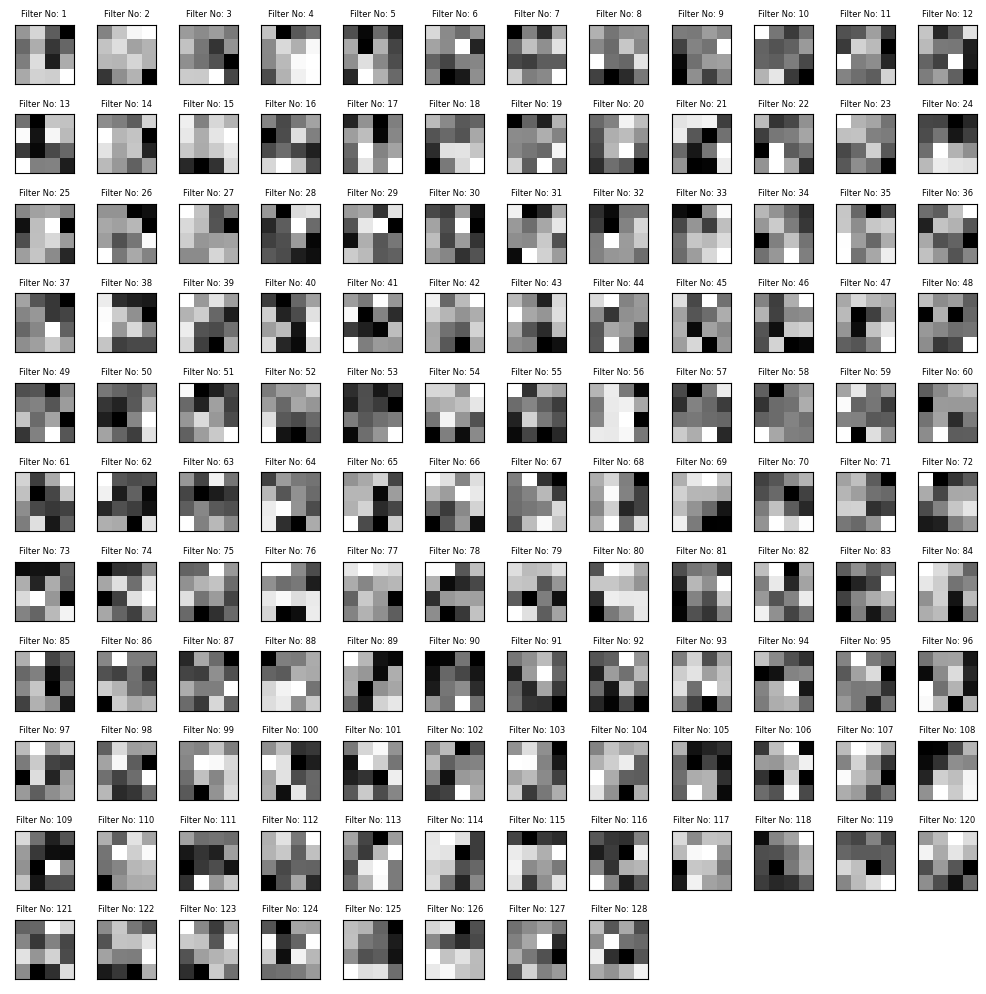


Conv Layer Name: conv2d_2, Channel No: 34


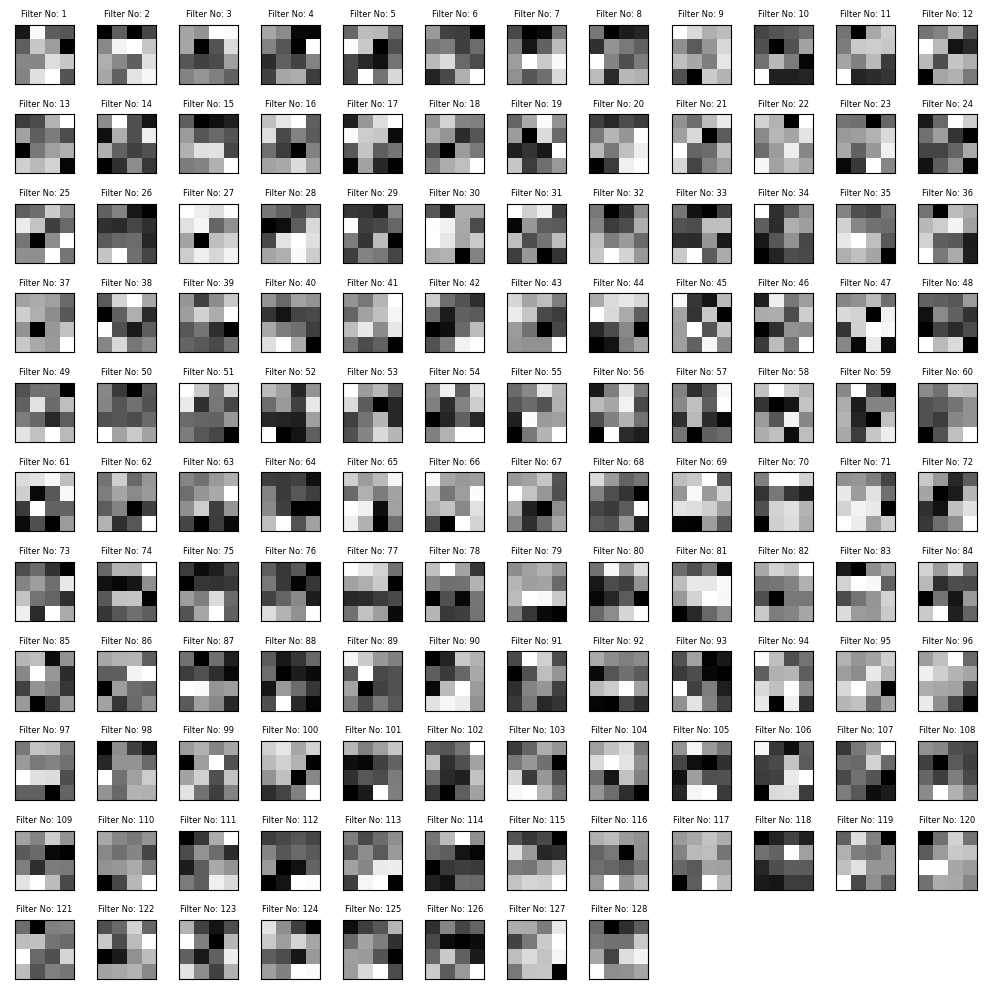


Conv Layer Name: conv2d_2, Channel No: 35


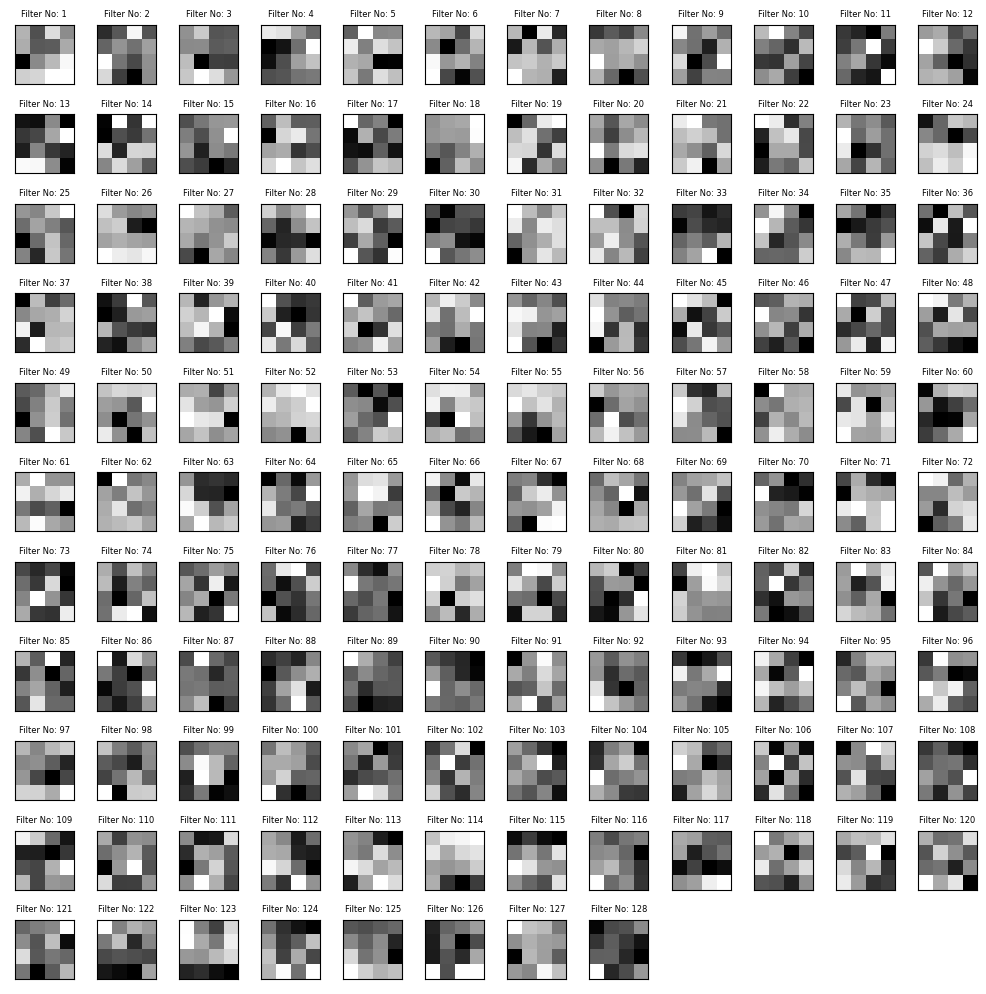


Conv Layer Name: conv2d_2, Channel No: 36


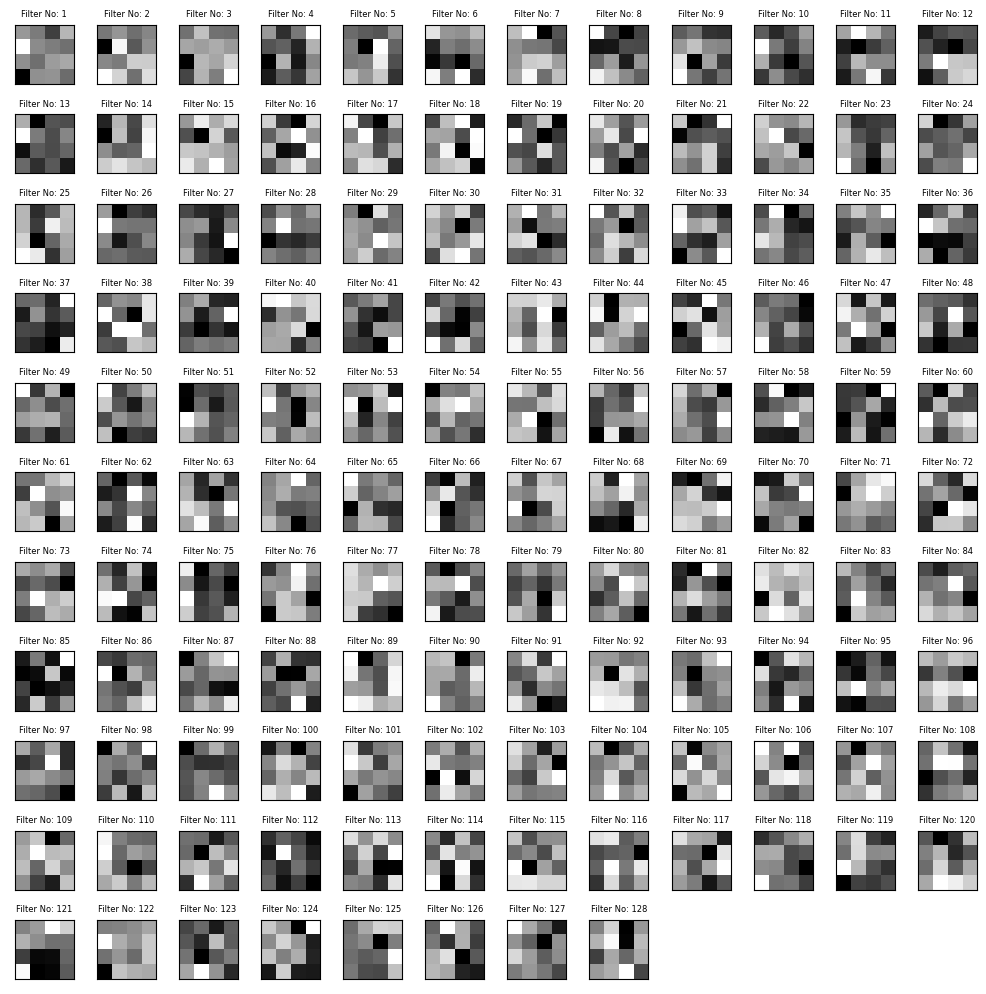


Conv Layer Name: conv2d_2, Channel No: 37


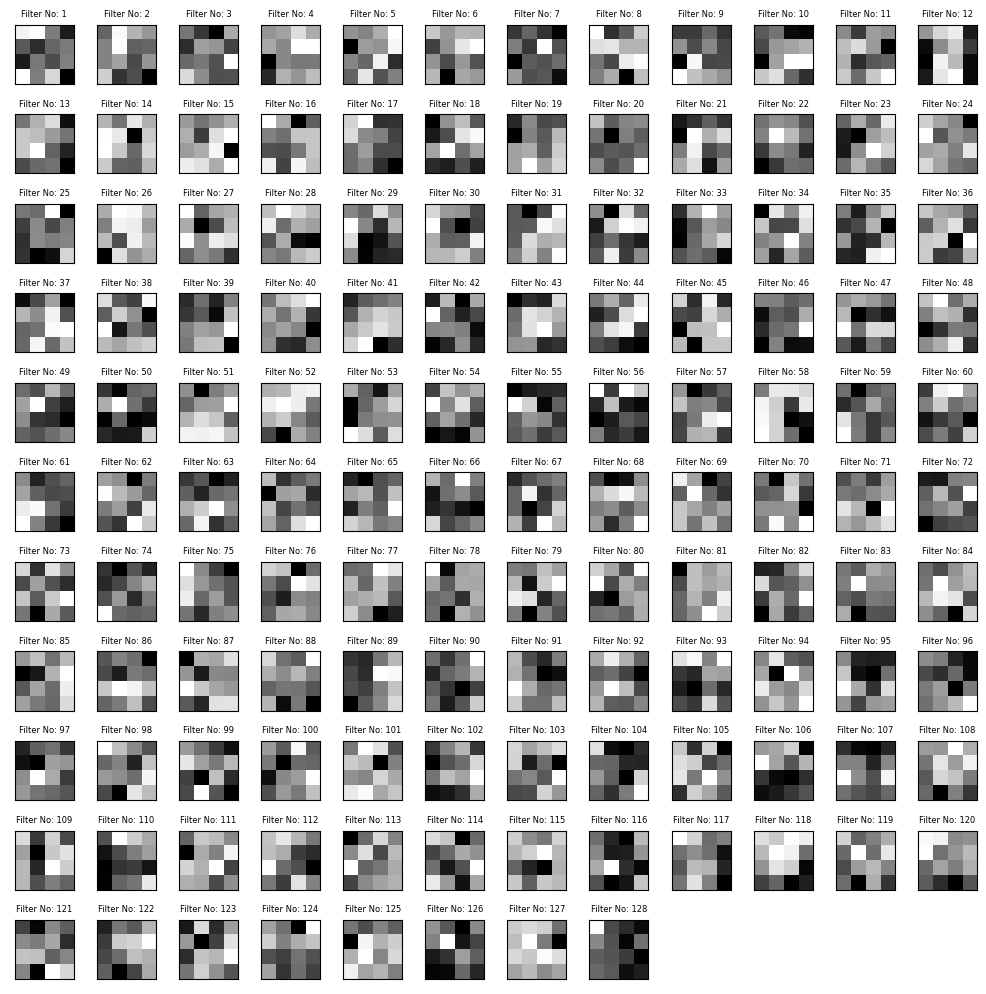


Conv Layer Name: conv2d_2, Channel No: 38


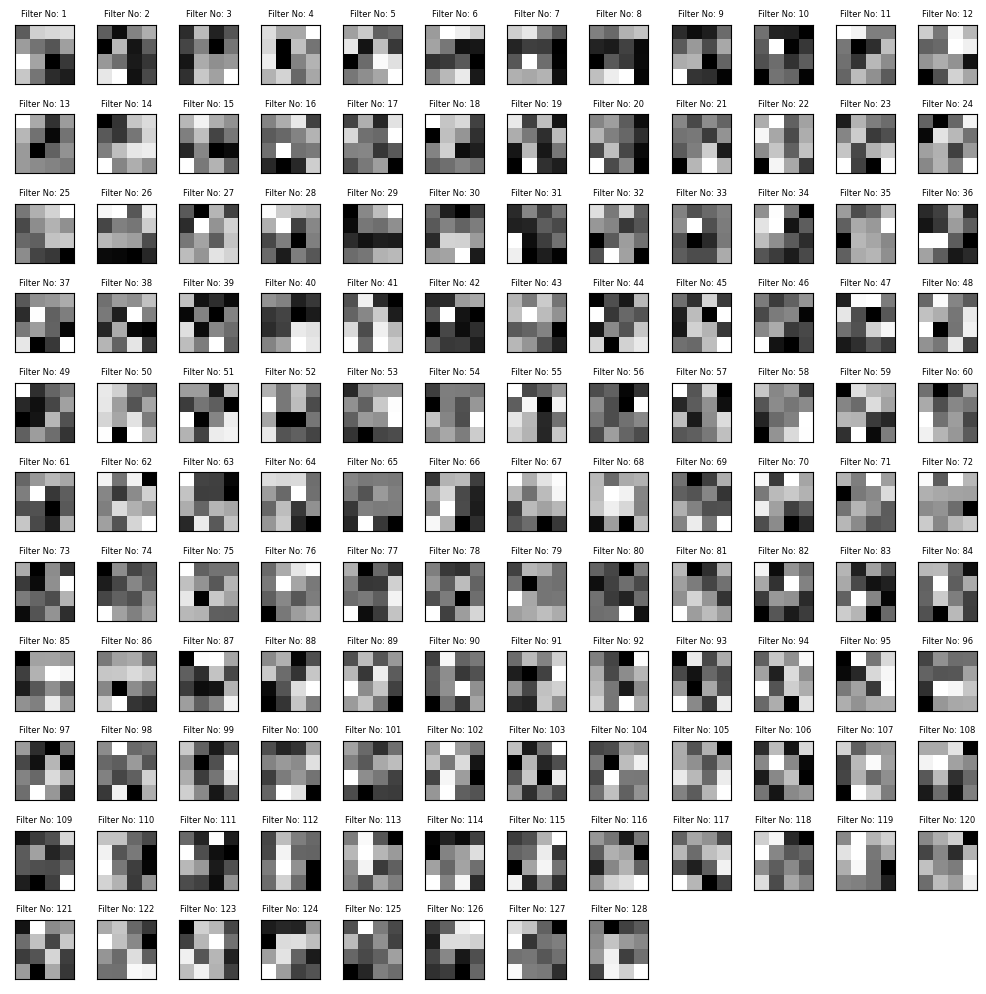


Conv Layer Name: conv2d_2, Channel No: 39


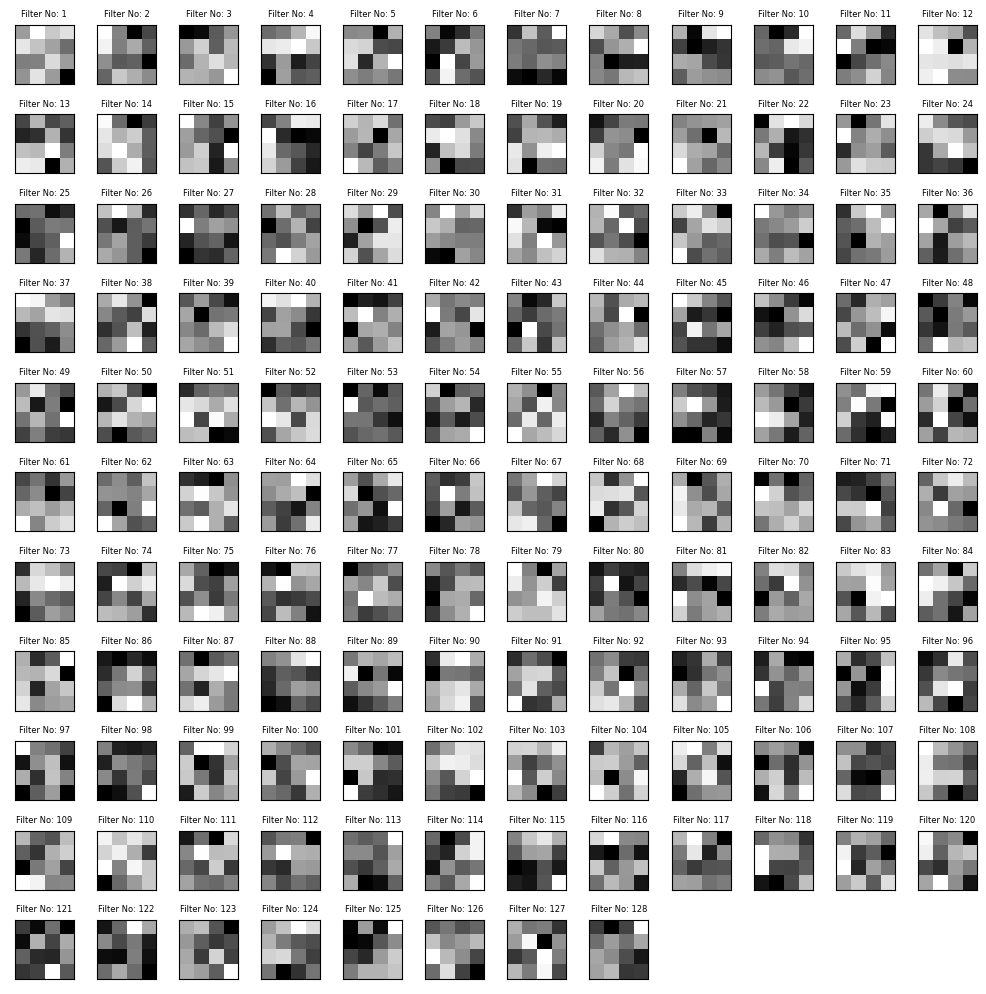


Conv Layer Name: conv2d_2, Channel No: 40


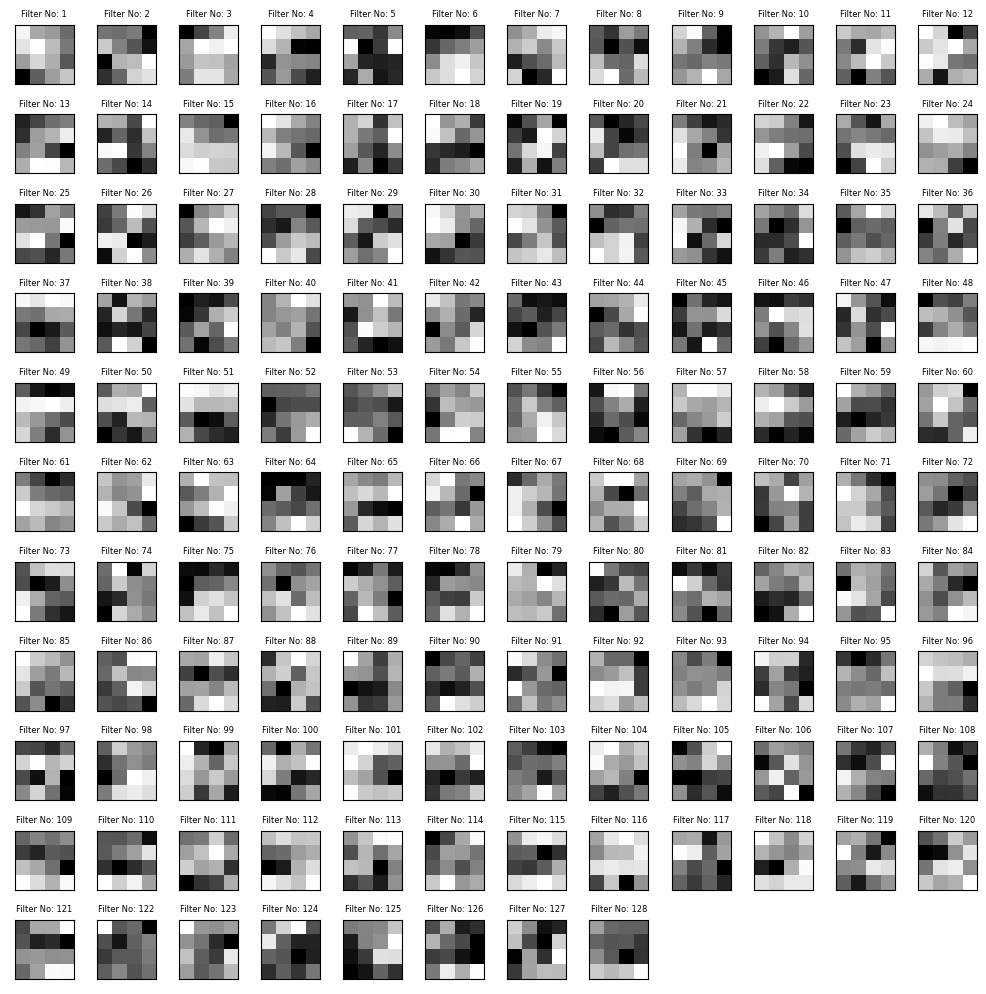


Conv Layer Name: conv2d_2, Channel No: 41


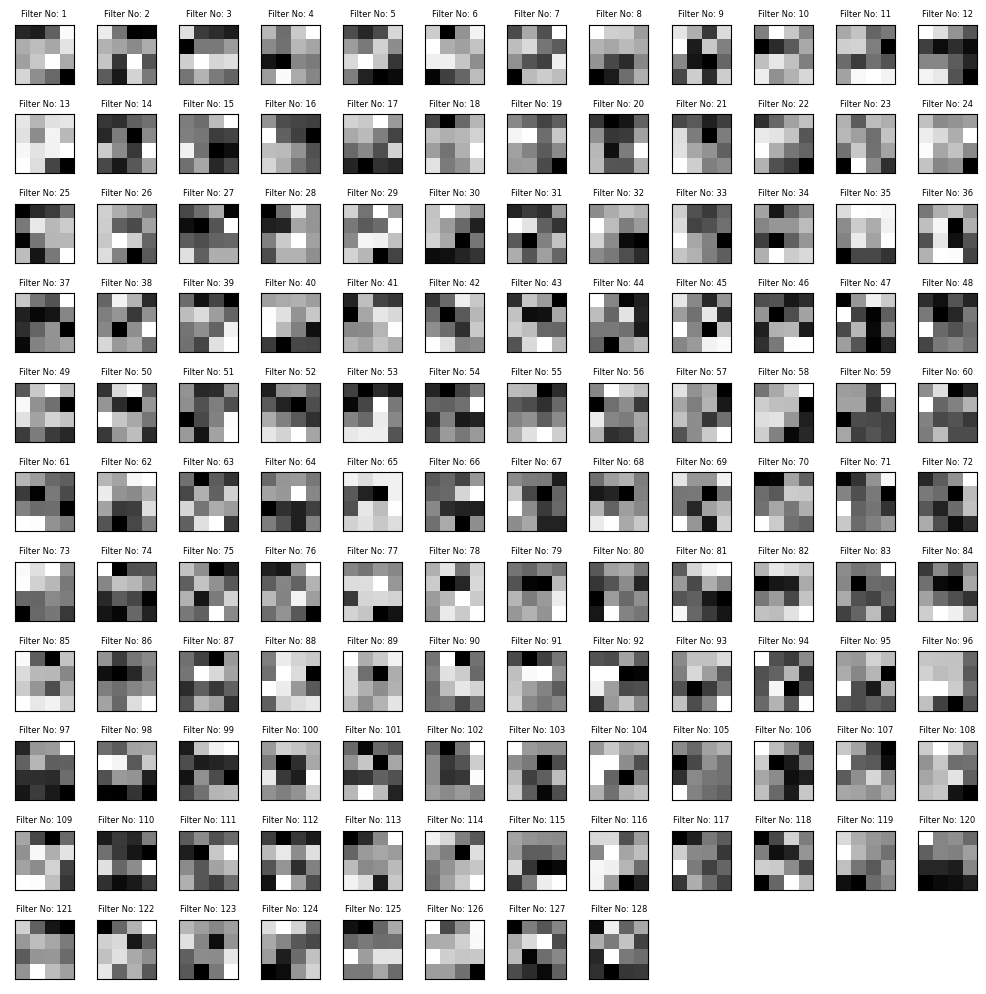


Conv Layer Name: conv2d_2, Channel No: 42


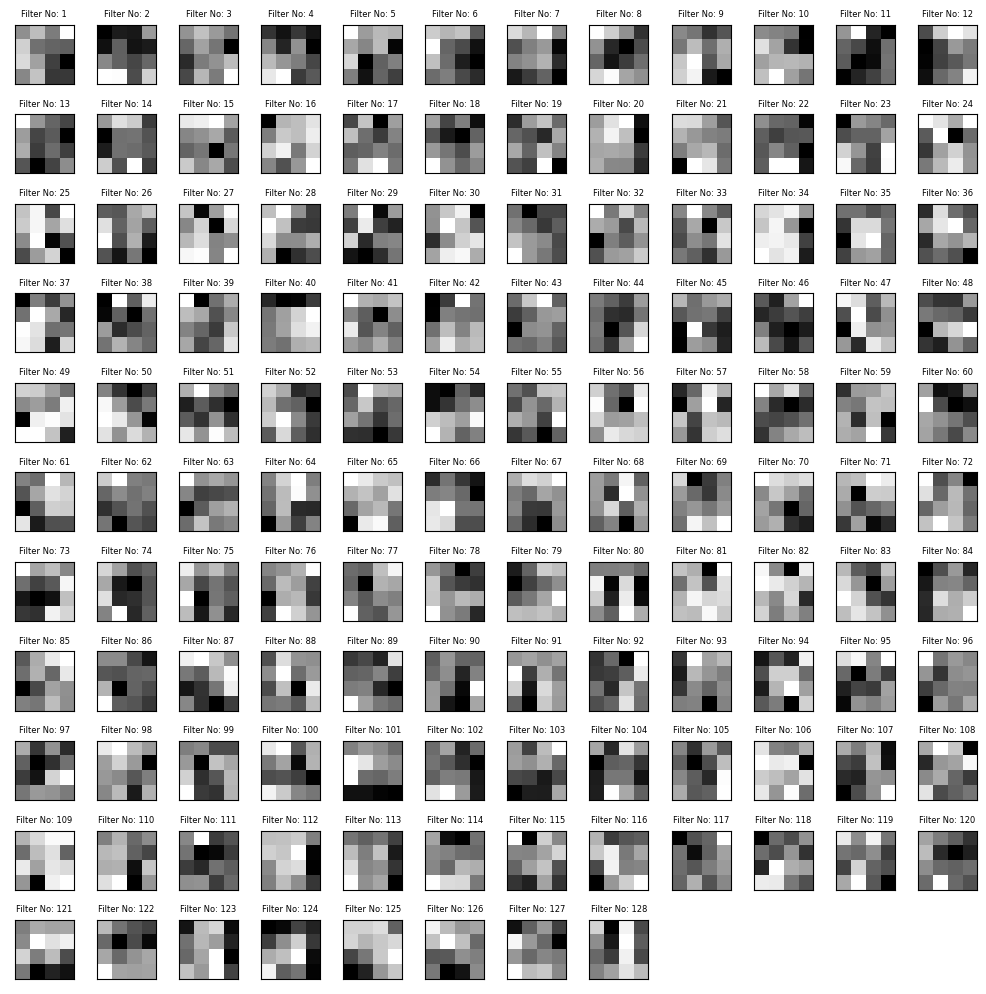


Conv Layer Name: conv2d_2, Channel No: 43


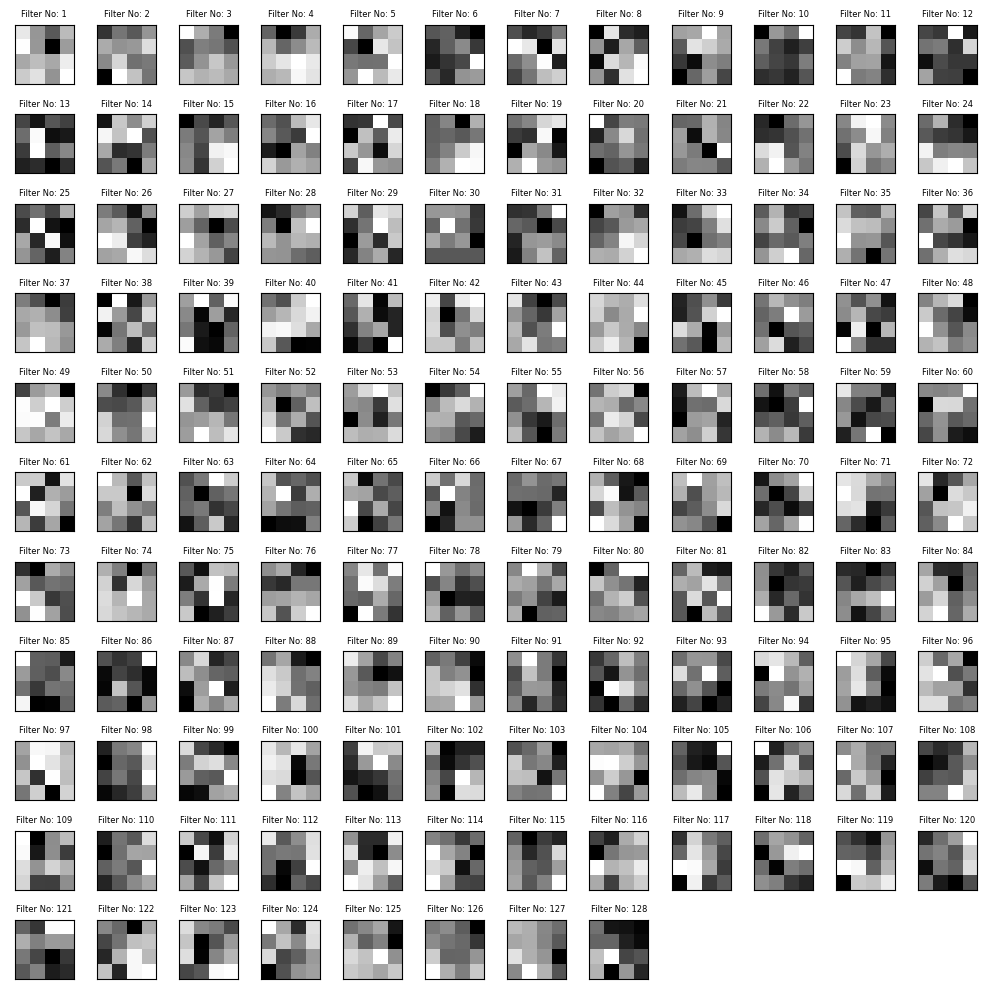


Conv Layer Name: conv2d_2, Channel No: 44


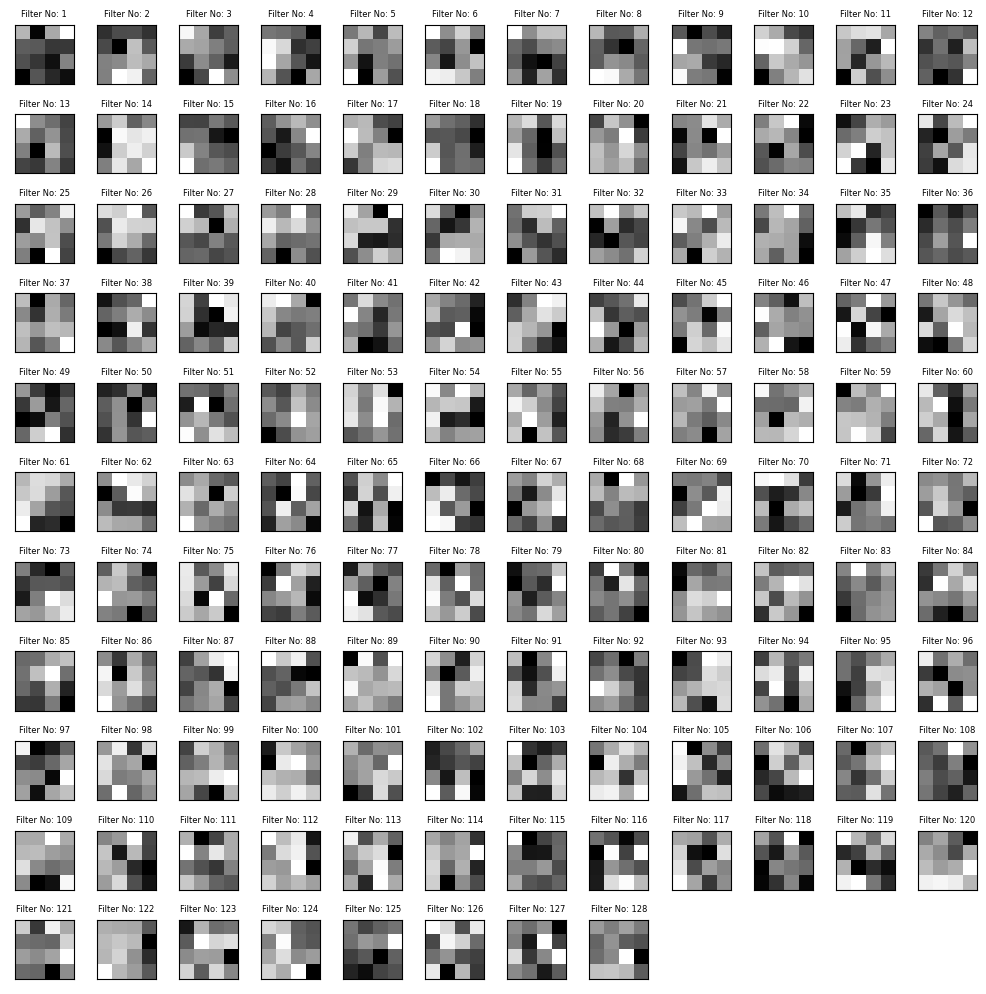


Conv Layer Name: conv2d_2, Channel No: 45


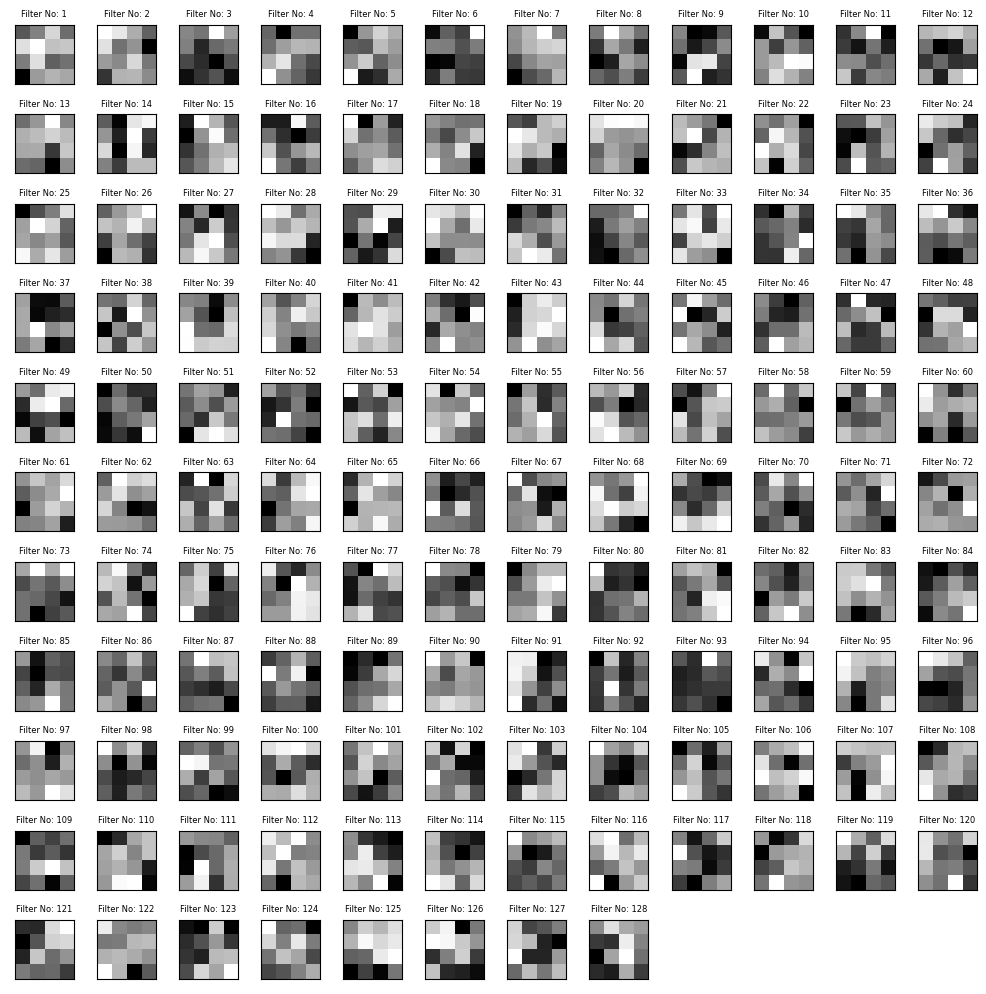


Conv Layer Name: conv2d_2, Channel No: 46


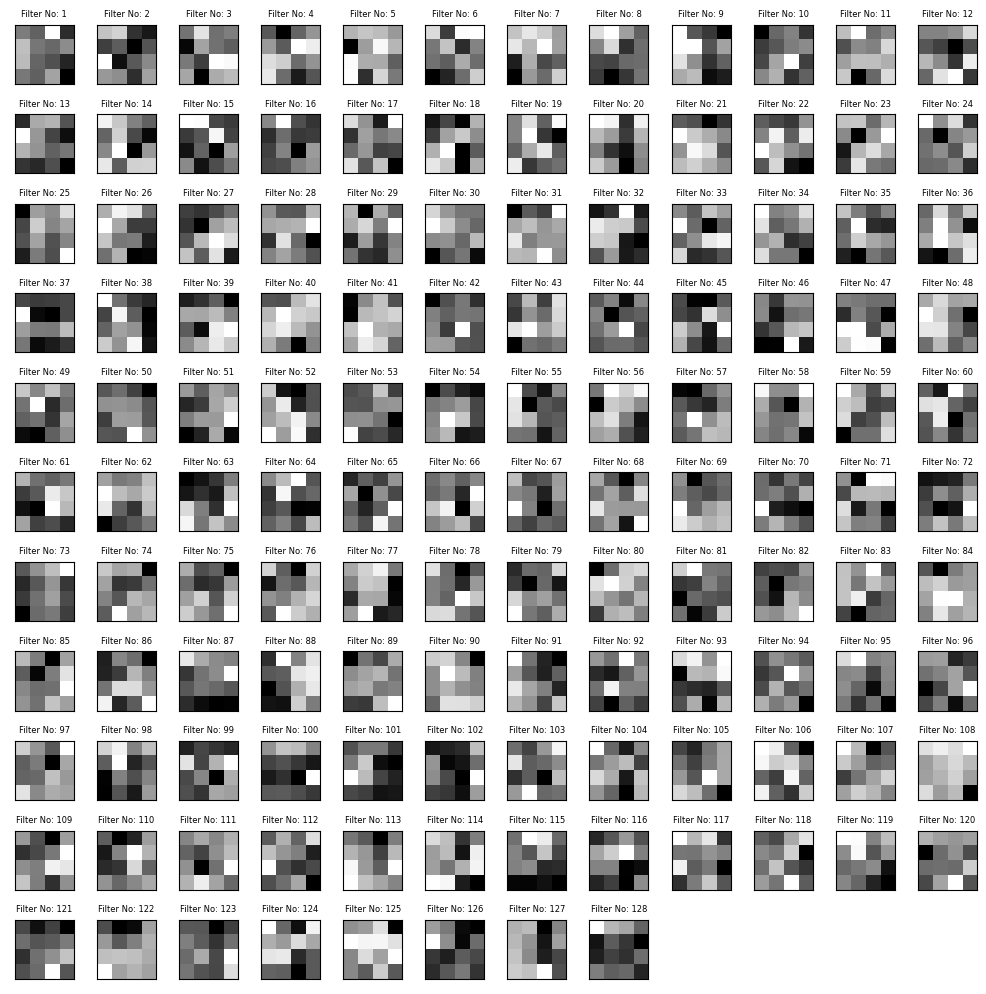


Conv Layer Name: conv2d_2, Channel No: 47


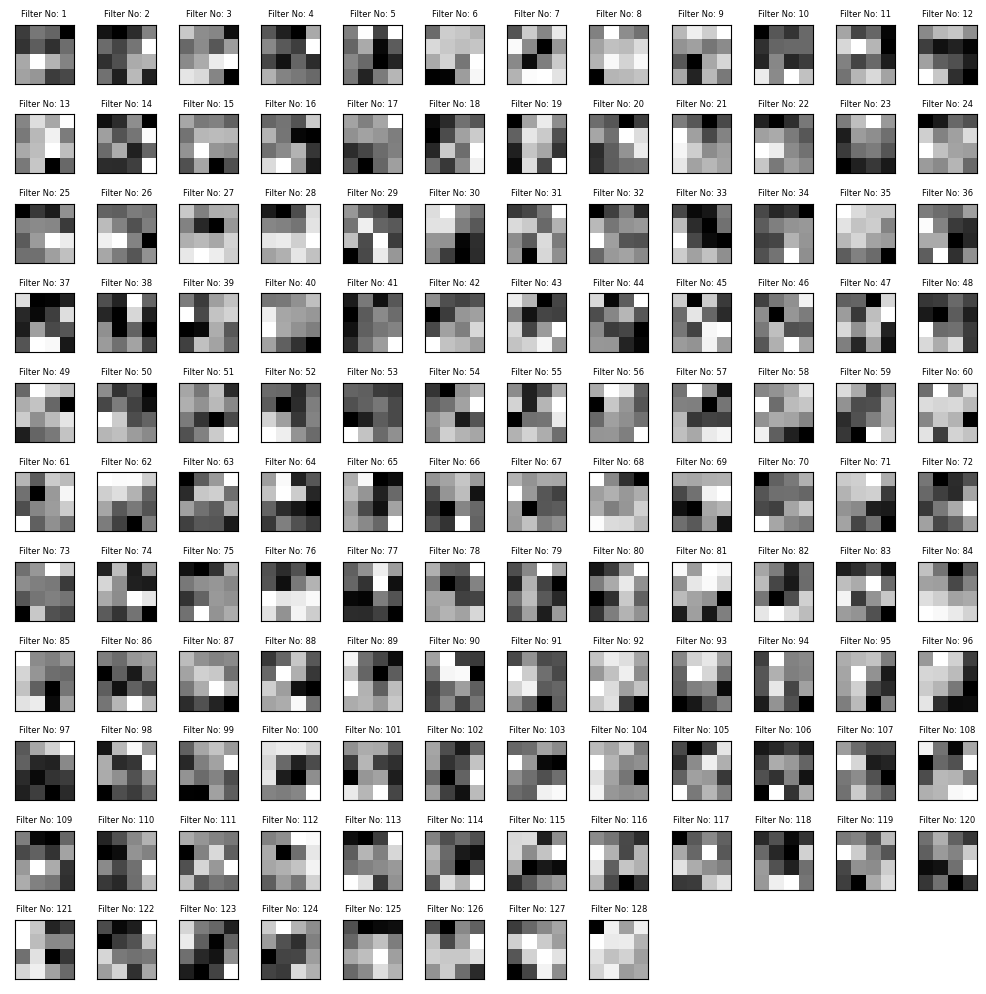


Conv Layer Name: conv2d_2, Channel No: 48


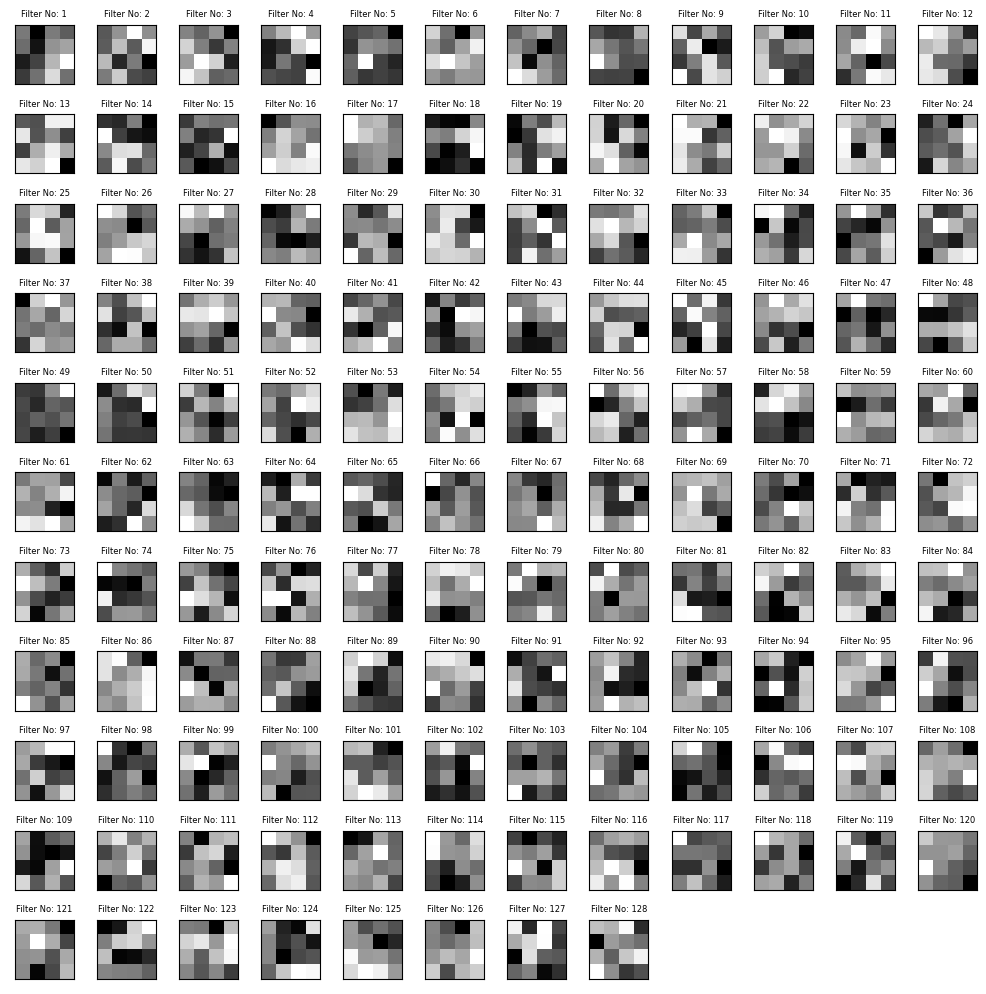


Conv Layer Name: conv2d_2, Channel No: 49


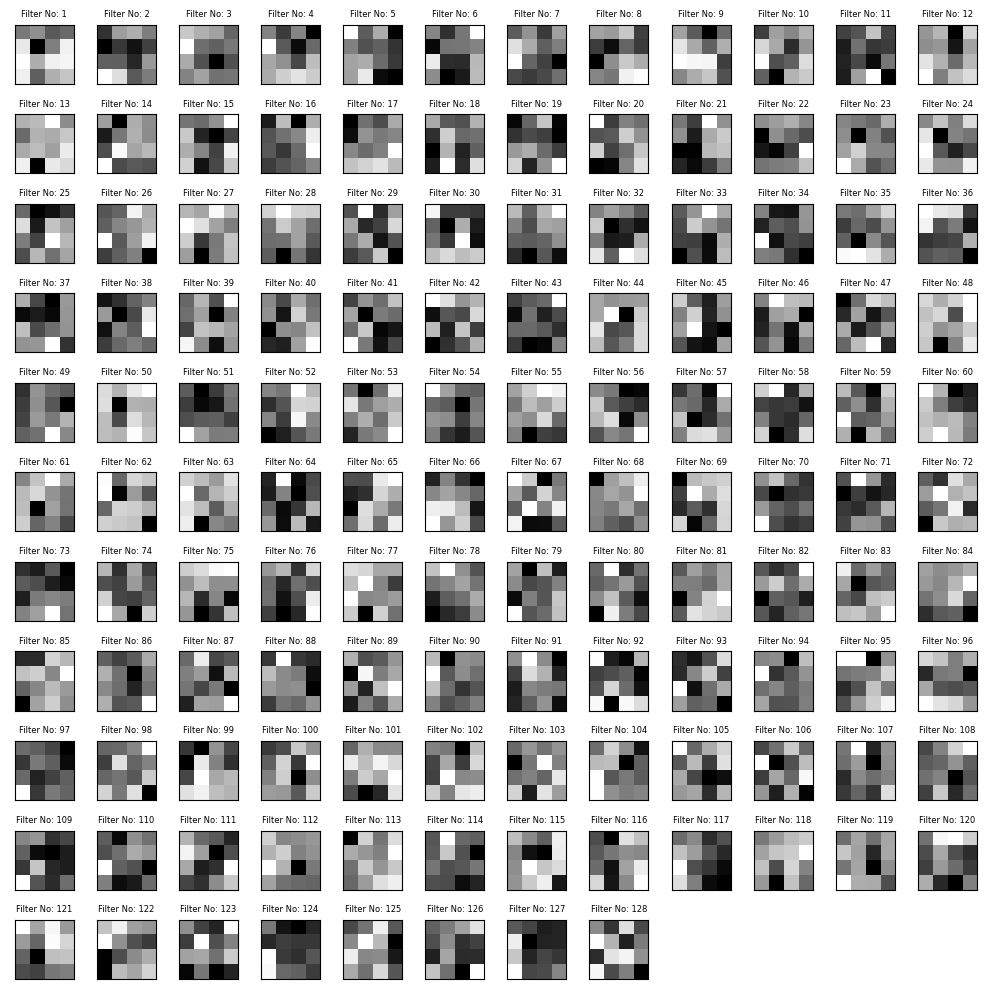


Conv Layer Name: conv2d_2, Channel No: 50


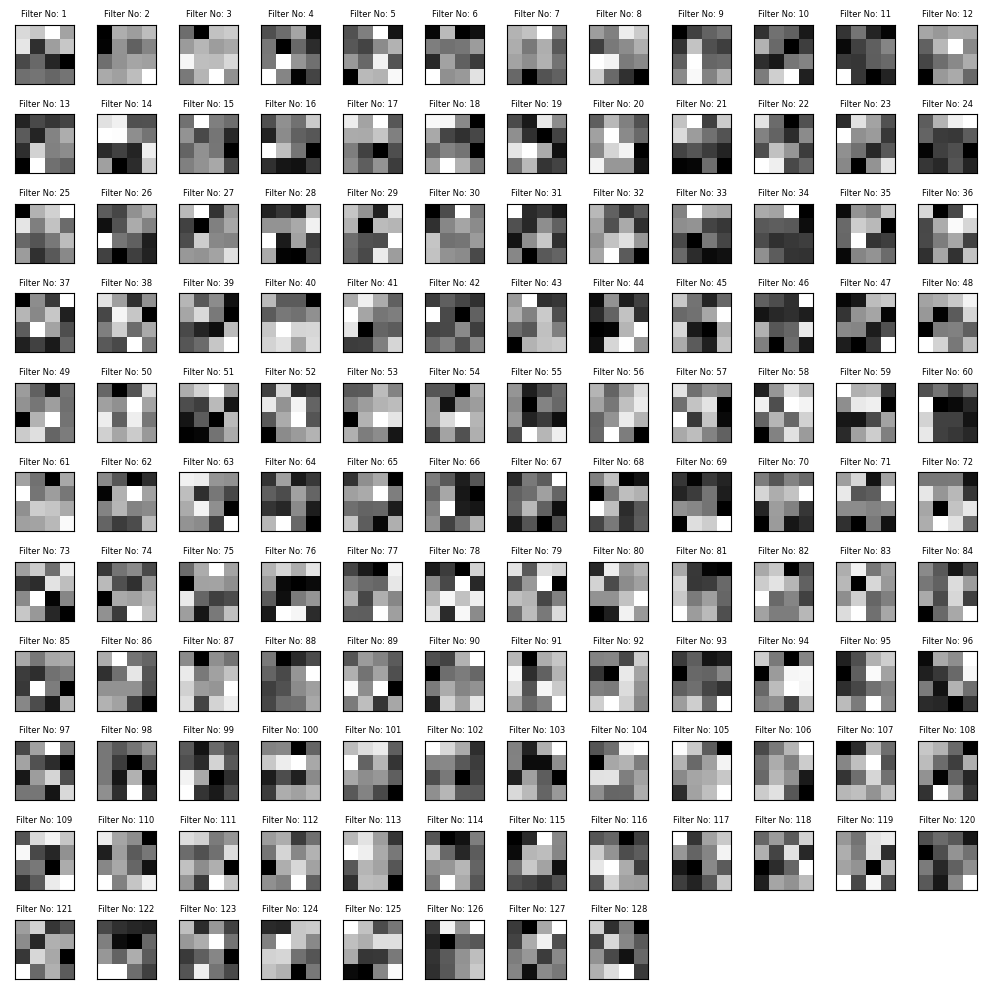


Conv Layer Name: conv2d_2, Channel No: 51


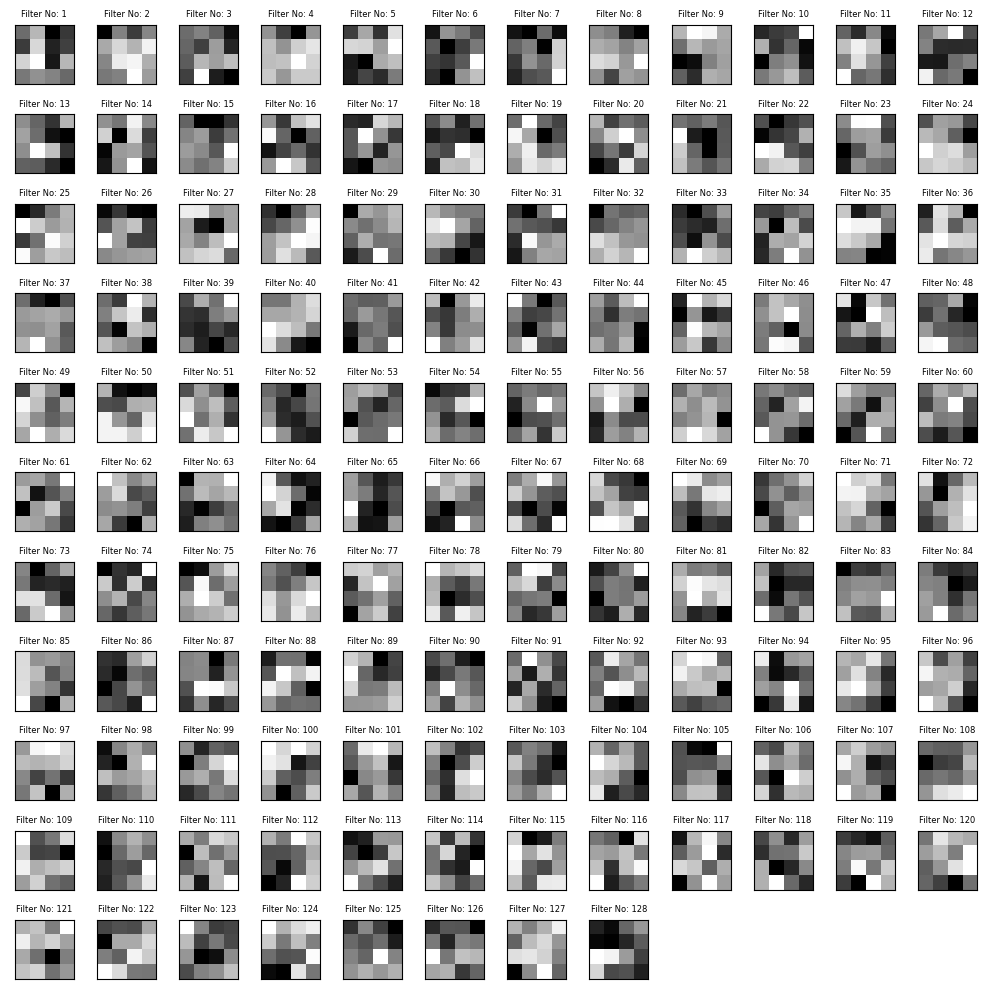


Conv Layer Name: conv2d_2, Channel No: 52


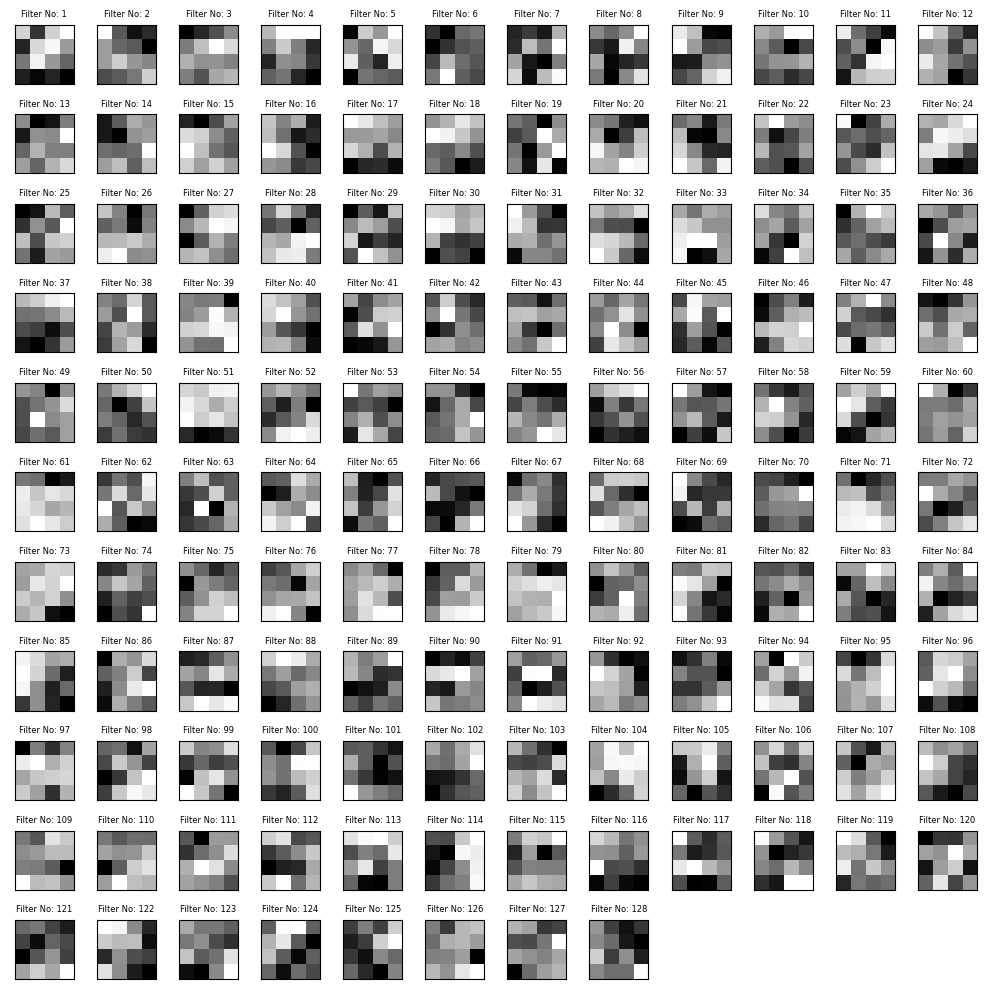


Conv Layer Name: conv2d_2, Channel No: 53


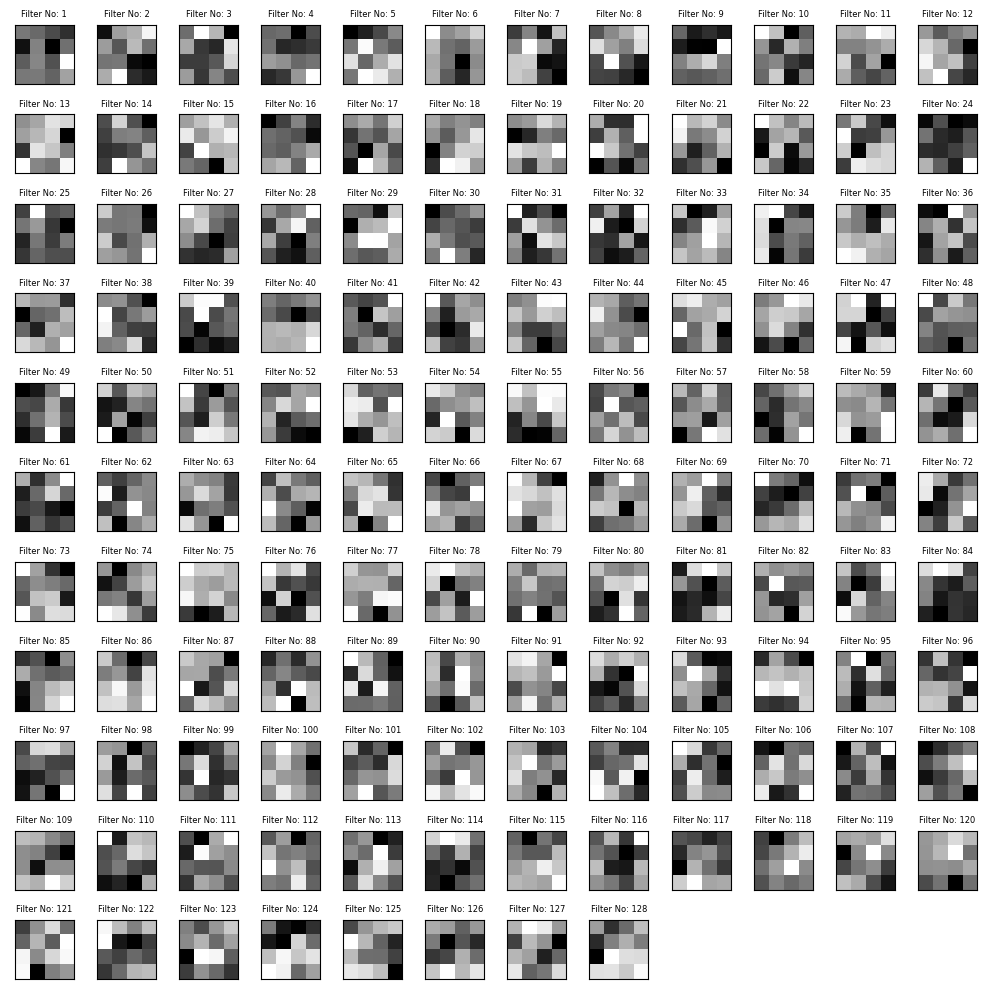


Conv Layer Name: conv2d_2, Channel No: 54


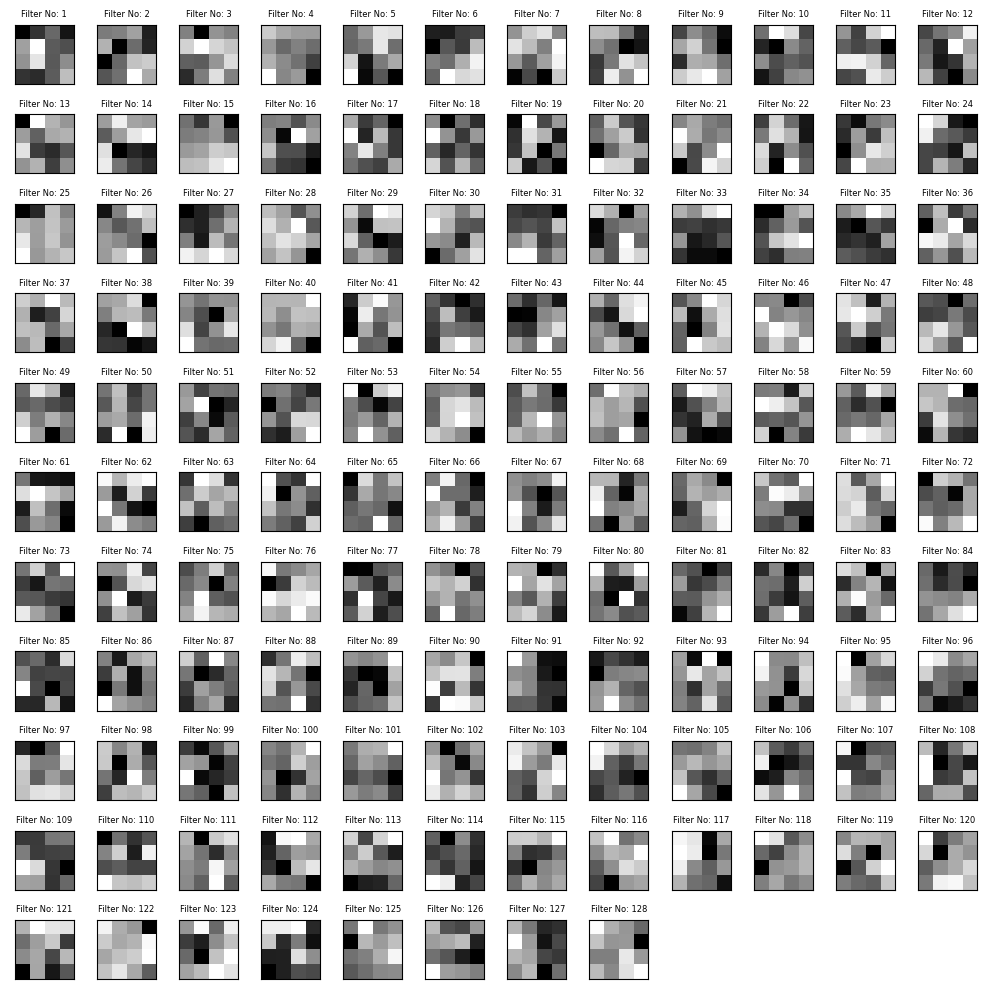


Conv Layer Name: conv2d_2, Channel No: 55


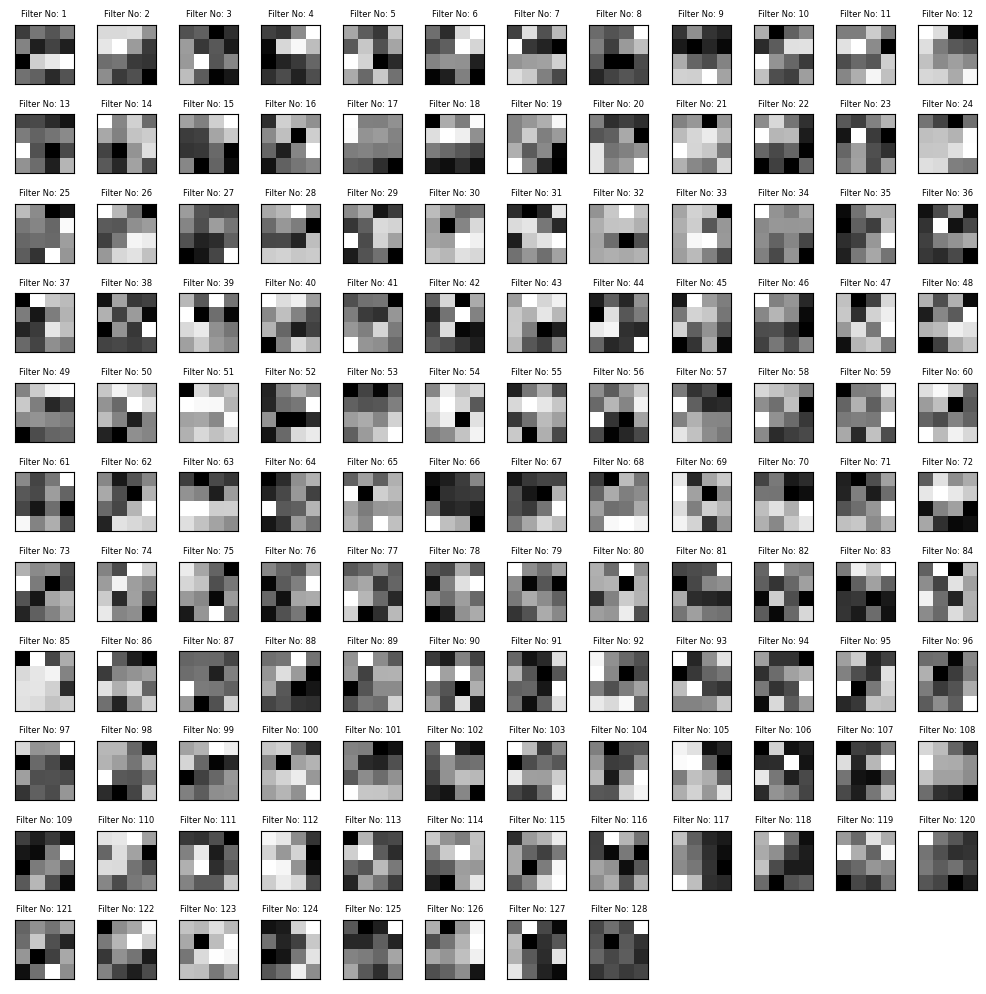


Conv Layer Name: conv2d_2, Channel No: 56


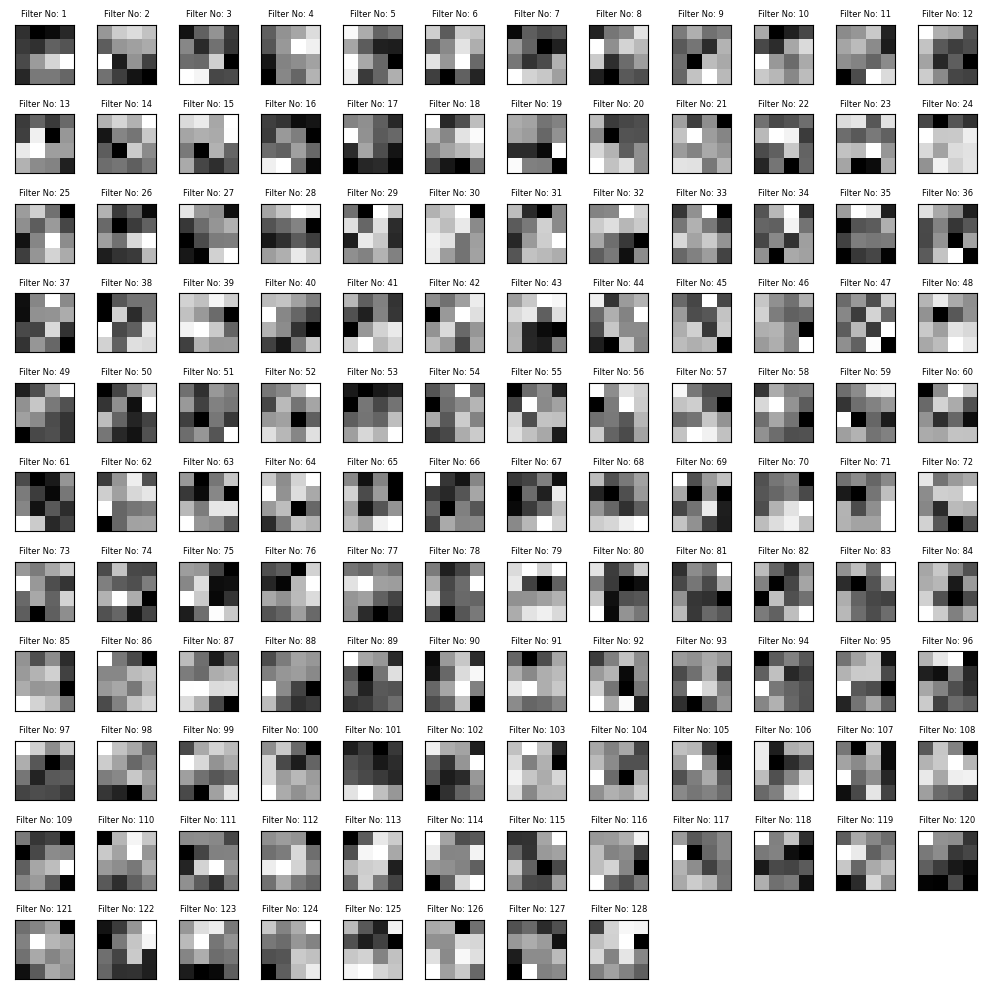


Conv Layer Name: conv2d_2, Channel No: 57


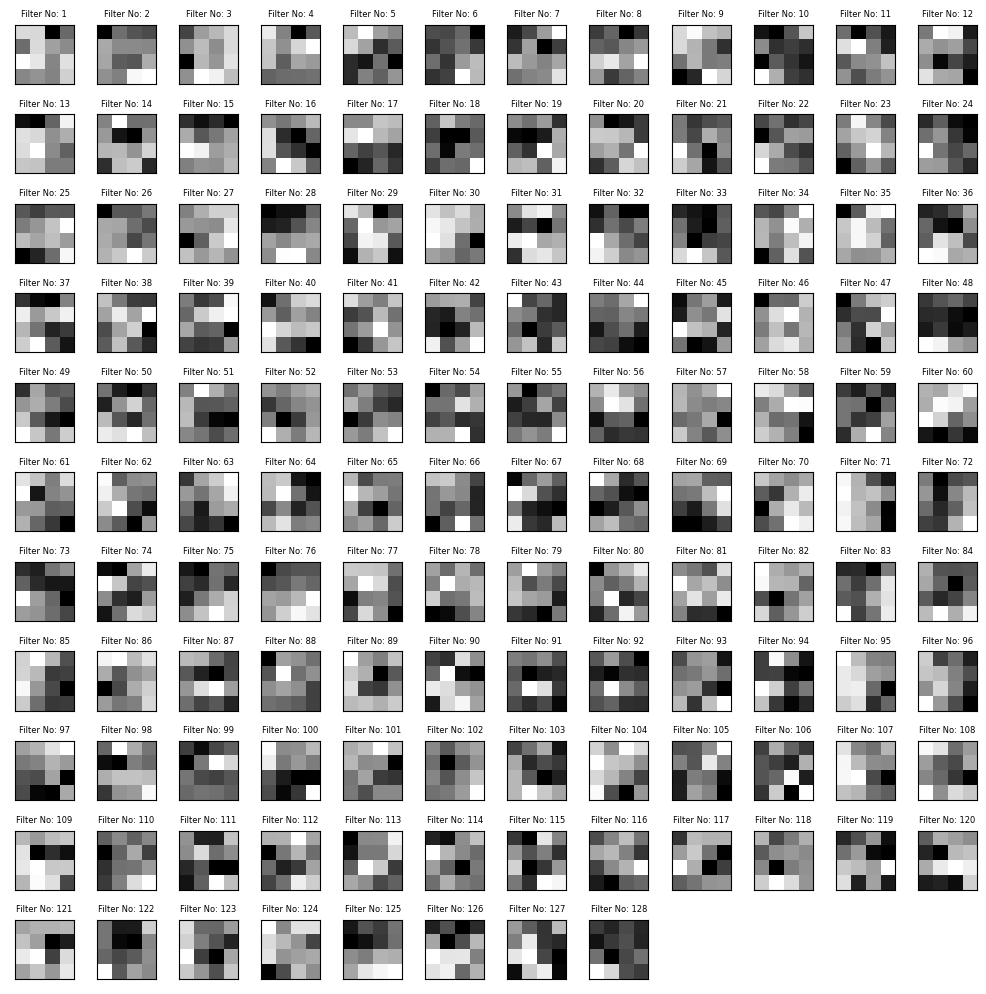


Conv Layer Name: conv2d_2, Channel No: 58


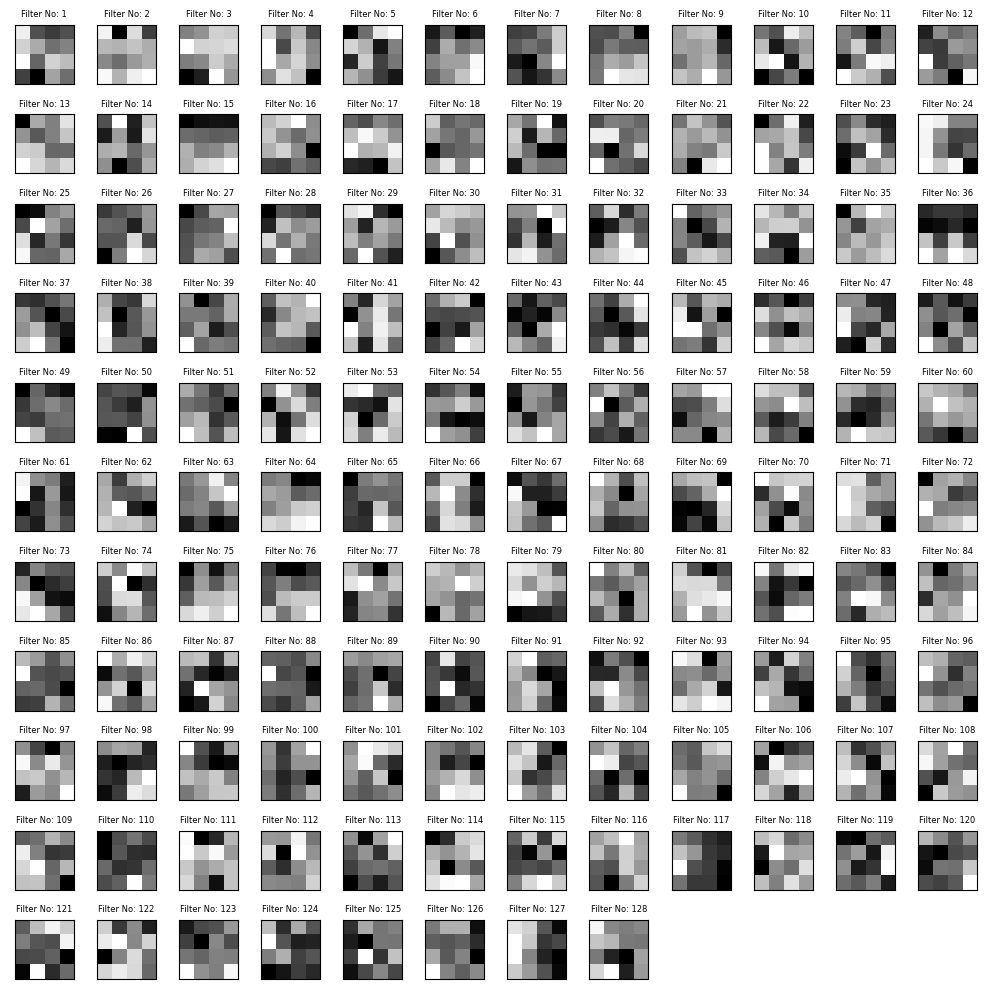


Conv Layer Name: conv2d_2, Channel No: 59


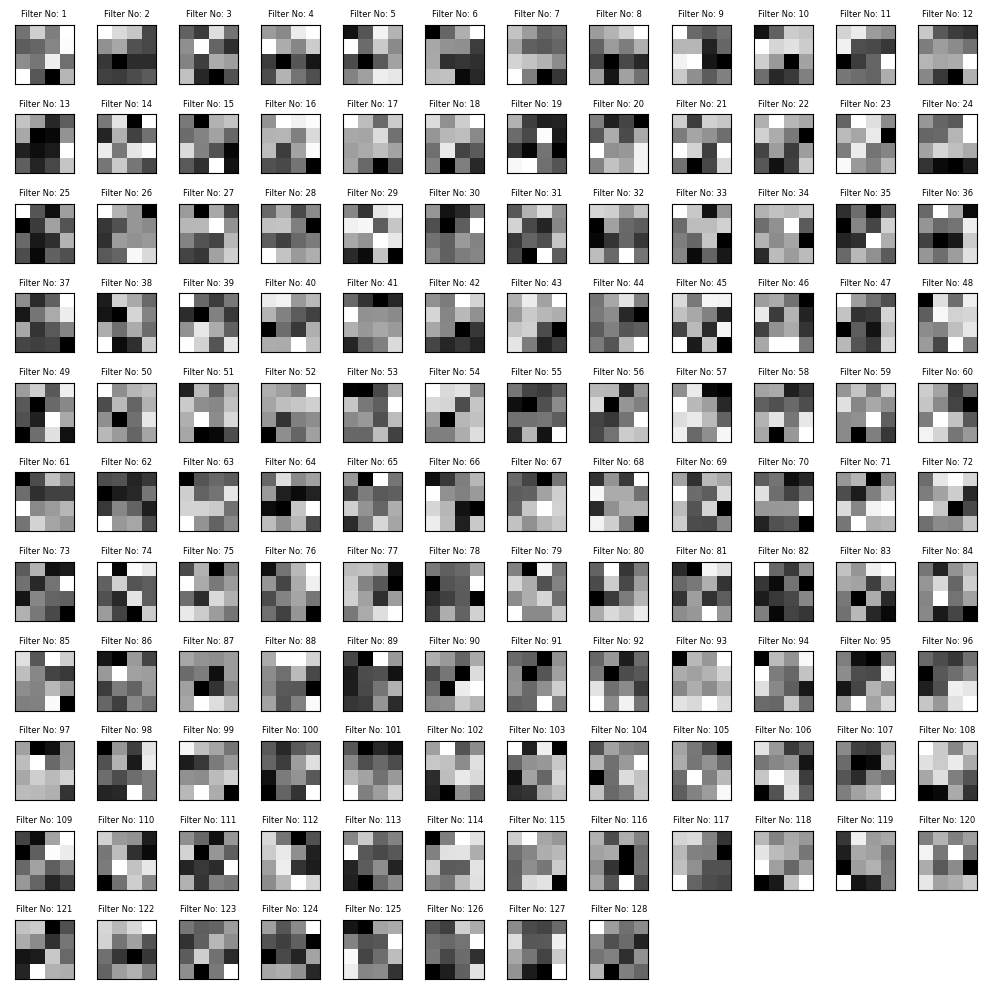


Conv Layer Name: conv2d_2, Channel No: 60


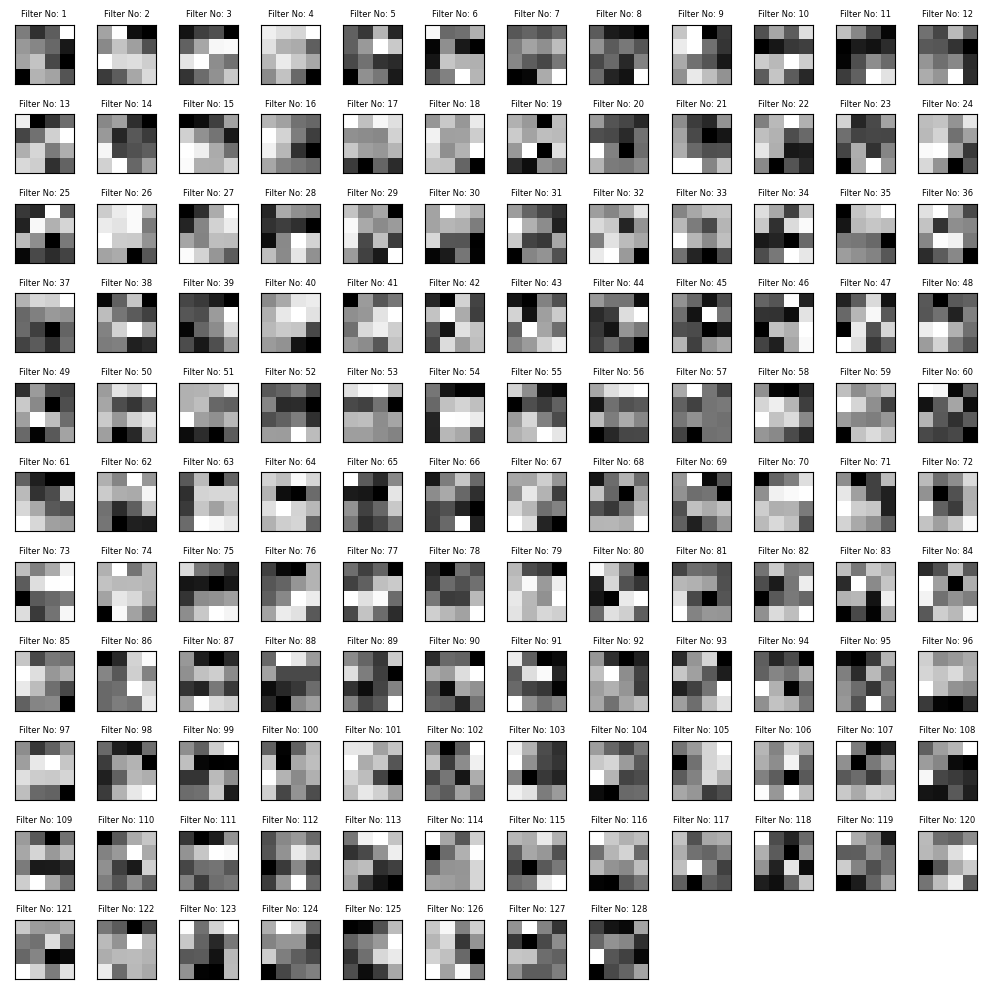


Conv Layer Name: conv2d_2, Channel No: 61


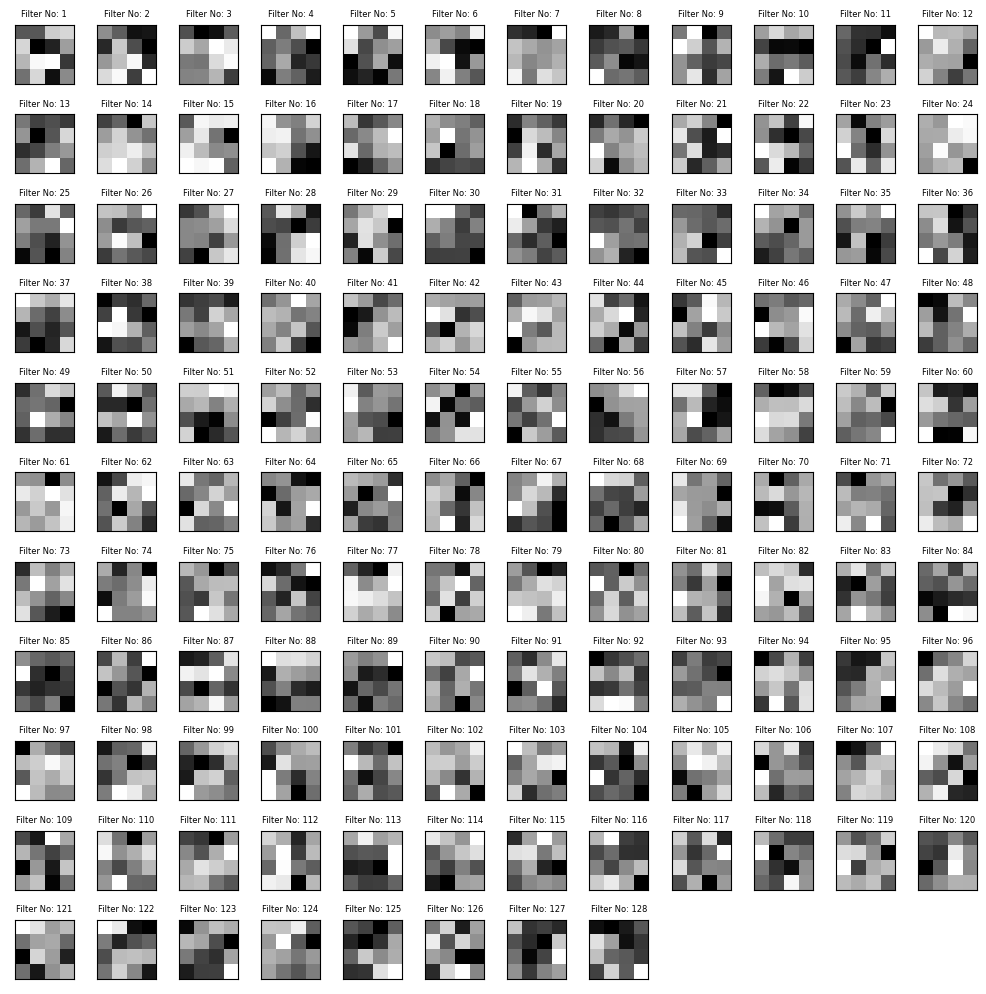


Conv Layer Name: conv2d_2, Channel No: 62


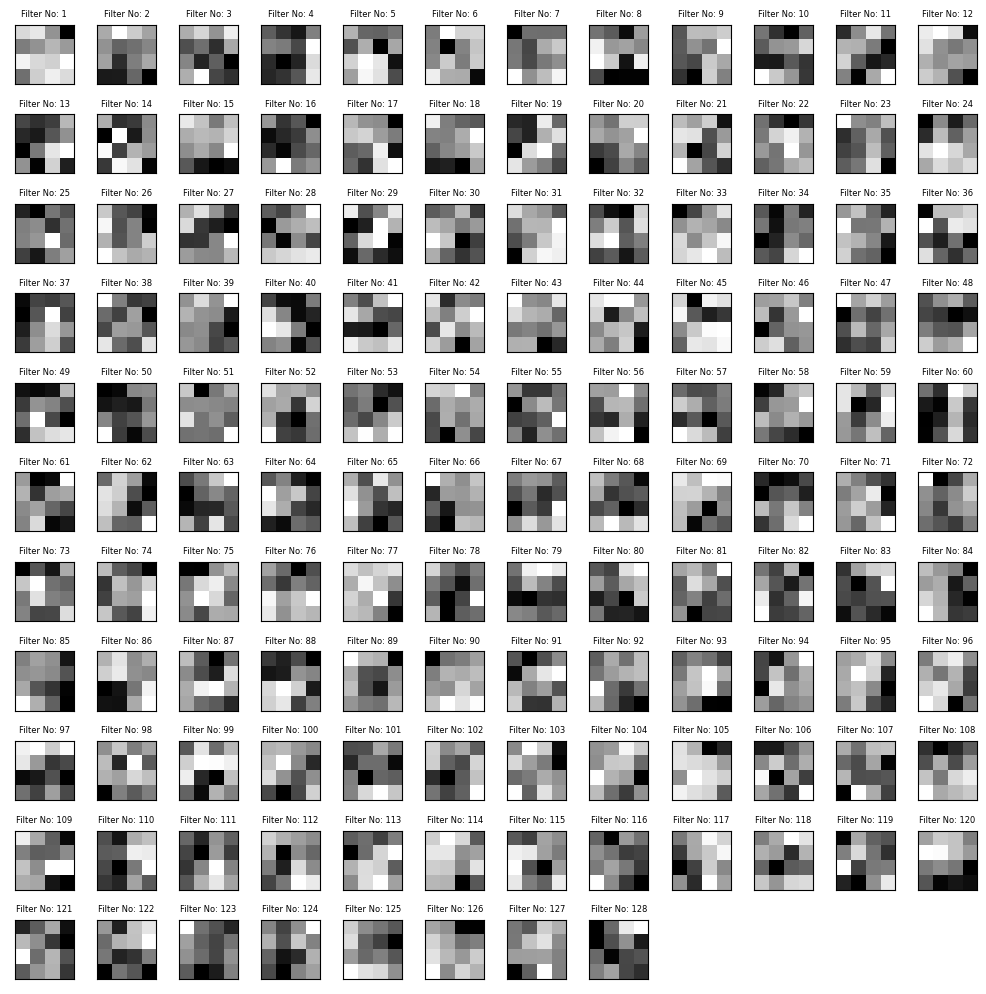


Conv Layer Name: conv2d_2, Channel No: 63


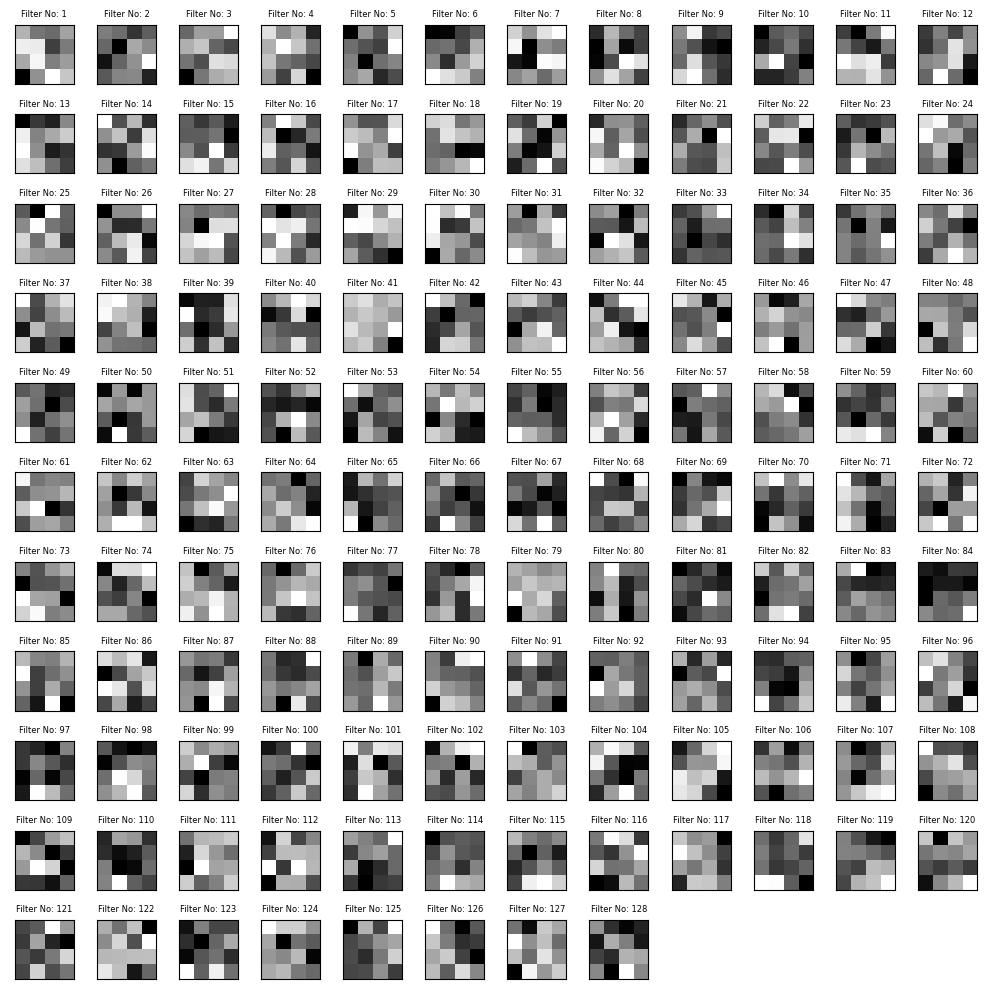


Conv Layer Name: conv2d_2, Channel No: 64


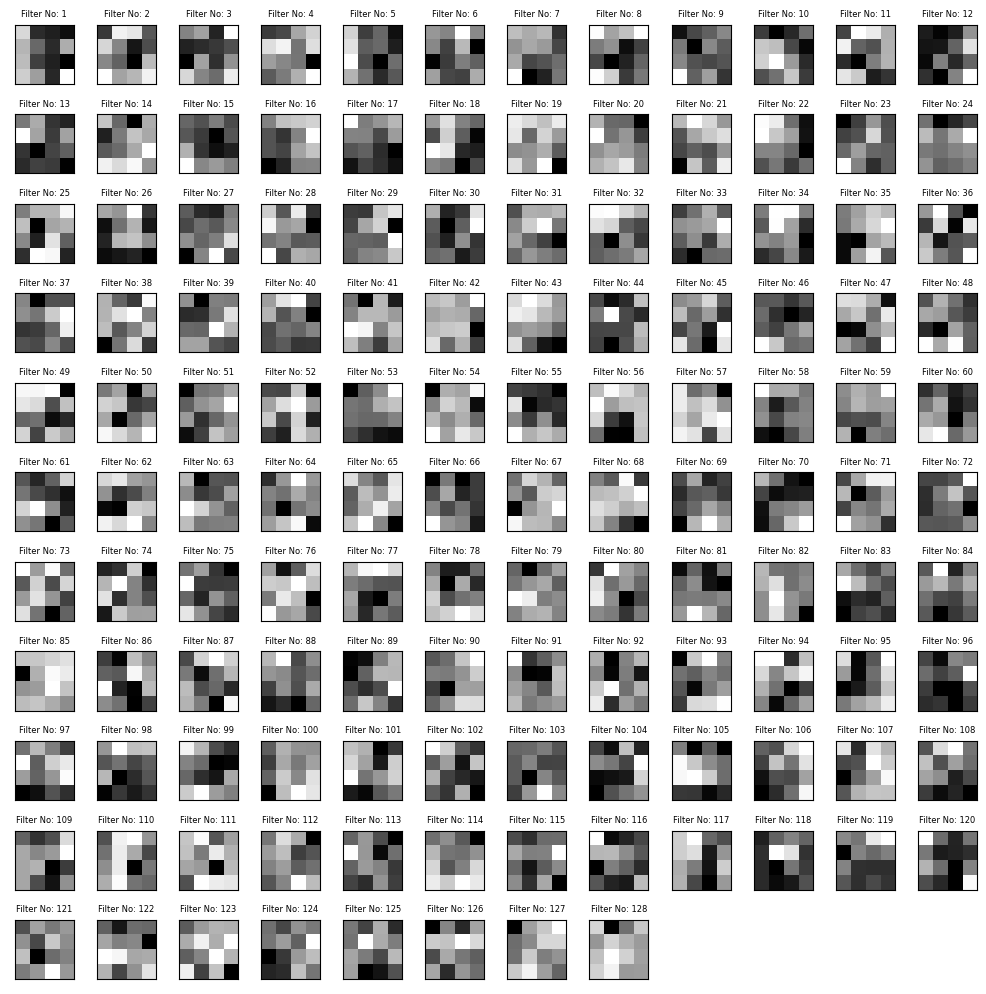

In [62]:
print(bblack+"This cell shows the weights visualization for all filters in Conv layer 1 and first channel for weights in the other 2 layers\n"+end_color)

for layer in model_being_visualized.layers:
    
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        print(bblue+f"Conv Layer Name: {layer.name}, No of Channels: {weights.shape[2]}, No of Filters per channel: {weights.shape[-1]}, Filter Size: {weights.shape[:2]}"+end_color)
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
      
        
        
        
        #plotting all the filters for all conv layers using single channel for the 2nd and 3rd layers
        for i in range(filters.shape[2]): # i refers to channels
            plt.figure(figsize=(10,10))
            filter_cnt=1
            print(BCyan+f"\nConv Layer Name: {layer.name}, Channel No: {i+1}"+end_color)
            for j in range(filters.shape[3]): # j refers to filters
            
                #get the filters
                filt=filters[:,:,i, j]
                n_images_per_row = 8
                n_filters = filters.shape[3]
                r = int(np.sqrt(n_filters))
                c = int(np.ceil(n_filters/r))

                ax= plt.subplot(r, c, filter_cnt)
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_title(f"Filter No: {filter_cnt}", fontsize=6)
                plt.imshow(filt, cmap="gray") # we print first channel of each filter 
                filter_cnt+=1
            plt.tight_layout()
            plt.show()

#### 2. Visualizing Filters using Gradient Ascent in Input Space.

Here we search for input that maximizes filters output by applying gradient ascent to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image. The resulting input image will be one that the chosen filter is maximally responsive to.

The process is  to build a loss function that maximizes the value of a given filter in a given convolution layer, then use stochastic gradient ascent to adjust the values of the input image so as to maximize this activation value.

In [64]:
# Helper Functions

def get_sub_model(model, layer_name):
    
    return tf.keras.models.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)


def create_noisy_image():
    
    return np.random.random((28, 28,1))



# Function to perform Gradient Ascent
def visualize_using_G_Ascent( submodel, image=None,f_index=None,iterations=100, learning_rate=10, filter_=True):
    
   
    num_filters= submodel.output.shape[-1]
    if f_index is None: # if no filter index is given select random one
        f_index = random.randint(0, num_filters - 1)
        
        
    image=tf.convert_to_tensor(image)
    
    for i in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(image)
            if filter_:
                out = submodel(tf.expand_dims(image, axis=0))[:,:,:,f_index]
            else: 
                out = submodel(tf.expand_dims(image, axis=0)) # this is for Deep Dream Images
            loss= tf.math.reduce_mean(out)
        # Calculate gradient of the loss with respect to the pixels of the input image
        grads = tape.gradient(loss, image)
        grads = tf.math.l2_normalize(grads)
        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # we update the image by directly adding the gradients ( they are of the same shape!)
        image += grads*learning_rate
   
    return image 




In [65]:
# main function for filters visualization using G Ascent

def visualize_filters_using_G_Ascent(model_being_visualized, conv_layers_names, iterations, lr):
    sub_models = [get_sub_model(model_being_visualized, layer_name) for layer_name in conv_layers_names]

    filters_visualized_using_gradient_ascent = [np.empty((1,28,28,32)),np.empty((1,28,28,64)),np.empty((1,28,28,128))]
   
    image = create_noisy_image() # use noisy image for filters visualization
    
    for i, sub in enumerate(sub_models):
        n_filters= sub.output.shape[-1]

       
        for f in range(n_filters):
            v = visualize_using_G_Ascent(sub, image, f_index=f, iterations=iterations, 
                                         learning_rate=lr, filter_=True)
            filters_visualized_using_gradient_ascent[i][:,:,:, f] = np.expand_dims(v, axis=0)[:,:,:,0]
            
    return filters_visualized_using_gradient_ascent

In [66]:
# maximally activate filters using noisy input image, we used step of 10 to quickly maximize the activation
# running this may take a while.

filters_G_Ascent = visualize_filters_using_G_Ascent(model_being_visualized, conv_layers_names, iterations=100, lr=10)

Note: We will plot the visualization of filters using the maximal activation after we calculate the feature maps of each conv layer for image "2" and "9", then we will plot them next to each other.

### Activations / Feature Maps Visualization

The output of a convolution layer is 3D volume. The height and width correspond to the dimensions of the feature map, and each depth (channel) is a distinct feature map encoding independent features, number of feature maps from each conv layer correspond to the number of filters in that layer.


We will visualize individual feature maps by plotting each channel as a 2D image for 2 images (2 & 9).

Note: We don't need to process the images since we are taking images from the test data that has already been procesed not new ones.

Original Images for '2' & '9'


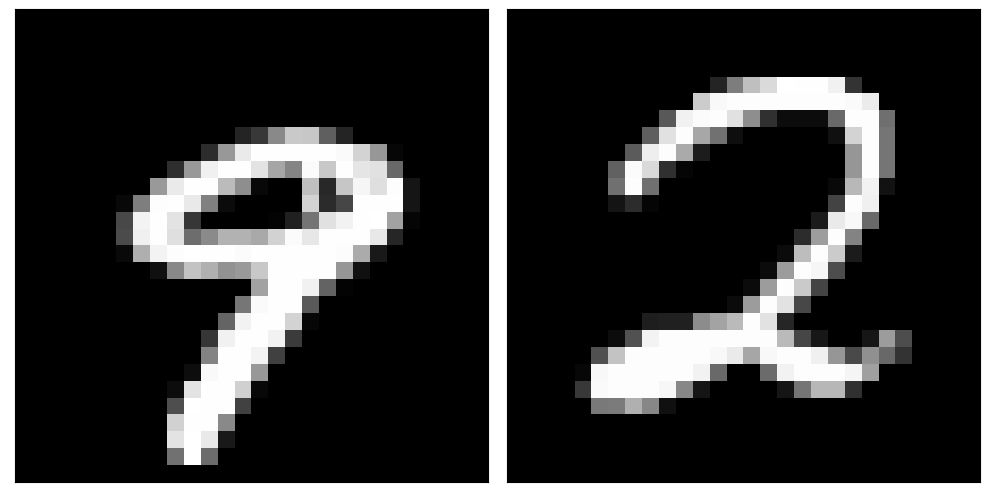

In [67]:
# picking two images one for digit "2" and another for digit "9"

image_2 = deepcopy(x_test[np.where(np.argmax(y_test, axis=1)==2)[0][1]])
image_9 = deepcopy(x_test[np.where(np.argmax(y_test, axis=1)==9)[0][1]])

plt.figure(figsize=(10,10))
print("Original Images for '2' & '9'")
for i, j in enumerate([ image_9, image_2]):
    
    ax= plt.subplot(1, 2, i+1)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(j, cmap="gray")
plt.tight_layout()    
plt.show()

In [68]:
# getting the Conv layers outputs

layer_outputs = [layer.output for layer in model_being_visualized.layers if "conv" in layer.name]

layer_outputs

[<KerasTensor: shape=(None, 25, 25, 32) dtype=float32 (created by layer 'conv2d')>,
 <KerasTensor: shape=(None, 11, 11, 64) dtype=float32 (created by layer 'conv2d_1')>,
 <KerasTensor: shape=(None, 4, 4, 128) dtype=float32 (created by layer 'conv2d_2')>]

In [69]:
# model feature maps for our Conv network

feature_map_model = tf.keras.models.Model(inputs=model_being_visualized.input, outputs=layer_outputs)

Working on image_2 . . .

1/1 [==============================] - 0s 41ms/step

Number of Activations for image_2 is: 3

Feature Maps Visualization for image_2 . . .

Layer Name: conv2d

Number of Channels: 32


C:\Users\Mohd\AppData\Local\Temp\ipykernel_40208\424523517.py:32: RuntimeWarning: invalid value encountered in true_divide
  c /= c.std()


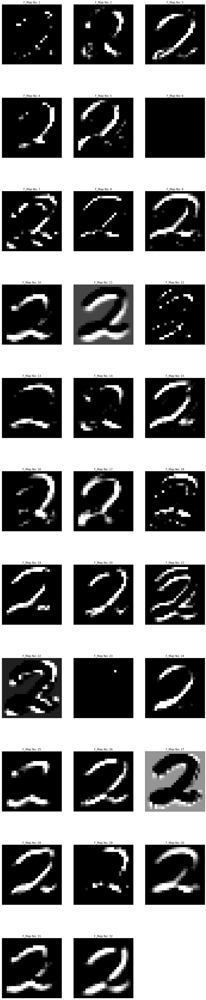

Layer Name: conv2d_1

Number of Channels: 64


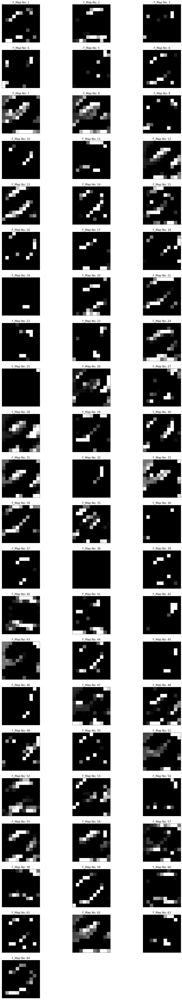

Layer Name: conv2d_2

Number of Channels: 128


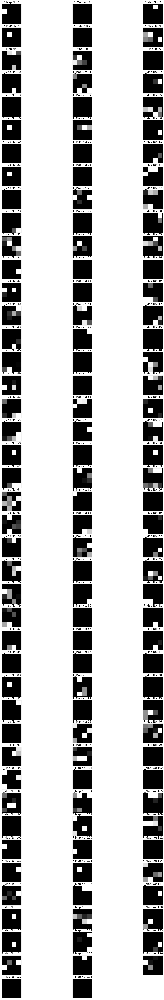

Working on image_9 . . .

1/1 [==============================] - 0s 15ms/step

Number of Activations for image_9 is: 3

Feature Maps Visualization for image_9 . . .

Layer Name: conv2d

Number of Channels: 32


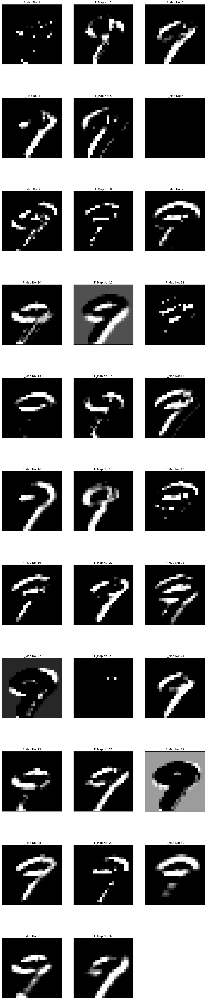

Layer Name: conv2d_1

Number of Channels: 64


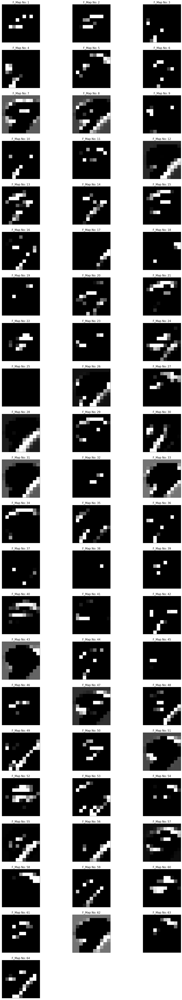

Layer Name: conv2d_2

Number of Channels: 128


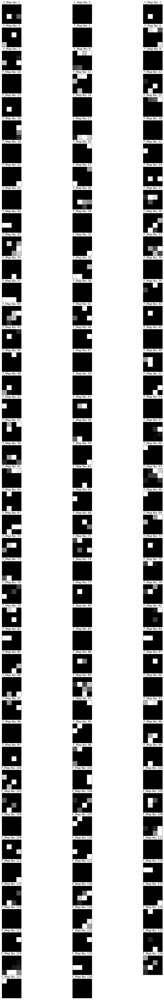

In [70]:
# First we will plot Feature maps of each Conv Layer for both images before we put them 
# together with filters to have better look at them in large scale images

target_images = {"image_2": image_2, "image_9": image_9}
activations_2_9 = []
for key, image in target_images.items():
    print(f"Working on {key} . . .", end="\n\n")
    # we need to reshape the images to be (No of images=1, Size, Size, No of channels) as we are passing each image to the predict method individualy.
    image = np.expand_dims(image, axis=0)   
    activations = feature_map_model.predict(image)
    activations_2_9.append(activations)
    # we have 3 conv layers, length of the activations per image must match
    print()
    print(f"Number of Activations for {key} is: {len(activations)}", end="\n\n")
    
    # Feature Map Visualization
    print(bblack+f"Feature Maps Visualization for {key} . . ."+end_color, end="\n\n")
    
    for layer_name, feature_maps in zip(conv_layers_names, activations):
        print(bblack+"Layer Name: "+end_color+bblue+layer_name+end_color, end="\n\n")
        plt.figure(figsize=(20,100))
        size = feature_maps.shape[2] # it can be index 1 or 2
        channels = feature_maps.shape[-1] # number of channels is based on the filters in that layer
        print(f"Number of Channels: {channels}")
       
        for i in range(channels):
          
            c = deepcopy(feature_maps[0,:,:,i]) # taking each channel separatly
            
            # making the image visible to human eye   
            c -= c.mean()   
            c /= c.std()
            c *= 64
            c += 128
            c = np.clip(c, 0, 255).astype('uint8')
           
        
            col = 3
            row = int(np.ceil(channels/col))
            ax= plt.subplot(row, col, i+1)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(f"F_Map No: {i+1}", fontsize=15)
            plt.imshow(c,cmap="gray")
            
        
        plt.show()
  

Now we plot the filters visualized by maximally activating the input space using Gradient Ascent next to the activations of each conv layer

In [71]:


# function to plot both feature maps and filters as a grid next to each other.
def plot_grid(conv_layers_names, activations, filters, images_per_row=4, grey=True):
    

    for layer_name, feature_maps, filters in zip(conv_layers_names, activations, filters):        
        channels = feature_maps.shape[-1]                               

        size_features = feature_maps.shape[1]  
        size_filters = filters.shape[1]

        n_rows = channels // images_per_row                                 
        display_grid_features = np.zeros((size_features * n_rows, images_per_row * size_features))
        display_grid_filters = np.zeros((size_filters * n_rows, images_per_row * size_filters))
        
        # looping throgugh the grid of features and filters
        for row in range(n_rows):                                             
            for col in range(images_per_row):
                image_f_map = feature_maps[0, :, :, row * images_per_row + col]
                image_filter = filters[0, :, :, row * images_per_row + col]

                # scaling images to be visible to human eye.
                image_f_map -= image_f_map.mean()   
                image_filter -= image_filter.mean()  
                image_f_map /= image_f_map.std()
                image_filter /= image_filter.std()
                image_f_map *= 64
                image_filter *= 64
                image_f_map += 128
                image_filter += 128
                image_f_map = np.clip(image_f_map, 0, 255).astype('uint8')
                image_filter = np.clip(image_filter, 0, 255).astype('uint8')
                
                display_grid_features[row * size_features : (row + 1) * size_features,                   
                             col * size_features : (col + 1) * size_features] = image_f_map
                
                display_grid_filters[row * size_filters : (row + 1) * size_filters,                   
                             col * size_filters : (col + 1) * size_filters] = image_filter
              
        plt.figure(figsize=(20,100))
       
        for i, j in enumerate([display_grid_features, display_grid_filters]):
            
            titles = ["Feature Maps", "Filters"]
            ax= plt.subplot(1, 2, i+1)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(titles[i]+" - "+ layer_name, fontsize=20)
            
            if not grey:
                
                plt.imshow(j)
            else: 
                
                plt.imshow(j, cmap="gray")
            
     #   plt.savefig(f'{layer_name}_{i}.jpg')

        
        plt.show()

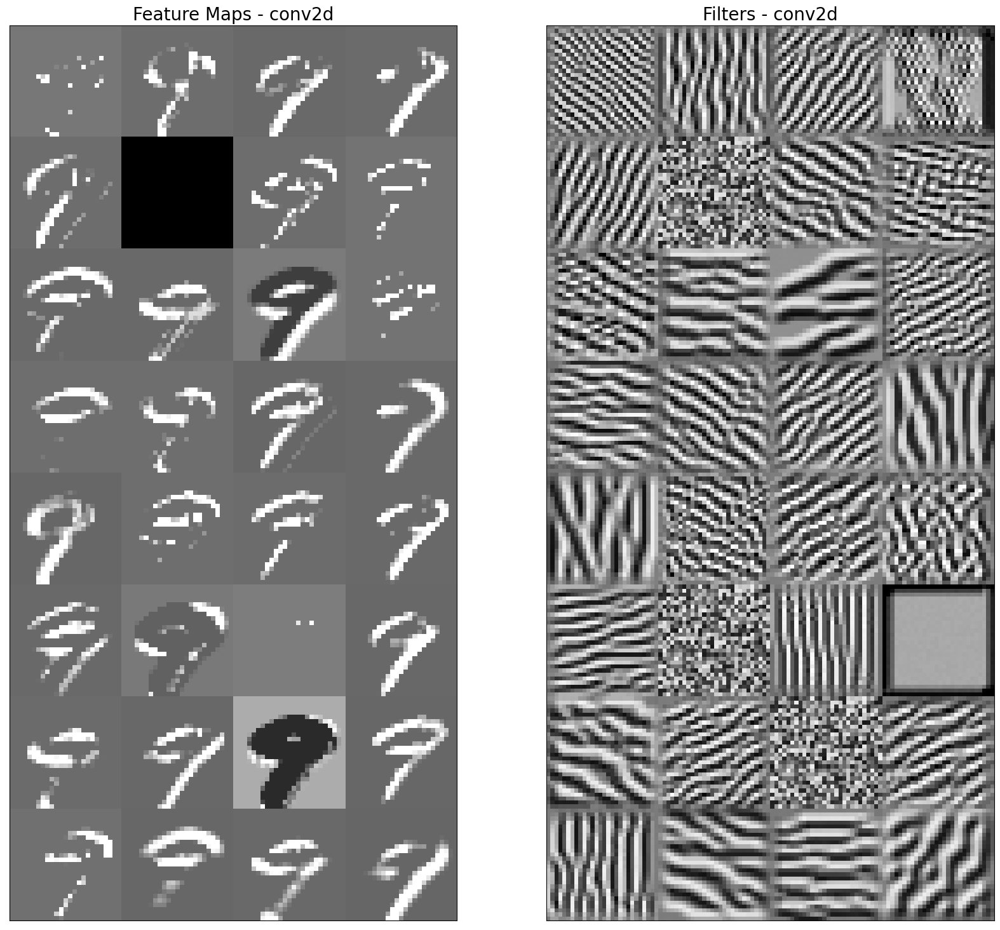

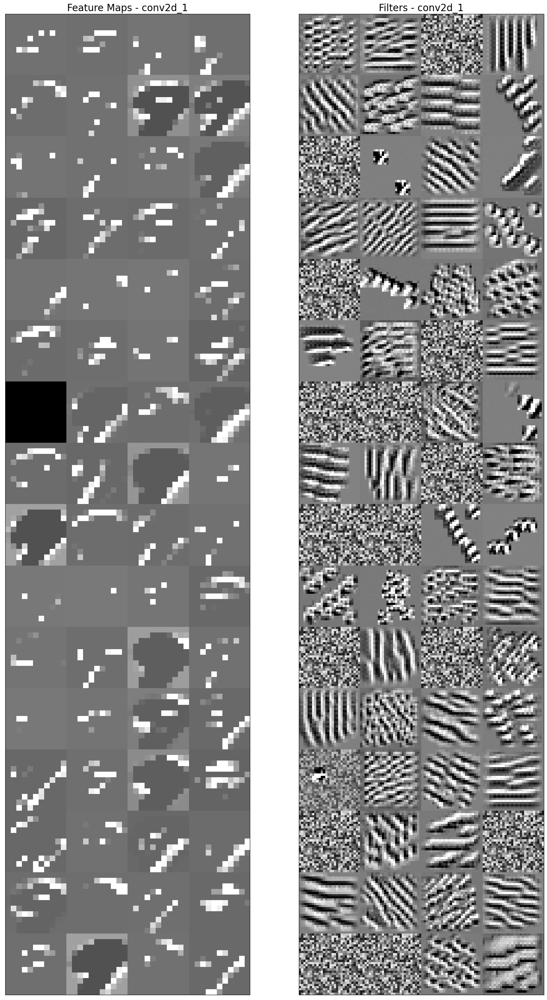

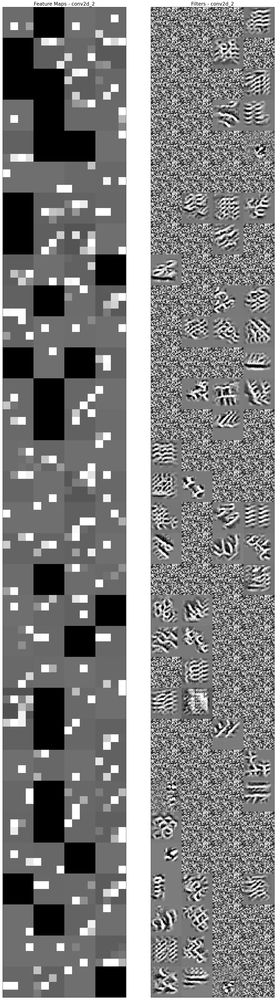

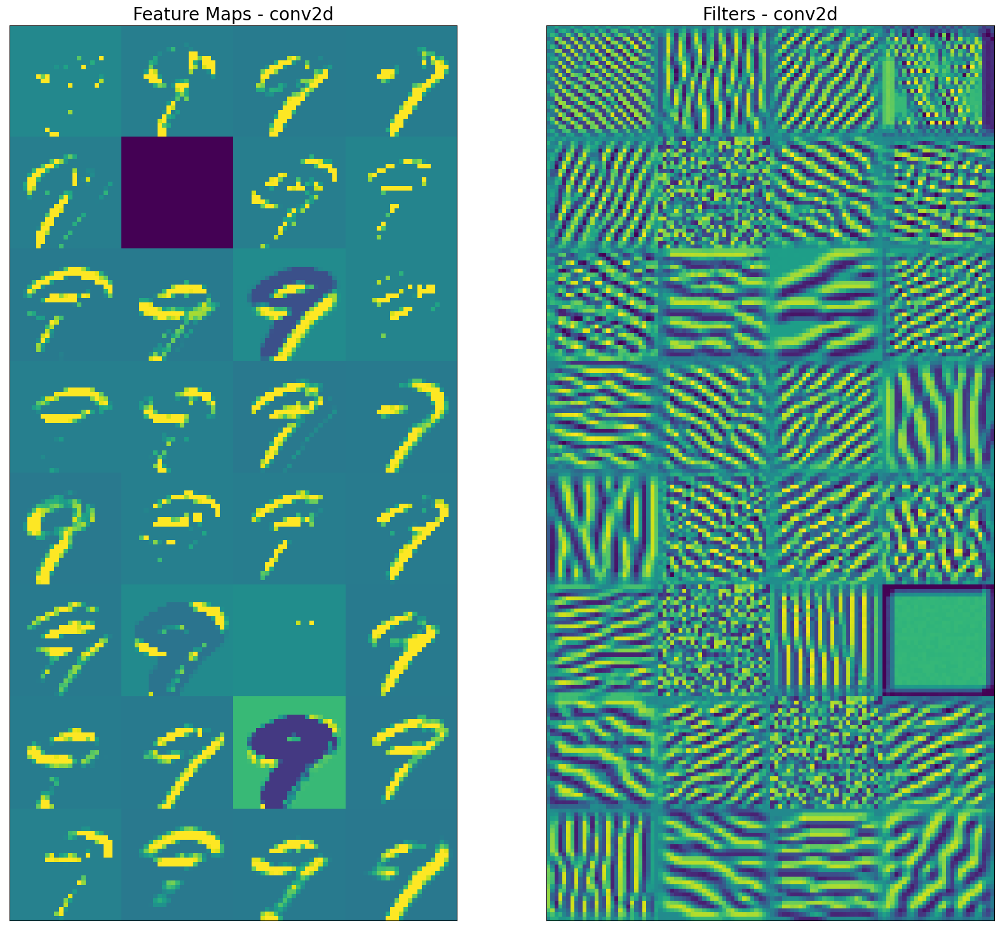

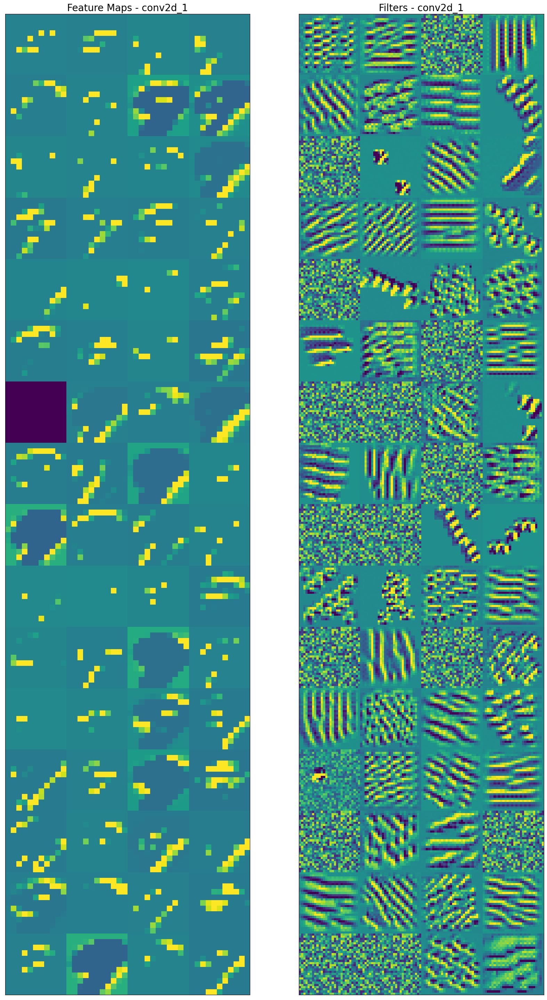

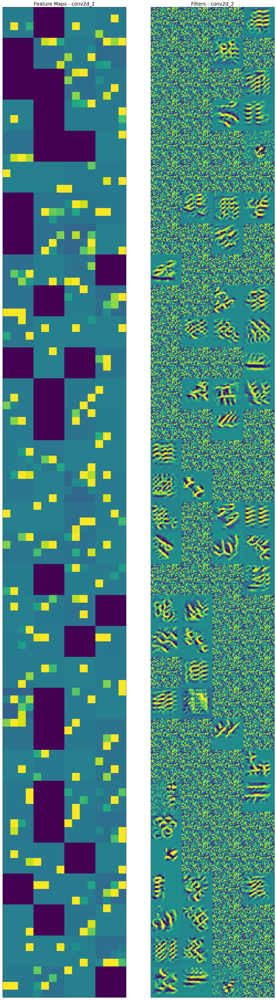

In [79]:
#9

plot_grid(conv_layers_names, activations_2_9[1], filters_G_Ascent, images_per_row=4)
plot_grid(conv_layers_names, activations_2_9[1], filters_G_Ascent, images_per_row=4, grey=False)

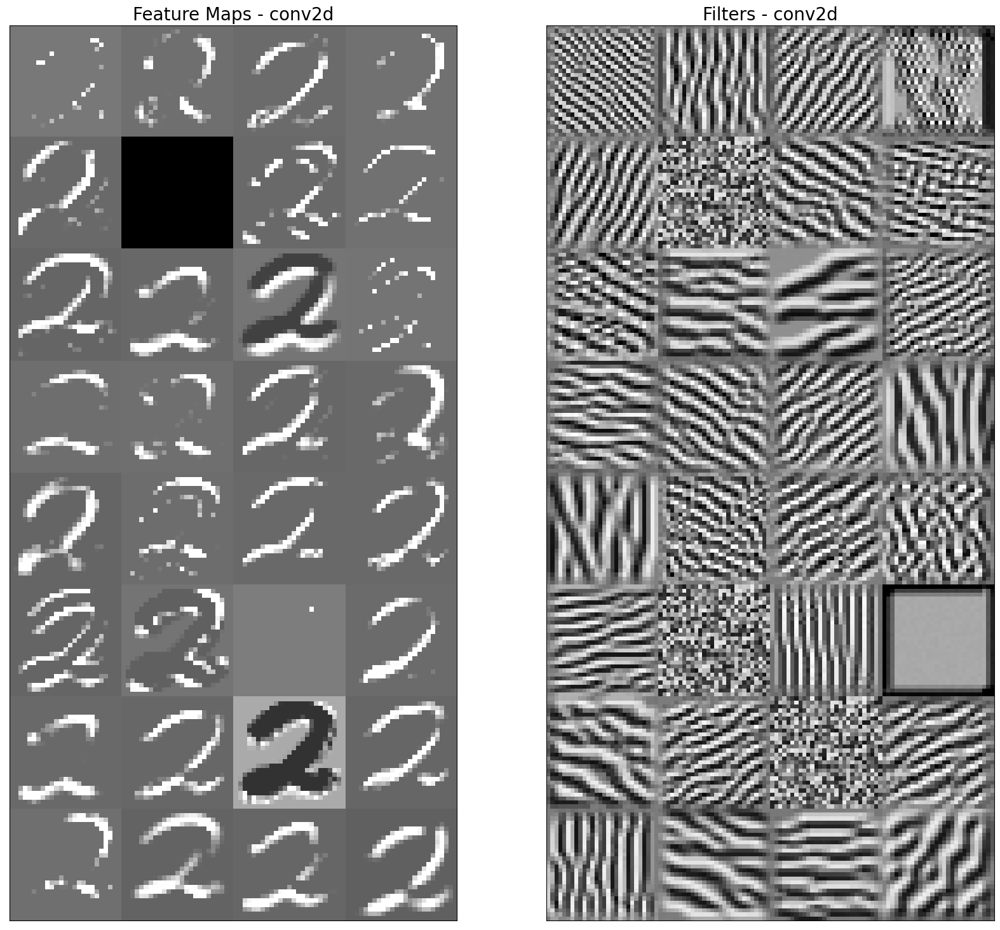

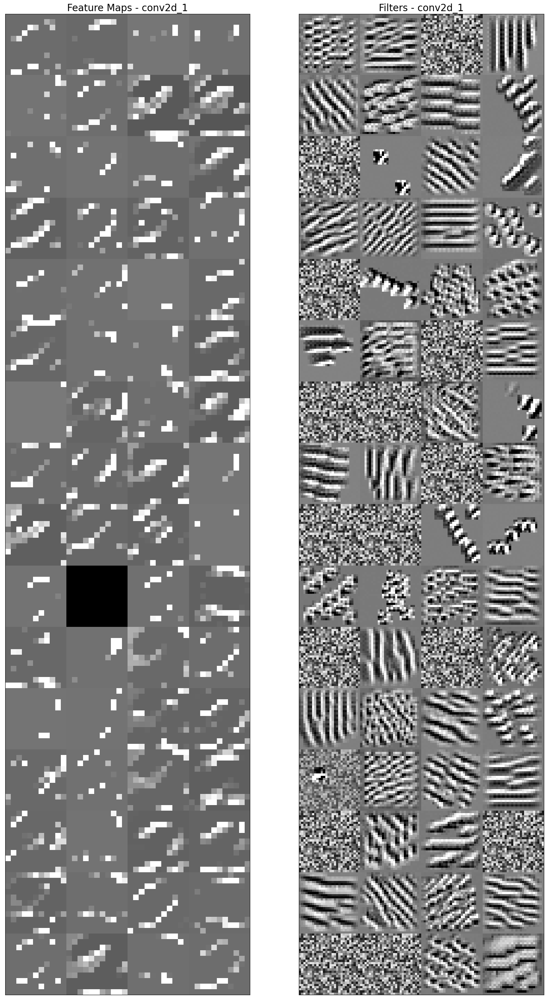

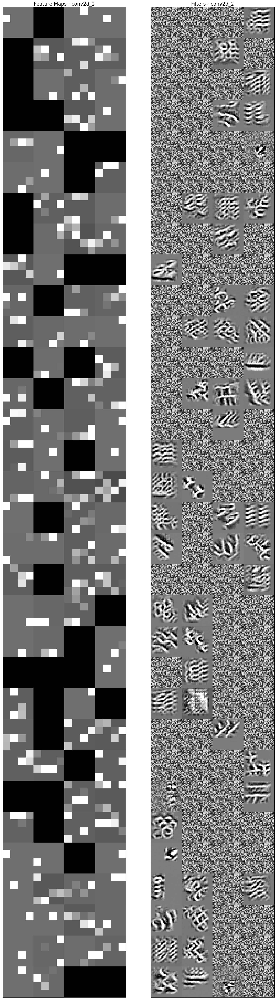

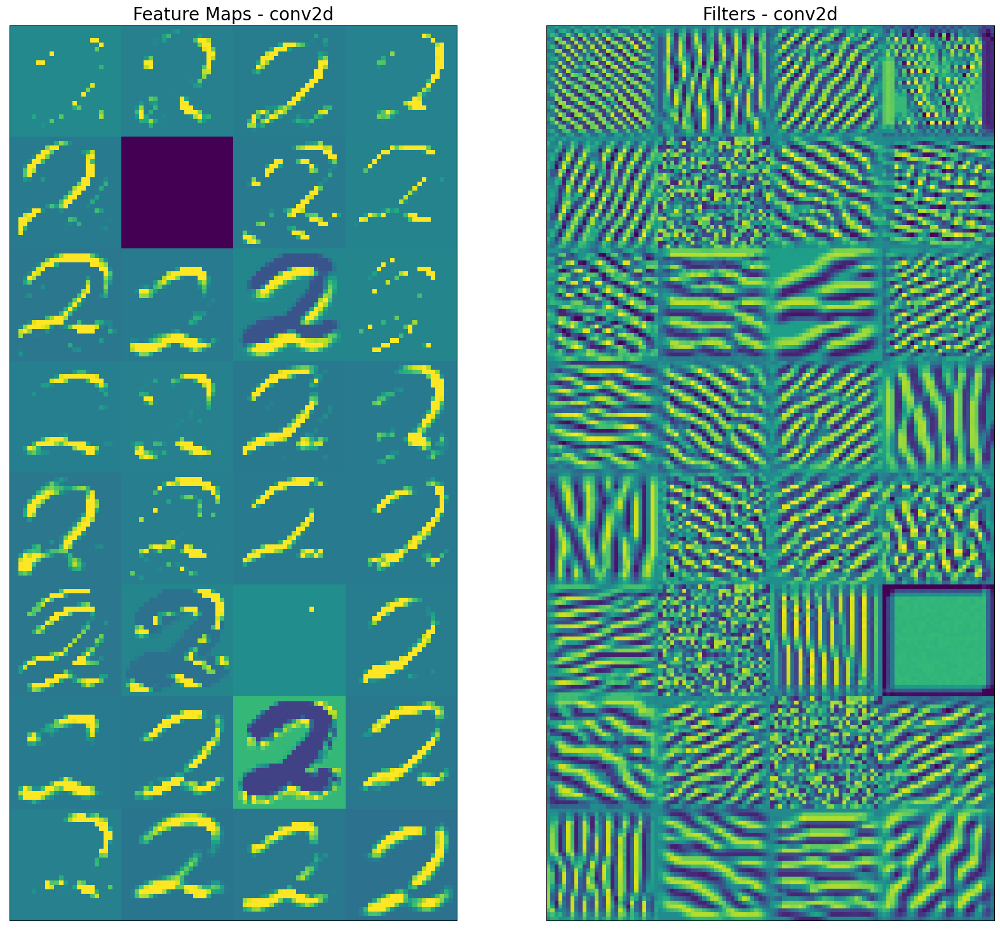

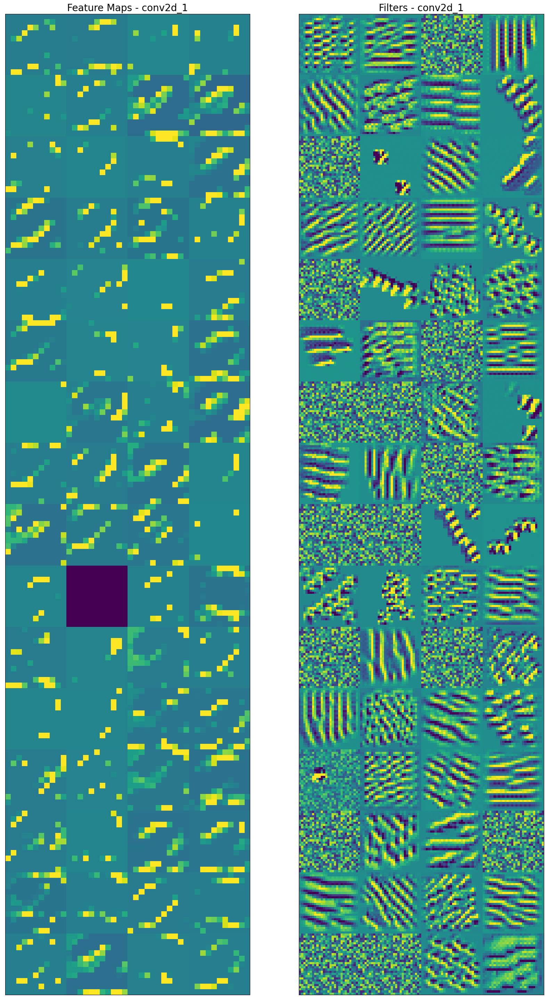

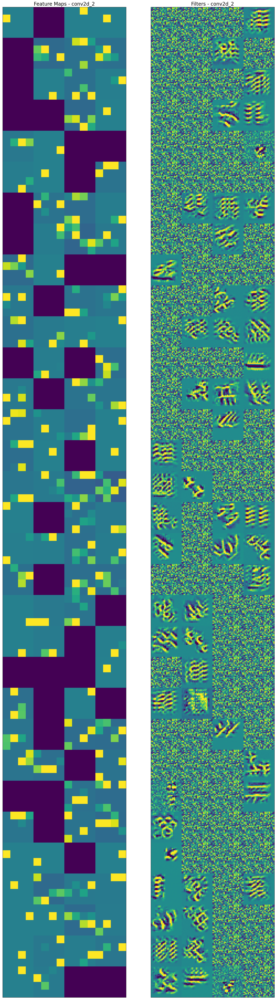

In [80]:
#2

plot_grid(conv_layers_names, activations_2_9[0], filters_G_Ascent, images_per_row=4)
plot_grid(conv_layers_names, activations_2_9[0], filters_G_Ascent, images_per_row=4, grey=False)

## Task 5.3 - Deep Dream

Steps: 


- Forward target image through our trained CNN.


- Select the layer of choice, (we will apply to all the 3 layers)


- Calculate the activations of each layer.


- Calculate the gradient of the image with respect to the activations of the each layer.


- Update the image to increase these activations by applying gradient ascent., hence we enhance the patterns seen by the network resulting in a dream-like hallucinated image.


- Repear this process until the image shows all what each layers wanted to learn.

In [74]:
def deep_dream(model_being_visualized, image, conv_layers_names, iterations, lr):
    sub_models = [get_sub_model(model_being_visualized, layer_name) for layer_name in conv_layers_names]
    
    deep_dream_image = [np.empty((1,28,28)) for i in range(len(sub_models))]
   
    image = deepcopy(image) # targeted image for deep dream version
    
    for i, sub in enumerate(sub_models):
        n_filters= sub.output.shape[-1]
        
        # using the gradient ascent function we created earlier
        v = visualize_using_G_Ascent(sub, image, iterations=iterations, learning_rate=lr, filter_=False) 
        deep_dream_image[i] = v
            
    return deep_dream_image

In [75]:
# we used 500 iterations with 0.2 step/learning-rate per each.

d_dream_9 = deep_dream(model_being_visualized, image_9, conv_layers_names, iterations=500, lr=.2)
d_dream_2 = deep_dream(model_being_visualized, image_2, conv_layers_names, iterations=500, lr=.2)



Color:gray

Layer:conv2d


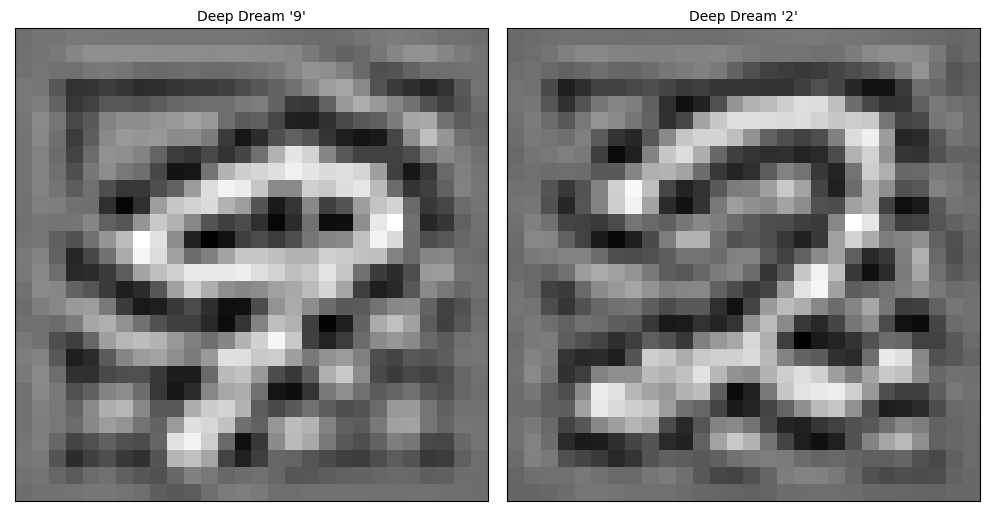

Layer:conv2d_1


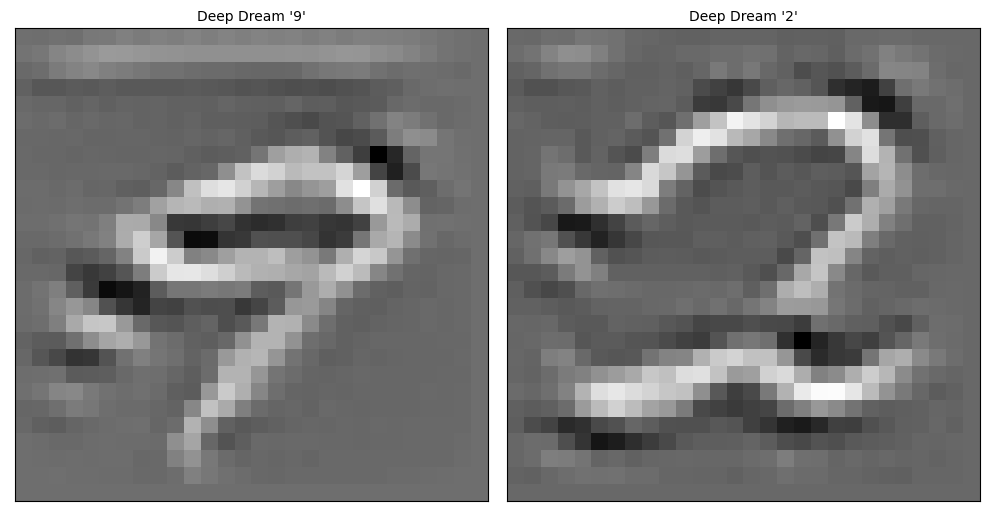

Layer:conv2d_2


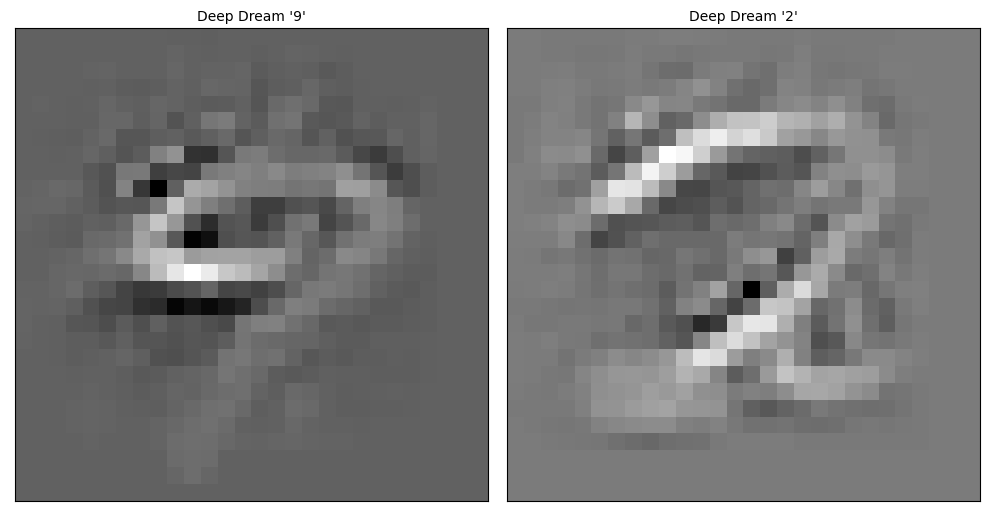

Color:magma

Layer:conv2d


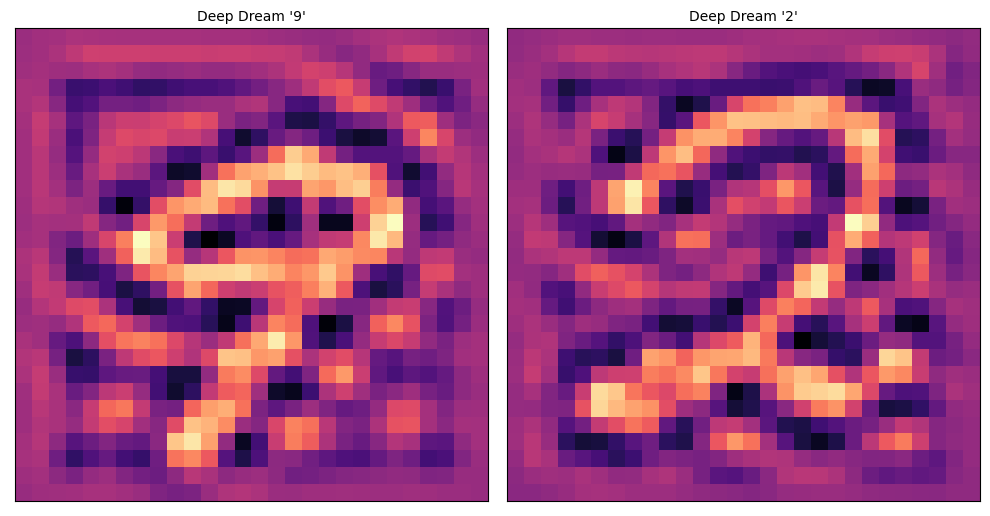

Layer:conv2d_1


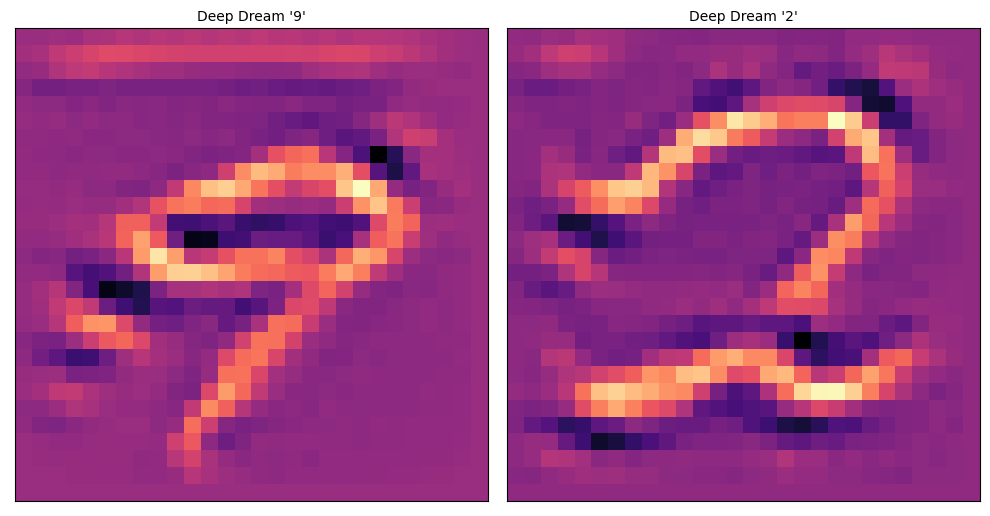

Layer:conv2d_2


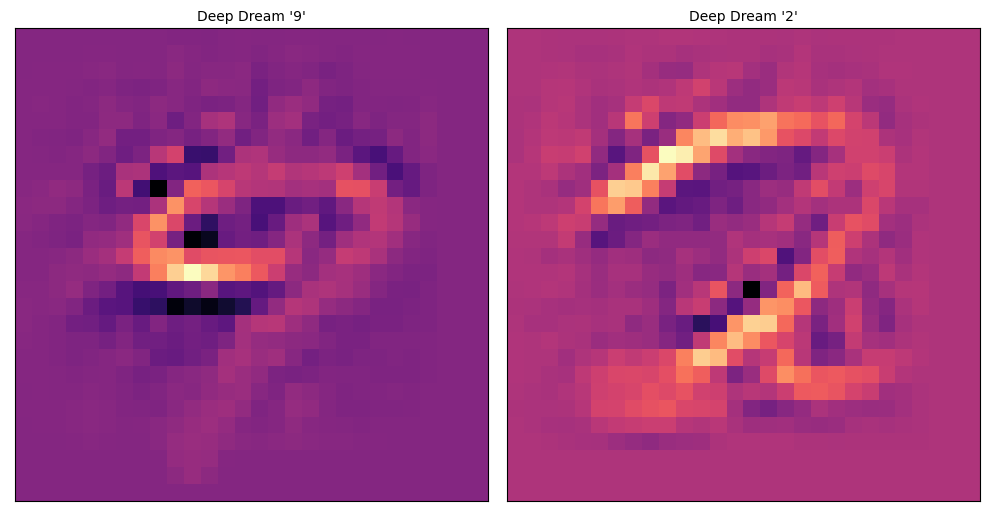

Color:cividis

Layer:conv2d


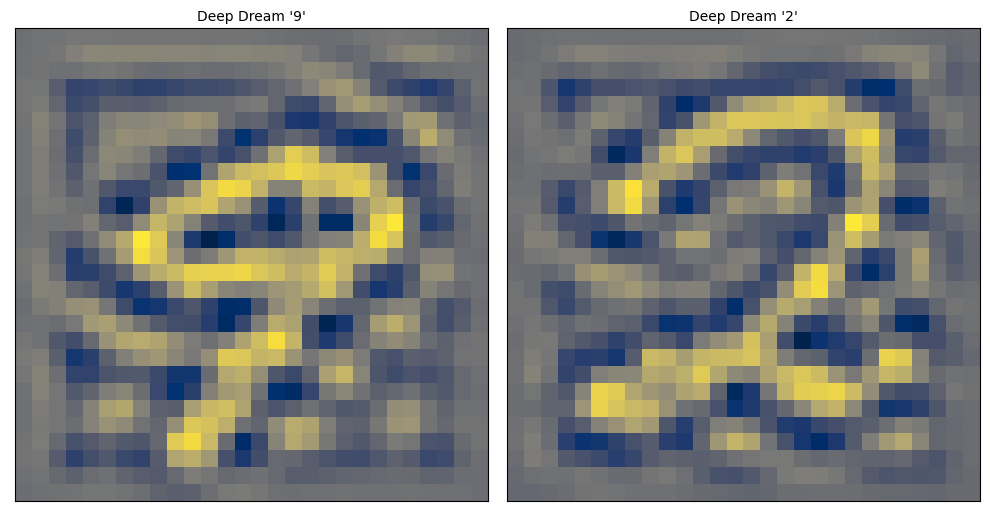

Layer:conv2d_1


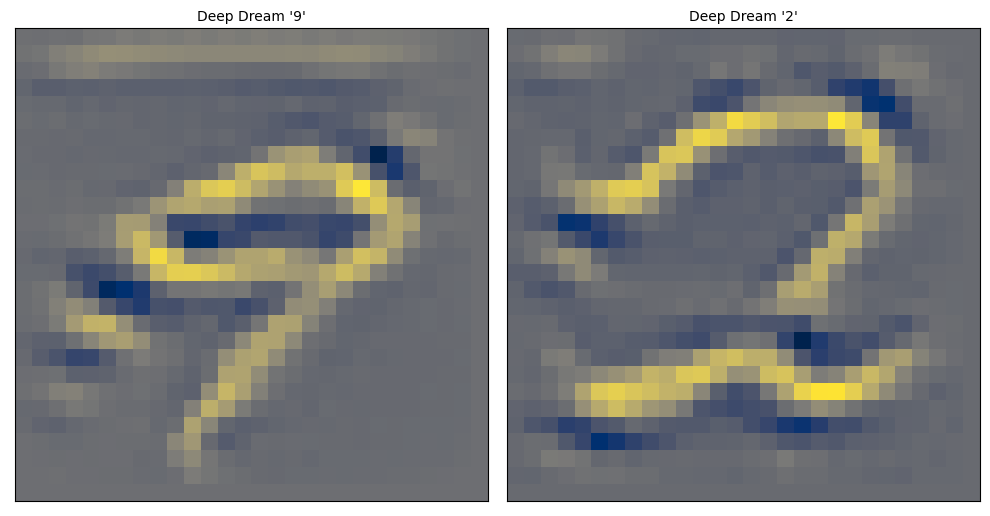

Layer:conv2d_2


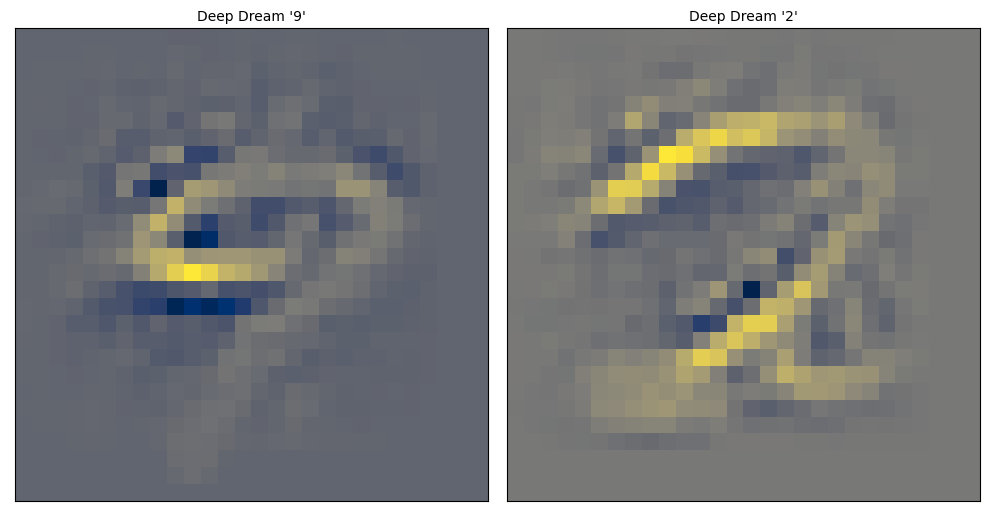

Color:inferno

Layer:conv2d


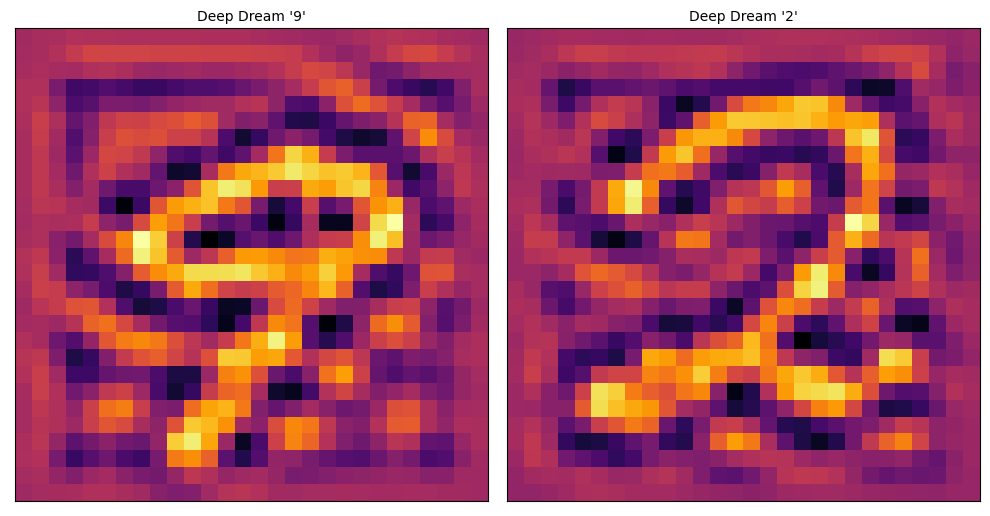

Layer:conv2d_1


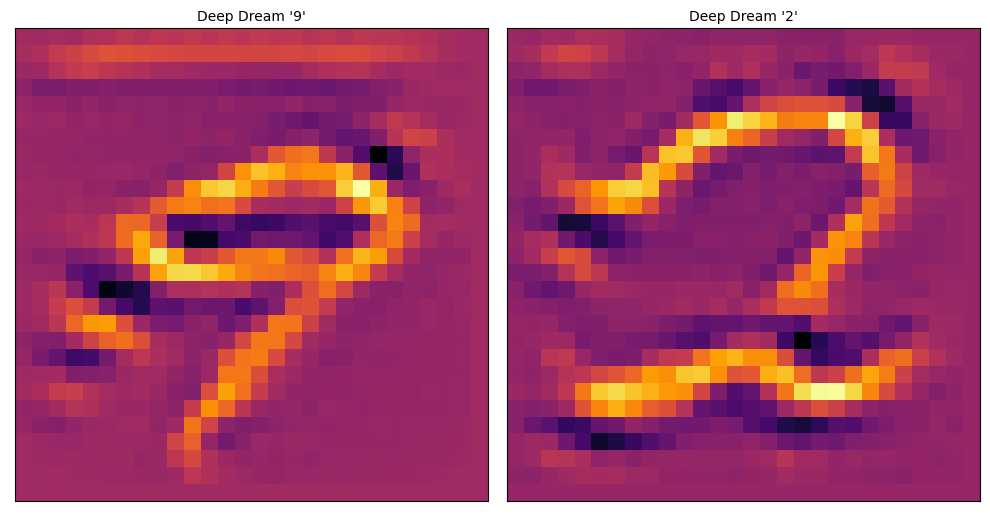

Layer:conv2d_2


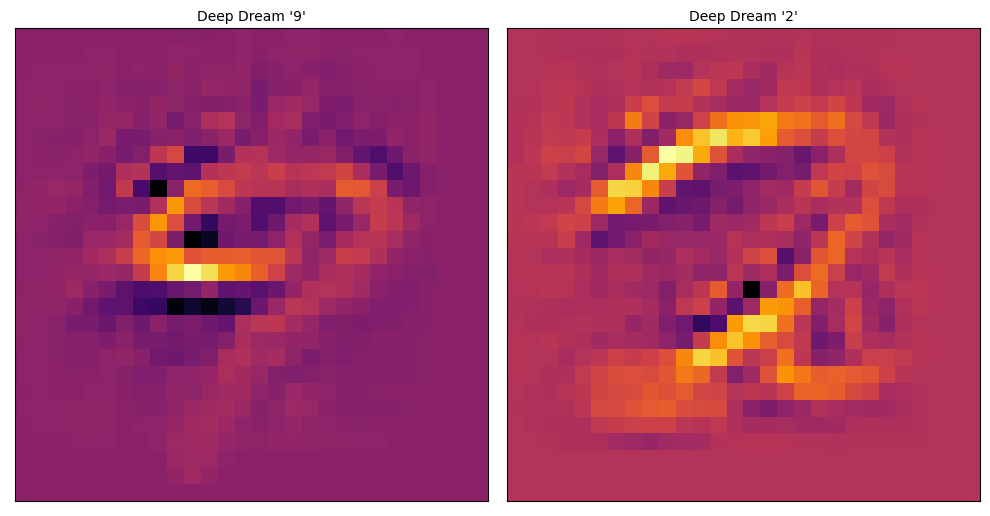

Color:viridis

Layer:conv2d


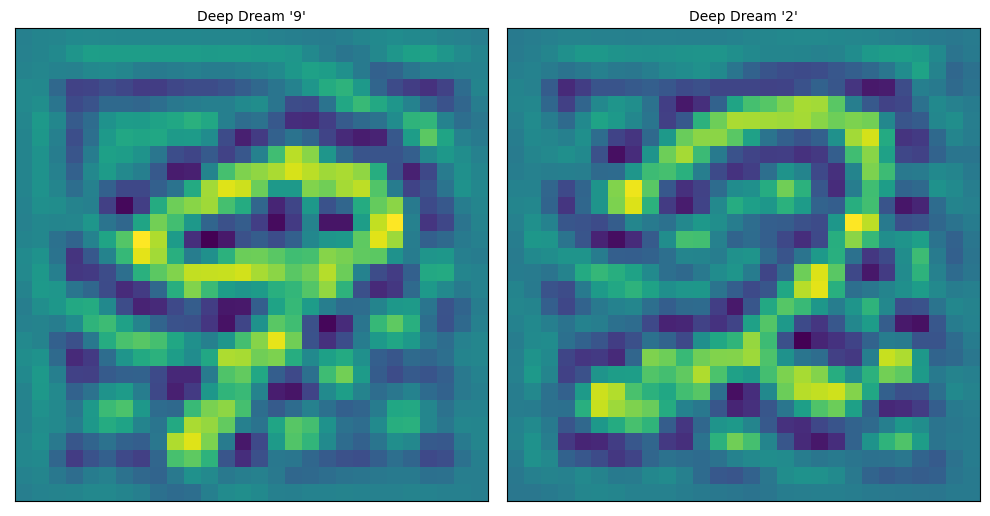

Layer:conv2d_1


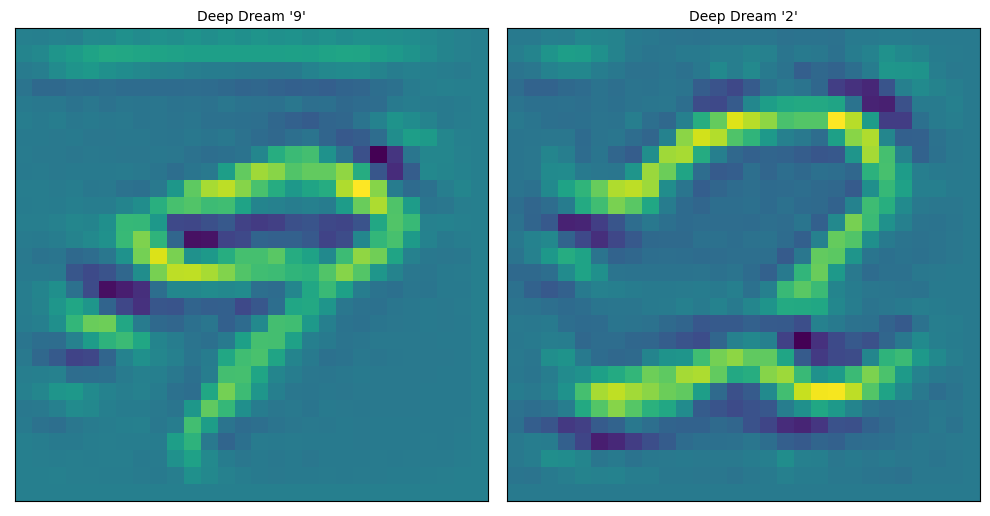

Layer:conv2d_2


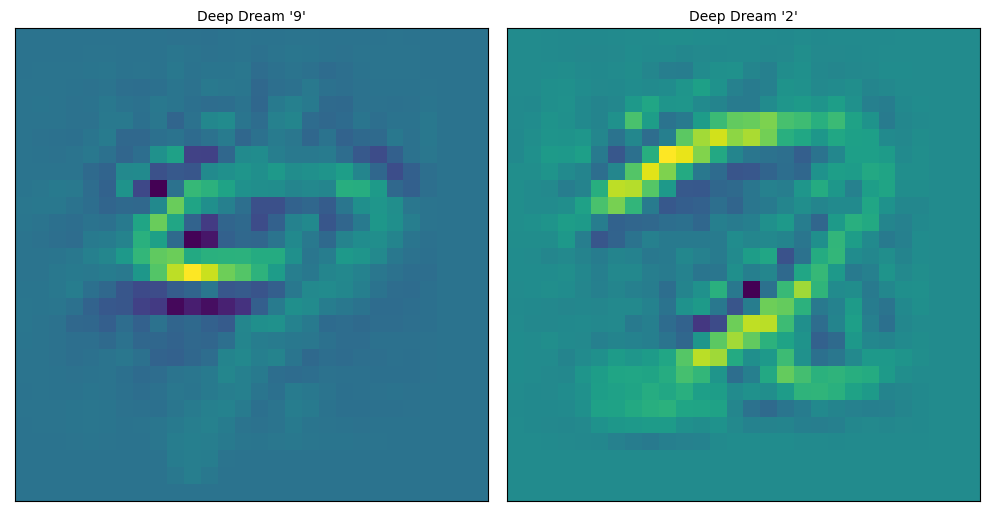

In [76]:
# plot the deep dream images in different color scales

def plot_d_dream(img_9, img_2):
    for color in ["gray", "magma", "cividis","inferno", "viridis"]:
        print(BCyan+f'Color:{color}\n'+end_color)
        for k, img in enumerate(zip(img_9, img_2)):
            n=0
            plt.figure(figsize=(10,10))

            print(bblack+"Layer:"+conv_layers_names[k]+end_color)
            for i, j in enumerate(img):


                titles = ["Deep Dream '9'", "Deep Dream '2'"]
                ax= plt.subplot(1, 2, i+1)
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_title(titles[i], fontsize=10)
                plt.imshow(j, cmap=color)

             #   plt.savefig(f'{layer_name}_{i}.jpg')

            plt.tight_layout()
            plt.show()

plot_d_dream(d_dream_9, d_dream_2)       

In [77]:
# Lets try different iterations and learning rate.

d_dream_9_extra = deep_dream(model_being_visualized, image_9, conv_layers_names, iterations=50, lr=20)
d_dream_2_extra = deep_dream(model_being_visualized, image_2, conv_layers_names, iterations=50, lr=20)

Color:gray

Layer:conv2d


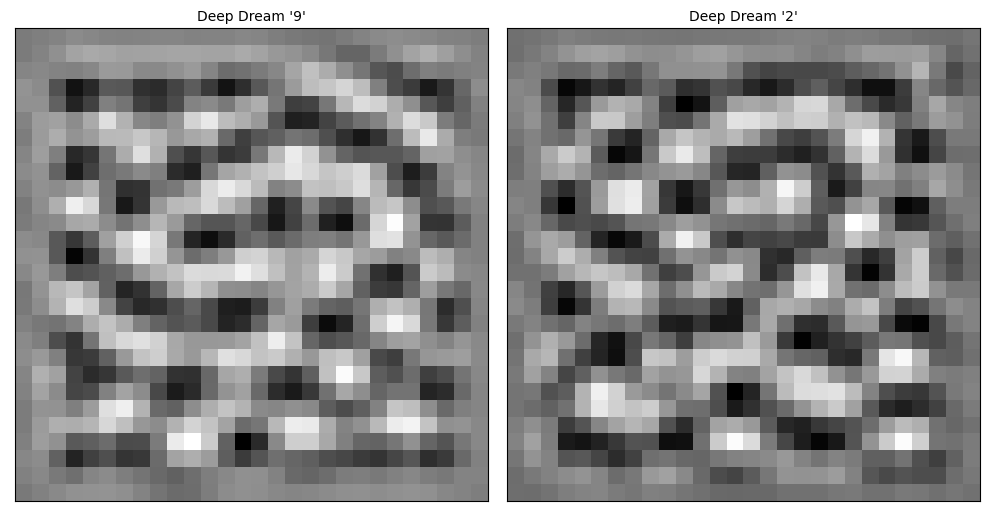

Layer:conv2d_1


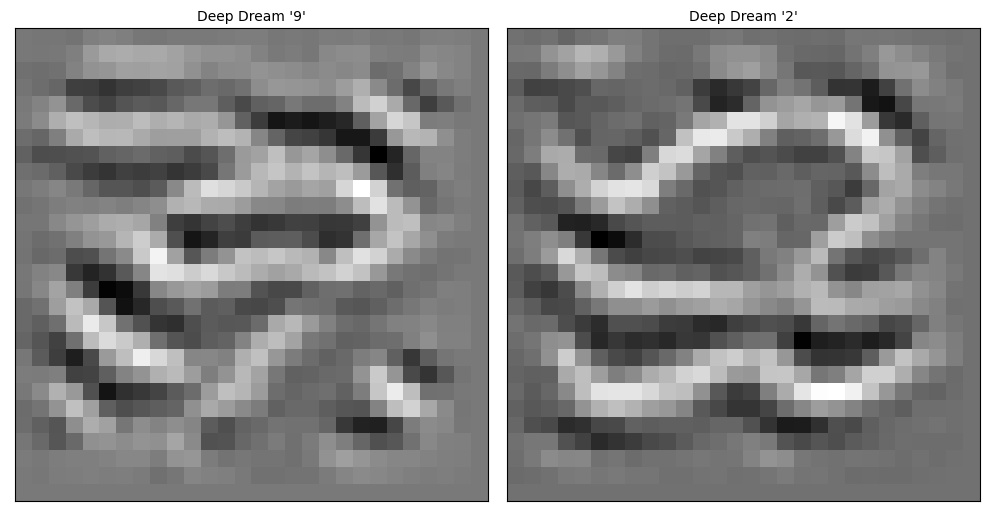

Layer:conv2d_2


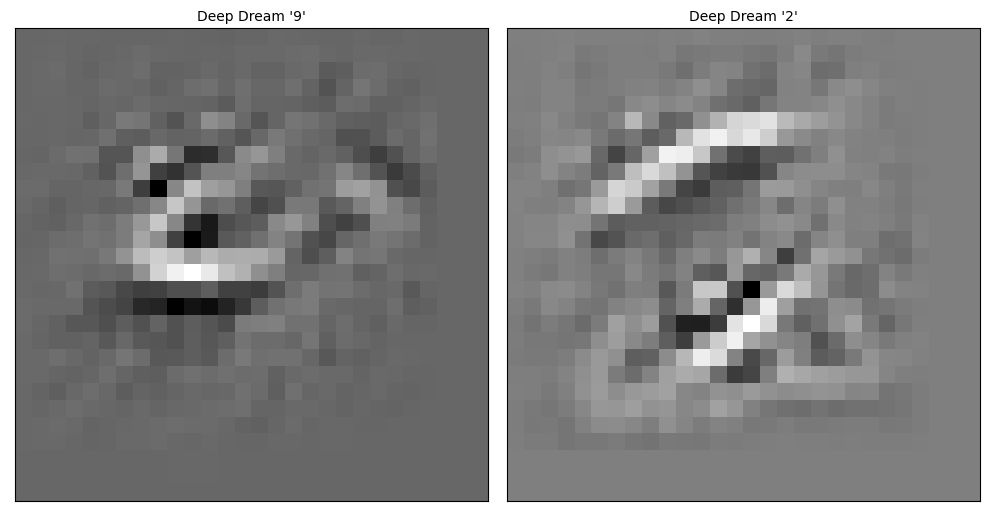

Color:magma

Layer:conv2d


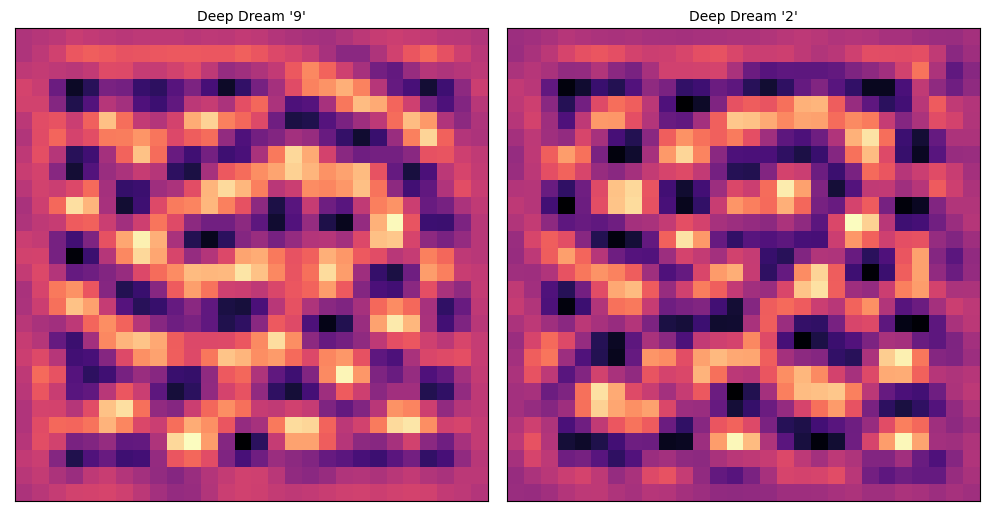

Layer:conv2d_1


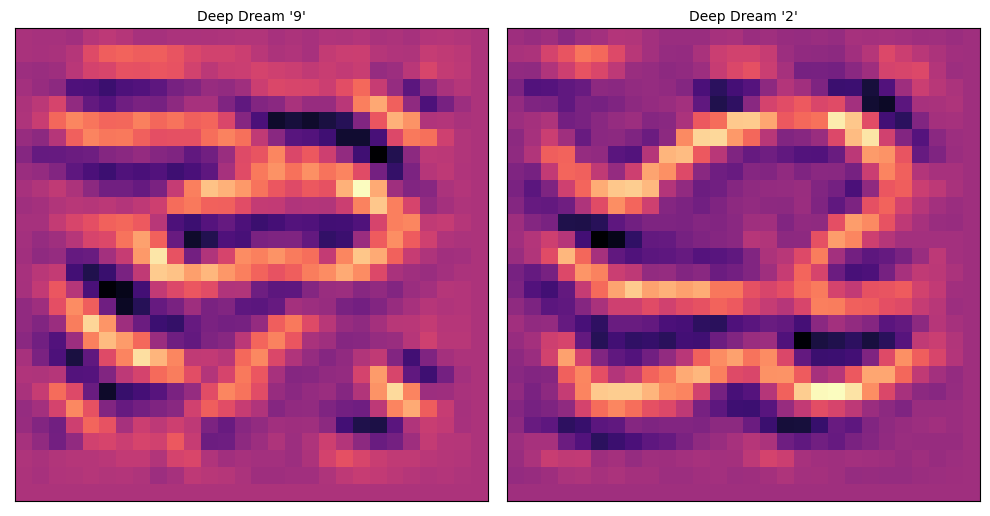

Layer:conv2d_2


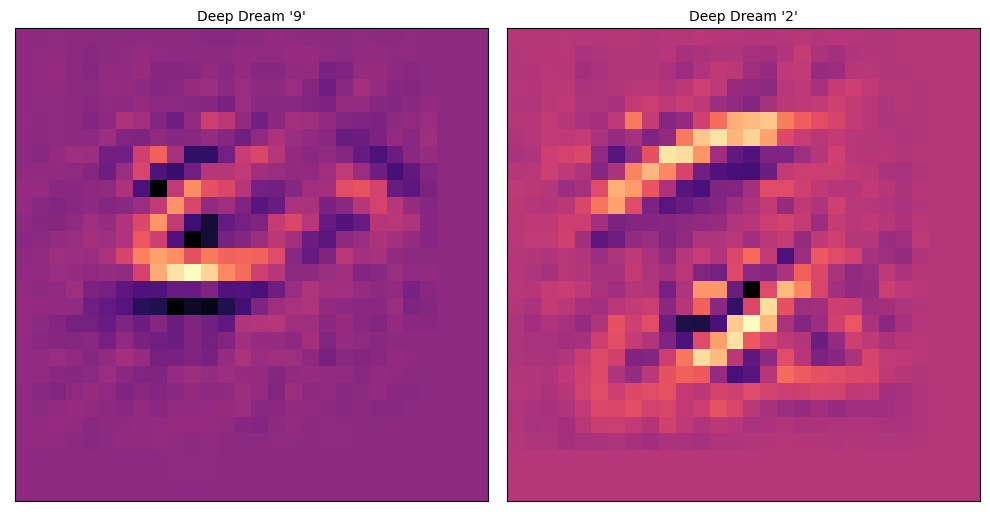

Color:cividis

Layer:conv2d


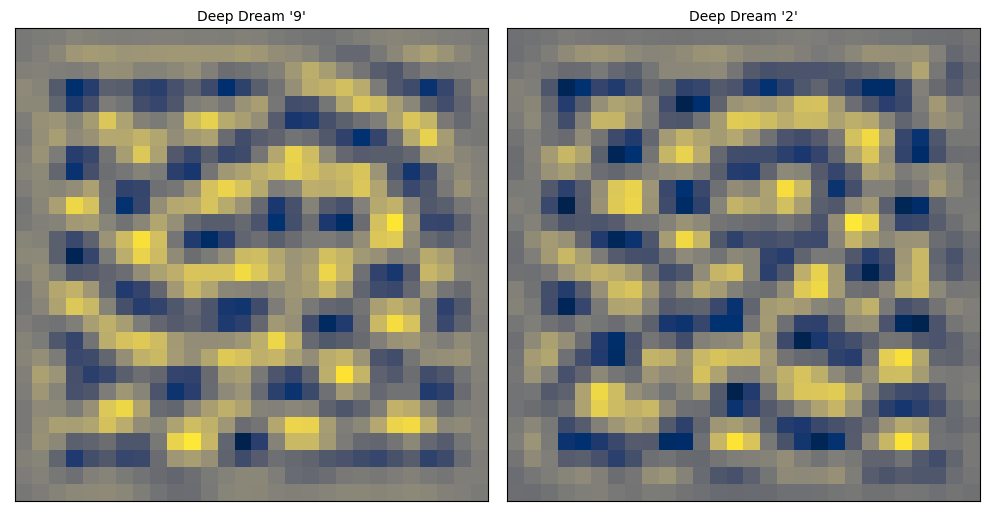

Layer:conv2d_1


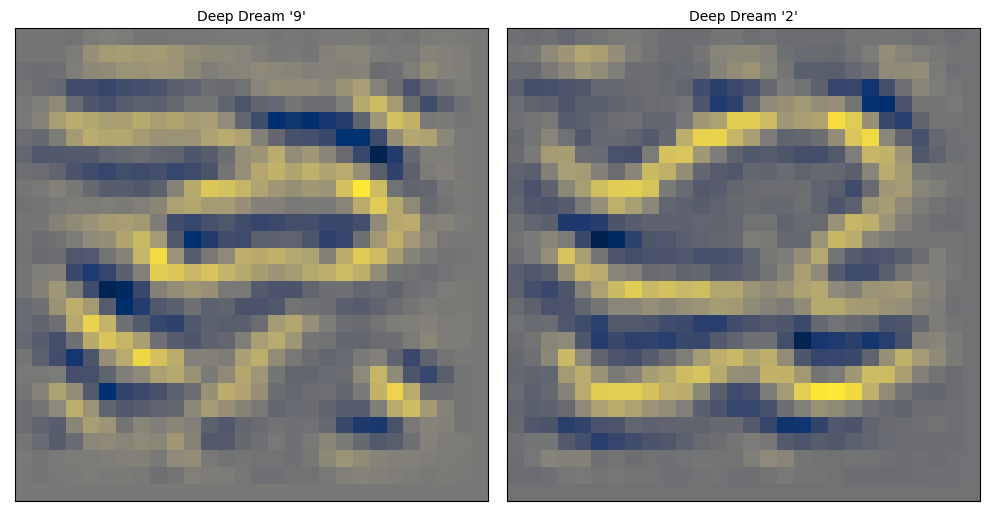

Layer:conv2d_2


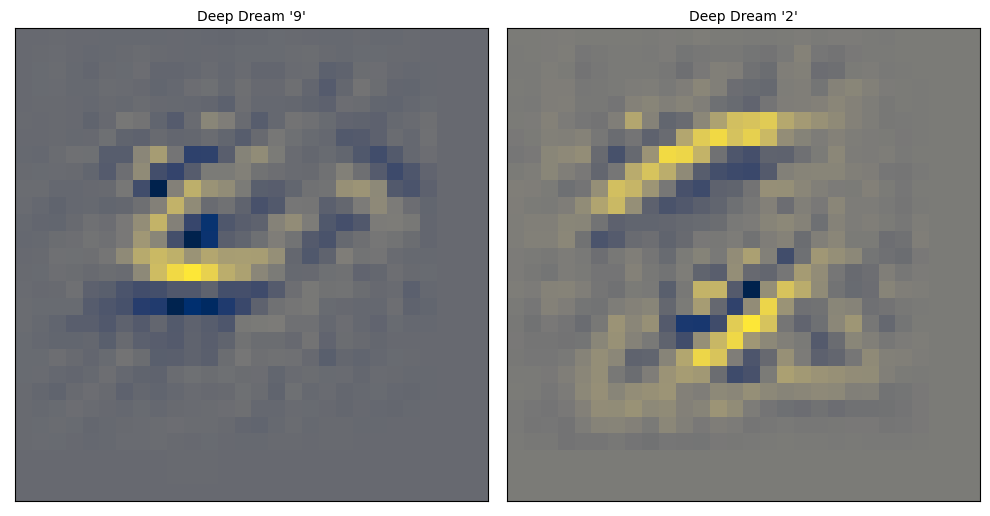

Color:inferno

Layer:conv2d


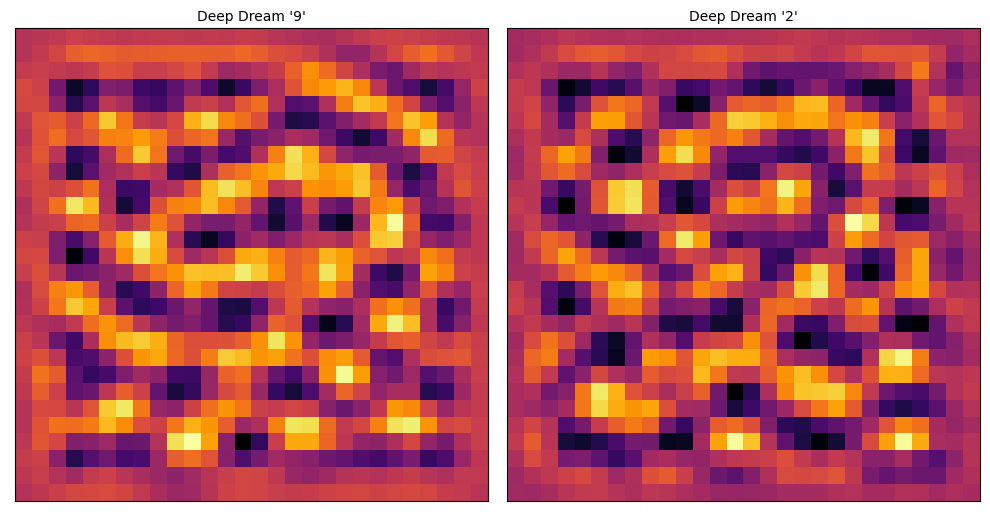

Layer:conv2d_1


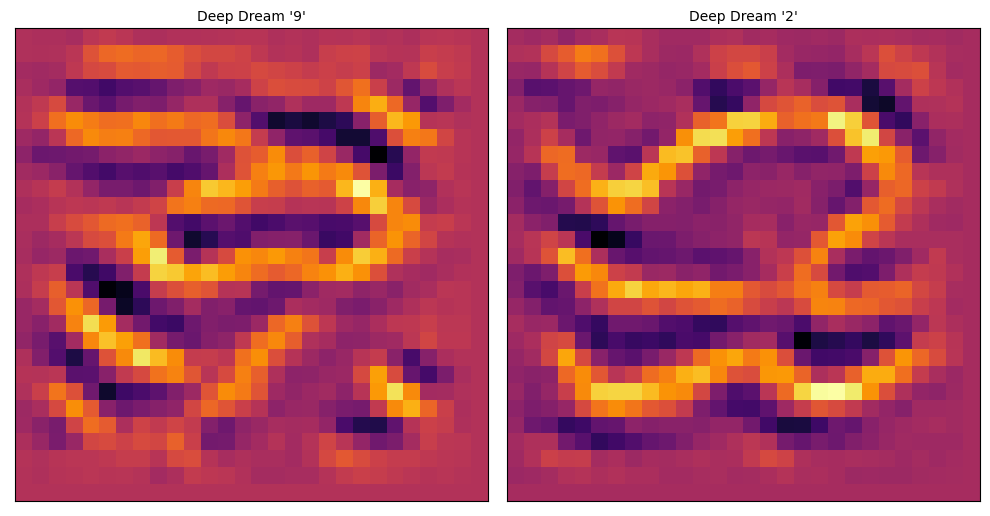

Layer:conv2d_2


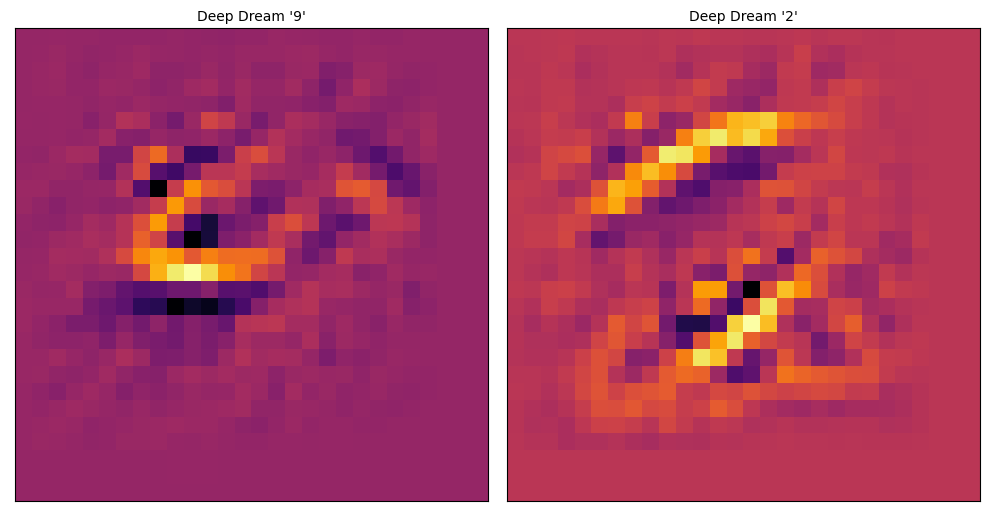

Color:viridis

Layer:conv2d


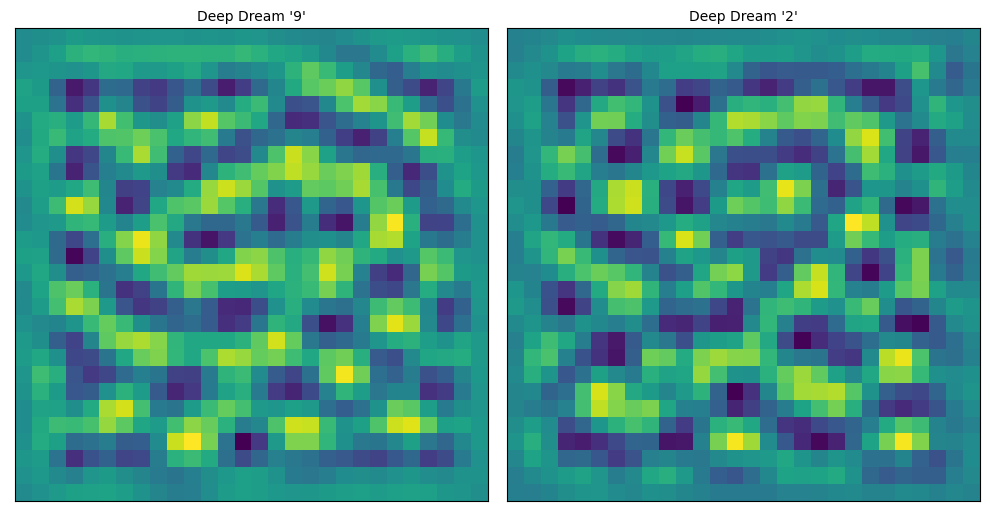

Layer:conv2d_1


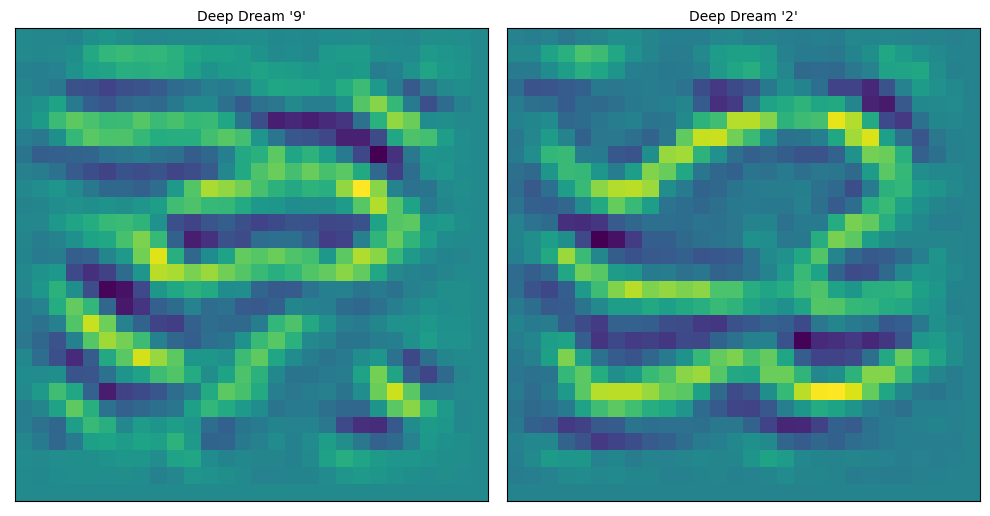

Layer:conv2d_2


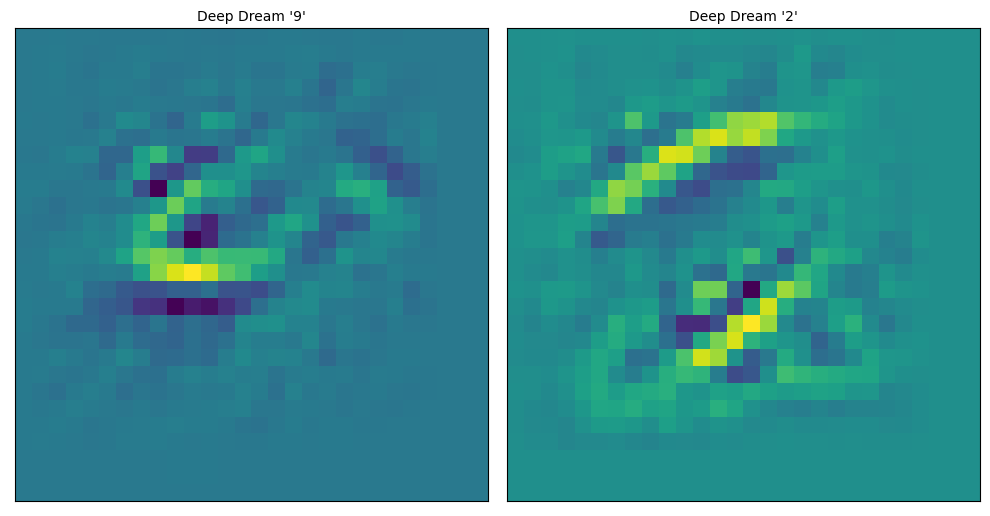

In [78]:
plot_d_dream(d_dream_9_extra, d_dream_2_extra)    